In [23]:
import pickle
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
from os import listdir
from copy import deepcopy
import numpy.linalg as npl
from datetime import datetime
import matplotlib.pyplot as plt
from os.path import isfile, join 
from scipy.stats import random_correlation

plt.rcParams["figure.figsize"] = (20,10)

import warnings
warnings.filterwarnings("ignore")

In [24]:
plt.rcParams["figure.figsize"] = (20,10)
import sys 
sys.path.append(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code')
from pca_ad_utils import *
from decomp_utils import *
from customizedLossSynthetic import *
from LocationAnomalyPCA import *


sys.path.append(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code\DataGenerator')
from ParamsEstimationUtils import *
sys.path.append(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code\DataGenerator')
from syntheticDataGeneratorUtils import *

In [25]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.cluster import DBSCAN
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import KNeighborsClassifier #Supervised
from sklearn.neural_network import MLPClassifier
from sklearn import svm # Supervised 
from sklearn.tree import DecisionTreeClassifier

In [26]:
nStocks = 20

nSimultation = 100

Sparams = [100,1]
DriftParams = [0.01,0.1]
SigmaParams = [0.01,0.1]
T = 1
Ntrain = int(2.**10)
Ntest  = int(2.**9)


alpha = 1
windowSize = 206
upBound = 0.04
AnoNumberTrain = 4
AnoNumberTest = 2
ContaminationParams = [alpha,windowSize,upBound,AnoNumberTrain,AnoNumberTest]

lag = 1
SliddingParams = [windowSize,lag]

ContaminationRate = 0.2
UnderSampParams = [ContaminationRate]

k = 20
ResTableIdentification = pd.DataFrame(columns=['AccTrain','PrecTrain','RecTrain','F1Train',
                                 'AccTest','PrecTest','RecTest','F1Test'],dtype=float,index=np.arange(nSimultation))

ResTableFormat = pd.DataFrame(columns=['AccTrain','PrecTrain','RecTrain','F1Train',
                                 'AccTest','PrecTest','RecTest','F1Test'],dtype=float,index=np.arange(nSimultation))


ResTableLocation = {'All Anomaly' : deepcopy(ResTableFormat), 'Anomaly NE': deepcopy(ResTableFormat)}
ResTableLocationDummy ={'All Anomaly' : deepcopy(ResTableFormat), 'Anomaly NE': deepcopy(ResTableFormat)}

Cov = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code\DataGenerator\Params\Cov.csv').drop(['Unnamed: 0'],axis=1).values
S0 = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code\DataGenerator\Params\S0.csv').drop(['Unnamed: 0'],axis=1).values.reshape(-1,)
mu = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code\DataGenerator\Params\mu.csv').drop(['Unnamed: 0'],axis=1).values.reshape(-1,)
sigma = pd.read_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Code\DataGenerator\Params\Sigma.csv').drop(['Unnamed: 0'],axis=1).values.reshape(-1,)


In [27]:
CalibParamsLoaded = load(r'C:\Users\nmadhar\Desktop\Conv_deep\ACP_Autoencoder\Models\CalibParams\CalibParams2405_2.pkl',allow_pickle=True)
netLoaded = NeuralNetwork()
netLoaded.load_state_dict(torch.load(r'C:\Users\nmadhar\Desktop\Conv_deep\ACP_Autoencoder\Models\modelCustomLoss2405_2.h5'))

<All keys matched successfully>

In [28]:
dfClassic = pd.DataFrame(columns=['AlgName','Acc','Recall','Precision','F1','Set'],index=np.arange(nSimultation*10))
counter = 0
counterLoc = 0

In [29]:
dfClassicLoc = pd.DataFrame(columns=['AlgName','Acc','Recall','Precision','F1','Set'],index=np.arange(nSimultation*6))

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

----------------- iSimul = 0-----------------------

Normal observations in train set 6054
Outlier observations in train set 6054 

Normal observations in test set 2352
Outlier observations in test set 470
-------------------Scores on Train set-------------------
Accuracy :  0.8212
Precision :  0.7984
Recall :  0.8594
F1-score: 0.8278


-------------------Scores on Test set-------------------
Accuracy :  0.7636
Precision :  0.3928
Recall :  0.7681
F1-score: 0.5198




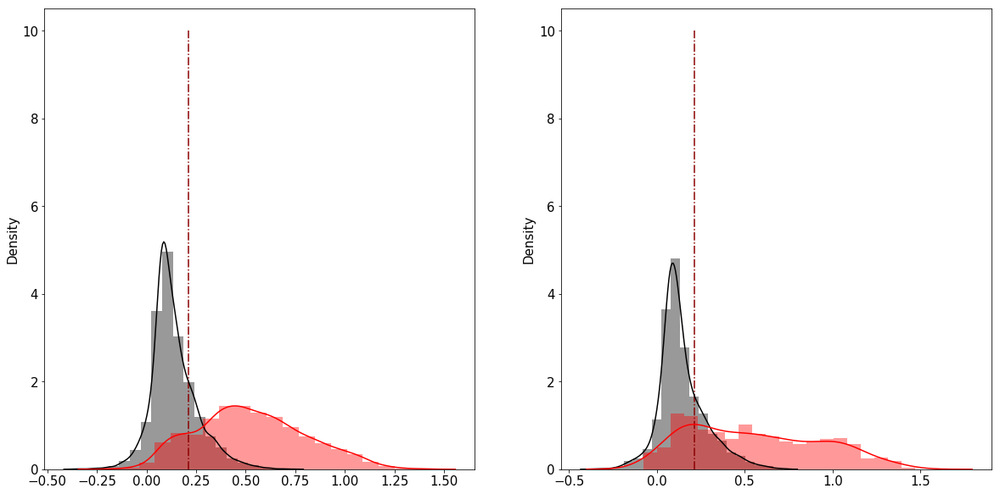

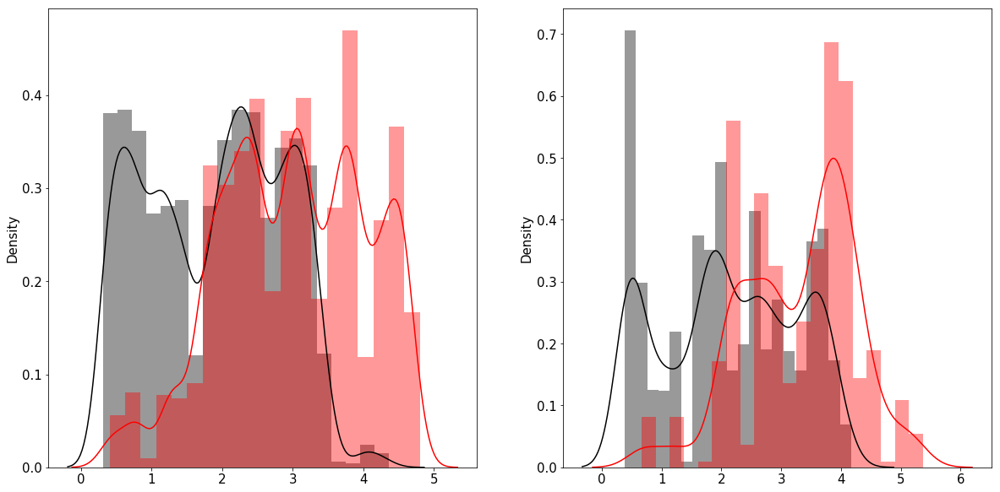

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.35695893752540997
Recall: 0.35695893752540997
Precision: 0.46728605395848954
F1-score: 0.38701211316677714

------------Scores on Test-------------
Accuracy: 0.5828933474128828
Recall: 0.5828933474128828
Precision: 0.6258418878882515
F1-score: 0.59328998821941

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 3788/3788 [00:00<00:00, 9102.96it/s]

------------Scores on Train-------------
Accuracy: 0.9265483127795094
Recall: 0.9265483127795094
Precision: 0.9294394878834608
F1-score: 0.9267458923107187

------------Scores on Test-------------
Accuracy: 0.7977824709609292
Recall: 0.7977824709609292
Precision: 0.8035243256438285
F1-score: 0.7987740404459838

------------Scores on Train-------------
Accuracy: 0.0035766884073216917
Recall: 0.0035766884073216917
Precision: 0.00025824465034813654
F1-score: 0.0004817088764069619

------------Scores on Test-------------
Accuracy: 0.00880503144654088
Recall: 0.00880503144654088
Precision: 0.0012752114508783345
F1-score: 0.0022277790406910664




100%|███████████████████████████████████████████████████████████████████████████| 1590/1590 [00:00<00:00, 12271.40it/s]

------------Scores on Train-------------
Accuracy: 0.8859667578371555
Recall: 0.8859667578371555
Precision: 0.8900990376377926
F1-score: 0.8851406166570929

------------Scores on Test-------------
Accuracy: 0.5056603773584906
Recall: 0.5056603773584906
Precision: 0.5124410824362028
F1-score: 0.5008126058806462



  1%|▊                                                                              | 1/100 [03:33<5:52:19, 213.53s/it]

----------------- iSimul = 1-----------------------

Normal observations in train set 5617
Outlier observations in train set 5617 

Normal observations in test set 2343
Outlier observations in test set 468
-------------------Scores on Train set-------------------
Accuracy :  0.8034
Precision :  0.8040
Recall :  0.8024
F1-score: 0.8032


-------------------Scores on Test set-------------------
Accuracy :  0.7954
Precision :  0.4395
Recall :  0.8312
F1-score: 0.5750




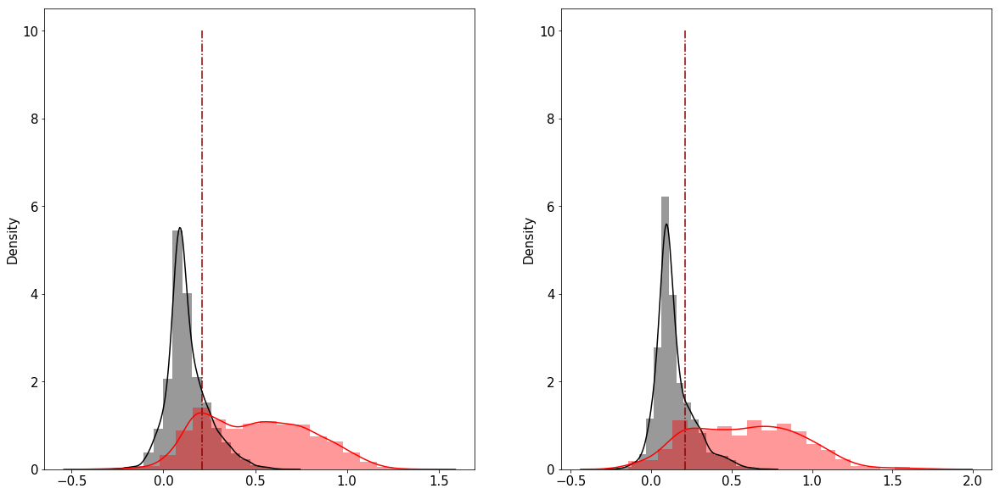

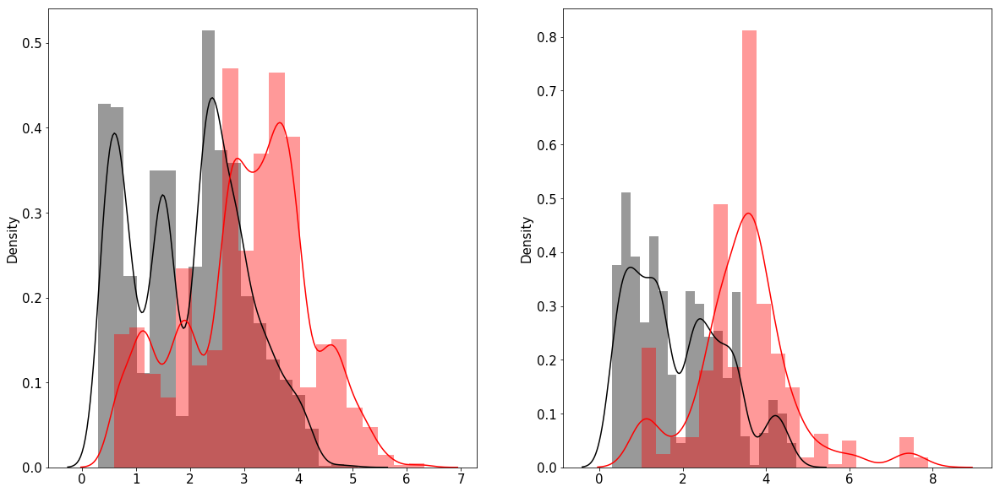

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2540185094982952
Recall: 0.2540185094982952
Precision: 0.35576704773973583
F1-score: 0.2813777348978082

------------Scores on Test-------------
Accuracy: 0.48538319726099555
Recall: 0.48538319726099555
Precision: 0.5491100443604194
F1-score: 0.5007675622212377

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 3797/3797 [00:00<00:00, 8302.60it/s]

------------Scores on Train-------------
Accuracy: 0.8981977593765221
Recall: 0.8981977593765221
Precision: 0.8997164464708937
F1-score: 0.8983817856503885

------------Scores on Test-------------
Accuracy: 0.8828022122728469
Recall: 0.8828022122728469
Precision: 0.8885914514134232
F1-score: 0.8836079125441262

------------Scores on Train-------------
Accuracy: 0.002444190972788007
Recall: 0.002444190972788007
Precision: 0.00013920557858262823
F1-score: 0.00026340905220522385

------------Scores on Test-------------
Accuracy: 0.007135575942915392
Recall: 0.007135575942915392
Precision: 0.000730151956949482
F1-score: 0.0013247482763218451




100%|███████████████████████████████████████████████████████████████████████████| 1962/1962 [00:00<00:00, 11315.72it/s]

------------Scores on Train-------------
Accuracy: 0.8582369235782956
Recall: 0.8582369235782956
Precision: 0.8611493338444549
F1-score: 0.8588443130315293

------------Scores on Test-------------
Accuracy: 0.7838939857288482
Recall: 0.7838939857288482
Precision: 0.800917419028164
F1-score: 0.7852286556382675



  2%|█▌                                                                             | 2/100 [07:03<5:47:11, 212.56s/it]

----------------- iSimul = 2-----------------------

Normal observations in train set 6580
Outlier observations in train set 6580 

Normal observations in test set 1964
Outlier observations in test set 392
-------------------Scores on Train set-------------------
Accuracy :  0.8052
Precision :  0.8106
Recall :  0.7967
F1-score: 0.8036


-------------------Scores on Test set-------------------
Accuracy :  0.8081
Precision :  0.4603
Recall :  0.8878
F1-score: 0.6063




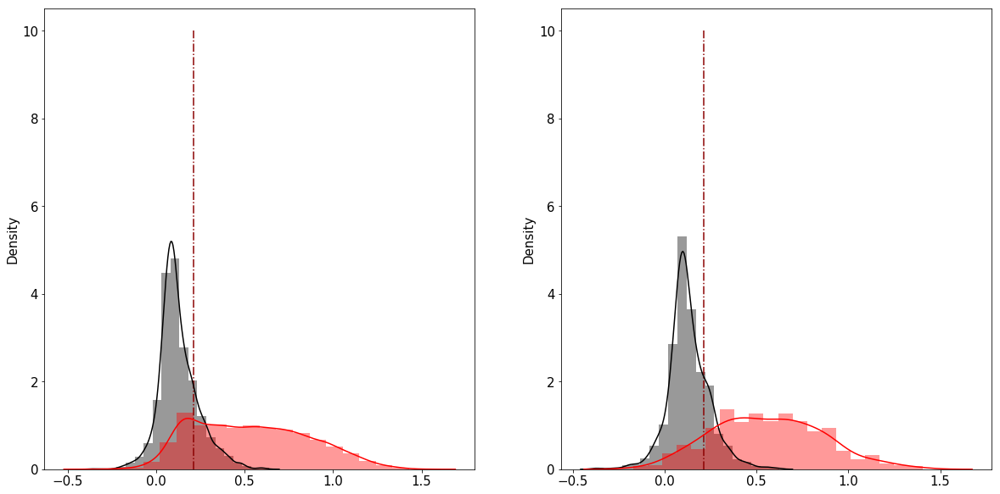

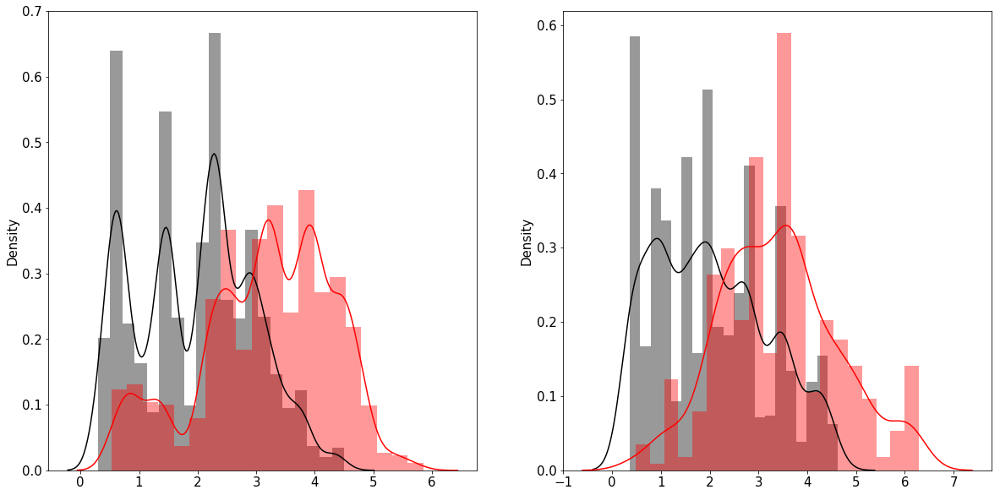

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3462932866608326
Recall: 0.3462932866608326
Precision: 0.4959992178532707
F1-score: 0.3824219102430264

------------Scores on Test-------------
Accuracy: 0.36063218390804597
Recall: 0.36063218390804597
Precision: 0.44969175902488917
F1-score: 0.38874296950140785

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4176/4176 [00:00<00:00, 9894.28it/s]

------------Scores on Train-------------
Accuracy: 0.9016127015876985
Recall: 0.9016127015876985
Precision: 0.905494837629477
F1-score: 0.9025383308158395

------------Scores on Test-------------
Accuracy: 0.8769157088122606
Recall: 0.8769157088122606
Precision: 0.8816634802321706
F1-score: 0.8780332114161485

------------Scores on Train-------------
Accuracy: 0.0032448940637526246
Recall: 0.0032448940637526246
Precision: 0.00019331283784058186
F1-score: 0.0003648876858838292

------------Scores on Test-------------
Accuracy: 0.0029906542056074765
Recall: 0.0029906542056074765
Precision: 0.00028275276125743414
F1-score: 0.0005166578694072717




100%|████████████████████████████████████████████████████████████████████████████| 2675/2675 [00:00<00:00, 9249.77it/s]

------------Scores on Train-------------
Accuracy: 0.8501622447031877
Recall: 0.8501622447031877
Precision: 0.8576024606322235
F1-score: 0.8521002115565017

------------Scores on Test-------------
Accuracy: 0.8074766355140187
Recall: 0.8074766355140187
Precision: 0.8186401175538596
F1-score: 0.8102343714091086



  3%|██▎                                                                            | 3/100 [10:48<5:49:16, 216.05s/it]

----------------- iSimul = 3-----------------------

Normal observations in train set 5796
Outlier observations in train set 5796 

Normal observations in test set 1725
Outlier observations in test set 345
-------------------Scores on Train set-------------------
Accuracy :  0.7793
Precision :  0.7924
Recall :  0.7569
F1-score: 0.7743


-------------------Scores on Test set-------------------
Accuracy :  0.8126
Precision :  0.4623
Recall :  0.7652
F1-score: 0.5764




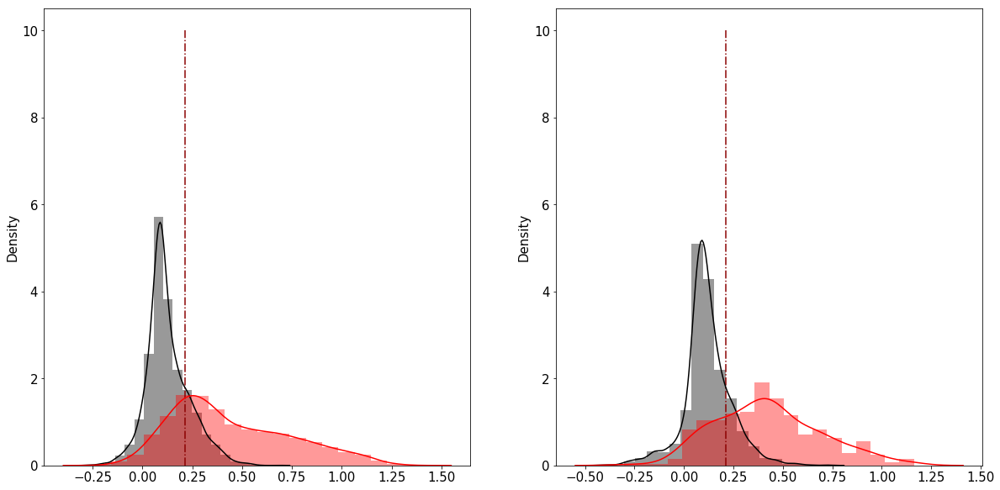

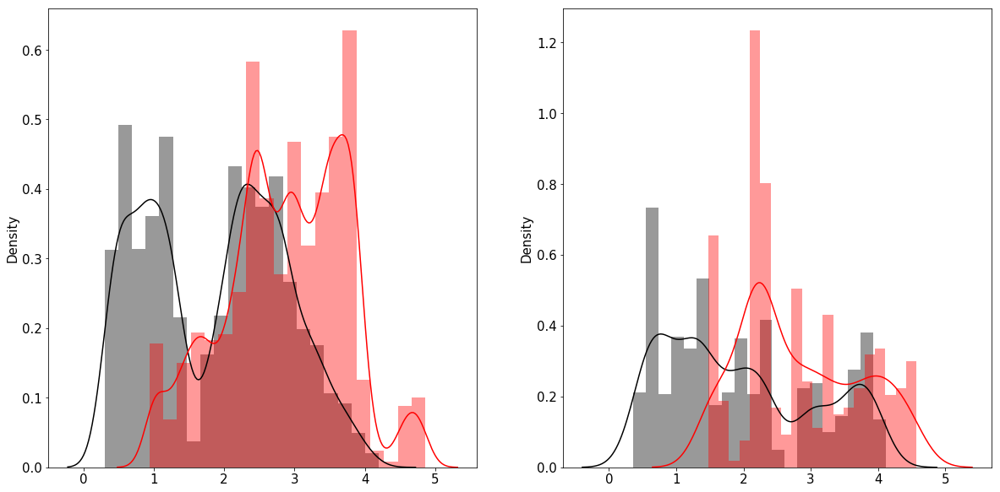

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.37251512532411407
Recall: 0.37251512532411407
Precision: 0.47849992831875254
F1-score: 0.4015067765874542

------------Scores on Test-------------
Accuracy: 0.3315968289920725
Recall: 0.3315968289920725
Precision: 0.4581209790460585
F1-score: 0.35736861524391034

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4415/4415 [00:00<00:00, 10579.61it/s]

------------Scores on Train-------------
Accuracy: 0.8438078775157427
Recall: 0.8438078775157427
Precision: 0.8493436911736818
F1-score: 0.8449388578232278

------------Scores on Test-------------
Accuracy: 0.8328425821064552
Recall: 0.8328425821064552
Precision: 0.8397883074623476
F1-score: 0.834148315579399

------------Scores on Train-------------
Accuracy: 0.003140333660451423
Recall: 0.003140333660451423
Precision: 0.0002529541848300753
F1-score: 0.00046819520028548484

------------Scores on Test-------------
Accuracy: 0.0037212449255751017
Recall: 0.0037212449255751017
Precision: 0.00021045601121504428
F1-score: 0.0003983814518863856




100%|███████████████████████████████████████████████████████████████████████████| 2956/2956 [00:00<00:00, 12581.50it/s]

------------Scores on Train-------------
Accuracy: 0.7909715407262021
Recall: 0.7909715407262021
Precision: 0.7994381865090757
F1-score: 0.791622996048182

------------Scores on Test-------------
Accuracy: 0.7577807848443843
Recall: 0.7577807848443843
Precision: 0.7682398682585824
F1-score: 0.7596770110193275



  4%|███▏                                                                           | 4/100 [14:20<5:44:04, 215.05s/it]

----------------- iSimul = 4-----------------------

Normal observations in train set 6361
Outlier observations in train set 6361 

Normal observations in test set 1670
Outlier observations in test set 334
-------------------Scores on Train set-------------------
Accuracy :  0.8362
Precision :  0.8118
Recall :  0.8753
F1-score: 0.8424


-------------------Scores on Test set-------------------
Accuracy :  0.7046
Precision :  0.3517
Recall :  0.9162
F1-score: 0.5083




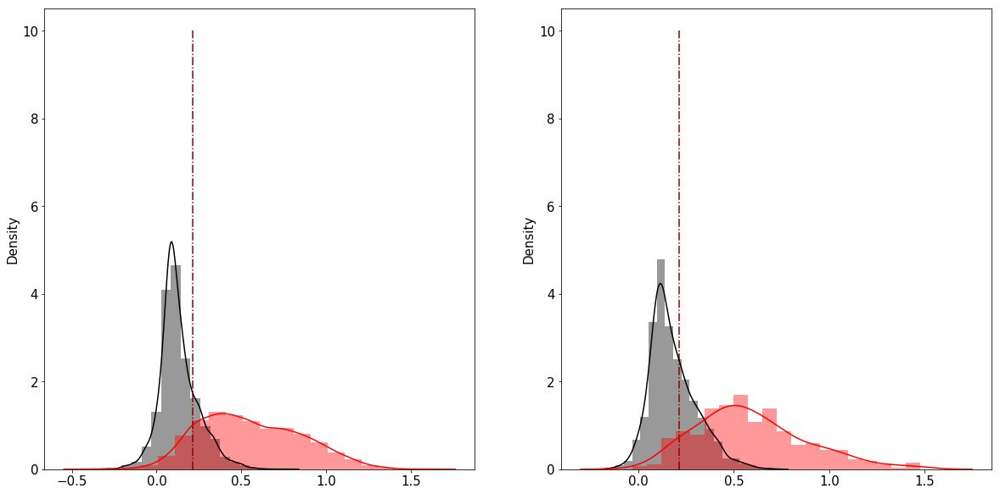

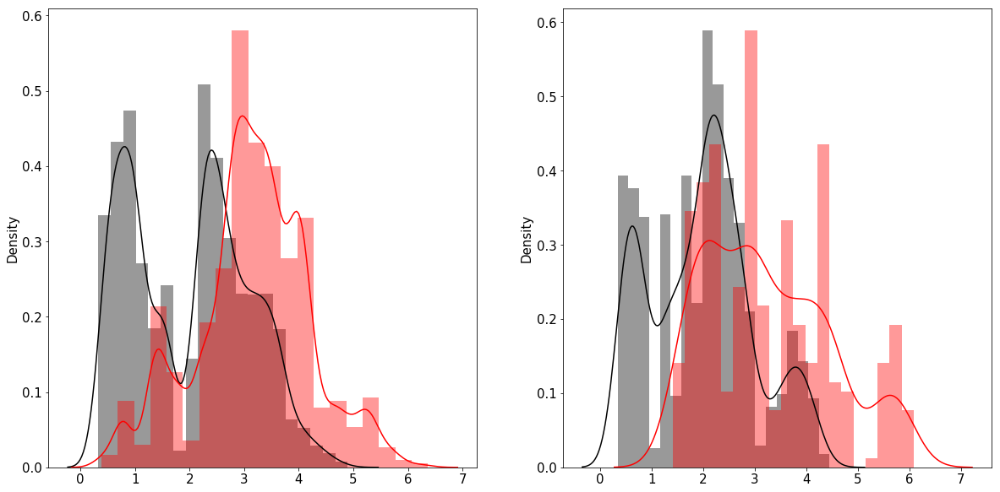

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3369920292695675
Recall: 0.3369920292695675
Precision: 0.429401783354573
F1-score: 0.3644751127439707

------------Scores on Test-------------
Accuracy: 0.2371364653243848
Recall: 0.2371364653243848
Precision: 0.370596790746408
F1-score: 0.2816767555508135

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4470/4470 [00:00<00:00, 9215.45it/s]

------------Scores on Train-------------
Accuracy: 0.9375408336600026
Recall: 0.9375408336600026
Precision: 0.9393625717361999
F1-score: 0.9379941990670257

------------Scores on Test-------------
Accuracy: 0.9297539149888143
Recall: 0.9297539149888143
Precision: 0.9318146229038846
F1-score: 0.9293080957792637

------------Scores on Train-------------
Accuracy: 0.003147128245476003
Recall: 0.003147128245476003
Precision: 0.00022846666028863904
F1-score: 0.00042600720750944203

------------Scores on Test-------------
Accuracy: 0.0008789920890711983
Recall: 0.0008789920890711983
Precision: 4.2877662881521866e-05
F1-score: 8.176670596011147e-05




100%|███████████████████████████████████████████████████████████████████████████| 3413/3413 [00:00<00:00, 11487.91it/s]

------------Scores on Train-------------
Accuracy: 0.9059795436664044
Recall: 0.9059795436664044
Precision: 0.9093789257045932
F1-score: 0.906740277458653

------------Scores on Test-------------
Accuracy: 0.9065338411954292
Recall: 0.9065338411954292
Precision: 0.9119812165566129
F1-score: 0.9067222874439514



  5%|███▉                                                                           | 5/100 [18:09<5:46:59, 219.15s/it]

----------------- iSimul = 5-----------------------

Normal observations in train set 6281
Outlier observations in train set 6281 

Normal observations in test set 1663
Outlier observations in test set 332
-------------------Scores on Train set-------------------
Accuracy :  0.7969
Precision :  0.7968
Recall :  0.7972
F1-score: 0.7970


-------------------Scores on Test set-------------------
Accuracy :  0.7328
Precision :  0.3640
Recall :  0.8102
F1-score: 0.5023




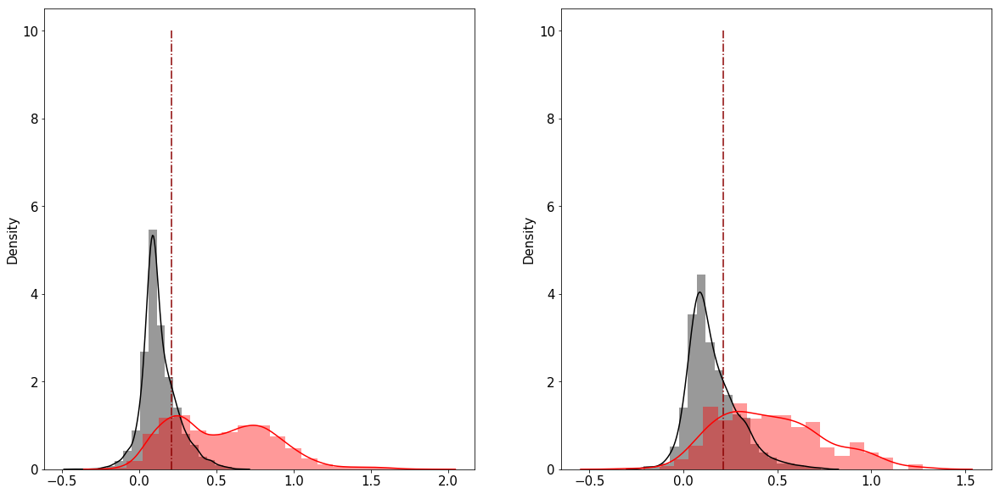

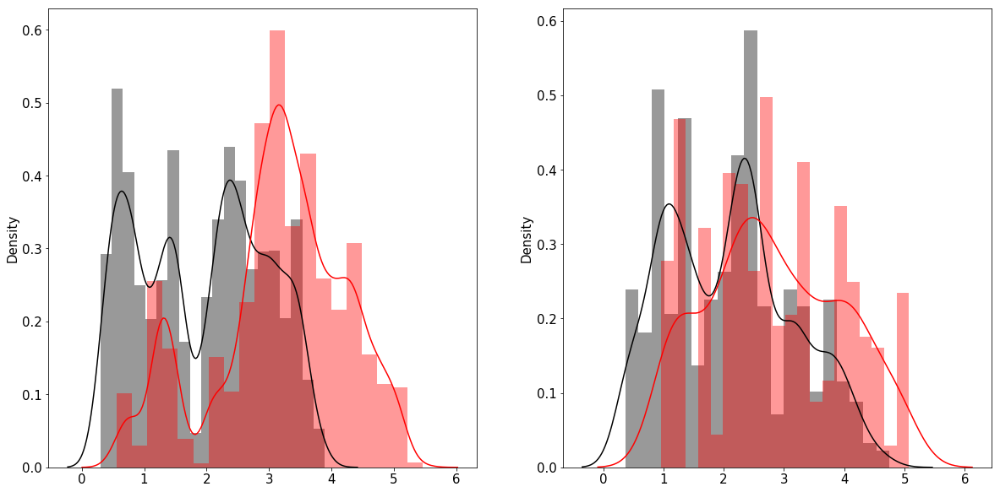

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.36457233368532205
Recall: 0.36457233368532205
Precision: 0.48503503554815175
F1-score: 0.39233697558832836

------------Scores on Test-------------
Accuracy: 0.29819075273620727
Recall: 0.29819075273620727
Precision: 0.44421741198749054
F1-score: 0.33899209294944116

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4477/4477 [00:00<00:00, 10433.17it/s]

------------Scores on Train-------------
Accuracy: 0.8761879619852164
Recall: 0.8761879619852164
Precision: 0.8796583440822937
F1-score: 0.8769941738687437

------------Scores on Test-------------
Accuracy: 0.9001563547018092
Recall: 0.9001563547018092
Precision: 0.9013428035299549
F1-score: 0.8999445822611231

------------Scores on Train-------------
Accuracy: 0.004144218814753419
Recall: 0.004144218814753419
Precision: 0.0002408711382643567
F1-score: 0.0004552803768320658

------------Scores on Test-------------
Accuracy: 0.0022264631043256997
Recall: 0.0022264631043256997
Precision: 0.00012020810187673967
F1-score: 0.00022810089710241022




100%|███████████████████████████████████████████████████████████████████████████| 3144/3144 [00:00<00:00, 11110.07it/s]

------------Scores on Train-------------
Accuracy: 0.8184832159138002
Recall: 0.8184832159138002
Precision: 0.8250121727161718
F1-score: 0.8199609998851435

------------Scores on Test-------------
Accuracy: 0.8533715012722646
Recall: 0.8533715012722646
Precision: 0.8562319841324669
F1-score: 0.8530269664243978



  6%|████▋                                                                          | 6/100 [22:06<5:51:42, 224.49s/it]

----------------- iSimul = 6-----------------------

Normal observations in train set 6113
Outlier observations in train set 6113 

Normal observations in test set 2309
Outlier observations in test set 461
-------------------Scores on Train set-------------------
Accuracy :  0.8058
Precision :  0.8204
Recall :  0.7831
F1-score: 0.8013


-------------------Scores on Test set-------------------
Accuracy :  0.7910
Precision :  0.4304
Recall :  0.7918
F1-score: 0.5577




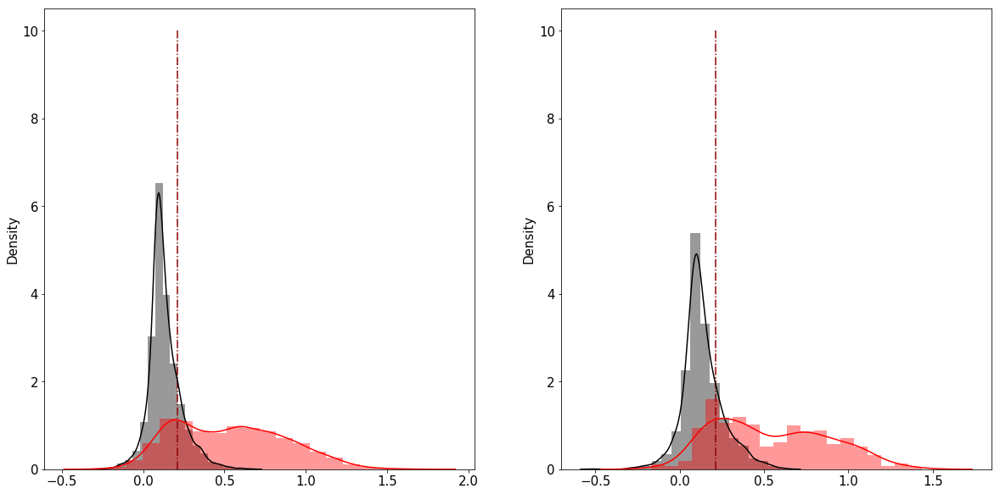

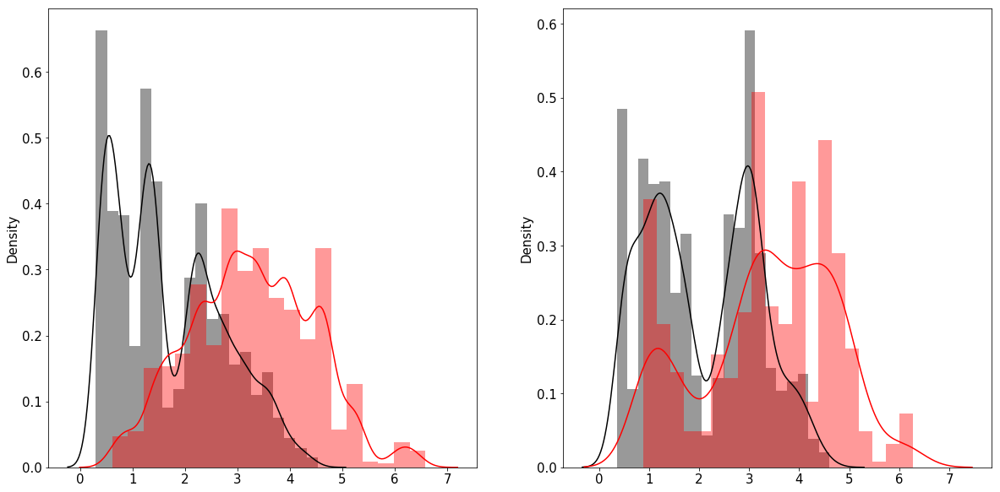

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2748435544430538
Recall: 0.2748435544430538
Precision: 0.40846046955563886
F1-score: 0.3147096290785707

------------Scores on Test-------------
Accuracy: 0.2790394152962673
Recall: 0.2790394152962673
Precision: 0.36760069425593794
F1-score: 0.2989515252496215

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 3831/3831 [00:00<00:00, 10446.58it/s]

------------Scores on Train-------------
Accuracy: 0.8354192740926157
Recall: 0.8354192740926157
Precision: 0.8389382762672389
F1-score: 0.8363225039451405

------------Scores on Test-------------
Accuracy: 0.9772905246671887
Recall: 0.9772905246671887
Precision: 0.9786660489389485
F1-score: 0.9773542829854247

------------Scores on Train-------------
Accuracy: 0.001896551724137931
Recall: 0.001896551724137931
Precision: 8.774082709534913e-05
F1-score: 0.0001677222613183204

------------Scores on Test-------------
Accuracy: 0.0028912179255511385
Recall: 0.0028912179255511385
Precision: 0.0001904395040782187
F1-score: 0.0003573415413602531




100%|████████████████████████████████████████████████████████████████████████████| 2767/2767 [00:00<00:00, 8225.24it/s]

------------Scores on Train-------------
Accuracy: 0.7701724137931034
Recall: 0.7701724137931034
Precision: 0.7793226918844611
F1-score: 0.7727749646316486

------------Scores on Test-------------
Accuracy: 0.9685580050596314
Recall: 0.9685580050596314
Precision: 0.9707722635684007
F1-score: 0.9685477700583471



  7%|█████▌                                                                         | 7/100 [25:57<5:50:50, 226.35s/it]

----------------- iSimul = 7-----------------------

Normal observations in train set 6158
Outlier observations in train set 6158 

Normal observations in test set 2008
Outlier observations in test set 401
-------------------Scores on Train set-------------------
Accuracy :  0.7796
Precision :  0.7698
Recall :  0.7978
F1-score: 0.7836


-------------------Scores on Test set-------------------
Accuracy :  0.7505
Precision :  0.3851
Recall :  0.8354
F1-score: 0.5271




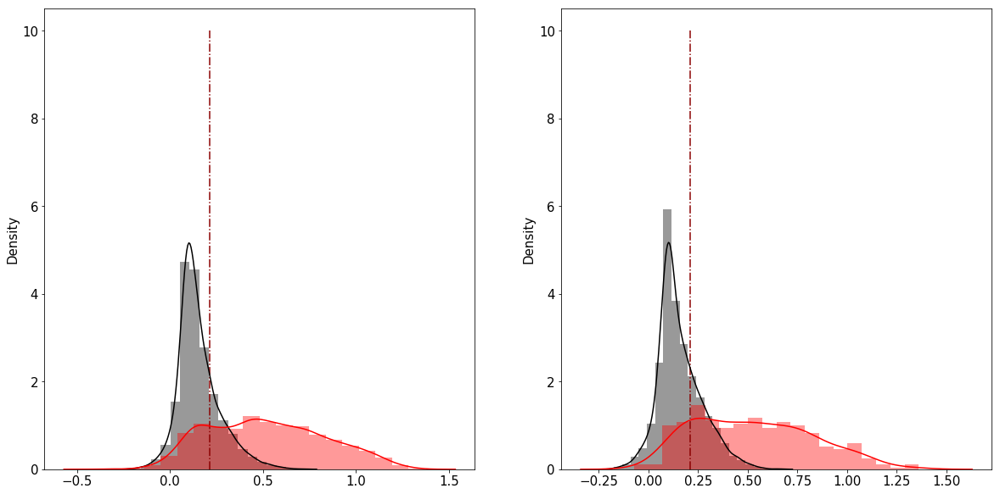

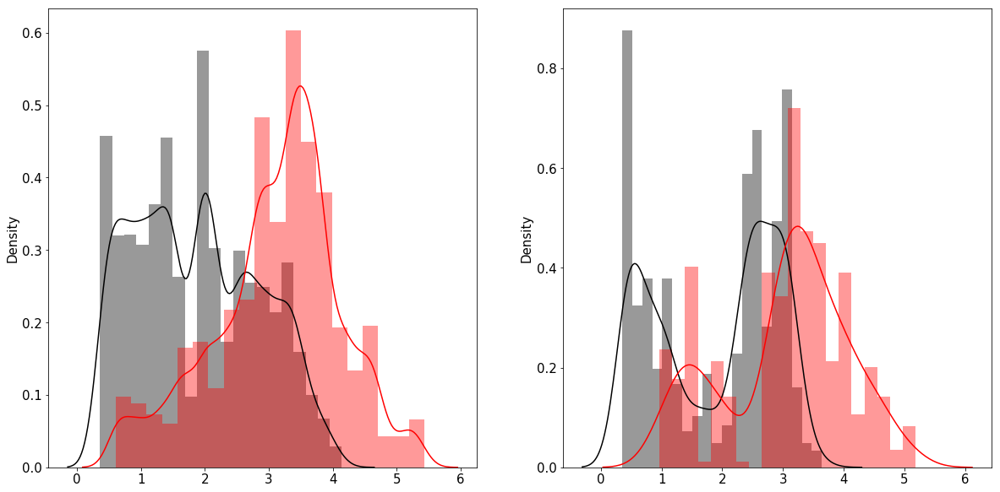

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2616108919709887
Recall: 0.2616108919709887
Precision: 0.3661279809803361
F1-score: 0.2903899560515983

------------Scores on Test-------------
Accuracy: 0.2887221684414327
Recall: 0.2887221684414327
Precision: 0.4184952504085388
F1-score: 0.32459326593794013

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4132/4132 [00:00<00:00, 10648.87it/s]

------------Scores on Train-------------
Accuracy: 0.8807736353225601
Recall: 0.8807736353225601
Precision: 0.8878061782687399
F1-score: 0.882715602656201

------------Scores on Test-------------
Accuracy: 0.9240077444336883
Recall: 0.9240077444336883
Precision: 0.9264746271272722
F1-score: 0.9243389854615063

------------Scores on Train-------------
Accuracy: 0.002066471499913897
Recall: 0.002066471499913897
Precision: 0.00013017143306544234
F1-score: 0.00024491514073053596

------------Scores on Test-------------
Accuracy: 0.0027155465037338763
Recall: 0.0027155465037338763
Precision: 0.00017111662900240866
F1-score: 0.00032194623497875855




100%|████████████████████████████████████████████████████████████████████████████| 2946/2946 [00:00<00:00, 8440.06it/s]

------------Scores on Train-------------
Accuracy: 0.8503530222145687
Recall: 0.8503530222145687
Precision: 0.8581509872089511
F1-score: 0.8524133283662467

------------Scores on Test-------------
Accuracy: 0.902919212491514
Recall: 0.902919212491514
Precision: 0.9060270138517601
F1-score: 0.9031615070918148



  8%|██████▎                                                                        | 8/100 [29:49<5:49:57, 228.23s/it]

----------------- iSimul = 8-----------------------

Normal observations in train set 5242
Outlier observations in train set 5242 

Normal observations in test set 1796
Outlier observations in test set 359
-------------------Scores on Train set-------------------
Accuracy :  0.8261
Precision :  0.8530
Recall :  0.7881
F1-score: 0.8192


-------------------Scores on Test set-------------------
Accuracy :  0.7972
Precision :  0.4441
Recall :  0.8635
F1-score: 0.5866




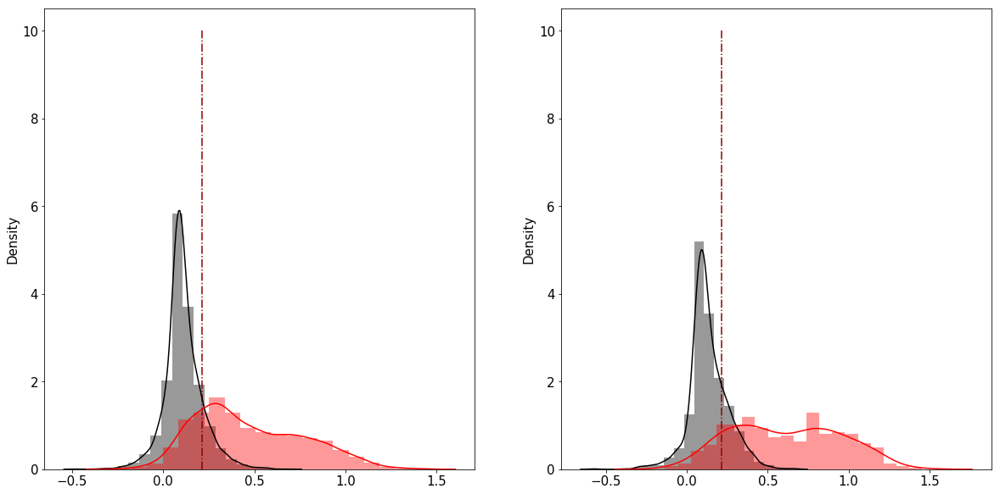

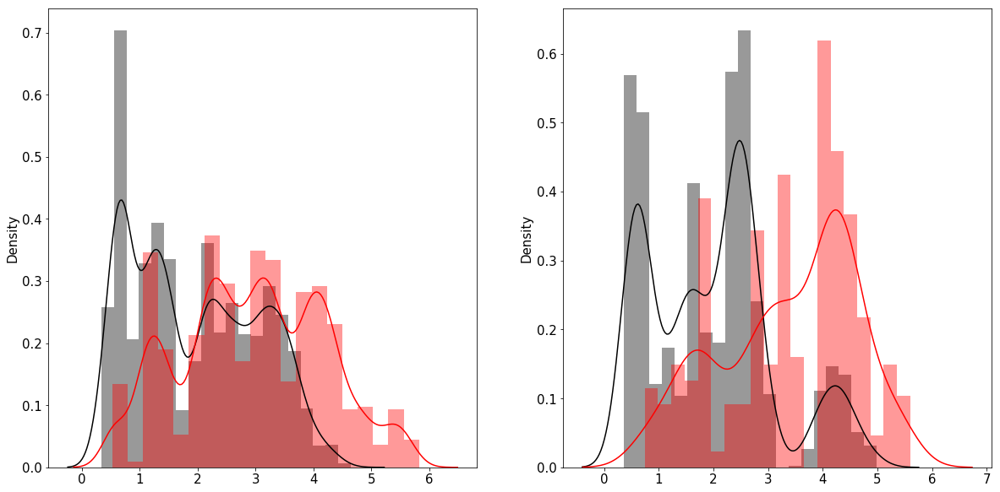

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2994264309961372
Recall: 0.2994264309961372
Precision: 0.402003998122364
F1-score: 0.3273558610012851

------------Scores on Test-------------
Accuracy: 0.3104693140794224
Recall: 0.3104693140794224
Precision: 0.4470167791778816
F1-score: 0.3510639209165268

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4155/4155 [00:00<00:00, 8392.95it/s]

------------Scores on Train-------------
Accuracy: 0.8957040852159663
Recall: 0.8957040852159663
Precision: 0.8975547018113623
F1-score: 0.8959216925263238

------------Scores on Test-------------
Accuracy: 0.927797833935018
Recall: 0.927797833935018
Precision: 0.9310212125163086
F1-score: 0.9284991715645488

------------Scores on Train-------------
Accuracy: 0.002669336002669336
Recall: 0.002669336002669336
Precision: 0.0001593633434429454
F1-score: 0.00030077025382189694

------------Scores on Test-------------
Accuracy: 0.002443280977312391
Recall: 0.002443280977312391
Precision: 0.0001675392670157068
F1-score: 0.00031357616821121593




100%|████████████████████████████████████████████████████████████████████████████| 2865/2865 [00:00<00:00, 7431.66it/s]

------------Scores on Train-------------
Accuracy: 0.8501835168501836
Recall: 0.8501835168501836
Precision: 0.8581053852583681
F1-score: 0.8516725448364235

------------Scores on Test-------------
Accuracy: 0.8924956369982548
Recall: 0.8924956369982548
Precision: 0.8991569500494299
F1-score: 0.894006329357975



  9%|███████                                                                        | 9/100 [33:35<5:44:56, 227.44s/it]

----------------- iSimul = 9-----------------------

Normal observations in train set 6153
Outlier observations in train set 6153 

Normal observations in test set 1479
Outlier observations in test set 295
-------------------Scores on Train set-------------------
Accuracy :  0.7786
Precision :  0.7722
Recall :  0.7902
F1-score: 0.7811


-------------------Scores on Test set-------------------
Accuracy :  0.7616
Precision :  0.3940
Recall :  0.8068
F1-score: 0.5295




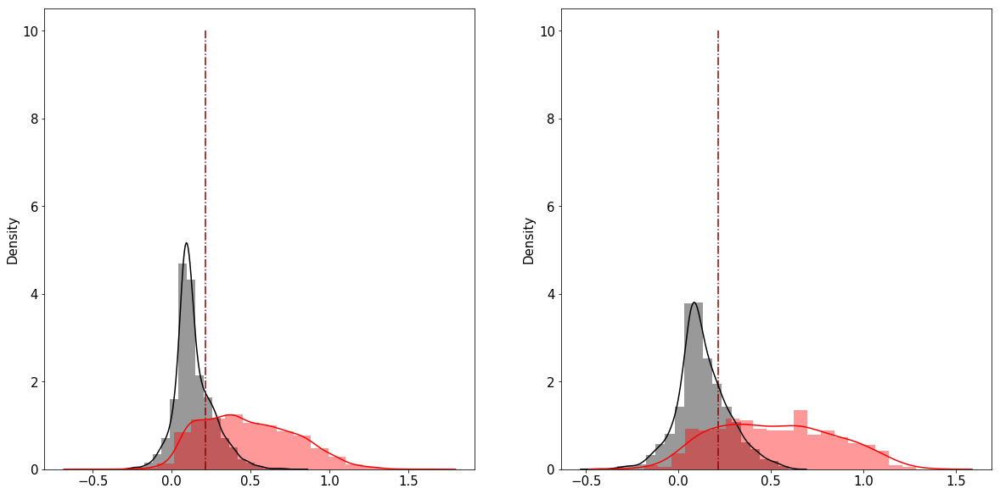

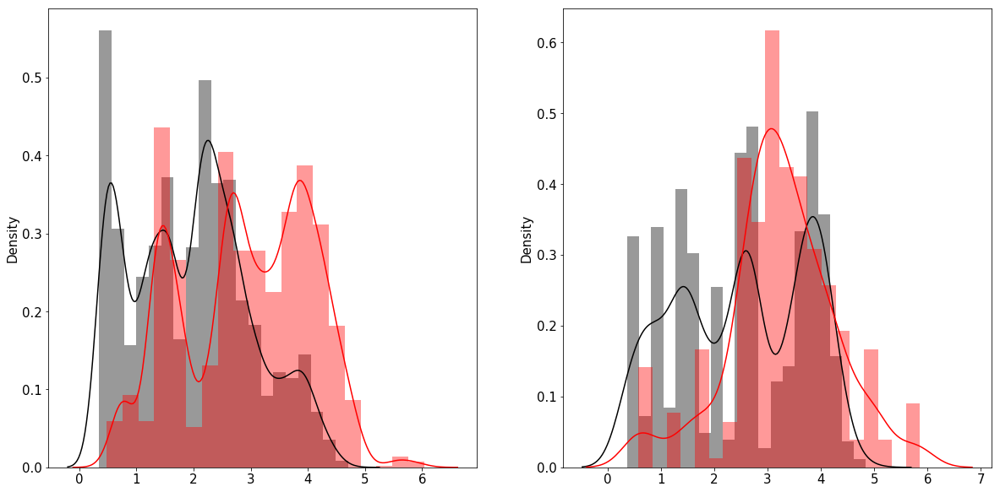

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3114062306069256
Recall: 0.3114062306069256
Precision: 0.43354803669937714
F1-score: 0.34670737209974584

------------Scores on Test-------------
Accuracy: 0.3542158335121219
Recall: 0.3542158335121219
Precision: 0.4367127203724833
F1-score: 0.375711162402872

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4661/4661 [00:00<00:00, 8210.24it/s]

------------Scores on Train-------------
Accuracy: 0.8554052376815192
Recall: 0.8554052376815192
Precision: 0.8597570944620054
F1-score: 0.8565247593168064

------------Scores on Test-------------
Accuracy: 0.885861403132375
Recall: 0.885861403132375
Precision: 0.891620677749661
F1-score: 0.8870919032067294

------------Scores on Train-------------
Accuracy: 0.0028787333573227778
Recall: 0.0028787333573227778
Precision: 0.0001625730959369613
F1-score: 0.00030776549582851084

------------Scores on Test-------------
Accuracy: 0.0029830957905203847
Recall: 0.0029830957905203847
Precision: 0.0002689676532436412
F1-score: 0.000493444416477056




100%|████████████████████████████████████████████████████████████████████████████| 3017/3017 [00:00<00:00, 8655.72it/s]

------------Scores on Train-------------
Accuracy: 0.783915077365959
Recall: 0.783915077365959
Precision: 0.7893425757089818
F1-score: 0.7850085340129114

------------Scores on Test-------------
Accuracy: 0.8246602585349685
Recall: 0.8246602585349685
Precision: 0.8351929351753518
F1-score: 0.826867105665263



 10%|███████▊                                                                      | 10/100 [37:43<5:50:26, 233.63s/it]

----------------- iSimul = 10-----------------------

Normal observations in train set 6329
Outlier observations in train set 6329 

Normal observations in test set 2102
Outlier observations in test set 420
-------------------Scores on Train set-------------------
Accuracy :  0.7630
Precision :  0.7564
Recall :  0.7760
F1-score: 0.7660


-------------------Scores on Test set-------------------
Accuracy :  0.8366
Precision :  0.5055
Recall :  0.8762
F1-score: 0.6411




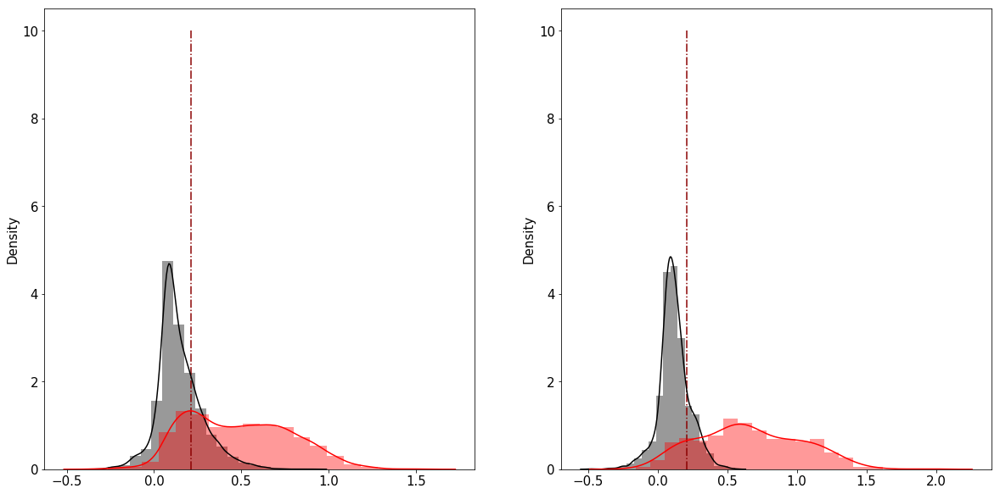

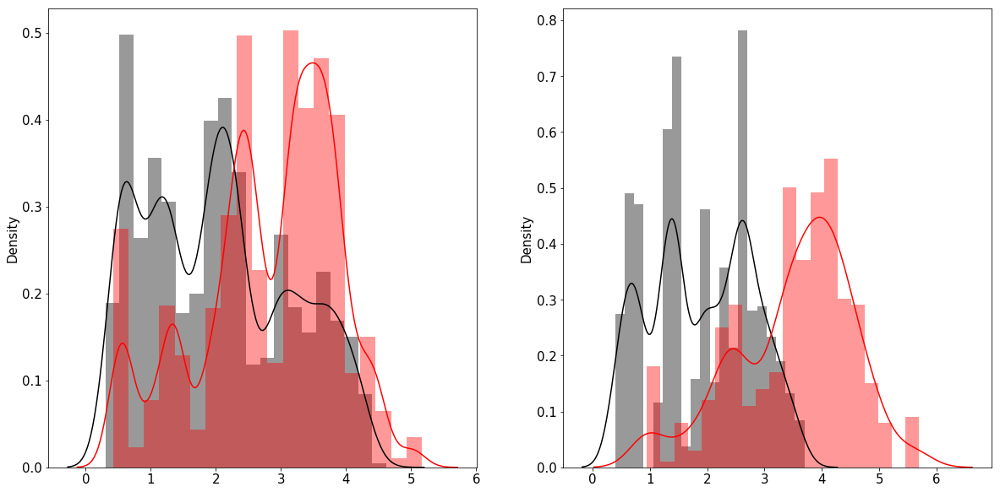

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3198077949813134
Recall: 0.3198077949813134
Precision: 0.44320152535208235
F1-score: 0.3522863683921947

------------Scores on Test-------------
Accuracy: 0.37295690936106984
Recall: 0.37295690936106984
Precision: 0.4685721852783428
F1-score: 0.40075354112710115

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4038/4038 [00:00<00:00, 9385.09it/s]

------------Scores on Train-------------
Accuracy: 0.8606513614522157
Recall: 0.8606513614522157
Precision: 0.8630686876623871
F1-score: 0.8608425202740466

------------Scores on Test-------------
Accuracy: 0.9269440316988609
Recall: 0.9269440316988609
Precision: 0.9289430359258085
F1-score: 0.9269141845594512

------------Scores on Train-------------
Accuracy: 0.0031311154598825833
Recall: 0.0031311154598825833
Precision: 0.0001706329950889691
F1-score: 0.0003236295048974246

------------Scores on Test-------------
Accuracy: 0.004726270185112249
Recall: 0.004726270185112249
Precision: 0.00040689743315535916
F1-score: 0.0007492867366641372




100%|███████████████████████████████████████████████████████████████████████████| 2539/2539 [00:00<00:00, 11803.59it/s]

------------Scores on Train-------------
Accuracy: 0.7949119373776908
Recall: 0.7949119373776908
Precision: 0.8012353372974348
F1-score: 0.7959381757612428

------------Scores on Test-------------
Accuracy: 0.879873966128397
Recall: 0.879873966128397
Precision: 0.8835619962172216
F1-score: 0.8794203402224812



 11%|████████▌                                                                     | 11/100 [41:37<5:46:56, 233.89s/it]

----------------- iSimul = 11-----------------------

Normal observations in train set 5679
Outlier observations in train set 5679 

Normal observations in test set 1714
Outlier observations in test set 342
-------------------Scores on Train set-------------------
Accuracy :  0.7960
Precision :  0.7965
Recall :  0.7952
F1-score: 0.7958


-------------------Scores on Test set-------------------
Accuracy :  0.7743
Precision :  0.3948
Recall :  0.6696
F1-score: 0.4967




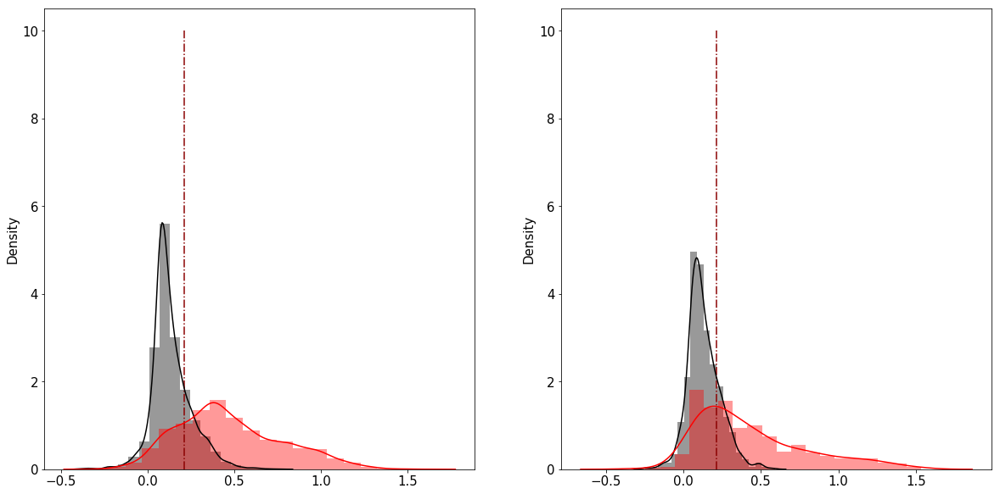

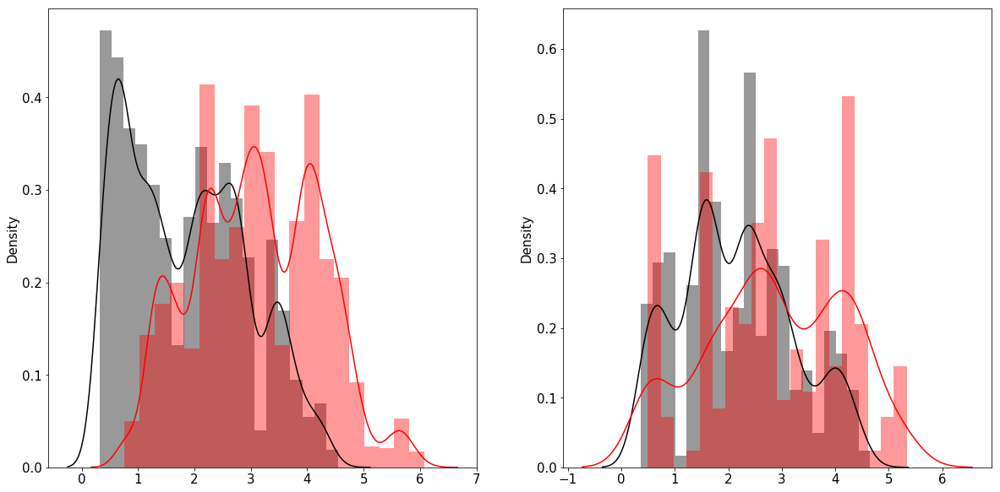

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2691577698695136
Recall: 0.2691577698695136
Precision: 0.3791537699974387
F1-score: 0.2967431345196502

------------Scores on Test-------------
Accuracy: 0.1981367870938423
Recall: 0.1981367870938423
Precision: 0.297424286301685
F1-score: 0.22057000677882702

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4401/4401 [00:00<00:00, 7644.57it/s]

------------Scores on Train-------------
Accuracy: 0.9379596678529063
Recall: 0.9379596678529063
Precision: 0.9393748272227902
F1-score: 0.9382539076201999

------------Scores on Test-------------
Accuracy: 0.773233356055442
Recall: 0.773233356055442
Precision: 0.7847432815621131
F1-score: 0.7761256257390023

------------Scores on Train-------------
Accuracy: 0.0025944543538187126
Recall: 0.0025944543538187126
Precision: 0.00015545998125411726
F1-score: 0.00029334282894935196

------------Scores on Test-------------
Accuracy: 0.0022650056625141564
Recall: 0.0022650056625141564
Precision: 0.00010675231606111803
F1-score: 0.00020389483459031543




100%|████████████████████████████████████████████████████████████████████████████| 3532/3532 [00:00<00:00, 9959.80it/s]

------------Scores on Train-------------
Accuracy: 0.9098427112047998
Recall: 0.9098427112047998
Precision: 0.9133308619419139
F1-score: 0.9106547408363542

------------Scores on Test-------------
Accuracy: 0.7171574178935447
Recall: 0.7171574178935447
Precision: 0.7386650376461584
F1-score: 0.7225845724788829



 12%|█████████▎                                                                    | 12/100 [45:33<5:43:56, 234.50s/it]

----------------- iSimul = 12-----------------------

Normal observations in train set 6566
Outlier observations in train set 6566 

Normal observations in test set 1521
Outlier observations in test set 304
-------------------Scores on Train set-------------------
Accuracy :  0.8205
Precision :  0.8156
Recall :  0.8284
F1-score: 0.8219


-------------------Scores on Test set-------------------
Accuracy :  0.8170
Precision :  0.4714
Recall :  0.8125
F1-score: 0.5966




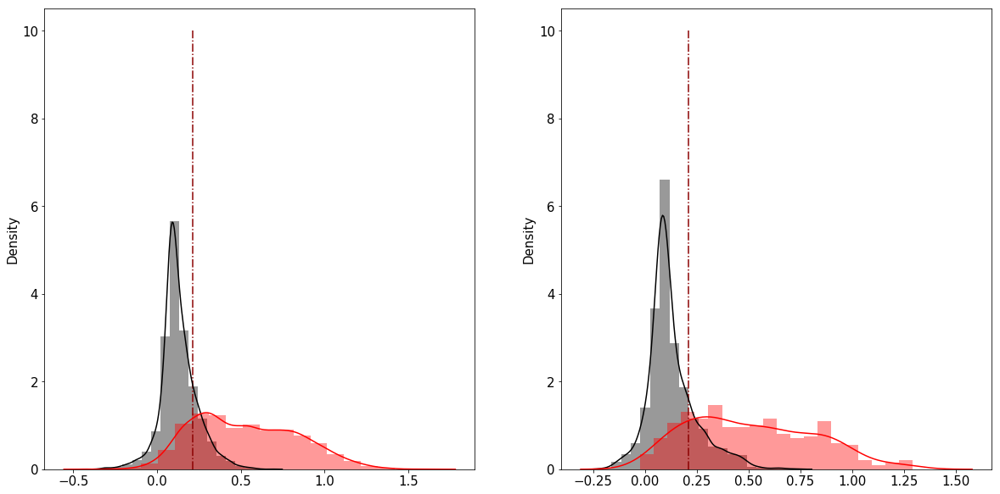

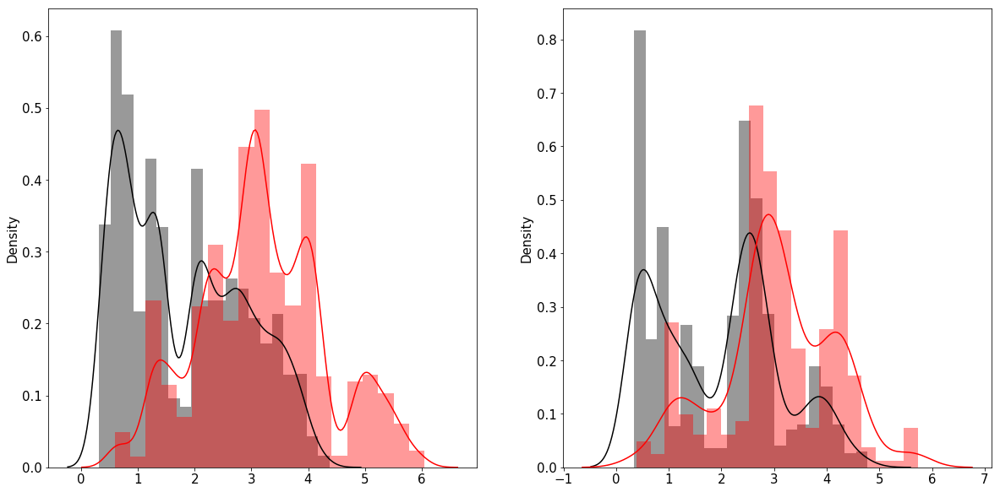

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2253175519630485
Recall: 0.2253175519630485
Precision: 0.30726978913179914
F1-score: 0.24584606005087667

------------Scores on Test-------------
Accuracy: 0.3178177094609223
Recall: 0.3178177094609223
Precision: 0.3905283339649604
F1-score: 0.33674635098906835

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4619/4619 [00:00<00:00, 6435.18it/s]

------------Scores on Train-------------
Accuracy: 0.8931870669745958
Recall: 0.8931870669745958
Precision: 0.899877247147857
F1-score: 0.8948049193058647

------------Scores on Test-------------
Accuracy: 0.8239878761636718
Recall: 0.8239878761636718
Precision: 0.8336081948065647
F1-score: 0.8267009114452492

------------Scores on Train-------------
Accuracy: 0.002232973576479345
Recall: 0.002232973576479345
Precision: 0.0001576717983391904
F1-score: 0.0002945455341523557

------------Scores on Test-------------
Accuracy: 0.0037974683544303796
Recall: 0.0037974683544303796
Precision: 0.00023078536960626615
F1-score: 0.000435126582278481




100%|███████████████████████████████████████████████████████████████████████████| 3160/3160 [00:00<00:00, 11508.20it/s]

------------Scores on Train-------------
Accuracy: 0.8717901004838109
Recall: 0.8717901004838109
Precision: 0.8808356836430581
F1-score: 0.873773356535927

------------Scores on Test-------------
Accuracy: 0.7465189873417721
Recall: 0.7465189873417721
Precision: 0.7623316290354968
F1-score: 0.7500903176249146



 13%|██████████▏                                                                   | 13/100 [49:28<5:39:55, 234.43s/it]

----------------- iSimul = 13-----------------------

Normal observations in train set 5565
Outlier observations in train set 5565 

Normal observations in test set 1958
Outlier observations in test set 391
-------------------Scores on Train set-------------------
Accuracy :  0.7807
Precision :  0.7737
Recall :  0.7935
F1-score: 0.7835


-------------------Scores on Test set-------------------
Accuracy :  0.8361
Precision :  0.5049
Recall :  0.7928
F1-score: 0.6169




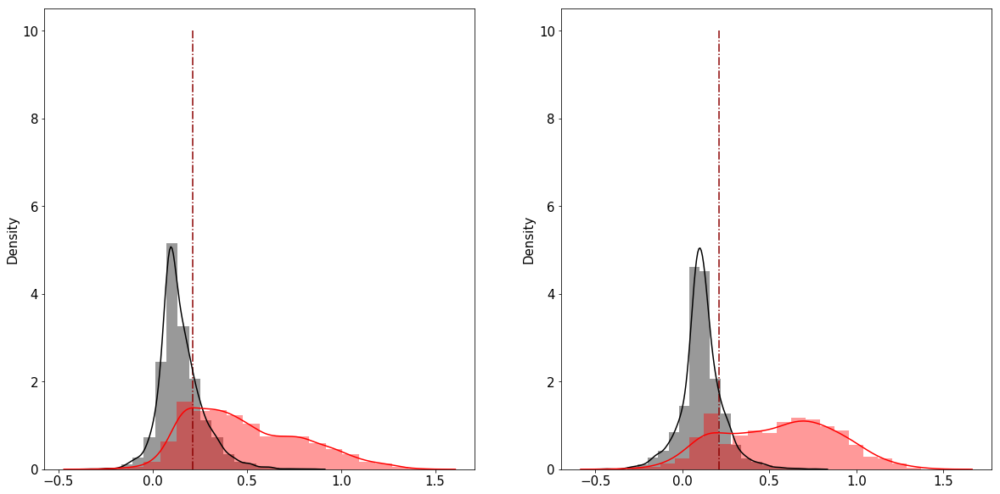

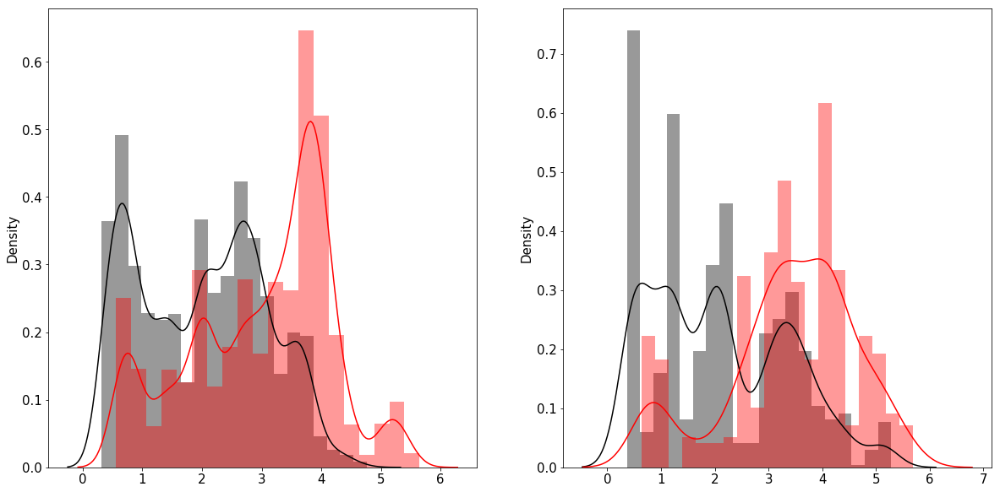

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.20254169976171565
Recall: 0.20254169976171565
Precision: 0.33558206241628075
F1-score: 0.22383212771494967

------------Scores on Test-------------
Accuracy: 0.18436154949784792
Recall: 0.18436154949784792
Precision: 0.2304544772231259
F1-score: 0.19228587631584598

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4182/4182 [00:00<00:00, 8348.65it/s]

------------Scores on Train-------------
Accuracy: 0.9172812890048792
Recall: 0.9172812890048792
Precision: 0.9212869352010635
F1-score: 0.9183892163129561

------------Scores on Test-------------
Accuracy: 0.8880918220946915
Recall: 0.8880918220946915
Precision: 0.8943054989115209
F1-score: 0.8887165793675612

------------Scores on Train-------------
Accuracy: 0.0024154589371980675
Recall: 0.0024154589371980675
Precision: 9.769298027090263e-05
F1-score: 0.0001877907822894513

------------Scores on Test-------------
Accuracy: 0.001759014951627089
Recall: 0.001759014951627089
Precision: 0.00012781769544695107
F1-score: 0.00023831815473657336




100%|███████████████████████████████████████████████████████████████████████████| 3411/3411 [00:00<00:00, 10617.26it/s]

------------Scores on Train-------------
Accuracy: 0.8995453253765274
Recall: 0.8995453253765274
Precision: 0.9034876195115191
F1-score: 0.900548265518949

------------Scores on Test-------------
Accuracy: 0.8642626795661097
Recall: 0.8642626795661097
Precision: 0.872792728766935
F1-score: 0.8644774931470385



 14%|██████████▉                                                                   | 14/100 [53:27<5:38:16, 236.00s/it]

----------------- iSimul = 14-----------------------

Normal observations in train set 5937
Outlier observations in train set 5937 

Normal observations in test set 1595
Outlier observations in test set 319
-------------------Scores on Train set-------------------
Accuracy :  0.8212
Precision :  0.8159
Recall :  0.8295
F1-score: 0.8227


-------------------Scores on Test set-------------------
Accuracy :  0.7785
Precision :  0.4064
Recall :  0.7147
F1-score: 0.5182




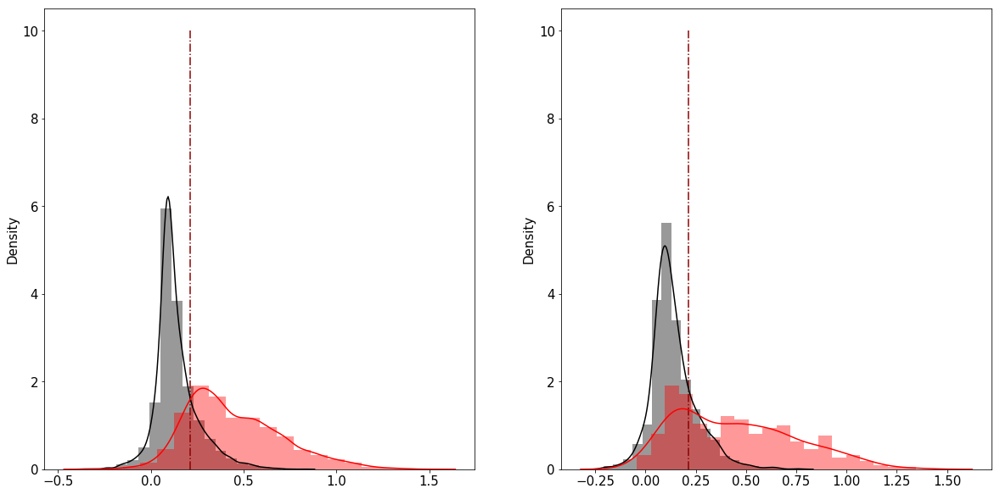

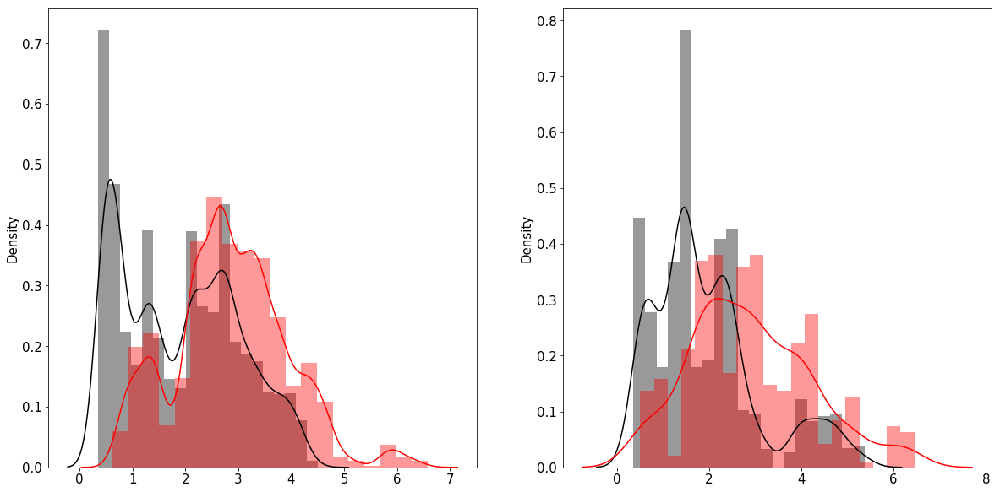

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.28928312816799423
Recall: 0.28928312816799423
Precision: 0.401585612733354
F1-score: 0.32352297084854426

------------Scores on Test-------------
Accuracy: 0.30847084708470845
Recall: 0.30847084708470845
Precision: 0.43715489314745226
F1-score: 0.34467790532665843

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4545/4545 [00:00<00:00, 10942.80it/s]

------------Scores on Train-------------
Accuracy: 0.9475018102824041
Recall: 0.9475018102824041
Precision: 0.9492446778638317
F1-score: 0.9478648752275634

------------Scores on Test-------------
Accuracy: 0.7834983498349835
Recall: 0.7834983498349835
Precision: 0.7973839149058625
F1-score: 0.7867819652400515

------------Scores on Train-------------
Accuracy: 0.002035623409669211
Recall: 0.002035623409669211
Precision: 0.00011406510485215407
F1-score: 0.00021602534143428366

------------Scores on Test-------------
Accuracy: 0.0031746031746031746
Recall: 0.0031746031746031746
Precision: 0.00019240019240019242
F1-score: 0.00036281179138322




100%|████████████████████████████████████████████████████████████████████████████| 3150/3150 [00:00<00:00, 8699.38it/s]

------------Scores on Train-------------
Accuracy: 0.9224766751484309
Recall: 0.9224766751484309
Precision: 0.9259331954242286
F1-score: 0.9231009938424517

------------Scores on Test-------------
Accuracy: 0.693968253968254
Recall: 0.693968253968254
Precision: 0.7150197318941688
F1-score: 0.6987173504584391



 15%|███████████▋                                                                  | 15/100 [57:29<5:36:56, 237.84s/it]

----------------- iSimul = 15-----------------------

Normal observations in train set 5795
Outlier observations in train set 5795 

Normal observations in test set 2113
Outlier observations in test set 422
-------------------Scores on Train set-------------------
Accuracy :  0.7640
Precision :  0.7416
Recall :  0.8104
F1-score: 0.7745


-------------------Scores on Test set-------------------
Accuracy :  0.7412
Precision :  0.3661
Recall :  0.7583
F1-score: 0.4938




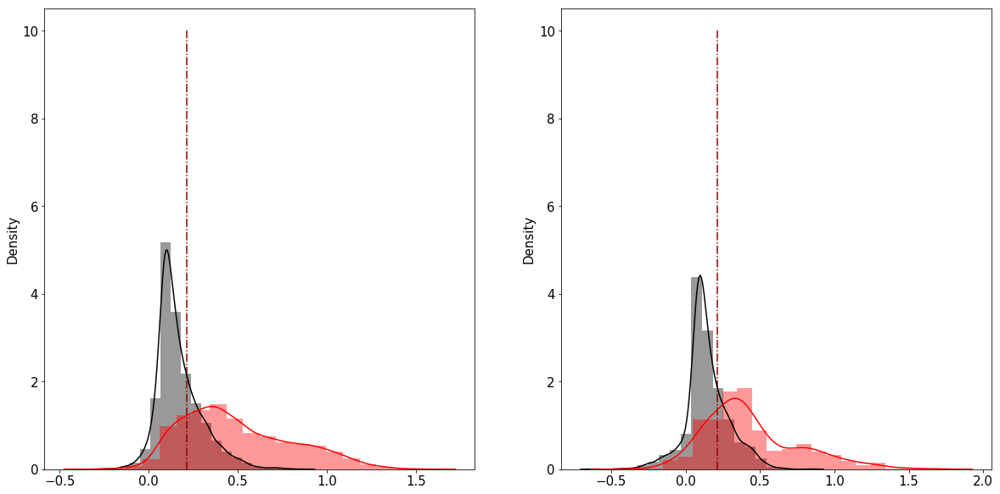

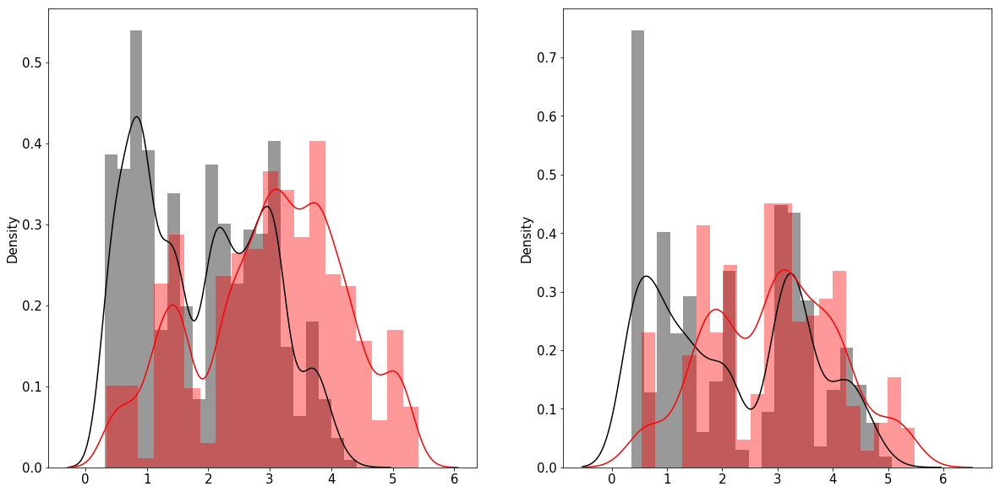

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3463072645956727
Recall: 0.3463072645956727
Precision: 0.4977609478126065
F1-score: 0.3821510226724147

------------Scores on Test-------------
Accuracy: 0.33896200645641916
Recall: 0.33896200645641916
Precision: 0.4662637137660513
F1-score: 0.3639206182780919

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4027/4027 [00:00<00:00, 8067.75it/s]

------------Scores on Train-------------
Accuracy: 0.9158709053547686
Recall: 0.9158709053547686
Precision: 0.9181039913974066
F1-score: 0.9163317758396686

------------Scores on Test-------------
Accuracy: 0.9130866650111745
Recall: 0.9130866650111745
Precision: 0.9168323306361661
F1-score: 0.9135641280391277

------------Scores on Train-------------
Accuracy: 0.0033216460601587007
Recall: 0.0033216460601587007
Precision: 0.00019412217234693706
F1-score: 0.0003668075403856234

------------Scores on Test-------------
Accuracy: 0.00375234521575985
Recall: 0.00375234521575985
Precision: 0.00022386150434930923
F1-score: 0.000422516083275908




100%|████████████████████████████████████████████████████████████████████████████| 2665/2665 [00:00<00:00, 8939.36it/s]

------------Scores on Train-------------
Accuracy: 0.8782063111275143
Recall: 0.8782063111275143
Precision: 0.88467800189631
F1-score: 0.8796160103260627

------------Scores on Test-------------
Accuracy: 0.8675422138836772
Recall: 0.8675422138836772
Precision: 0.8763392742056586
F1-score: 0.8686799646840538



 16%|████████████▏                                                               | 16/100 [1:01:27<5:33:05, 237.92s/it]

----------------- iSimul = 16-----------------------

Normal observations in train set 4885
Outlier observations in train set 4885 

Normal observations in test set 1992
Outlier observations in test set 398
-------------------Scores on Train set-------------------
Accuracy :  0.7994
Precision :  0.7704
Recall :  0.8530
F1-score: 0.8096


-------------------Scores on Test set-------------------
Accuracy :  0.8025
Precision :  0.4509
Recall :  0.8543
F1-score: 0.5903




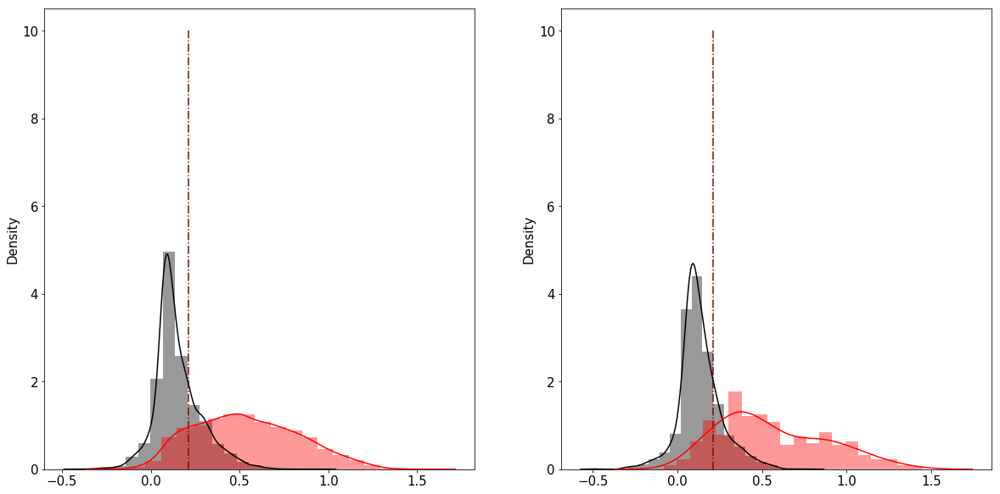

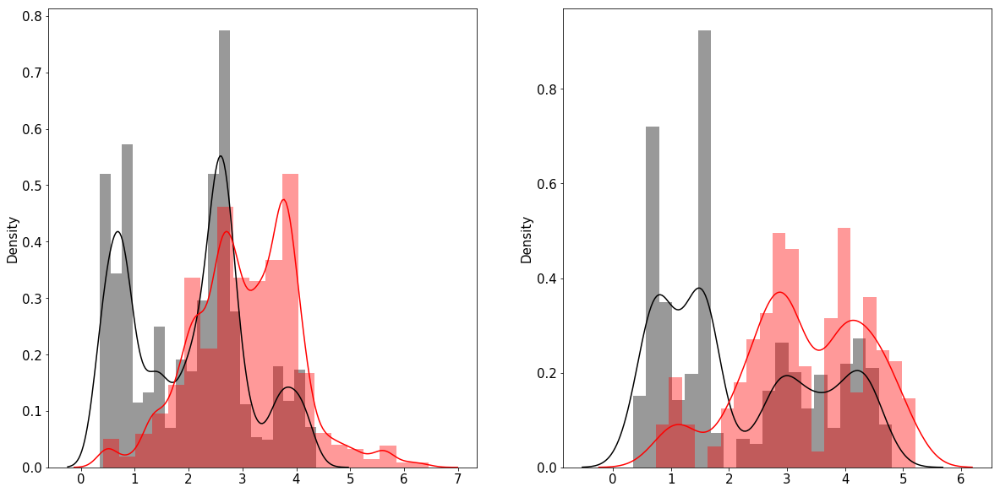

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.29240835177523333
Recall: 0.29240835177523333
Precision: 0.4430245403832141
F1-score: 0.3367788709754549

------------Scores on Test-------------
Accuracy: 0.13452266152362585
Recall: 0.13452266152362585
Precision: 0.19557822553467316
F1-score: 0.14832719760595547

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4148/4148 [00:00<00:00, 11470.86it/s]

------------Scores on Train-------------
Accuracy: 0.8946406234965842
Recall: 0.8946406234965842
Precision: 0.8973941302724145
F1-score: 0.8952082865672508

------------Scores on Test-------------
Accuracy: 0.9221311475409836
Recall: 0.9221311475409836
Precision: 0.9263616484433067
F1-score: 0.9228994424847895

------------Scores on Train-------------
Accuracy: 0.0017660643934248063
Recall: 0.0017660643934248063
Precision: 9.091459637564721e-05
F1-score: 0.00017292713852284567

------------Scores on Test-------------
Accuracy: 0.0011145165784341043
Recall: 0.0011145165784341043
Precision: 6.795832795329904e-05
F1-score: 0.0001281053538430005




100%|███████████████████████████████████████████████████████████████████████████| 3589/3589 [00:00<00:00, 10530.13it/s]

------------Scores on Train-------------
Accuracy: 0.8475750577367206
Recall: 0.8475750577367206
Precision: 0.8514241533995914
F1-score: 0.8482603402334111

------------Scores on Test-------------
Accuracy: 0.9139035943159655
Recall: 0.9139035943159655
Precision: 0.91737231159029
F1-score: 0.9144987779200561



 17%|████████████▉                                                               | 17/100 [1:05:44<5:36:53, 243.54s/it]

----------------- iSimul = 17-----------------------

Normal observations in train set 5230
Outlier observations in train set 5230 

Normal observations in test set 2147
Outlier observations in test set 429
-------------------Scores on Train set-------------------
Accuracy :  0.7715
Precision :  0.7846
Recall :  0.7486
F1-score: 0.7661


-------------------Scores on Test set-------------------
Accuracy :  0.8125
Precision :  0.4668
Recall :  0.8858
F1-score: 0.6114




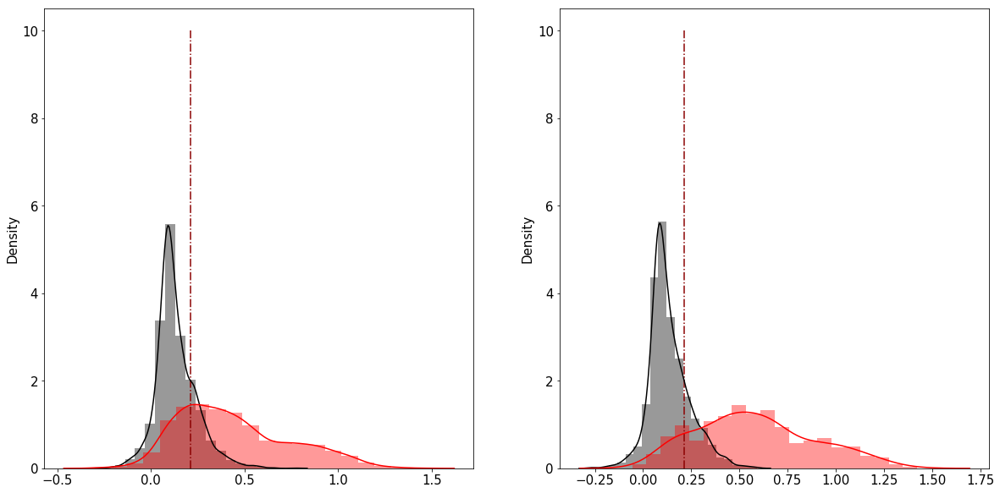

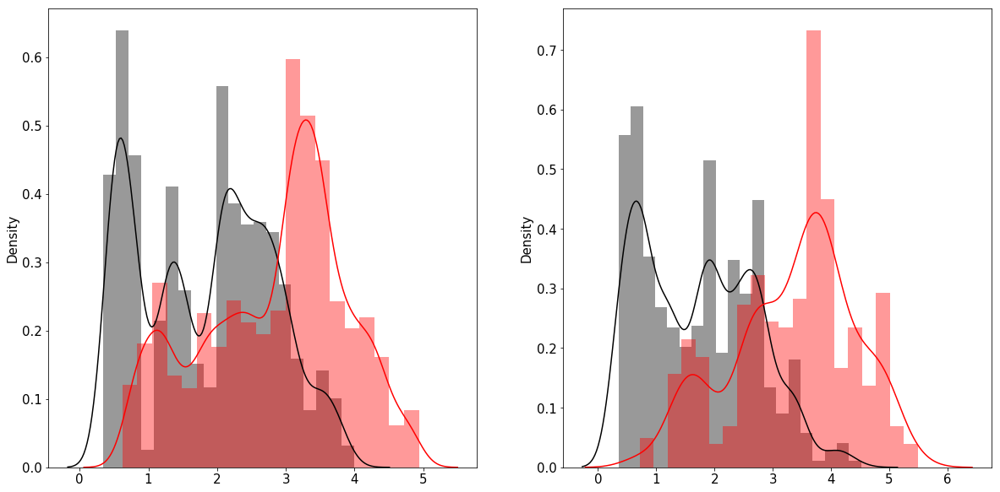

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.35615681943677524
Recall: 0.35615681943677524
Precision: 0.4422665132763863
F1-score: 0.3801964052019507

------------Scores on Test-------------
Accuracy: 0.4357625845229151
Recall: 0.4357625845229151
Precision: 0.524030650939795
F1-score: 0.46512179661615416

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 3993/3993 [00:00<00:00, 8297.61it/s]

------------Scores on Train-------------
Accuracy: 0.8337934842628382
Recall: 0.8337934842628382
Precision: 0.8374362551618576
F1-score: 0.8348414133942217

------------Scores on Test-------------
Accuracy: 0.918106686701728
Recall: 0.918106686701728
Precision: 0.9227902751646231
F1-score: 0.9185972941987333

------------Scores on Train-------------
Accuracy: 0.0032528676596473207
Recall: 0.0032528676596473207
Precision: 0.00026022941277178567
F1-score: 0.0004819063199477512

------------Scores on Test-------------
Accuracy: 0.003100088573959256
Recall: 0.003100088573959256
Precision: 0.000314105890753581
F1-score: 0.0005704162976085031




100%|████████████████████████████████████████████████████████████████████████████| 2258/2258 [00:00<00:00, 7128.71it/s]

------------Scores on Train-------------
Accuracy: 0.7693888032871083
Recall: 0.7693888032871083
Precision: 0.7738249145275595
F1-score: 0.7706559782029243

------------Scores on Test-------------
Accuracy: 0.8684676705048716
Recall: 0.8684676705048716
Precision: 0.8810162932727149
F1-score: 0.8688139130025928



 18%|█████████████▋                                                              | 18/100 [1:09:42<5:30:25, 241.78s/it]

----------------- iSimul = 18-----------------------

Normal observations in train set 5187
Outlier observations in train set 5187 

Normal observations in test set 1730
Outlier observations in test set 346
-------------------Scores on Train set-------------------
Accuracy :  0.8006
Precision :  0.7611
Recall :  0.8760
F1-score: 0.8146


-------------------Scores on Test set-------------------
Accuracy :  0.7206
Precision :  0.3664
Recall :  0.9277
F1-score: 0.5254




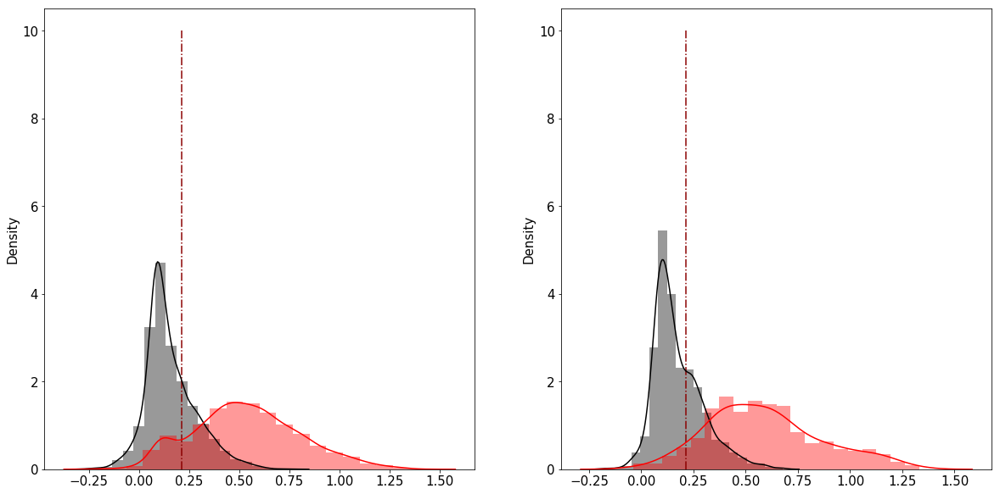

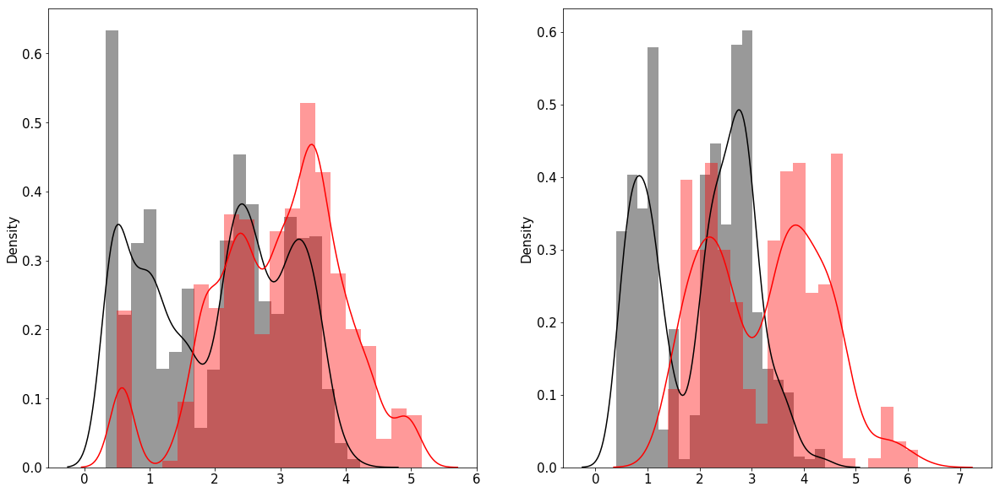

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3216990451103062
Recall: 0.3216990451103062
Precision: 0.43271858843363153
F1-score: 0.35366174008470463

------------Scores on Test-------------
Accuracy: 0.41383219954648526
Recall: 0.41383219954648526
Precision: 0.5117282329311814
F1-score: 0.44676960330384846

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4410/4410 [00:00<00:00, 8820.78it/s]

------------Scores on Train-------------
Accuracy: 0.9451212819668533
Recall: 0.9451212819668533
Precision: 0.9462815133056764
F1-score: 0.9453835741872645

------------Scores on Test-------------
Accuracy: 0.9435374149659864
Recall: 0.9435374149659864
Precision: 0.9476833365521575
F1-score: 0.9445369598368154

------------Scores on Train-------------
Accuracy: 0.002263906856403622
Recall: 0.0022639068564036225
Precision: 0.00014525849939365964
F1-score: 0.00027300053268396624

------------Scores on Test-------------
Accuracy: 0.002702702702702703
Recall: 0.002702702702702703
Precision: 0.0002866502866502867
F1-score: 0.000518326545723806




100%|████████████████████████████████████████████████████████████████████████████| 2590/2590 [00:00<00:00, 8598.97it/s]

------------Scores on Train-------------
Accuracy: 0.9269081500646831
Recall: 0.9269081500646831
Precision: 0.9291875443130201
F1-score: 0.9274456011671718

------------Scores on Test-------------
Accuracy: 0.8988416988416988
Recall: 0.8988416988416988
Precision: 0.9091758508809397
F1-score: 0.9013202577080373



 19%|██████████████▍                                                             | 19/100 [1:13:44<5:26:37, 241.95s/it]

----------------- iSimul = 19-----------------------

Normal observations in train set 6338
Outlier observations in train set 6338 

Normal observations in test set 2096
Outlier observations in test set 419
-------------------Scores on Train set-------------------
Accuracy :  0.8107
Precision :  0.7951
Recall :  0.8372
F1-score: 0.8156


-------------------Scores on Test set-------------------
Accuracy :  0.7928
Precision :  0.4252
Recall :  0.6921
F1-score: 0.5268




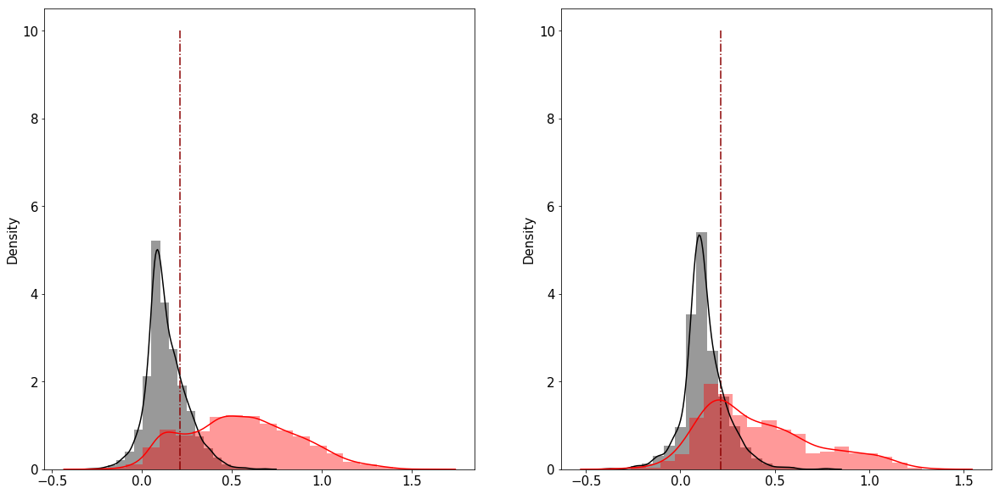

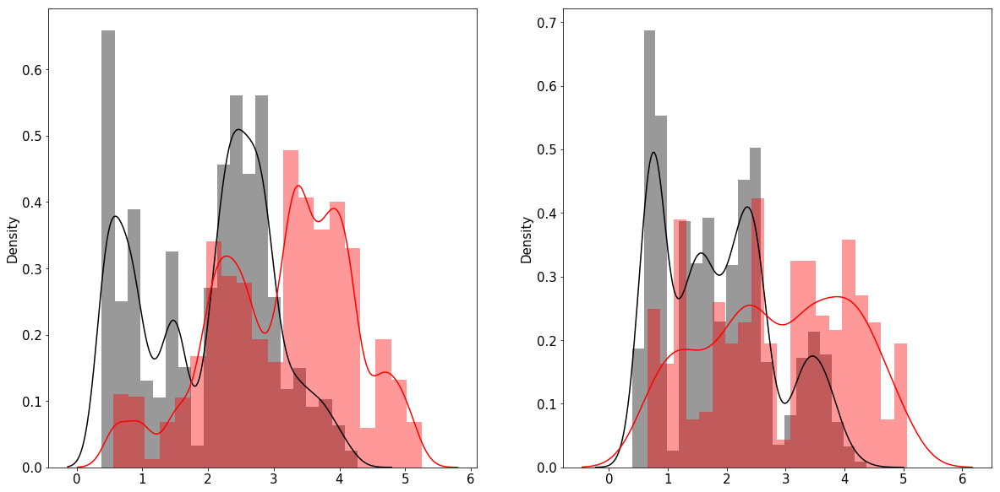

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.292548416057458
Recall: 0.292548416057458
Precision: 0.42014965197897886
F1-score: 0.3214434215779679

------------Scores on Test-------------
Accuracy: 0.28560830860534125
Recall: 0.28560830860534125
Precision: 0.4111014034902907
F1-score: 0.3178984105509571

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4044/4044 [00:00<00:00, 7755.72it/s]

------------Scores on Train-------------
Accuracy: 0.9431832756188278
Recall: 0.9431832756188278
Precision: 0.9454379104789108
F1-score: 0.9434200398750484

------------Scores on Test-------------
Accuracy: 0.9082591493570722
Recall: 0.9082591493570722
Precision: 0.919005615200526
F1-score: 0.9108522077603487

------------Scores on Train-------------
Accuracy: 0.002536691429606813
Recall: 0.002536691429606813
Precision: 0.0001472186990396811
F1-score: 0.0002782868235011693

------------Scores on Test-------------
Accuracy: 0.002767208578346593
Recall: 0.002767208578346593
Precision: 0.00016498262526727653
F1-score: 0.00031139943081138127




100%|████████████████████████████████████████████████████████████████████████████| 2891/2891 [00:00<00:00, 8630.45it/s]

------------Scores on Train-------------
Accuracy: 0.9193694509874978
Recall: 0.9193694509874978
Precision: 0.9219110601086727
F1-score: 0.91915385973753

------------Scores on Test-------------
Accuracy: 0.8626772742995503
Recall: 0.8626772742995503
Precision: 0.8836122996236612
F1-score: 0.8676462424621747



 20%|███████████████▏                                                            | 20/100 [1:17:44<5:21:49, 241.37s/it]

----------------- iSimul = 20-----------------------

Normal observations in train set 5821
Outlier observations in train set 5821 

Normal observations in test set 2315
Outlier observations in test set 463
-------------------Scores on Train set-------------------
Accuracy :  0.7206
Precision :  0.7534
Recall :  0.6559
F1-score: 0.7013


-------------------Scores on Test set-------------------
Accuracy :  0.7628
Precision :  0.3955
Recall :  0.8013
F1-score: 0.5296




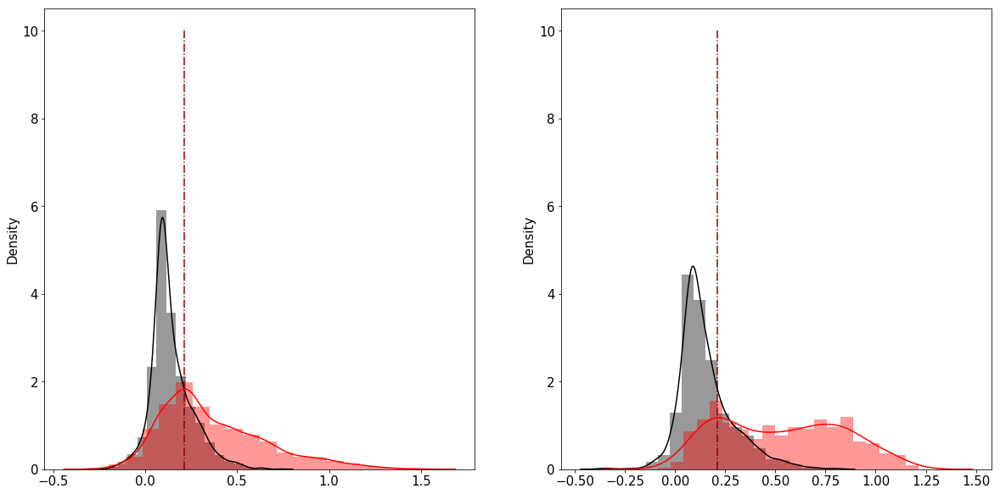

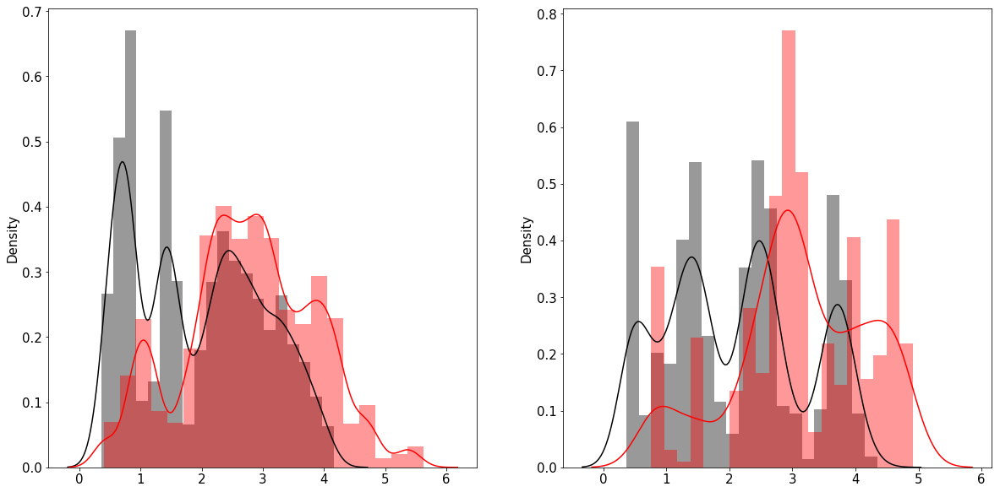

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3595217762596072
Recall: 0.3595217762596072
Precision: 0.4538472545361493
F1-score: 0.3881148377777638

------------Scores on Test-------------
Accuracy: 0.2520261437908497
Recall: 0.2520261437908497
Precision: 0.2952039449453096
F1-score: 0.2605133005760137

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 3825/3825 [00:00<00:00, 10751.70it/s]

------------Scores on Train-------------
Accuracy: 0.7614981090642918
Recall: 0.7614981090642918
Precision: 0.7731721808263089
F1-score: 0.7643619487307899

------------Scores on Test-------------
Accuracy: 0.8904575163398692
Recall: 0.8904575163398692
Precision: 0.8942524256055122
F1-score: 0.8910223667449575

------------Scores on Train-------------
Accuracy: 0.0036107943747624477
Recall: 0.0036107943747624477
Precision: 0.00027582457029435366
F1-score: 0.0005124998467404765

------------Scores on Test-------------
Accuracy: 0.002792321116928447
Recall: 0.002792321116928447
Precision: 0.00027098474974411086
F1-score: 0.0004940260437642636




100%|███████████████████████████████████████████████████████████████████████████| 2865/2865 [00:00<00:00, 11411.37it/s]

------------Scores on Train-------------
Accuracy: 0.669517293804637
Recall: 0.669517293804637
Precision: 0.6893277936479545
F1-score: 0.6737348457757484

------------Scores on Test-------------
Accuracy: 0.8551483420593369
Recall: 0.8551483420593369
Precision: 0.861646201868715
F1-score: 0.8557919927284292



 21%|███████████████▉                                                            | 21/100 [1:21:33<5:12:49, 237.59s/it]

----------------- iSimul = 21-----------------------

Normal observations in train set 5564
Outlier observations in train set 5564 

Normal observations in test set 1802
Outlier observations in test set 360
-------------------Scores on Train set-------------------
Accuracy :  0.8069
Precision :  0.7873
Recall :  0.8409
F1-score: 0.8132


-------------------Scores on Test set-------------------
Accuracy :  0.8307
Precision :  0.4954
Recall :  0.9000
F1-score: 0.6391




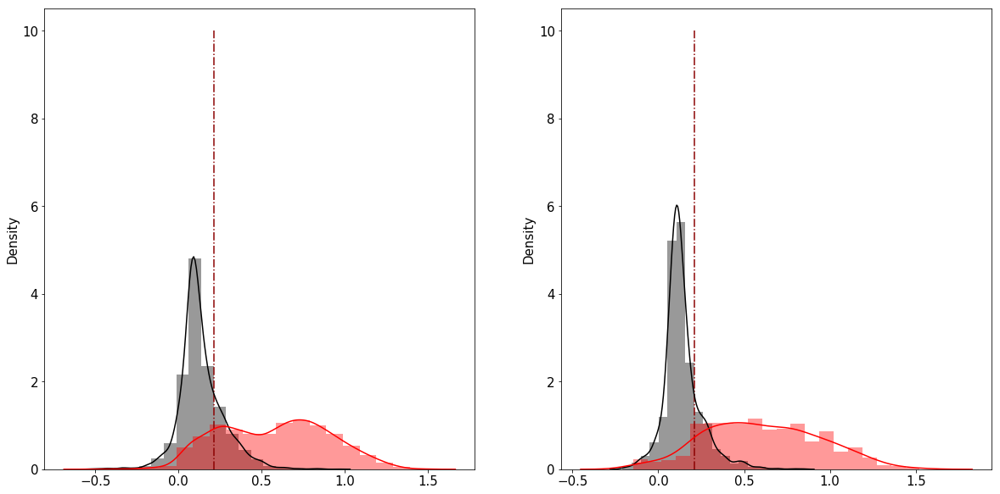

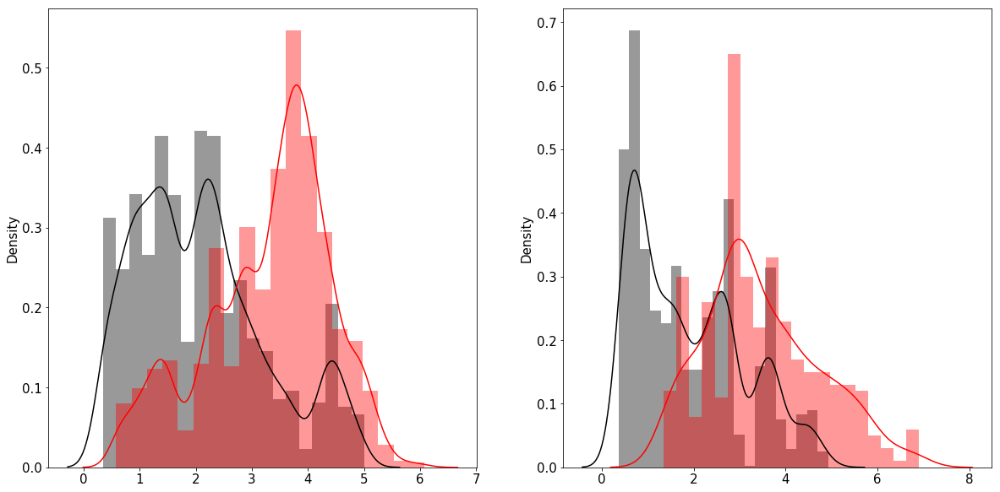

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2809301290609702
Recall: 0.2809301290609702
Precision: 0.4198150215913411
F1-score: 0.3138009159971493

------------Scores on Test-------------
Accuracy: 0.3070539419087137
Recall: 0.3070539419087137
Precision: 0.4036705208647188
F1-score: 0.3307681739984894

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4338/4338 [00:00<00:00, 9317.30it/s]

------------Scores on Train-------------
Accuracy: 0.9222296395193591
Recall: 0.9222296395193591
Precision: 0.9241052753357206
F1-score: 0.922700889711132

------------Scores on Test-------------
Accuracy: 0.9564315352697096
Recall: 0.9564315352697096
Precision: 0.9576912558716542
F1-score: 0.9566996588321627

------------Scores on Train-------------
Accuracy: 0.0032447466007416562
Recall: 0.0032447466007416562
Precision: 0.00017939704763715887
F1-score: 0.0003399962269569845

------------Scores on Test-------------
Accuracy: 0.002656924609764198
Recall: 0.002656924609764198
Precision: 0.00018978032926887127
F1-score: 0.0003542566146352264




100%|████████████████████████████████████████████████████████████████████████████| 3011/3011 [00:00<00:00, 9841.76it/s]

------------Scores on Train-------------
Accuracy: 0.8909147095179234
Recall: 0.8909147095179234
Precision: 0.8932851644803981
F1-score: 0.8914533630064806

------------Scores on Test-------------
Accuracy: 0.952507472600465
Recall: 0.952507472600465
Precision: 0.955136997317385
F1-score: 0.9528852691414073



 22%|████████████████▋                                                           | 22/100 [1:25:29<5:08:21, 237.20s/it]

----------------- iSimul = 22-----------------------

Normal observations in train set 5472
Outlier observations in train set 5472 

Normal observations in test set 1960
Outlier observations in test set 392
-------------------Scores on Train set-------------------
Accuracy :  0.8230
Precision :  0.8210
Recall :  0.8262
F1-score: 0.8236


-------------------Scores on Test set-------------------
Accuracy :  0.8108
Precision :  0.4598
Recall :  0.7730
F1-score: 0.5766




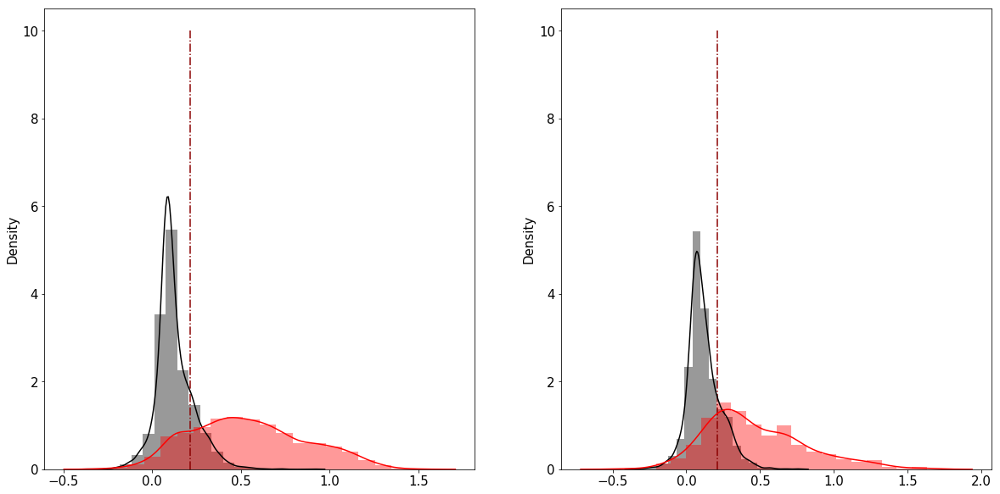

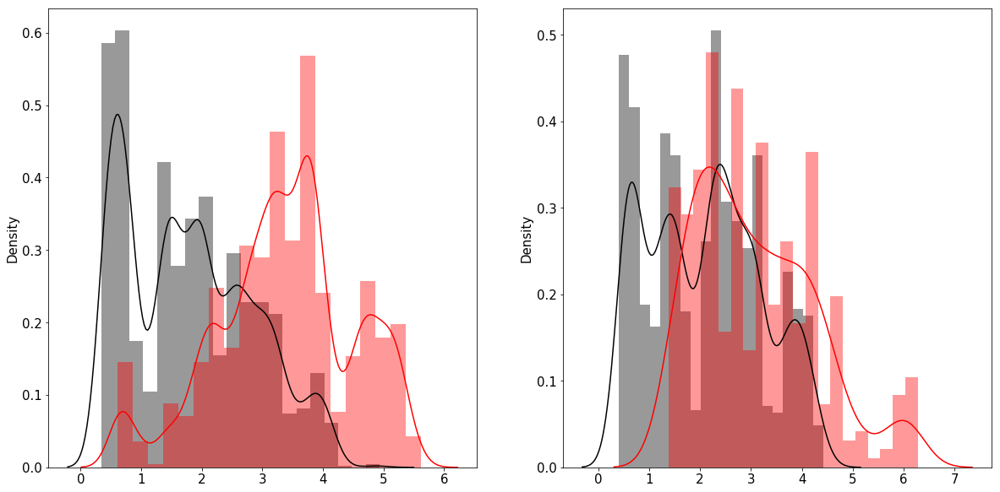

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3981755716147376
Recall: 0.3981755716147376
Precision: 0.4844824058154078
F1-score: 0.4256179894879691

------------Scores on Test-------------
Accuracy: 0.3464114832535885
Recall: 0.3464114832535885
Precision: 0.5504511803955672
F1-score: 0.3946078705550578

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4180/4180 [00:00<00:00, 11195.05it/s]

------------Scores on Train-------------
Accuracy: 0.9263120483355053
Recall: 0.9263120483355053
Precision: 0.927725582919742
F1-score: 0.9265640512722151

------------Scores on Test-------------
Accuracy: 0.8523923444976077
Recall: 0.8523923444976077
Precision: 0.8615234786214292
F1-score: 0.8547237940058025

------------Scores on Train-------------
Accuracy: 0.004124116260801257
Recall: 0.004124116260801257
Precision: 0.00037637565875273604
F1-score: 0.000689798805187399

------------Scores on Test-------------
Accuracy: 0.0029239766081871343
Recall: 0.0029239766081871343
Precision: 0.00015962155181170463
F1-score: 0.0003027175782593739




100%|████████████████████████████████████████████████████████████████████████████| 2736/2736 [00:00<00:00, 9657.85it/s]

------------Scores on Train-------------
Accuracy: 0.8827572663000786
Recall: 0.8827572663000786
Precision: 0.8855359257391663
F1-score: 0.8829943418949989

------------Scores on Test-------------
Accuracy: 0.8446637426900585
Recall: 0.8446637426900585
Precision: 0.859632581799171
F1-score: 0.8484659345795763



 23%|█████████████████▍                                                          | 23/100 [1:29:12<4:58:54, 232.91s/it]

----------------- iSimul = 23-----------------------

Normal observations in train set 5504
Outlier observations in train set 5504 

Normal observations in test set 1794
Outlier observations in test set 358
-------------------Scores on Train set-------------------
Accuracy :  0.7848
Precision :  0.7720
Recall :  0.8083
F1-score: 0.7897


-------------------Scores on Test set-------------------
Accuracy :  0.7454
Precision :  0.3578
Recall :  0.6676
F1-score: 0.4659




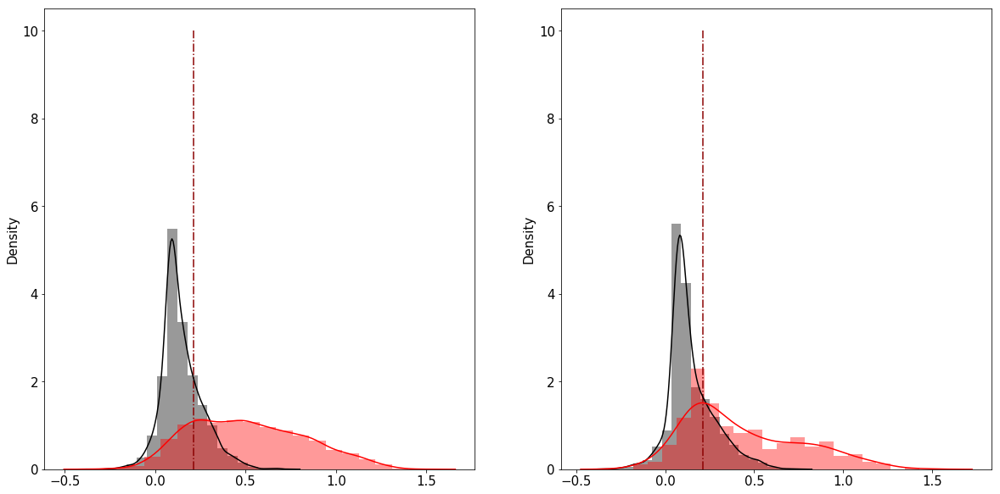

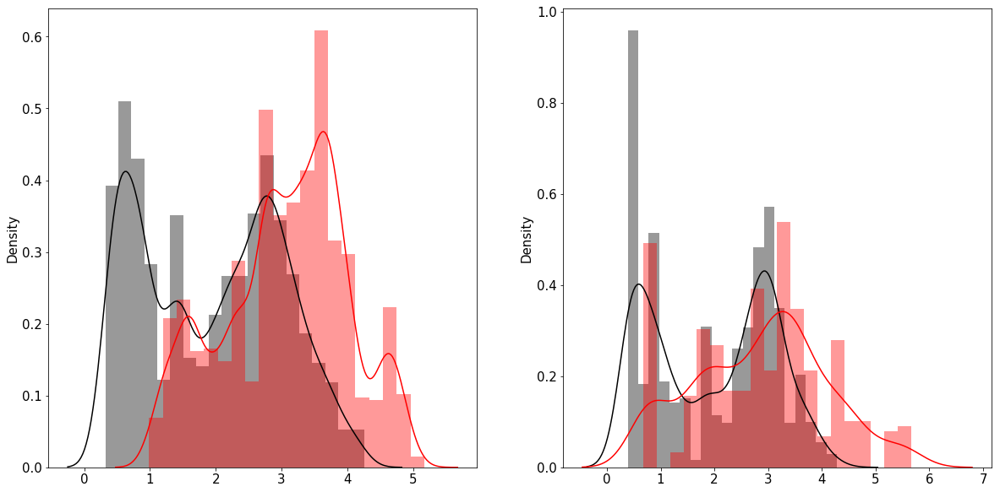

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3545405111473627
Recall: 0.3545405111473627
Precision: 0.4640705730414584
F1-score: 0.38524811062636133

------------Scores on Test-------------
Accuracy: 0.3844914864242982
Recall: 0.3844914864242982
Precision: 0.4988984726535208
F1-score: 0.4134255730257532

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4346/4346 [00:00<00:00, 8333.88it/s]

------------Scores on Train-------------
Accuracy: 0.8463839042958129
Recall: 0.8463839042958129
Precision: 0.8511999884792462
F1-score: 0.8473425637149077

------------Scores on Test-------------
Accuracy: 0.8904739990796134
Recall: 0.8904739990796134
Precision: 0.897084531917014
F1-score: 0.8920289187151804

------------Scores on Train-------------
Accuracy: 0.003362757461118117
Recall: 0.003362757461118117
Precision: 0.0002992617881088722
F1-score: 0.0005496119721397353

------------Scores on Test-------------
Accuracy: 0.0037341299477221808
Recall: 0.0037341299477221808
Precision: 0.00024304987825410644
F1-score: 0.00045639366027715536




100%|███████████████████████████████████████████████████████████████████████████| 2678/2678 [00:00<00:00, 10841.16it/s]

------------Scores on Train-------------
Accuracy: 0.757040773434216
Recall: 0.757040773434216
Precision: 0.7763886797812786
F1-score: 0.761211645154677

------------Scores on Test-------------
Accuracy: 0.833831217326363
Recall: 0.833831217326363
Precision: 0.8430788470114321
F1-score: 0.8358160695578291



 24%|██████████████████▏                                                         | 24/100 [1:32:51<4:49:50, 228.82s/it]

----------------- iSimul = 24-----------------------

Normal observations in train set 6296
Outlier observations in train set 6296 

Normal observations in test set 1969
Outlier observations in test set 393
-------------------Scores on Train set-------------------
Accuracy :  0.7811
Precision :  0.7729
Recall :  0.7961
F1-score: 0.7843


-------------------Scores on Test set-------------------
Accuracy :  0.7693
Precision :  0.3973
Recall :  0.7481
F1-score: 0.5190




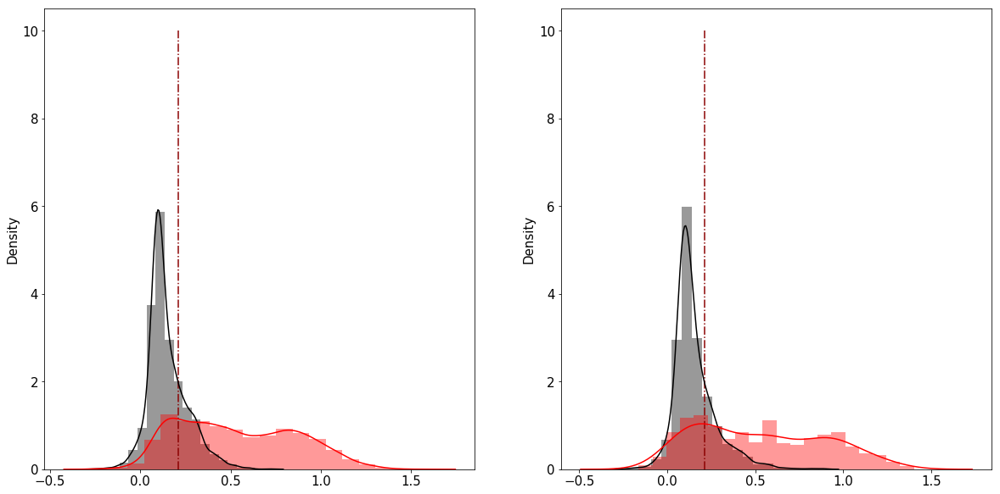

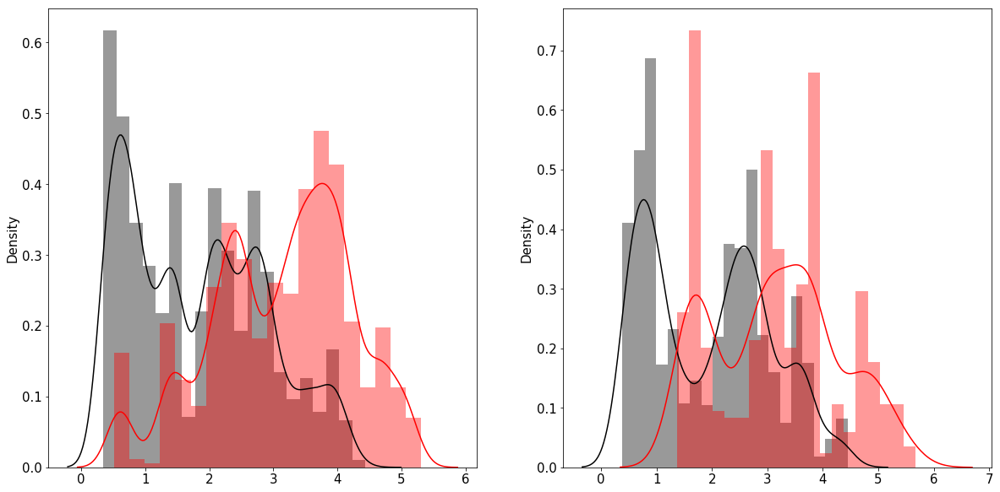

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.27594580777096117
Recall: 0.27594580777096117
Precision: 0.3517148418616516
F1-score: 0.2952398535558497

------------Scores on Test-------------
Accuracy: 0.28180677540777915
Recall: 0.28180677540777915
Precision: 0.3665805813150417
F1-score: 0.29575986237876606

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 3985/3985 [00:00<00:00, 9742.94it/s]

------------Scores on Train-------------
Accuracy: 0.8900817995910021
Recall: 0.8900817995910021
Precision: 0.8923867948435311
F1-score: 0.8906624796211245

------------Scores on Test-------------
Accuracy: 0.8868255959849436
Recall: 0.8868255959849436
Precision: 0.8899502227875985
F1-score: 0.8866406709035225

------------Scores on Train-------------
Accuracy: 0.0028203772254539045
Recall: 0.0028203772254539045
Precision: 0.00019585952954541004
F1-score: 0.00036628275655245507

------------Scores on Test-------------
Accuracy: 0.0034831069313827935
Recall: 0.0034831069313827935
Precision: 0.00020007402739013433
F1-score: 0.00037841161723664915




100%|████████████████████████████████████████████████████████████████████████████| 2871/2871 [00:00<00:00, 9375.60it/s]

------------Scores on Train-------------
Accuracy: 0.8480521769786709
Recall: 0.8480521769786709
Precision: 0.8522054895569167
F1-score: 0.8490045208122513

------------Scores on Test-------------
Accuracy: 0.8411703239289446
Recall: 0.8411703239289446
Precision: 0.8489932821299631
F1-score: 0.8416188673232241



 25%|███████████████████                                                         | 25/100 [1:36:43<4:47:08, 229.71s/it]

----------------- iSimul = 25-----------------------

Normal observations in train set 5897
Outlier observations in train set 5897 

Normal observations in test set 2378
Outlier observations in test set 475
-------------------Scores on Train set-------------------
Accuracy :  0.7770
Precision :  0.8289
Recall :  0.6982
F1-score: 0.7579


-------------------Scores on Test set-------------------
Accuracy :  0.8093
Precision :  0.4544
Recall :  0.7242
F1-score: 0.5584




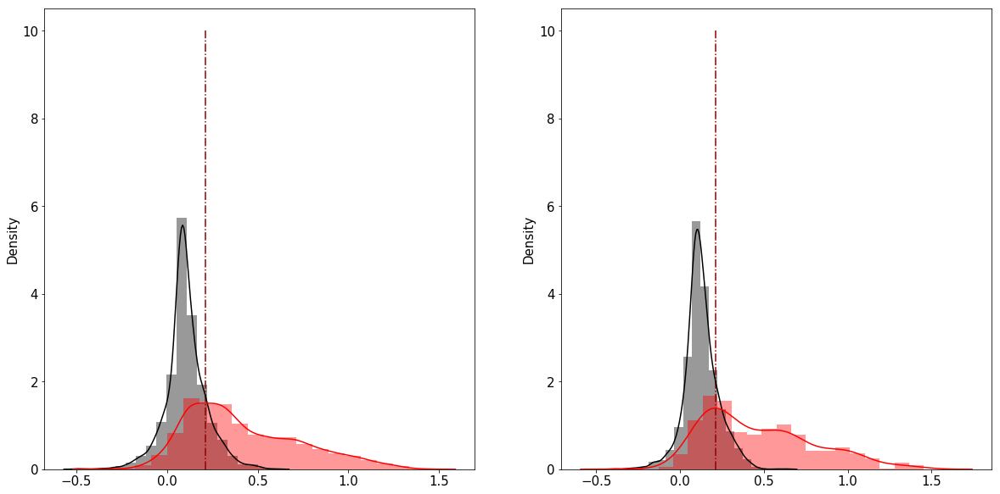

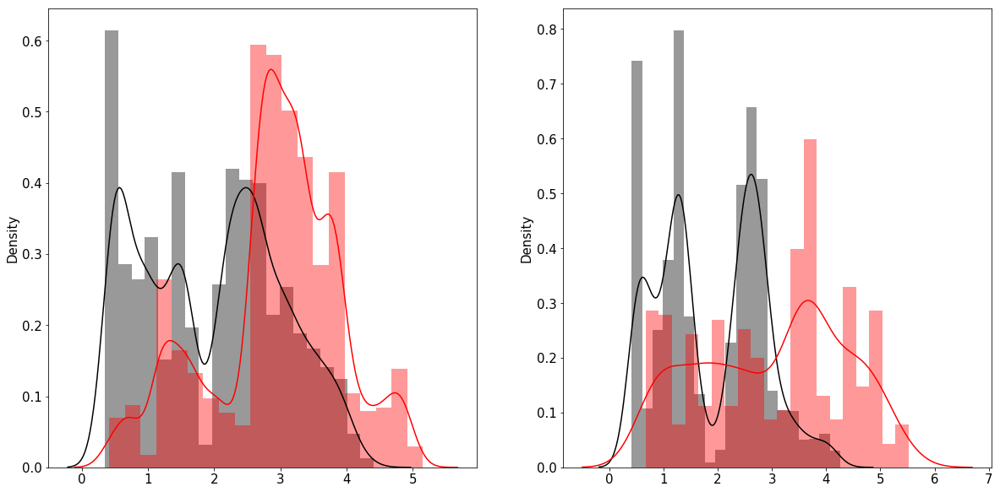

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.24245028234716426
Recall: 0.24245028234716426
Precision: 0.3352026148176398
F1-score: 0.2674504337149148

------------Scores on Test-------------
Accuracy: 0.24136097820308347
Recall: 0.24136097820308347
Precision: 0.39438327190514727
F1-score: 0.2795129404191238

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 3762/3762 [00:00<00:00, 10433.12it/s]

------------Scores on Train-------------
Accuracy: 0.8610360913331696
Recall: 0.8610360913331696
Precision: 0.8652387501050712
F1-score: 0.8620270698297606

------------Scores on Test-------------
Accuracy: 0.8211057947900053
Recall: 0.8211057947900053
Precision: 0.8279881433640435
F1-score: 0.8227639105825879

------------Scores on Train-------------
Accuracy: 0.001941433425012134
Recall: 0.001941433425012134
Precision: 0.00013258569731790183
F1-score: 0.00024821979863168833

------------Scores on Test-------------
Accuracy: 0.001751927119831815
Recall: 0.001751927119831815
Precision: 8.759635599159075e-05
F1-score: 0.00016685020188874426




100%|███████████████████████████████████████████████████████████████████████████| 2854/2854 [00:00<00:00, 10532.49it/s]

------------Scores on Train-------------
Accuracy: 0.8204174081863777
Recall: 0.8204174081863777
Precision: 0.8262666161881185
F1-score: 0.8217220006561508

------------Scores on Test-------------
Accuracy: 0.7641906096706377
Recall: 0.7641906096706377
Precision: 0.7750966328607682
F1-score: 0.7668458917016233



 26%|███████████████████▊                                                        | 26/100 [1:40:24<4:39:57, 226.99s/it]

----------------- iSimul = 26-----------------------

Normal observations in train set 5869
Outlier observations in train set 5869 

Normal observations in test set 1666
Outlier observations in test set 333
-------------------Scores on Train set-------------------
Accuracy :  0.7531
Precision :  0.7573
Recall :  0.7449
F1-score: 0.7511


-------------------Scores on Test set-------------------
Accuracy :  0.7969
Precision :  0.4454
Recall :  0.8949
F1-score: 0.5948




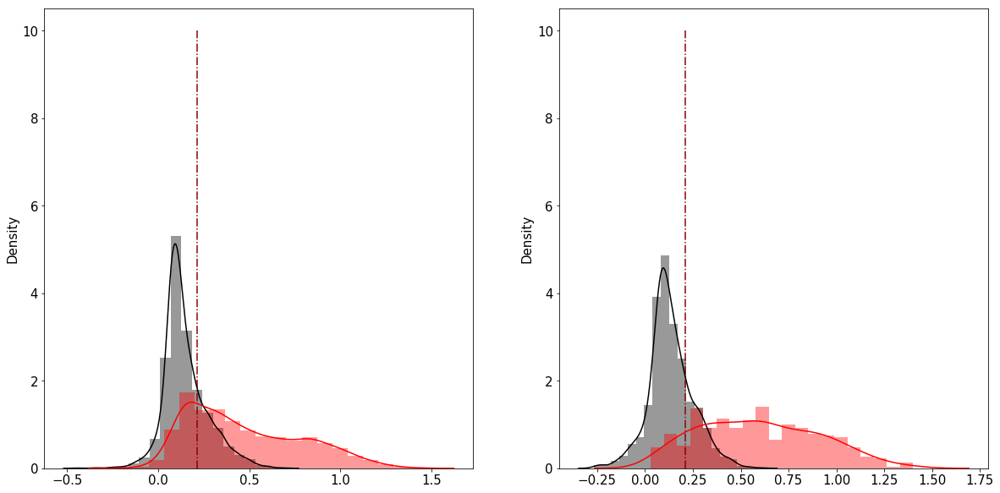

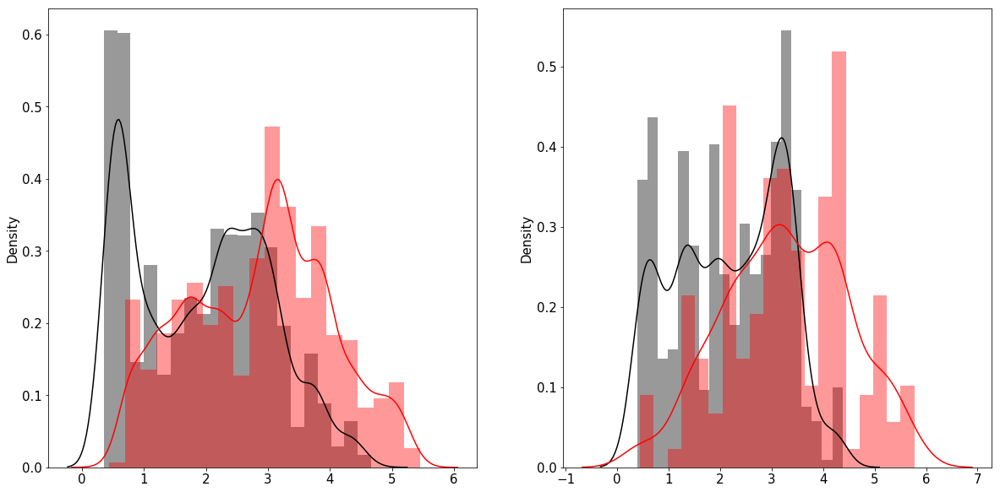

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.261461753617901
Recall: 0.261461753617901
Precision: 0.3575216033636771
F1-score: 0.28341860231019034

------------Scores on Test-------------
Accuracy: 0.29213232007152434
Recall: 0.29213232007152434
Precision: 0.3926464664740472
F1-score: 0.31878571045852594

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4474/4474 [00:00<00:00, 9766.15it/s]

------------Scores on Train-------------
Accuracy: 0.935060197008391
Recall: 0.935060197008391
Precision: 0.9369079723720831
F1-score: 0.9353863108839082

------------Scores on Test-------------
Accuracy: 0.9606616003576218
Recall: 0.9606616003576218
Precision: 0.9619786713807723
F1-score: 0.9608858673113284

------------Scores on Train-------------
Accuracy: 0.0024691358024691358
Recall: 0.0024691358024691358
Precision: 0.0001206979791709773
F1-score: 0.00023014581381203657

------------Scores on Test-------------
Accuracy: 0.0028373266078184113
Recall: 0.0028373266078184113
Precision: 0.000143922364164702
F1-score: 0.00027394877592729484




100%|███████████████████████████████████████████████████████████████████████████| 3172/3172 [00:00<00:00, 11979.22it/s]

------------Scores on Train-------------
Accuracy: 0.917037037037037
Recall: 0.917037037037037
Precision: 0.9202297546795265
F1-score: 0.9177835231276127

------------Scores on Test-------------
Accuracy: 0.9445145018915511
Recall: 0.9445145018915511
Precision: 0.9473510598060281
F1-score: 0.9450583196798328



 27%|████████████████████▌                                                       | 27/100 [1:44:27<4:42:13, 231.97s/it]

----------------- iSimul = 27-----------------------

Normal observations in train set 5147
Outlier observations in train set 5147 

Normal observations in test set 1870
Outlier observations in test set 374
-------------------Scores on Train set-------------------
Accuracy :  0.7788
Precision :  0.7871
Recall :  0.7643
F1-score: 0.7756


-------------------Scores on Test set-------------------
Accuracy :  0.7589
Precision :  0.3900
Recall :  0.7914
F1-score: 0.5225




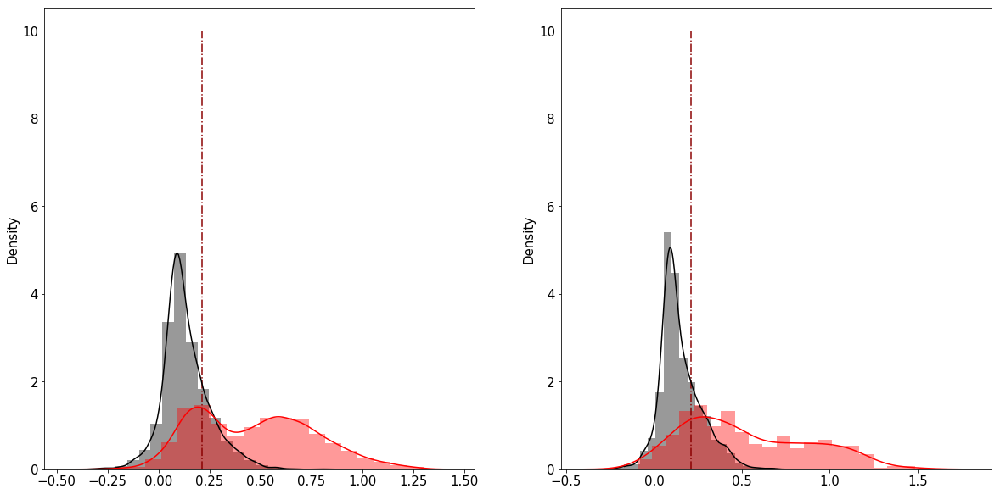

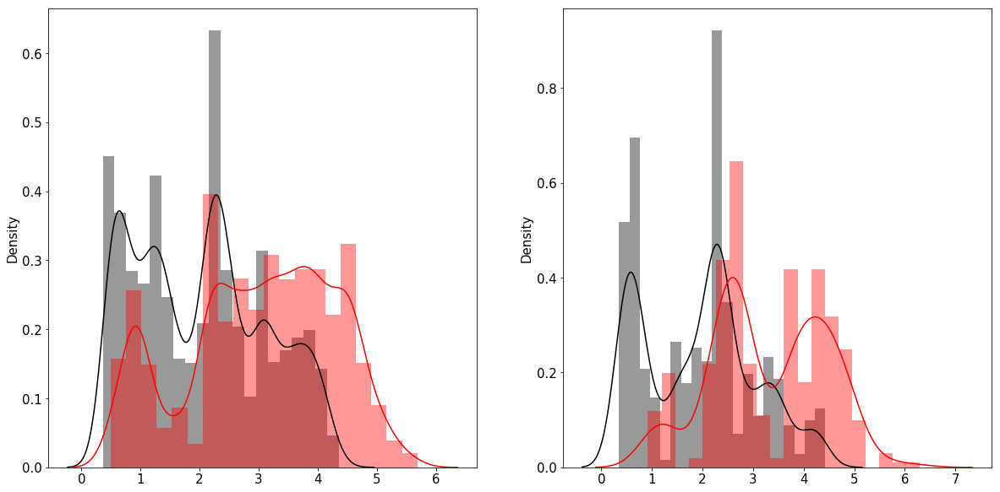

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.33661814109742444
Recall: 0.33661814109742444
Precision: 0.47095188171421104
F1-score: 0.37249791247664815

------------Scores on Test-------------
Accuracy: 0.21475409836065573
Recall: 0.21475409836065573
Precision: 0.3028363859355904
F1-score: 0.2357979714062453

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4270/4270 [00:00<00:00, 7136.54it/s]

------------Scores on Train-------------
Accuracy: 0.9360582306830907
Recall: 0.9360582306830907
Precision: 0.9376863851055323
F1-score: 0.936419205942952

------------Scores on Test-------------
Accuracy: 0.8241217798594848
Recall: 0.8241217798594848
Precision: 0.8315204999195623
F1-score: 0.8249600627374929

------------Scores on Train-------------
Accuracy: 0.003202427102646216
Recall: 0.003202427102646216
Precision: 0.00017977071202844296
F1-score: 0.00034043106406375103

------------Scores on Test-------------
Accuracy: 0.0017878426698450535
Recall: 0.0017878426698450535
Precision: 0.0001156839374605623
F1-score: 0.00021730684384857002




100%|███████████████████████████████████████████████████████████████████████████| 3356/3356 [00:00<00:00, 11602.84it/s]

------------Scores on Train-------------
Accuracy: 0.9015675037923478
Recall: 0.9015675037923478
Precision: 0.9042318277946053
F1-score: 0.9021329558617676

------------Scores on Test-------------
Accuracy: 0.7723480333730631
Recall: 0.7723480333730631
Precision: 0.7855784540134945
F1-score: 0.7736927848260153



 28%|█████████████████████▎                                                      | 28/100 [1:48:35<4:43:48, 236.51s/it]

----------------- iSimul = 28-----------------------

Normal observations in train set 5544
Outlier observations in train set 5544 

Normal observations in test set 2010
Outlier observations in test set 402
-------------------Scores on Train set-------------------
Accuracy :  0.7643
Precision :  0.7810
Recall :  0.7347
F1-score: 0.7571


-------------------Scores on Test set-------------------
Accuracy :  0.7637
Precision :  0.4050
Recall :  0.8905
F1-score: 0.5568




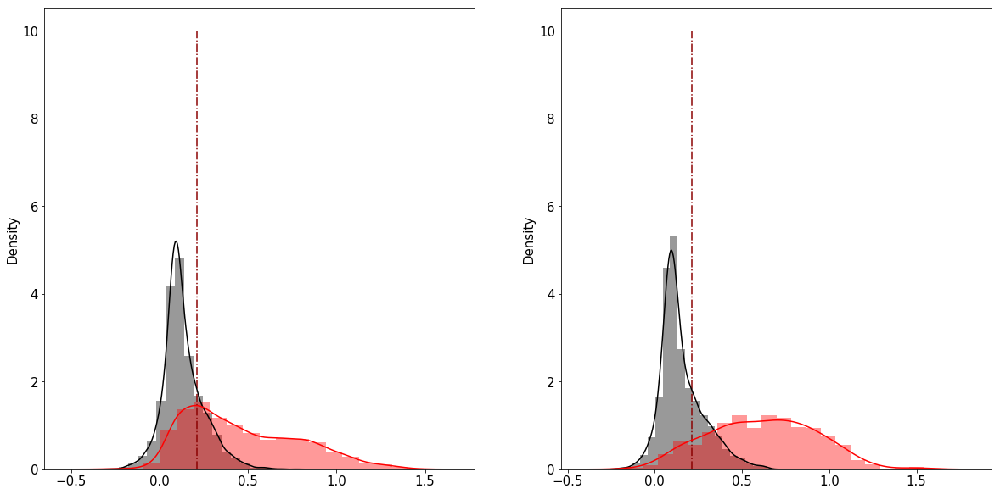

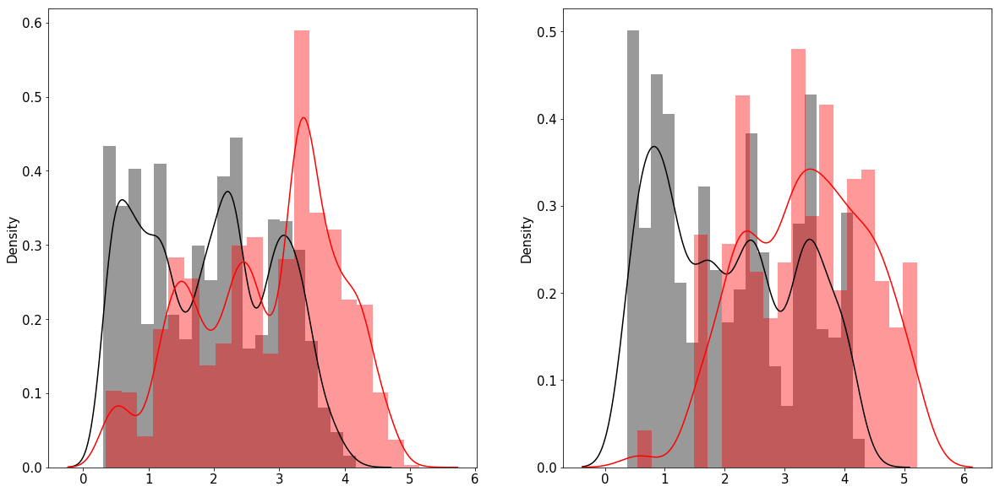

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.23006942781900885
Recall: 0.23006942781900885
Precision: 0.3447297949372608
F1-score: 0.2636836712551249

------------Scores on Test-------------
Accuracy: 0.30048426150121066
Recall: 0.30048426150121066
Precision: 0.3939047487216929
F1-score: 0.31961303441742256

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4130/4130 [00:00<00:00, 8694.07it/s]

------------Scores on Train-------------
Accuracy: 0.897294709121379
Recall: 0.897294709121379
Precision: 0.9000418797709787
F1-score: 0.8979105082438159

------------Scores on Test-------------
Accuracy: 0.9266343825665859
Recall: 0.9266343825665859
Precision: 0.9306554717683937
F1-score: 0.9275623151994336

------------Scores on Train-------------
Accuracy: 0.0013981668479105174
Recall: 0.0013981668479105174
Precision: 7.017148546602346e-05
F1-score: 0.00013363601891617848

------------Scores on Test-------------
Accuracy: 0.0038049117952265654
Recall: 0.0038049117952265654
Precision: 0.0002596824073893502
F1-score: 0.0004861831738345056




100%|███████████████████████████████████████████████████████████████████████████| 2891/2891 [00:00<00:00, 10812.54it/s]

------------Scores on Train-------------
Accuracy: 0.8653099269846202
Recall: 0.8653099269846202
Precision: 0.8693410191567245
F1-score: 0.8661813167480841

------------Scores on Test-------------
Accuracy: 0.8938083708059495
Recall: 0.8938083708059495
Precision: 0.9004647586558353
F1-score: 0.8951627784262137



 29%|██████████████████████                                                      | 29/100 [1:52:19<4:35:45, 233.03s/it]

----------------- iSimul = 29-----------------------

Normal observations in train set 5290
Outlier observations in train set 5290 

Normal observations in test set 1887
Outlier observations in test set 377
-------------------Scores on Train set-------------------
Accuracy :  0.7924
Precision :  0.7770
Recall :  0.8202
F1-score: 0.7981


-------------------Scores on Test set-------------------
Accuracy :  0.7323
Precision :  0.3571
Recall :  0.7586
F1-score: 0.4856




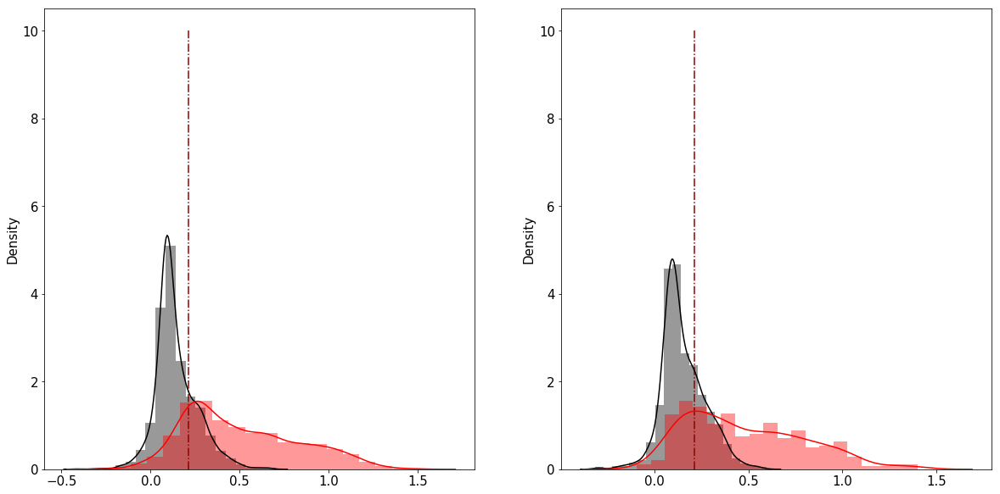

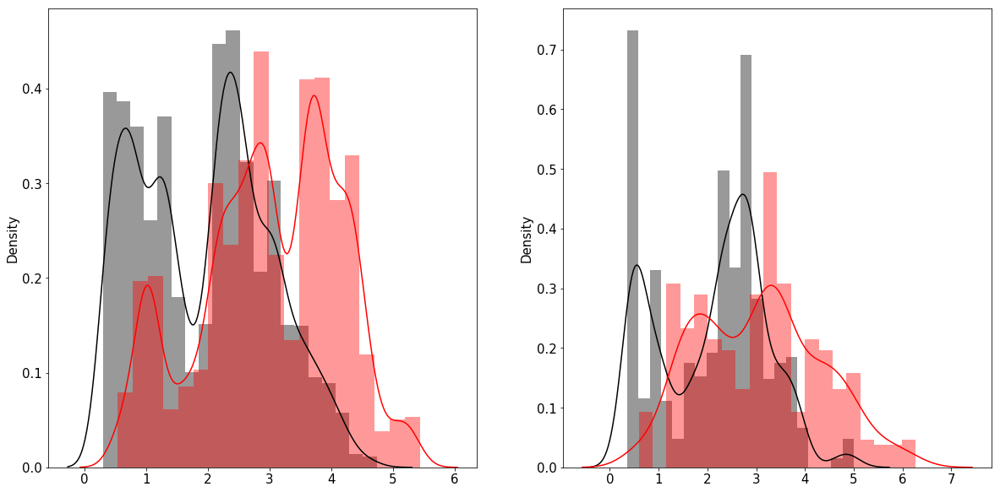

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3328694038506147
Recall: 0.3328694038506147
Precision: 0.4937733064270012
F1-score: 0.3739444359295636

------------Scores on Test-------------
Accuracy: 0.26122736891605924
Recall: 0.26122736891605924
Precision: 0.3835897406053881
F1-score: 0.2963907938279679

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4253/4253 [00:00<00:00, 10050.56it/s]

------------Scores on Train-------------
Accuracy: 0.8755509162607283
Recall: 0.8755509162607283
Precision: 0.8797252565153493
F1-score: 0.8764820888212282

------------Scores on Test-------------
Accuracy: 0.835410298612744
Recall: 0.835410298612744
Precision: 0.8428120646659787
F1-score: 0.8373394471187598

------------Scores on Train-------------
Accuracy: 0.0031233732431025507
Recall: 0.0031233732431025507
Precision: 0.0001700403771316575
F1-score: 0.0003225222370595025

------------Scores on Test-------------
Accuracy: 0.001589319771137953
Recall: 0.001589319771137953
Precision: 9.933248569612206e-05
F1-score: 0.00018697879660446506




100%|███████████████████████████████████████████████████████████████████████████| 3146/3146 [00:00<00:00, 10930.32it/s]

------------Scores on Train-------------
Accuracy: 0.8228353288217942
Recall: 0.8228353288217942
Precision: 0.8325900607168846
F1-score: 0.8247093933532956

------------Scores on Test-------------
Accuracy: 0.7803560076287349
Recall: 0.7803560076287349
Precision: 0.792313914085365
F1-score: 0.7835678823253621



 30%|██████████████████████▊                                                     | 30/100 [1:55:57<4:26:27, 228.39s/it]

----------------- iSimul = 30-----------------------

Normal observations in train set 6406
Outlier observations in train set 6406 

Normal observations in test set 1892
Outlier observations in test set 378
-------------------Scores on Train set-------------------
Accuracy :  0.8355
Precision :  0.8011
Recall :  0.8926
F1-score: 0.8444


-------------------Scores on Test set-------------------
Accuracy :  0.7819
Precision :  0.4255
Recall :  0.8836
F1-score: 0.5744




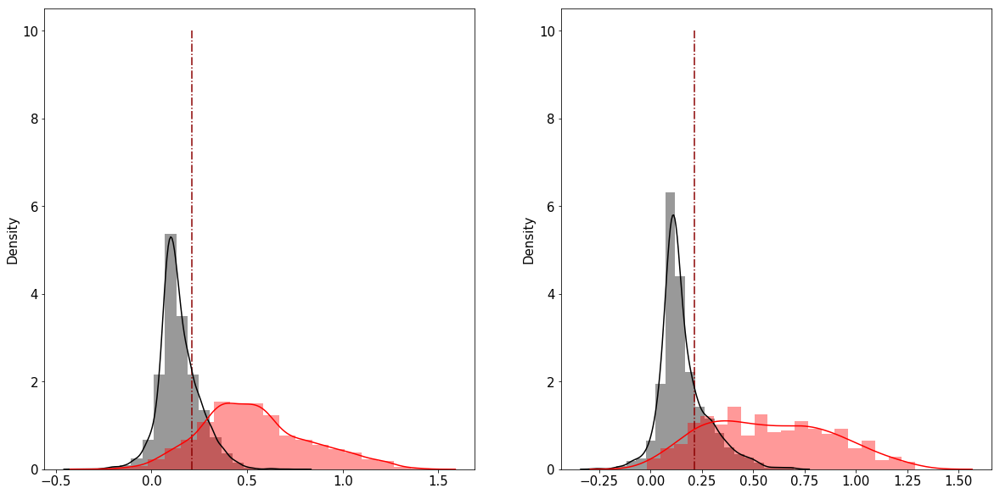

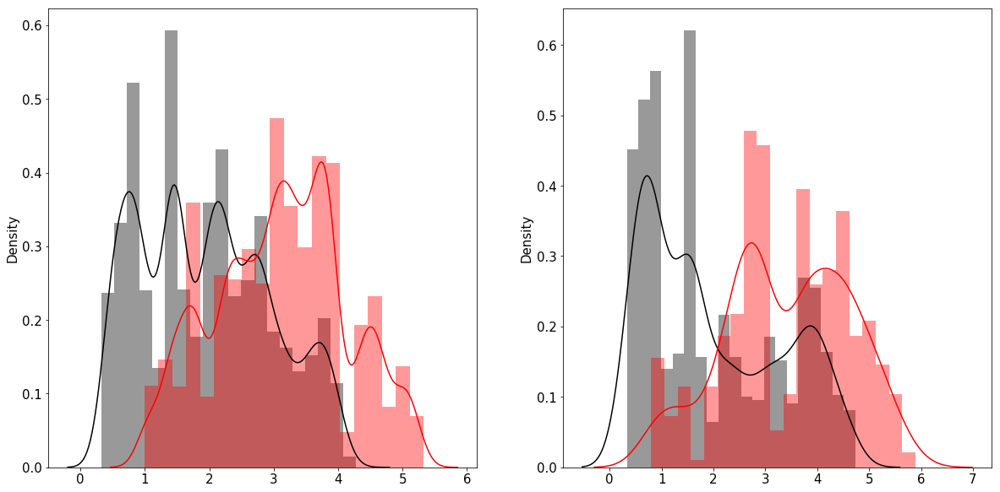

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.38954375260019414
Recall: 0.38954375260019414
Precision: 0.4807263058056227
F1-score: 0.4181101358058088

------------Scores on Test-------------
Accuracy: 0.3321563088512241
Recall: 0.3321563088512241
Precision: 0.4990389406325306
F1-score: 0.3735188893323272

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4248/4248 [00:00<00:00, 9753.57it/s]

------------Scores on Train-------------
Accuracy: 0.9725419497989183
Recall: 0.9725419497989183
Precision: 0.9735668448217419
F1-score: 0.9727354283541839

------------Scores on Test-------------
Accuracy: 0.966337099811676
Recall: 0.966337099811676
Precision: 0.9673194007117332
F1-score: 0.9663404756245304

------------Scores on Train-------------
Accuracy: 0.004302536231884058
Recall: 0.004302536231884058
Precision: 0.0003133285710608284
F1-score: 0.0005841191573087627

------------Scores on Test-------------
Accuracy: 0.0028149190710767065
Recall: 0.0028149190710767065
Precision: 0.00014965392529774896
F1-score: 0.00028419856006062905




100%|███████████████████████████████████████████████████████████████████████████| 2842/2842 [00:00<00:00, 11770.70it/s]

------------Scores on Train-------------
Accuracy: 0.9565217391304348
Recall: 0.9565217391304348
Precision: 0.9581066977242513
F1-score: 0.9567228618752771

------------Scores on Test-------------
Accuracy: 0.9609429978888107
Recall: 0.9609429978888107
Precision: 0.963375820834839
F1-score: 0.9609277199315411



 31%|███████████████████████▌                                                    | 31/100 [1:59:29<4:16:54, 223.40s/it]

----------------- iSimul = 31-----------------------

Normal observations in train set 5725
Outlier observations in train set 5725 

Normal observations in test set 1960
Outlier observations in test set 392
-------------------Scores on Train set-------------------
Accuracy :  0.7798
Precision :  0.7680
Recall :  0.8019
F1-score: 0.7846


-------------------Scores on Test set-------------------
Accuracy :  0.7640
Precision :  0.4019
Recall :  0.8520
F1-score: 0.5462




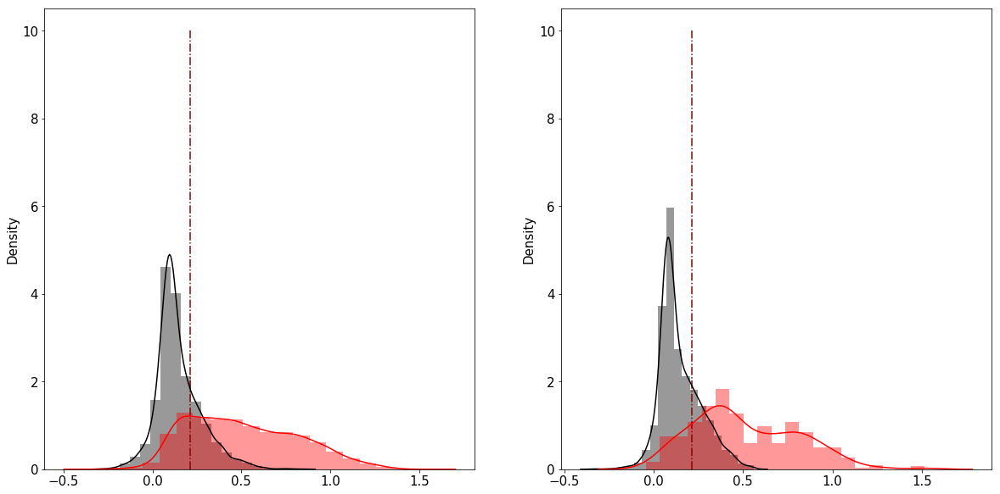

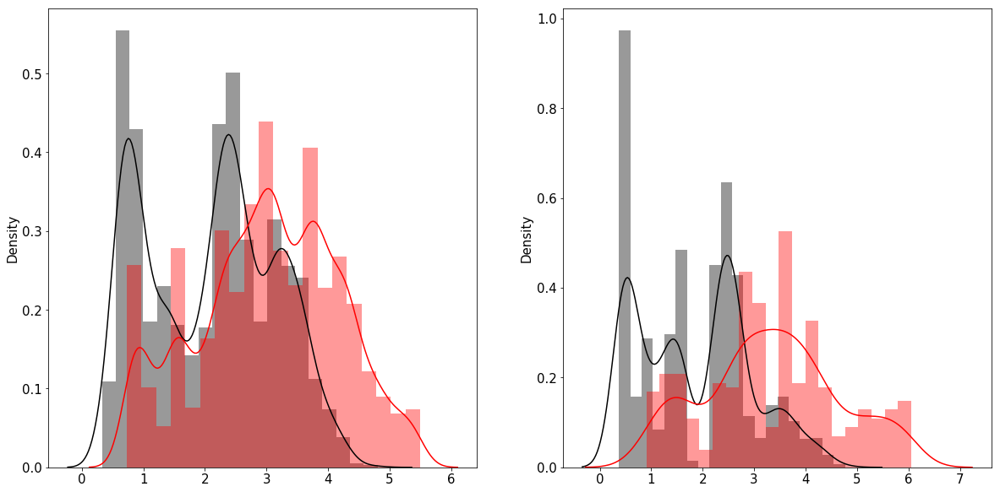

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.31297709923664124
Recall: 0.31297709923664124
Precision: 0.4347750964136673
F1-score: 0.3404495697199452

------------Scores on Test-------------
Accuracy: 0.39976076555023926
Recall: 0.39976076555023926
Precision: 0.5266336590432494
F1-score: 0.4439678675990242

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4180/4180 [00:00<00:00, 10816.06it/s]

------------Scores on Train-------------
Accuracy: 0.9443673374971084
Recall: 0.9443673374971084
Precision: 0.9456157180998908
F1-score: 0.9446047573185244

------------Scores on Test-------------
Accuracy: 0.8954545454545455
Recall: 0.8954545454545455
Precision: 0.8986122785715404
F1-score: 0.895630425541932

------------Scores on Train-------------
Accuracy: 0.002689527651706169
Recall: 0.002689527651706169
Precision: 0.00012015071983567079
F1-score: 0.00023002539126434346

------------Scores on Test-------------
Accuracy: 0.0027844073190135244
Recall: 0.0027844073190135244
Precision: 0.0001873301560192585
F1-score: 0.00035104275655184827




100%|███████████████████████████████████████████████████████████████████████████| 2514/2514 [00:00<00:00, 12016.69it/s]

------------Scores on Train-------------
Accuracy: 0.91880988401412
Recall: 0.91880988401412
Precision: 0.922303563216756
F1-score: 0.9195319688394569

------------Scores on Test-------------
Accuracy: 0.8273667462211615
Recall: 0.8273667462211615
Precision: 0.8325065775485839
F1-score: 0.8260133356728863



 32%|████████████████████████▎                                                   | 32/100 [2:03:09<4:12:08, 222.47s/it]

----------------- iSimul = 32-----------------------

Normal observations in train set 6470
Outlier observations in train set 6470 

Normal observations in test set 1966
Outlier observations in test set 393
-------------------Scores on Train set-------------------
Accuracy :  0.7461
Precision :  0.7836
Recall :  0.6799
F1-score: 0.7281


-------------------Scores on Test set-------------------
Accuracy :  0.7630
Precision :  0.3674
Recall :  0.5852
F1-score: 0.4514




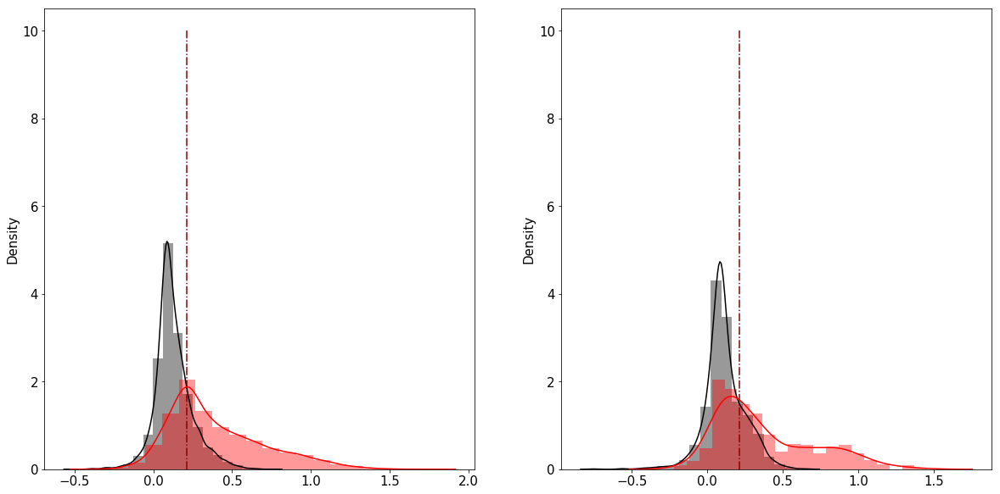

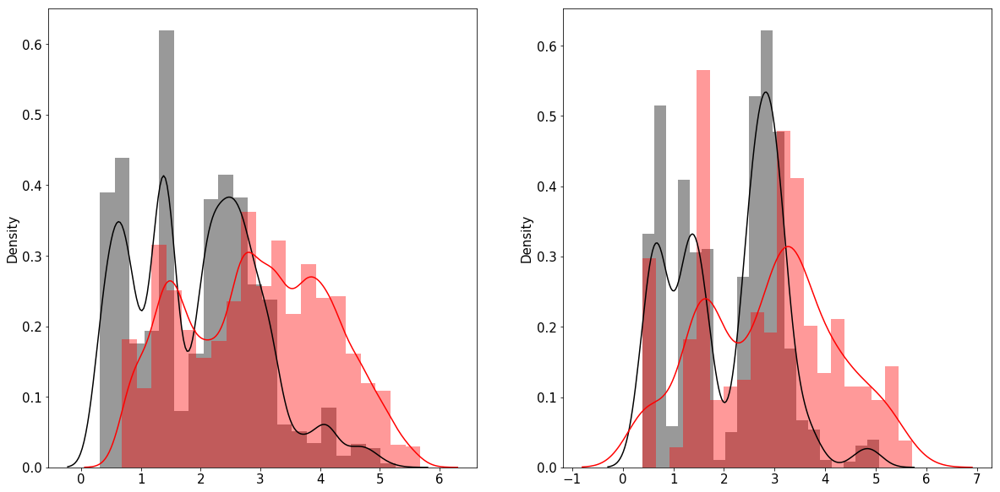

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.23695937090432503
Recall: 0.23695937090432503
Precision: 0.3779747709022758
F1-score: 0.2750713768615541

------------Scores on Test-------------
Accuracy: 0.1631528509822712
Recall: 0.1631528509822712
Precision: 0.22307010318015452
F1-score: 0.18016509044799037

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4174/4174 [00:00<00:00, 12158.30it/s]

------------Scores on Train-------------
Accuracy: 0.752948885976409
Recall: 0.752948885976409
Precision: 0.7693463944881199
F1-score: 0.7574953164883136

------------Scores on Test-------------
Accuracy: 0.7798275035936751
Recall: 0.7798275035936751
Precision: 0.8006159763878707
F1-score: 0.7802230226229045

------------Scores on Train-------------
Accuracy: 0.0020593787540758536
Recall: 0.0020593787540758536
Precision: 0.0001102278445393081
F1-score: 0.0002092553380845353

------------Scores on Test-------------
Accuracy: 0.0014310246136233543
Recall: 0.0014310246136233543
Precision: 8.440359651397801e-05
F1-score: 0.00015940527341627234




100%|███████████████████████████████████████████████████████████████████████████| 3494/3494 [00:00<00:00, 10055.99it/s]

------------Scores on Train-------------
Accuracy: 0.6715290887249014
Recall: 0.6715290887249014
Precision: 0.6931460439689155
F1-score: 0.6771814012778066

------------Scores on Test-------------
Accuracy: 0.7349742415569548
Recall: 0.7349742415569548
Precision: 0.7676699411469053
F1-score: 0.7350260736928048



 33%|█████████████████████████                                                   | 33/100 [2:06:44<4:05:45, 220.07s/it]

----------------- iSimul = 33-----------------------

Normal observations in train set 6141
Outlier observations in train set 6141 

Normal observations in test set 1699
Outlier observations in test set 339
-------------------Scores on Train set-------------------
Accuracy :  0.8194
Precision :  0.8160
Recall :  0.8248
F1-score: 0.8204


-------------------Scores on Test set-------------------
Accuracy :  0.7836
Precision :  0.4250
Recall :  0.8525
F1-score: 0.5672




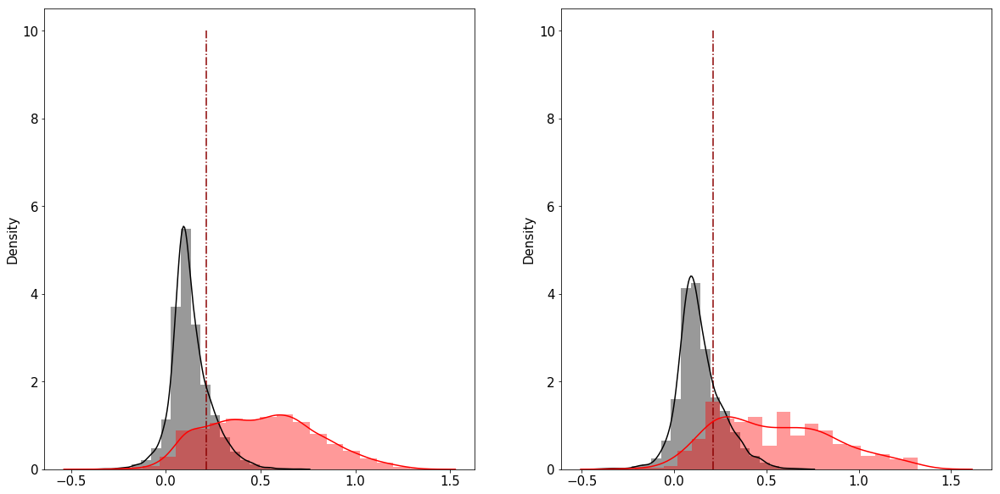

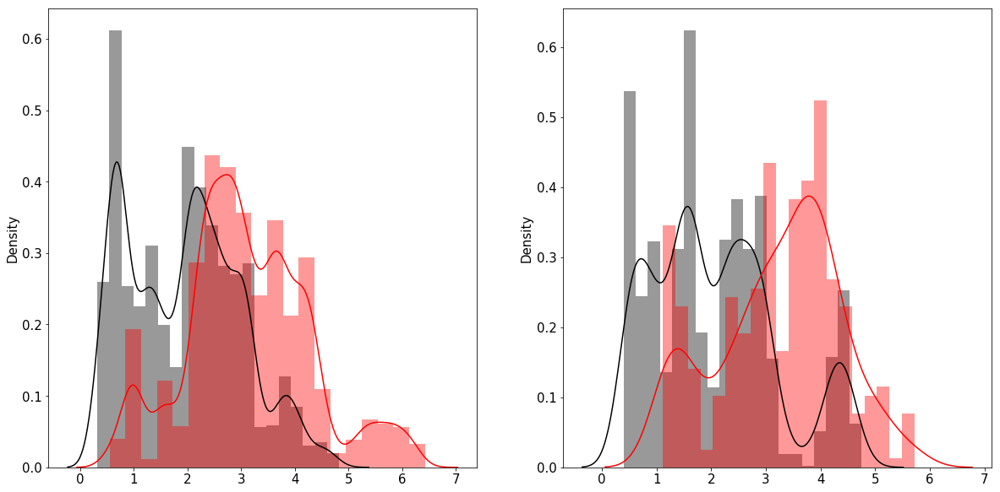

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.23847356082313104
Recall: 0.23847356082313104
Precision: 0.3492511655975747
F1-score: 0.26862816125144395

------------Scores on Test-------------
Accuracy: 0.34113938302184194
Recall: 0.34113938302184194
Precision: 0.4339538706822932
F1-score: 0.36430131343142713

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4441/4441 [00:00<00:00, 10175.42it/s]

------------Scores on Train-------------
Accuracy: 0.8926803855170617
Recall: 0.8926803855170617
Precision: 0.8964547978797491
F1-score: 0.8936483050265587

------------Scores on Test-------------
Accuracy: 0.9367259626210312
Recall: 0.9367259626210312
Precision: 0.9372896174340435
F1-score: 0.9366717225309853

------------Scores on Train-------------
Accuracy: 0.0018800205093146471
Recall: 0.0018800205093146471
Precision: 0.00010559019298890484
F1-score: 0.00019995030060155781

------------Scores on Test-------------
Accuracy: 0.0030748206354629312
Recall: 0.0030748206354629312
Precision: 0.00020739259418078423
F1-score: 0.00038857623415190887




100%|████████████████████████████████████████████████████████████████████████████| 2927/2927 [00:00<00:00, 9483.76it/s]

------------Scores on Train-------------
Accuracy: 0.8596821056229704
Recall: 0.8596821056229704
Precision: 0.8649952351831495
F1-score: 0.8608185136733949

------------Scores on Test-------------
Accuracy: 0.910830201571575
Recall: 0.910830201571575
Precision: 0.9116443581499625
F1-score: 0.9107712003489473



 34%|█████████████████████████▊                                                  | 34/100 [2:10:11<3:57:51, 216.24s/it]

----------------- iSimul = 34-----------------------

Normal observations in train set 4885
Outlier observations in train set 4885 

Normal observations in test set 1851
Outlier observations in test set 370
-------------------Scores on Train set-------------------
Accuracy :  0.7929
Precision :  0.8022
Recall :  0.7777
F1-score: 0.7897


-------------------Scores on Test set-------------------
Accuracy :  0.8181
Precision :  0.4737
Recall :  0.8270
F1-score: 0.6024




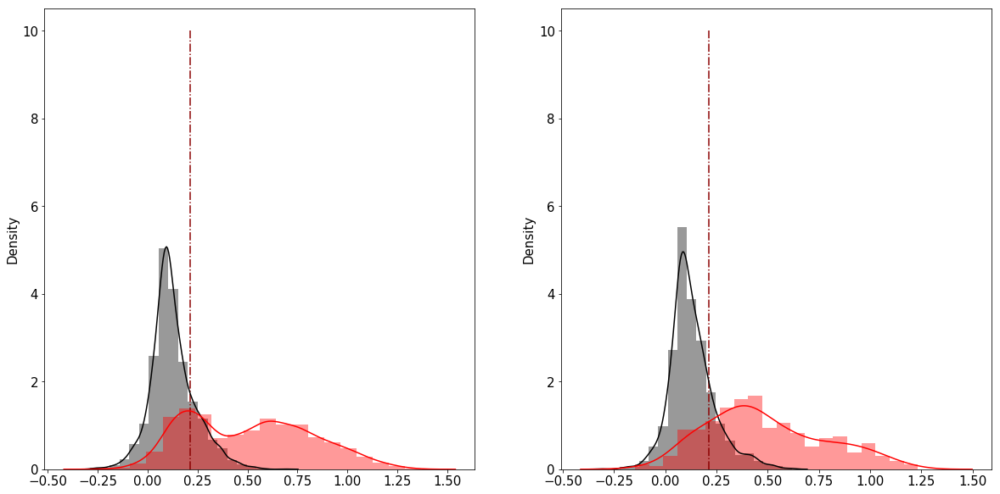

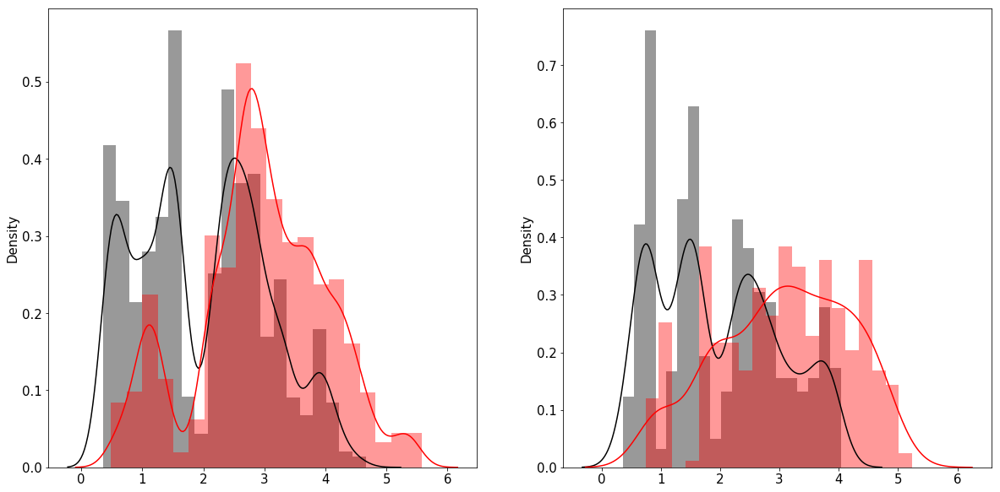

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.32680804785209355
Recall: 0.32680804785209355
Precision: 0.46073497383361167
F1-score: 0.3639735464677947

------------Scores on Test-------------
Accuracy: 0.2691029900332226
Recall: 0.2691029900332226
Precision: 0.3516083139286871
F1-score: 0.28268179107851377

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4214/4214 [00:00<00:00, 10385.80it/s]

------------Scores on Train-------------
Accuracy: 0.8999456226209896
Recall: 0.8999456226209896
Precision: 0.901981612633708
F1-score: 0.9004451445876442

------------Scores on Test-------------
Accuracy: 0.9302325581395349
Recall: 0.9302325581395349
Precision: 0.933739891060572
F1-score: 0.9305816160531669

------------Scores on Train-------------
Accuracy: 0.0027428202646014844
Recall: 0.0027428202646014844
Precision: 0.0001404773502996919
F1-score: 0.00026726628644107035

------------Scores on Test-------------
Accuracy: 0.002917341977309562
Recall: 0.002917341977309562
Precision: 0.0002362636108384505
F1-score: 0.00043712615946657935




100%|████████████████████████████████████████████████████████████████████████████| 3085/3085 [00:00<00:00, 9893.45it/s]

------------Scores on Train-------------
Accuracy: 0.8525330751855438
Recall: 0.8525330751855438
Precision: 0.8564722637631845
F1-score: 0.8534510409469139

------------Scores on Test-------------
Accuracy: 0.9056726094003241
Recall: 0.9056726094003241
Precision: 0.9130649516853485
F1-score: 0.9067507461455737



 35%|██████████████████████████▌                                                 | 35/100 [2:13:45<3:53:25, 215.47s/it]

----------------- iSimul = 35-----------------------

Normal observations in train set 5728
Outlier observations in train set 5728 

Normal observations in test set 1808
Outlier observations in test set 361
-------------------Scores on Train set-------------------
Accuracy :  0.7781
Precision :  0.7663
Recall :  0.8003
F1-score: 0.7829


-------------------Scores on Test set-------------------
Accuracy :  0.7967
Precision :  0.4390
Recall :  0.7978
F1-score: 0.5664




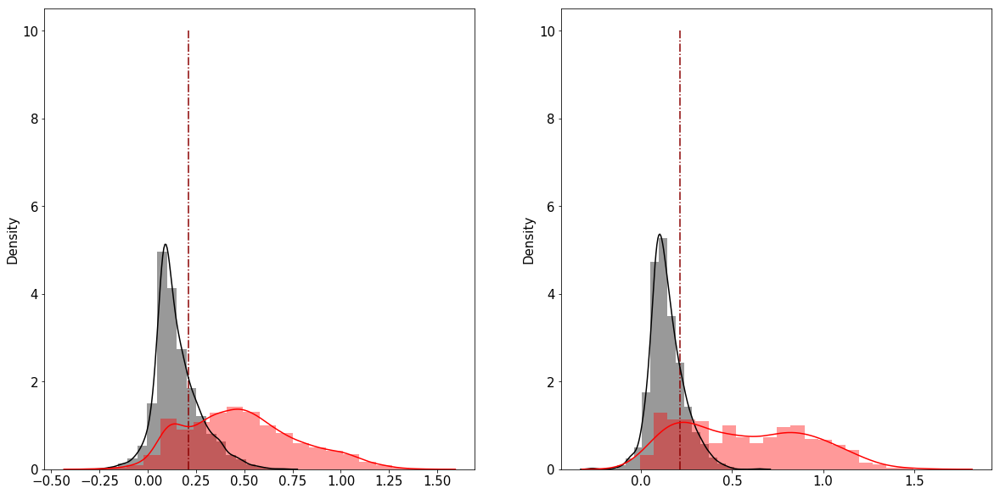

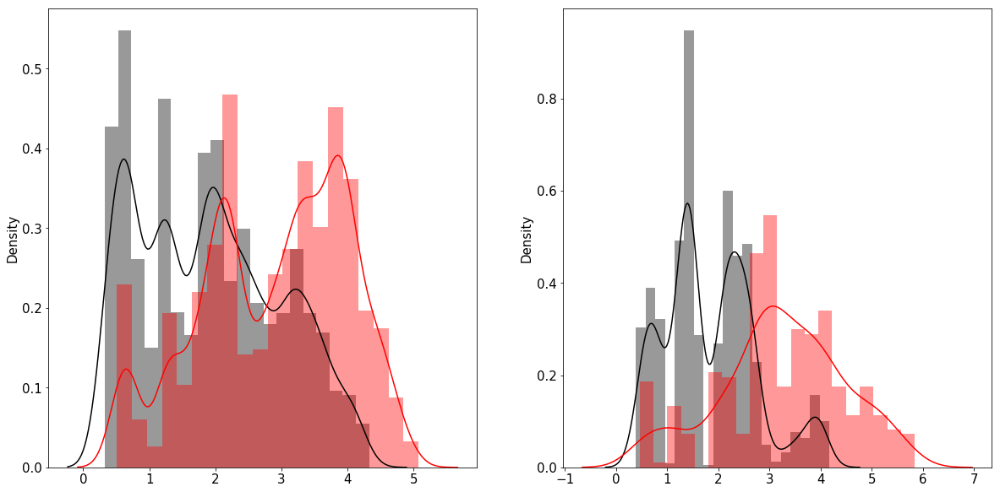

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.37636688239232313
Recall: 0.37636688239232313
Precision: 0.44669554293633434
F1-score: 0.39797879782923096

------------Scores on Test-------------
Accuracy: 0.2982456140350877
Recall: 0.2982456140350877
Precision: 0.41497273296252124
F1-score: 0.32900445696356395

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4332/4332 [00:00<00:00, 11785.80it/s]

------------Scores on Train-------------
Accuracy: 0.9370676188350815
Recall: 0.9370676188350815
Precision: 0.9385539973281425
F1-score: 0.9372752866698874

------------Scores on Test-------------
Accuracy: 0.8776546629732225
Recall: 0.8776546629732225
Precision: 0.8829017795539871
F1-score: 0.8789551543258859

------------Scores on Train-------------
Accuracy: 0.0033928571428571428
Recall: 0.0033928571428571428
Precision: 0.000327193770589997
F1-score: 0.0005968314668123463

------------Scores on Test-------------
Accuracy: 0.0026289845547157412
Recall: 0.0026289845547157412
Precision: 0.00017226964318650155
F1-score: 0.0003233510414891019




100%|███████████████████████████████████████████████████████████████████████████| 3043/3043 [00:00<00:00, 11236.93it/s]

------------Scores on Train-------------
Accuracy: 0.9001785714285714
Recall: 0.9001785714285714
Precision: 0.9040314389396713
F1-score: 0.9006970994859502

------------Scores on Test-------------
Accuracy: 0.8314163654288531
Recall: 0.8314163654288531
Precision: 0.8387796953208237
F1-score: 0.8330894698714255



 36%|███████████████████████████▎                                                | 36/100 [2:17:29<3:52:46, 218.23s/it]

----------------- iSimul = 36-----------------------

Normal observations in train set 6352
Outlier observations in train set 6352 

Normal observations in test set 2161
Outlier observations in test set 432
-------------------Scores on Train set-------------------
Accuracy :  0.8016
Precision :  0.7739
Recall :  0.8522
F1-score: 0.8112


-------------------Scores on Test set-------------------
Accuracy :  0.8411
Precision :  0.5137
Recall :  0.8681
F1-score: 0.6454




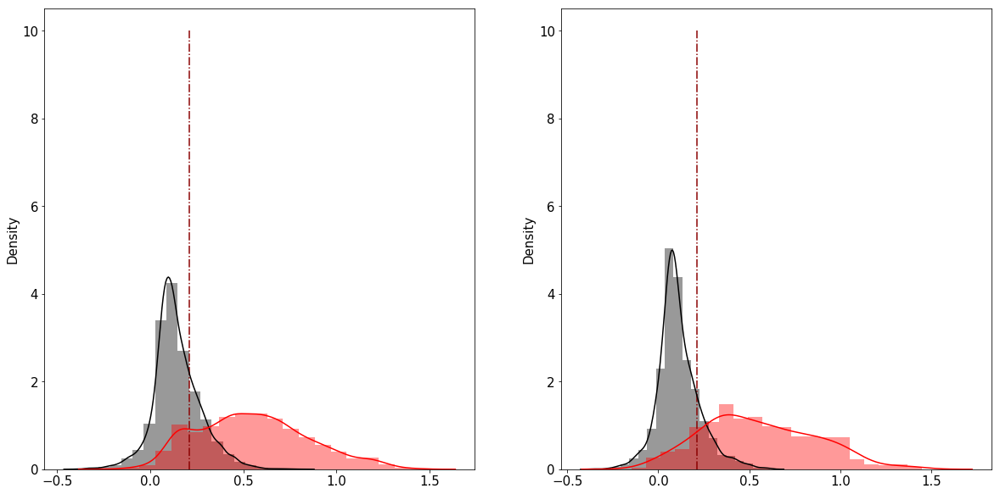

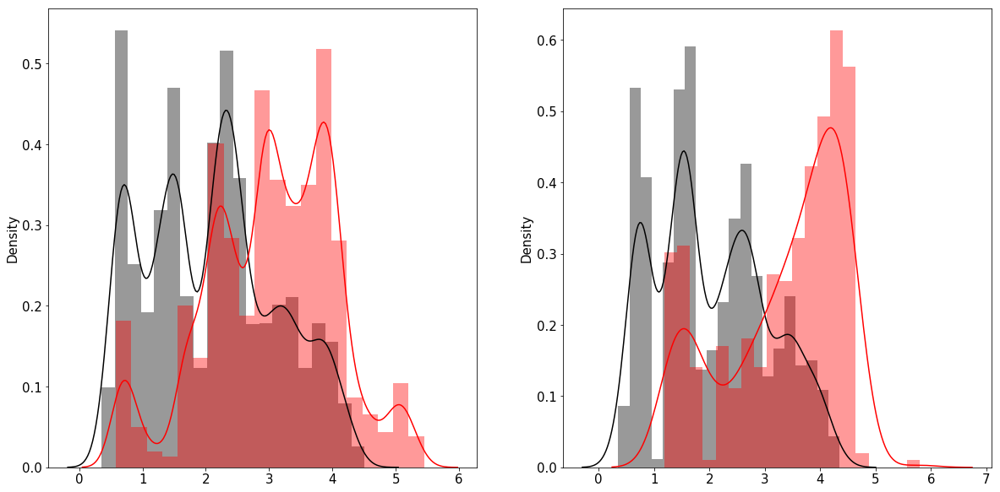

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2987535182951347
Recall: 0.2987535182951347
Precision: 0.4299815251024334
F1-score: 0.330351245164802

------------Scores on Test-------------
Accuracy: 0.3277205327971852
Recall: 0.3277205327971852
Precision: 0.3936898026135768
F1-score: 0.345779671172045

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 3979/3979 [00:00<00:00, 11822.92it/s]

------------Scores on Train-------------
Accuracy: 0.978555153464683
Recall: 0.978555153464683
Precision: 0.9790875889574928
F1-score: 0.9785661446091947

------------Scores on Test-------------
Accuracy: 0.9243528524754964
Recall: 0.9243528524754964
Precision: 0.9290527663557776
F1-score: 0.925298246898975

------------Scores on Train-------------
Accuracy: 0.0030557677616501145
Recall: 0.0030557677616501145
Precision: 0.00014139799411234464
F1-score: 0.0002702890403425163

------------Scores on Test-------------
Accuracy: 0.0037285607755406414
Recall: 0.0037285607755406414
Precision: 0.0003096382650968007
F1-score: 0.0005717920678145393




100%|███████████████████████████████████████████████████████████████████████████| 2682/2682 [00:00<00:00, 11864.59it/s]

------------Scores on Train-------------
Accuracy: 0.9677234530175707
Recall: 0.9677234530175707
Precision: 0.9685585520161517
F1-score: 0.9676724240744689

------------Scores on Test-------------
Accuracy: 0.8881431767337807
Recall: 0.8881431767337807
Precision: 0.8975224602494637
F1-score: 0.890403542545272



 37%|████████████████████████████                                                | 37/100 [2:20:53<3:44:36, 213.92s/it]

----------------- iSimul = 37-----------------------

Normal observations in train set 6615
Outlier observations in train set 6615 

Normal observations in test set 1768
Outlier observations in test set 353
-------------------Scores on Train set-------------------
Accuracy :  0.7741
Precision :  0.7861
Recall :  0.7531
F1-score: 0.7692


-------------------Scores on Test set-------------------
Accuracy :  0.7930
Precision :  0.4358
Recall :  0.8272
F1-score: 0.5709




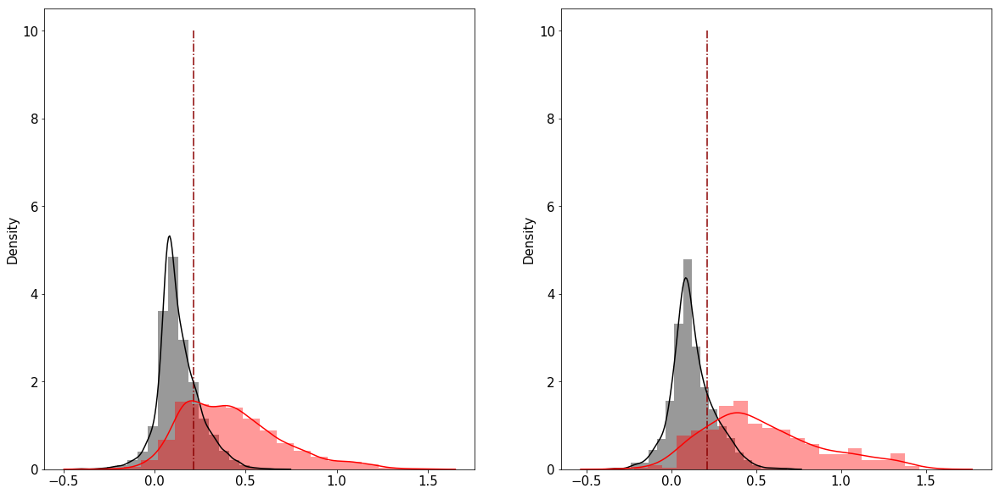

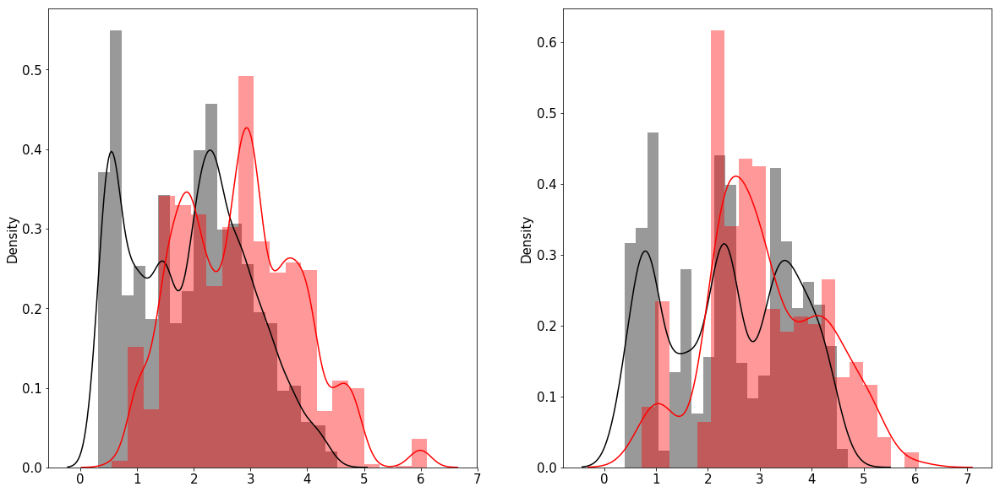

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2999856259882133
Recall: 0.2999856259882133
Precision: 0.4143523814831704
F1-score: 0.33013938583994923

------------Scores on Test-------------
Accuracy: 0.48444647758462944
Recall: 0.48444647758462944
Precision: 0.6324571074807913
F1-score: 0.5170073250895694

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4372/4372 [00:00<00:00, 12403.84it/s]

------------Scores on Train-------------
Accuracy: 0.8690527526232571
Recall: 0.8690527526232571
Precision: 0.8734614352558532
F1-score: 0.8699036295186073

------------Scores on Test-------------
Accuracy: 0.9519670631290027
Recall: 0.9519670631290027
Precision: 0.9530278001848153
F1-score: 0.9520654797813192

------------Scores on Train-------------
Accuracy: 0.003485749436128768
Recall: 0.003485749436128768
Precision: 0.0002645730122298875
F1-score: 0.0004918164989246937

------------Scores on Test-------------
Accuracy: 0.005742049469964664
Recall: 0.005742049469964664
Precision: 0.00040618999465987974
F1-score: 0.0007587092392746102




100%|███████████████████████████████████████████████████████████████████████████| 2264/2264 [00:00<00:00, 11754.13it/s]

------------Scores on Train-------------
Accuracy: 0.7828583145376256
Recall: 0.7828583145376256
Precision: 0.7928570071380973
F1-score: 0.7844592056889917

------------Scores on Test-------------
Accuracy: 0.926678445229682
Recall: 0.926678445229682
Precision: 0.9311721556435733
F1-score: 0.9270330290471974



 38%|████████████████████████████▉                                               | 38/100 [2:24:21<3:39:13, 212.15s/it]

----------------- iSimul = 38-----------------------

Normal observations in train set 6507
Outlier observations in train set 6507 

Normal observations in test set 2098
Outlier observations in test set 419
-------------------Scores on Train set-------------------
Accuracy :  0.8037
Precision :  0.7891
Recall :  0.8291
F1-score: 0.8086


-------------------Scores on Test set-------------------
Accuracy :  0.7894
Precision :  0.4311
Recall :  0.8282
F1-score: 0.5670




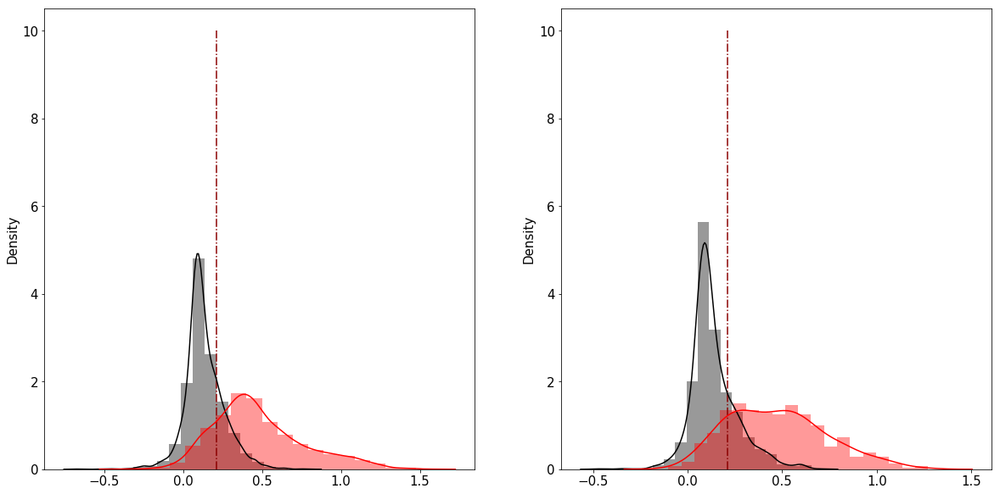

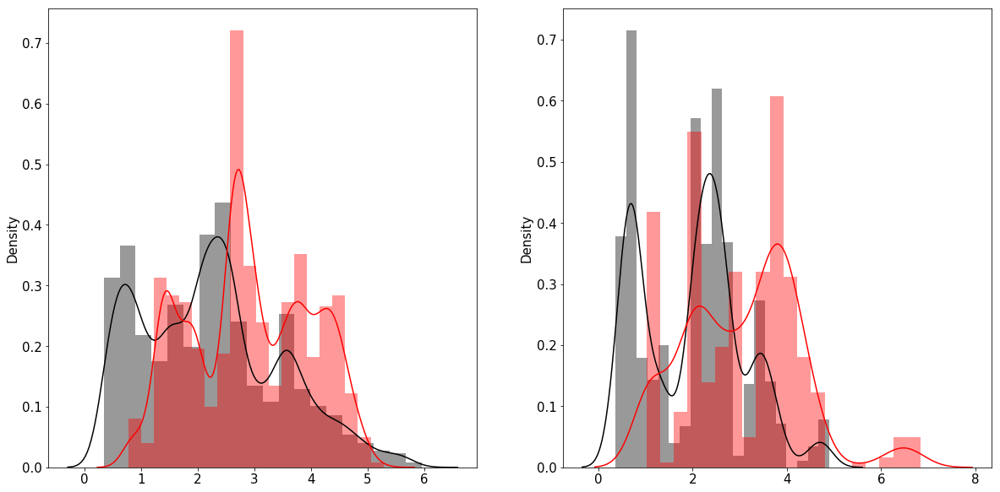

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2715635098185434
Recall: 0.2715635098185434
Precision: 0.4157954518364689
F1-score: 0.30389933731621355

------------Scores on Test-------------
Accuracy: 0.13805047006432458
Recall: 0.13805047006432458
Precision: 0.16665125391122634
F1-score: 0.14064959618663894

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4042/4042 [00:00<00:00, 9587.48it/s]

------------Scores on Train-------------
Accuracy: 0.9117573949788715
Recall: 0.9117573949788715
Precision: 0.9130271771279116
F1-score: 0.9118314936894794

------------Scores on Test-------------
Accuracy: 0.9035131123206334
Recall: 0.9035131123206334
Precision: 0.9064968831715641
F1-score: 0.9042664214358606

------------Scores on Train-------------
Accuracy: 0.0028946024178443724
Recall: 0.0028946024178443724
Precision: 0.00015179012678940003
F1-score: 0.0002884540068767277

------------Scores on Test-------------
Accuracy: 0.0017201834862385322
Recall: 0.0017201834862385322
Precision: 0.00013964589187176273
F1-score: 0.0002583210696057864




100%|███████████████████████████████████████████████████████████████████████████| 3488/3488 [00:00<00:00, 12030.49it/s]

------------Scores on Train-------------
Accuracy: 0.8799591350246893
Recall: 0.8799591350246893
Precision: 0.8819998039849989
F1-score: 0.879945516941626

------------Scores on Test-------------
Accuracy: 0.8867545871559633
Recall: 0.8867545871559633
Precision: 0.8909614011587252
F1-score: 0.887782897622287



 39%|█████████████████████████████▋                                              | 39/100 [2:28:02<3:38:15, 214.68s/it]

----------------- iSimul = 39-----------------------

Normal observations in train set 6014
Outlier observations in train set 6014 

Normal observations in test set 1239
Outlier observations in test set 247
-------------------Scores on Train set-------------------
Accuracy :  0.7789
Precision :  0.7870
Recall :  0.7649
F1-score: 0.7758


-------------------Scores on Test set-------------------
Accuracy :  0.7833
Precision :  0.4113
Recall :  0.7045
F1-score: 0.5194




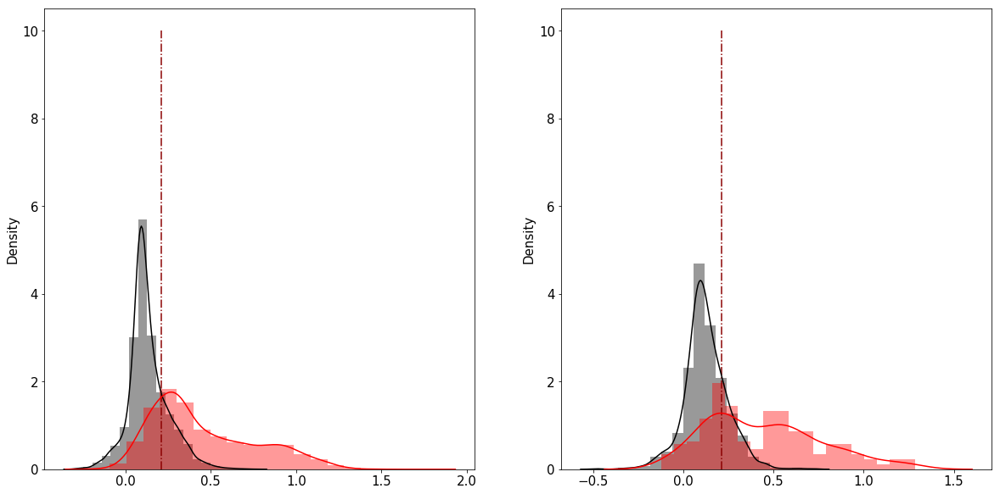

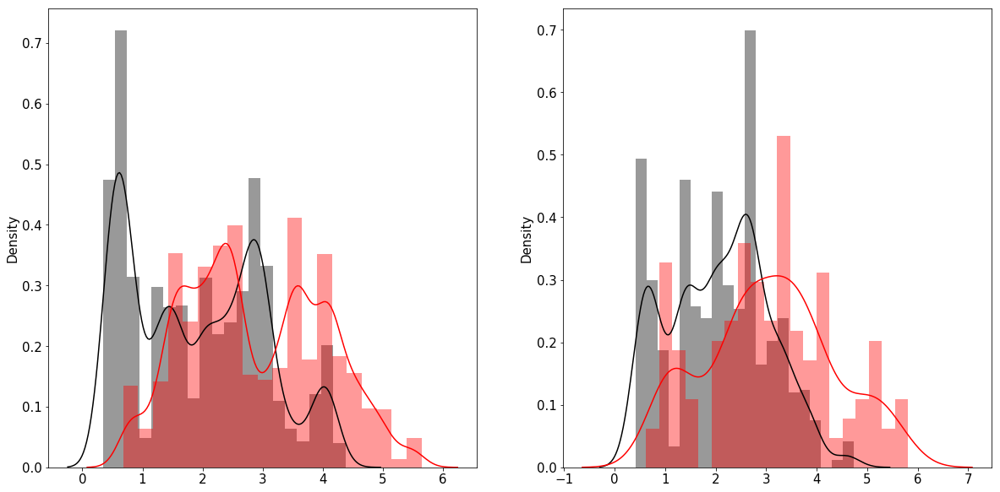

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3185129364481286
Recall: 0.3185129364481286
Precision: 0.4780344995803755
F1-score: 0.3617000051787224

------------Scores on Test-------------
Accuracy: 0.23546215058151398
Recall: 0.23546215058151398
Precision: 0.33185681457983657
F1-score: 0.2658361603712543

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4901/4901 [00:00<00:00, 12608.08it/s]

------------Scores on Train-------------
Accuracy: 0.8810600351670435
Recall: 0.8810600351670435
Precision: 0.8844107895851105
F1-score: 0.8819977855562379

------------Scores on Test-------------
Accuracy: 0.8583962456641502
Recall: 0.8583962456641502
Precision: 0.863251494376074
F1-score: 0.8592387993943973

------------Scores on Train-------------
Accuracy: 0.002579218865143699
Recall: 0.002579218865143699
Precision: 0.00014663197629825693
F1-score: 0.00027748837445683934

------------Scores on Test-------------
Accuracy: 0.0010669511869831954
Recall: 0.0010669511869831954
Precision: 6.119670149778928e-05
F1-score: 0.000115754138210441




100%|███████████████████████████████████████████████████████████████████████████| 3749/3749 [00:00<00:00, 12527.67it/s]

------------Scores on Train-------------
Accuracy: 0.8297715549005158
Recall: 0.8297715549005158
Precision: 0.8367696995763009
F1-score: 0.8317870290153812

------------Scores on Test-------------
Accuracy: 0.8146172312616697
Recall: 0.8146172312616697
Precision: 0.8231992671676381
F1-score: 0.8160247116588009



 40%|██████████████████████████████▍                                             | 40/100 [2:31:34<3:33:53, 213.89s/it]

----------------- iSimul = 40-----------------------

Normal observations in train set 6376
Outlier observations in train set 6376 

Normal observations in test set 1614
Outlier observations in test set 322
-------------------Scores on Train set-------------------
Accuracy :  0.7819
Precision :  0.7745
Recall :  0.7955
F1-score: 0.7848


-------------------Scores on Test set-------------------
Accuracy :  0.7268
Precision :  0.3596
Recall :  0.8230
F1-score: 0.5005




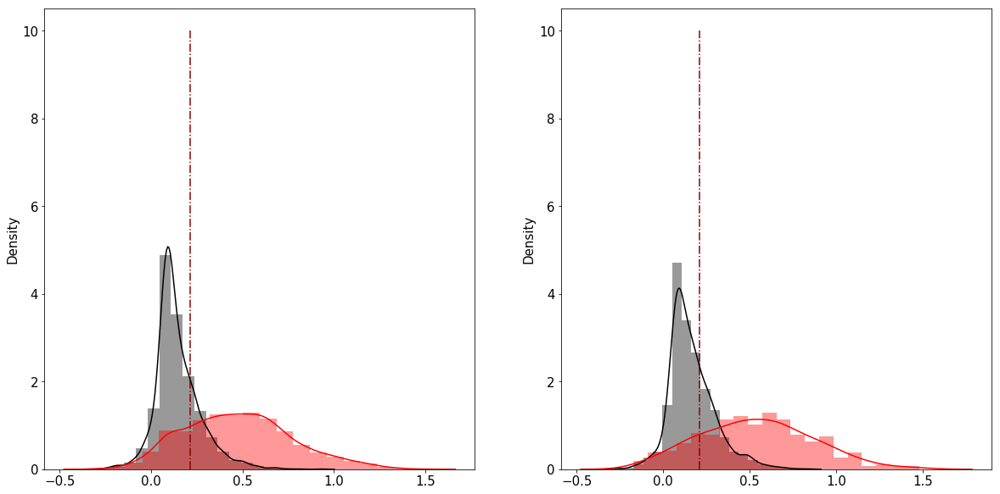

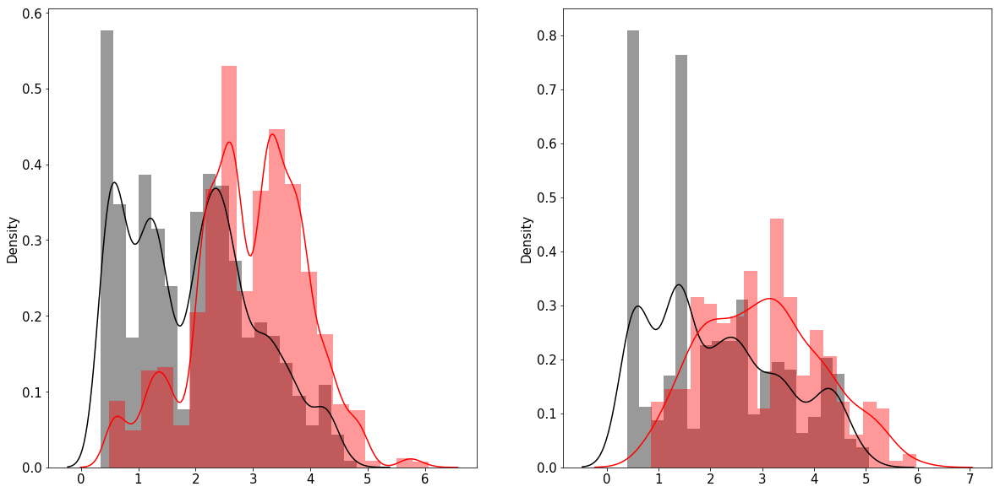

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.28237849579147434
Recall: 0.28237849579147434
Precision: 0.3329700357208063
F1-score: 0.2974745768935259

------------Scores on Test-------------
Accuracy: 0.28104286345558993
Recall: 0.28104286345558993
Precision: 0.40228070198309546
F1-score: 0.3152416310983953

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4526/4526 [00:00<00:00, 8787.50it/s]

------------Scores on Train-------------
Accuracy: 0.8289437958186261
Recall: 0.8289437958186261
Precision: 0.835748905495231
F1-score: 0.8307649220498146

------------Scores on Test-------------
Accuracy: 0.8767123287671232
Recall: 0.8767123287671232
Precision: 0.8795313969031779
F1-score: 0.8771970944717566

------------Scores on Train-------------
Accuracy: 0.002455610124669437
Recall: 0.002455610124669437
Precision: 0.0002319816016392786
F1-score: 0.00042391585310082915

------------Scores on Test-------------
Accuracy: 0.002456248081056187
Recall: 0.002456248081056187
Precision: 0.00012108265188305146
F1-score: 0.0002307884103005813




100%|████████████████████████████████████████████████████████████████████████████| 3257/3257 [00:00<00:00, 8614.91it/s]

------------Scores on Train-------------
Accuracy: 0.7708726860596902
Recall: 0.7708726860596902
Precision: 0.7808295336110613
F1-score: 0.7735623448876159

------------Scores on Test-------------
Accuracy: 0.828676696346331
Recall: 0.828676696346331
Precision: 0.8329461477152662
F1-score: 0.8292234309784017



 41%|███████████████████████████████▏                                            | 41/100 [2:34:59<3:27:46, 211.30s/it]

----------------- iSimul = 41-----------------------

Normal observations in train set 6009
Outlier observations in train set 6009 

Normal observations in test set 2208
Outlier observations in test set 441
-------------------Scores on Train set-------------------
Accuracy :  0.7570
Precision :  0.7674
Recall :  0.7376
F1-score: 0.7522


-------------------Scores on Test set-------------------
Accuracy :  0.7829
Precision :  0.4251
Recall :  0.8617
F1-score: 0.5693




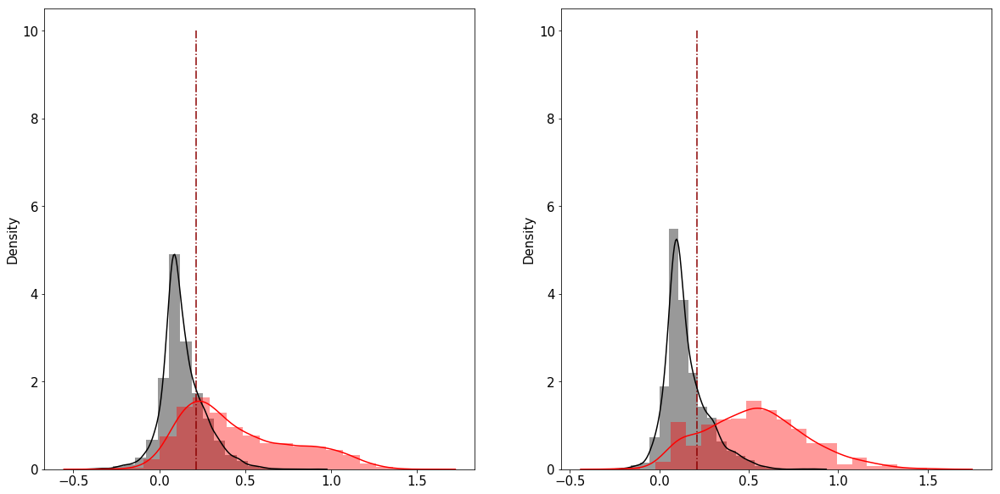

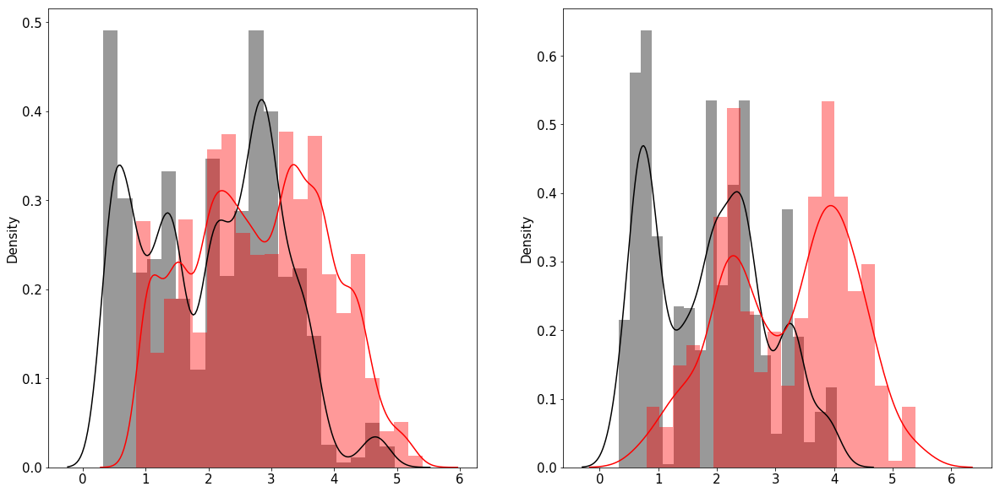

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.26864209624096974
Recall: 0.26864209624096974
Precision: 0.3628817497276141
F1-score: 0.29171012435989374

------------Scores on Test-------------
Accuracy: 0.41378433367243134
Recall: 0.41378433367243134
Precision: 0.5566288391850903
F1-score: 0.4515472715002821

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 3932/3932 [00:00<00:00, 9489.97it/s]

------------Scores on Train-------------
Accuracy: 0.8389861638300478
Recall: 0.8389861638300478
Precision: 0.845225289455542
F1-score: 0.8404960279875456

------------Scores on Test-------------
Accuracy: 0.9521871820956256
Recall: 0.9521871820956256
Precision: 0.9550129033723054
F1-score: 0.9529050166727855

------------Scores on Train-------------
Accuracy: 0.002841383921109811
Recall: 0.002841383921109811
Precision: 0.00017081633543328777
F1-score: 0.0003222593105546397

------------Scores on Test-------------
Accuracy: 0.004327131112072695
Recall: 0.004327131112072695
Precision: 0.0003552122554686541
F1-score: 0.0006565302376937883




100%|███████████████████████████████████████████████████████████████████████████| 2311/2311 [00:00<00:00, 11318.97it/s]

------------Scores on Train-------------
Accuracy: 0.7765335116162461
Recall: 0.7765335116162461
Precision: 0.7840674627077163
F1-score: 0.7782987813842419

------------Scores on Test-------------
Accuracy: 0.9169190826482042
Recall: 0.9169190826482042
Precision: 0.9252233991307987
F1-score: 0.9192358540803531



 42%|███████████████████████████████▉                                            | 42/100 [2:38:34<3:25:22, 212.46s/it]

----------------- iSimul = 42-----------------------

Normal observations in train set 5867
Outlier observations in train set 5867 

Normal observations in test set 2117
Outlier observations in test set 423
-------------------Scores on Train set-------------------
Accuracy :  0.7692
Precision :  0.8123
Recall :  0.7002
F1-score: 0.7521


-------------------Scores on Test set-------------------
Accuracy :  0.7713
Precision :  0.4050
Recall :  0.7967
F1-score: 0.5371




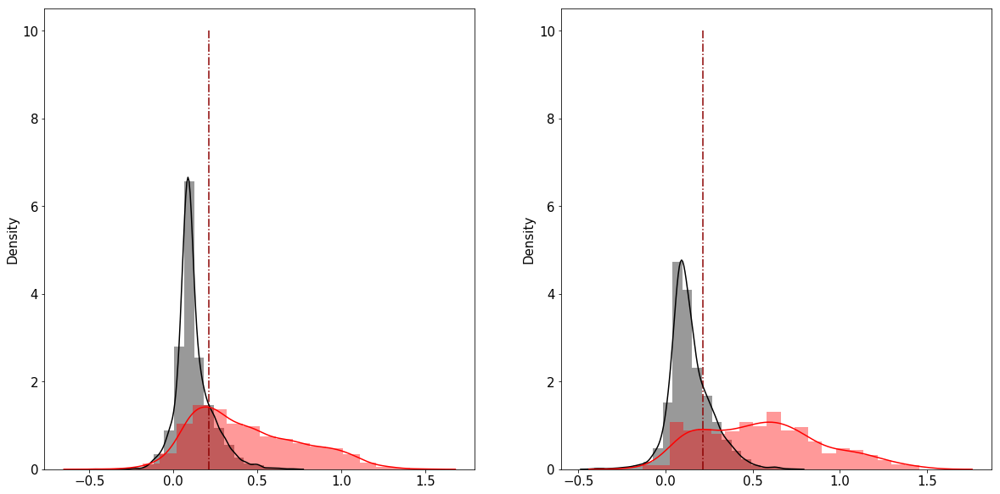

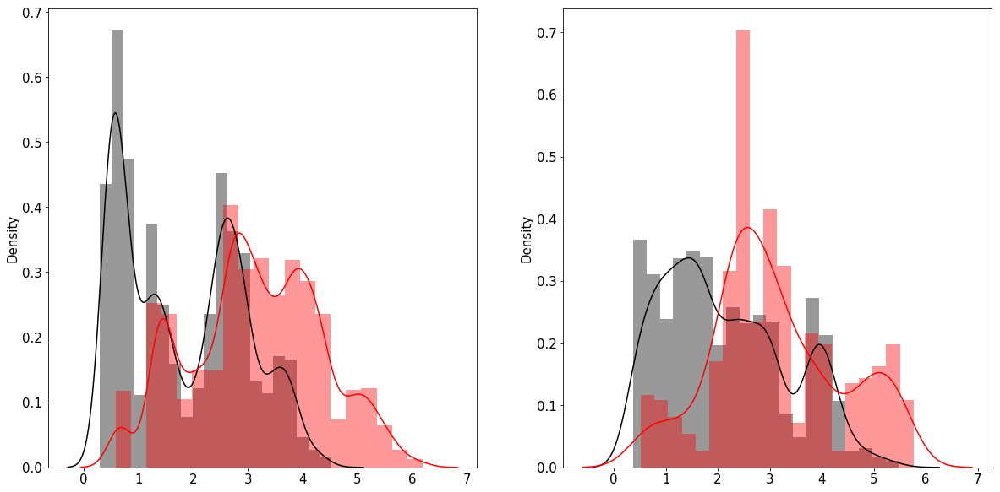

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2929109007040544
Recall: 0.2929109007040544
Precision: 0.4228319285986999
F1-score: 0.31869191682981207

------------Scores on Test-------------
Accuracy: 0.364156102411136
Recall: 0.364156102411136
Precision: 0.4507854015549835
F1-score: 0.39418190177507373

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4023/4023 [00:00<00:00, 10813.93it/s]

------------Scores on Train-------------
Accuracy: 0.8833454722019908
Recall: 0.8833454722019908
Precision: 0.8870938174196622
F1-score: 0.8841367400129512

------------Scores on Test-------------
Accuracy: 0.8794432015908527
Recall: 0.8794432015908527
Precision: 0.8928244441225545
F1-score: 0.8810279629874821

------------Scores on Train-------------
Accuracy: 0.0030869490653404217
Recall: 0.0030869490653404217
Precision: 0.00018513083655458598
F1-score: 0.00034931265739378454

------------Scores on Test-------------
Accuracy: 0.00312256049960968
Recall: 0.00312256049960968
Precision: 0.0002582568834263645
F1-score: 0.00047705785410703436




100%|███████████████████████████████████████████████████████████████████████████| 2562/2562 [00:00<00:00, 12692.72it/s]

------------Scores on Train-------------
Accuracy: 0.8686331675527353
Recall: 0.8686331675527353
Precision: 0.8733242286893341
F1-score: 0.8694822452231621

------------Scores on Test-------------
Accuracy: 0.7962529274004684
Recall: 0.7962529274004684
Precision: 0.810669156653452
F1-score: 0.7968972111320275



 43%|████████████████████████████████▋                                           | 43/100 [2:42:04<3:21:08, 211.73s/it]

----------------- iSimul = 43-----------------------

Normal observations in train set 5929
Outlier observations in train set 5929 

Normal observations in test set 1888
Outlier observations in test set 377
-------------------Scores on Train set-------------------
Accuracy :  0.7959
Precision :  0.7911
Recall :  0.8042
F1-score: 0.7976


-------------------Scores on Test set-------------------
Accuracy :  0.8119
Precision :  0.4609
Recall :  0.7666
F1-score: 0.5757




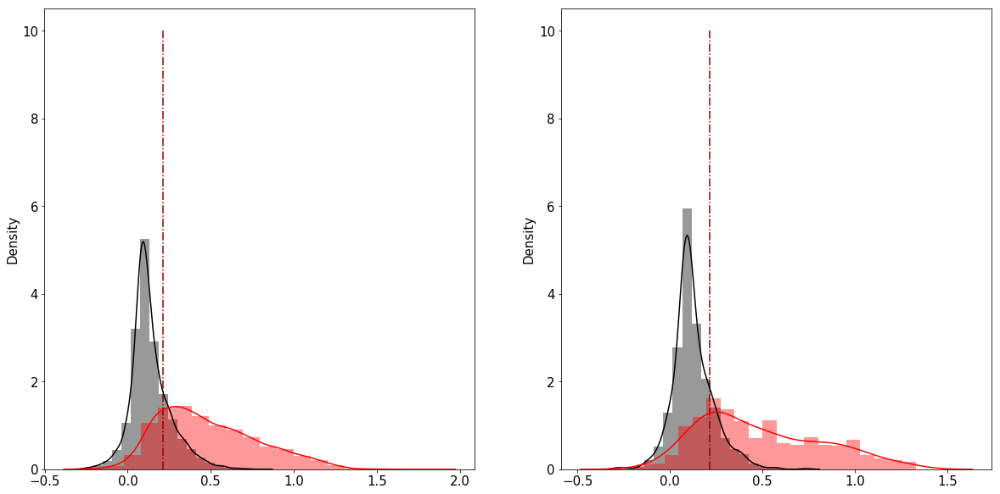

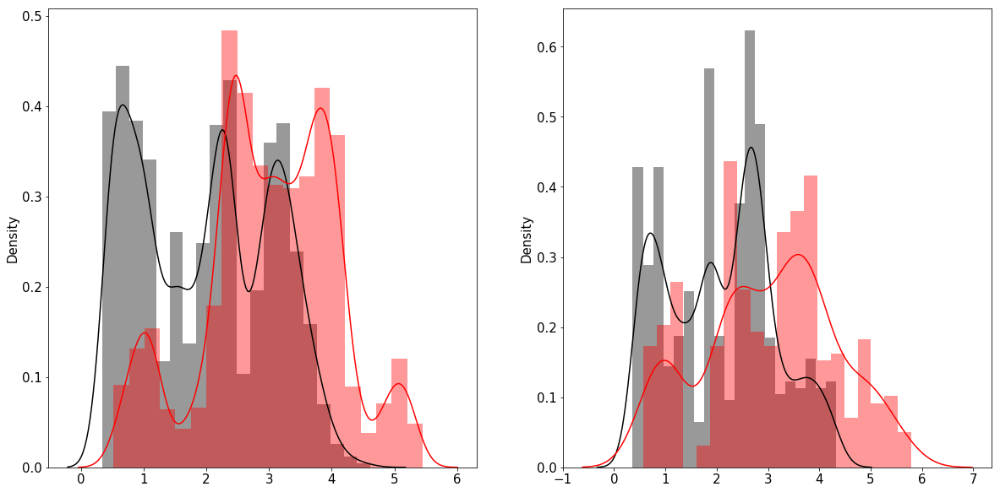

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3523078685144886
Recall: 0.3523078685144886
Precision: 0.4346130388161239
F1-score: 0.3708264313711706

------------Scores on Test-------------
Accuracy: 0.20609936055091
Recall: 0.20609936055091
Precision: 0.3584597883803514
F1-score: 0.2461215084807989

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4066/4066 [00:00<00:00, 12935.57it/s]

------------Scores on Train-------------
Accuracy: 0.8774481731760394
Recall: 0.8774481731760394
Precision: 0.8833467417996098
F1-score: 0.8791278648756387

------------Scores on Test-------------
Accuracy: 0.8448106246925725
Recall: 0.8448106246925725
Precision: 0.8555501942306859
F1-score: 0.8469004741292625

------------Scores on Train-------------
Accuracy: 0.0037063183903988705
Recall: 0.0037063183903988705
Precision: 0.0002793707329446385
F1-score: 0.0005195773444484397

------------Scores on Test-------------
Accuracy: 0.001548467017652524
Recall: 0.001548467017652524
Precision: 6.526106204665809e-05
F1-score: 0.00012524365583954238




100%|███████████████████████████████████████████████████████████████████████████| 3229/3229 [00:00<00:00, 11158.39it/s]

------------Scores on Train-------------
Accuracy: 0.8122132015531239
Recall: 0.8122132015531239
Precision: 0.8216099430041391
F1-score: 0.8144316586302132

------------Scores on Test-------------
Accuracy: 0.8095385568287395
Recall: 0.8095385568287395
Precision: 0.8230181142181354
F1-score: 0.8120303475177095



 44%|█████████████████████████████████▍                                          | 44/100 [2:45:44<3:19:56, 214.22s/it]

----------------- iSimul = 44-----------------------

Normal observations in train set 5395
Outlier observations in train set 5395 

Normal observations in test set 2443
Outlier observations in test set 488
-------------------Scores on Train set-------------------
Accuracy :  0.7559
Precision :  0.7745
Recall :  0.7220
F1-score: 0.7473


-------------------Scores on Test set-------------------
Accuracy :  0.8192
Precision :  0.4749
Recall :  0.8156
F1-score: 0.6003




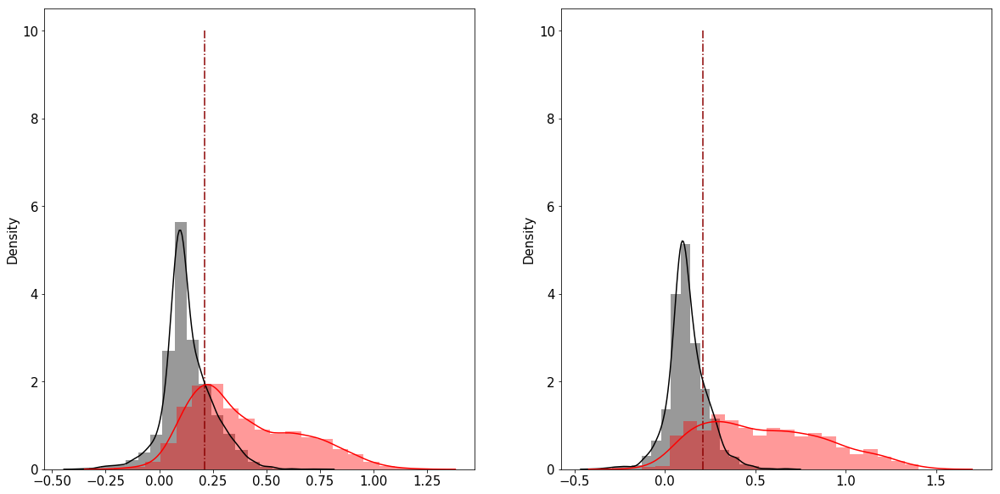

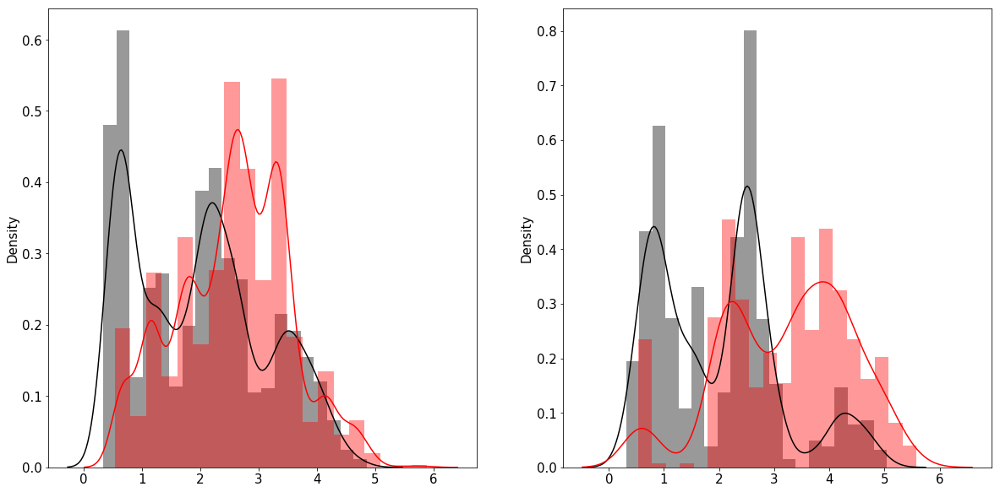

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.20837834593686233
Recall: 0.20837834593686233
Precision: 0.2891948046548333
F1-score: 0.22450300335702233

------------Scores on Test-------------
Accuracy: 0.2621044089802543
Recall: 0.2621044089802543
Precision: 0.35376136598775687
F1-score: 0.27699262844591893

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 3697/3697 [00:00<00:00, 12719.14it/s]

------------Scores on Train-------------
Accuracy: 0.9305005401512424
Recall: 0.9305005401512424
Precision: 0.9325457624664217
F1-score: 0.9309124638527615

------------Scores on Test-------------
Accuracy: 0.93913984311604
Recall: 0.93913984311604
Precision: 0.9412464786768524
F1-score: 0.9396293845940268

------------Scores on Train-------------
Accuracy: 0.002271006813020439
Recall: 0.002271006813020439
Precision: 0.00012292323751125517
F1-score: 0.00023322277925755475

------------Scores on Test-------------
Accuracy: 0.00402046783625731
Recall: 0.00402046783625731
Precision: 0.00025127923976608186
F1-score: 0.0004729962160302718




100%|███████████████████████████████████████████████████████████████████████████| 2736/2736 [00:00<00:00, 11956.99it/s]

------------Scores on Train-------------
Accuracy: 0.9137017411052233
Recall: 0.9137017411052233
Precision: 0.9165339162914725
F1-score: 0.9142488827870054

------------Scores on Test-------------
Accuracy: 0.9181286549707602
Recall: 0.9181286549707602
Precision: 0.9223492923376118
F1-score: 0.9192216141083343



 45%|██████████████████████████████████▏                                         | 45/100 [2:48:59<3:11:09, 208.55s/it]

----------------- iSimul = 45-----------------------

Normal observations in train set 4960
Outlier observations in train set 4960 

Normal observations in test set 1484
Outlier observations in test set 296
-------------------Scores on Train set-------------------
Accuracy :  0.8167
Precision :  0.8115
Recall :  0.8252
F1-score: 0.8183


-------------------Scores on Test set-------------------
Accuracy :  0.7393
Precision :  0.3526
Recall :  0.6791
F1-score: 0.4642




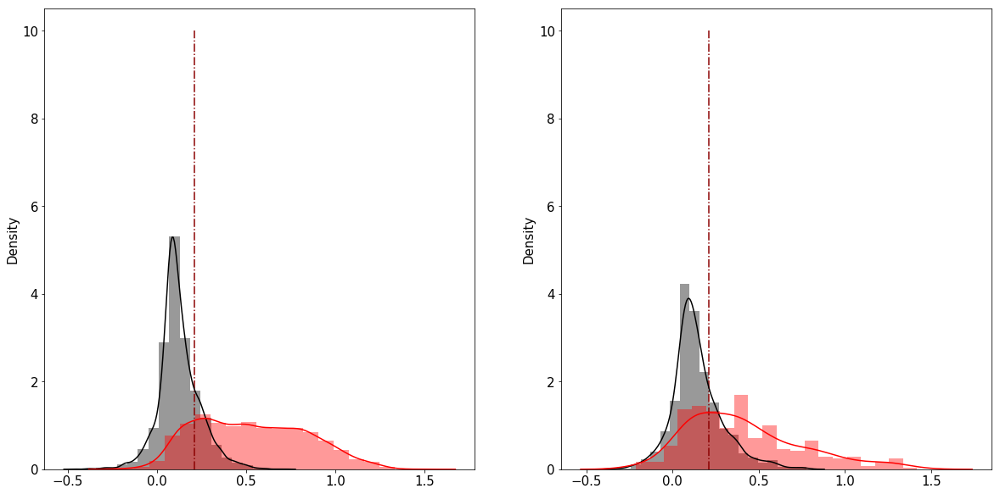

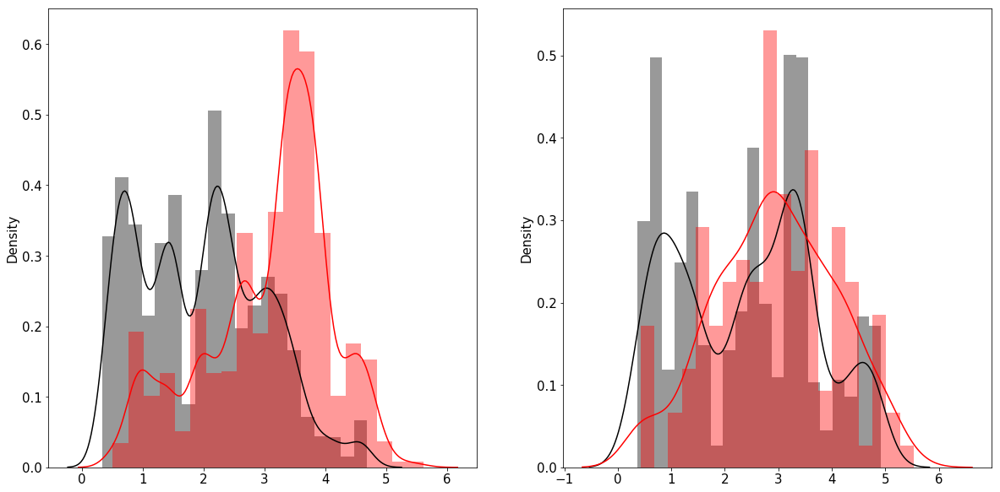

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2792186999679795
Recall: 0.2792186999679795
Precision: 0.3720304113478111
F1-score: 0.30787463457114056

------------Scores on Test-------------
Accuracy: 0.34621993127147765
Recall: 0.34621993127147765
Precision: 0.4768103616266763
F1-score: 0.383170648311522

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4656/4656 [00:00<00:00, 12262.71it/s]

------------Scores on Train-------------
Accuracy: 0.9528231401430248
Recall: 0.9528231401430248
Precision: 0.9544649939179657
F1-score: 0.9531638009970529

------------Scores on Test-------------
Accuracy: 0.8842353951890034
Recall: 0.8842353951890034
Precision: 0.8900464206525109
F1-score: 0.8849483944220846

------------Scores on Train-------------
Accuracy: 0.0020719254106852155
Recall: 0.0020719254106852155
Precision: 0.00010957297844969888
F1-score: 0.00020813862573093486

------------Scores on Test-------------
Accuracy: 0.0032797638570022957
Recall: 0.0032797638570022957
Precision: 0.00023426884692873538
F1-score: 0.0004373018476003061




100%|███████████████████████████████████████████████████████████████████████████| 3049/3049 [00:00<00:00, 12607.56it/s]

------------Scores on Train-------------
Accuracy: 0.9341423708746485
Recall: 0.9341423708746485
Precision: 0.9372889291728289
F1-score: 0.9348139441331138

------------Scores on Test-------------
Accuracy: 0.851426697277796
Recall: 0.851426697277796
Precision: 0.8580405118654532
F1-score: 0.8524078802659169



 46%|██████████████████████████████████▉                                         | 46/100 [2:52:37<3:10:01, 211.14s/it]

----------------- iSimul = 46-----------------------

Normal observations in train set 6575
Outlier observations in train set 6575 

Normal observations in test set 2354
Outlier observations in test set 470
-------------------Scores on Train set-------------------
Accuracy :  0.8050
Precision :  0.7964
Recall :  0.8196
F1-score: 0.8078


-------------------Scores on Test set-------------------
Accuracy :  0.7550
Precision :  0.3706
Recall :  0.6766
F1-score: 0.4789




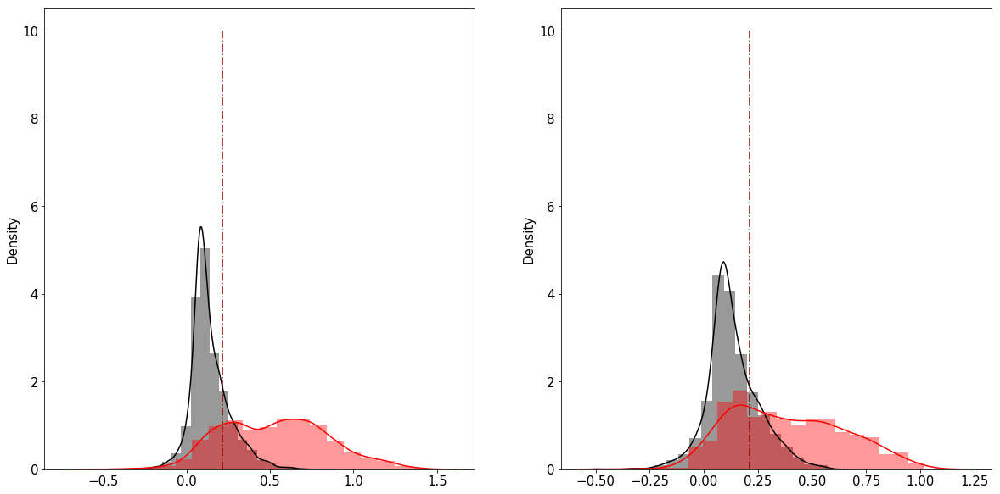

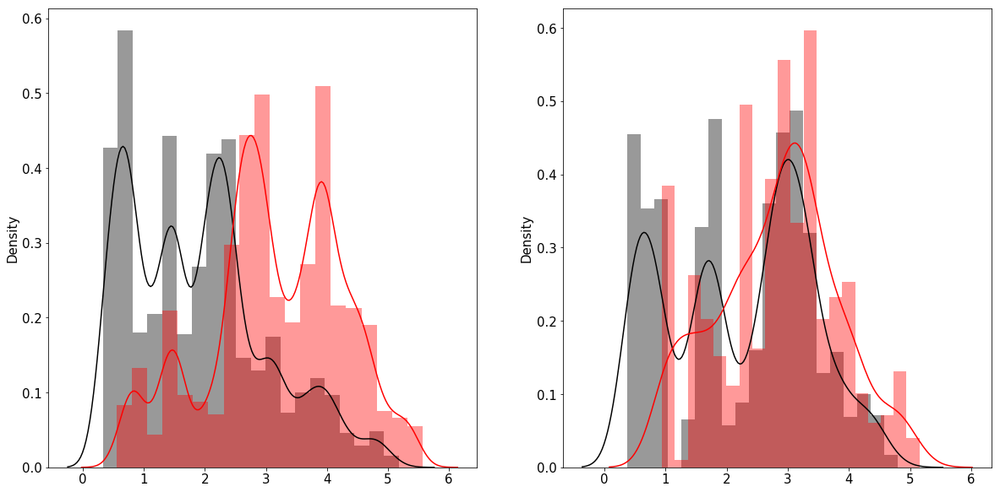

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3203834510595358
Recall: 0.3203834510595358
Precision: 0.42259854196475927
F1-score: 0.34941143210173536

------------Scores on Test-------------
Accuracy: 0.1328578975171685
Recall: 0.1328578975171685
Precision: 0.15718861739487394
F1-score: 0.12923174789378683

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 3786/3786 [00:00<00:00, 10352.67it/s]

------------Scores on Train-------------
Accuracy: 0.9408425832492432
Recall: 0.9408425832492432
Precision: 0.9419631236091761
F1-score: 0.941040707675423

------------Scores on Test-------------
Accuracy: 0.7857897517168515
Recall: 0.7857897517168515
Precision: 0.7981526999398875
F1-score: 0.788489565047564

------------Scores on Train-------------
Accuracy: 0.0027803521779425394
Recall: 0.0027803521779425394
Precision: 0.00020098931406813537
F1-score: 0.0003748789453405671

------------Scores on Test-------------
Accuracy: 0.0024330900243309003
Recall: 0.0024330900243309003
Precision: 0.0001468243980199681
F1-score: 0.00027693707594010245




100%|███████████████████████████████████████████████████████████████████████████| 3288/3288 [00:00<00:00, 12174.25it/s]

------------Scores on Train-------------
Accuracy: 0.9126969416126043
Recall: 0.9126969416126043
Precision: 0.9146261223596459
F1-score: 0.9130571737316254

------------Scores on Test-------------
Accuracy: 0.7615571776155717
Recall: 0.7615571776155717
Precision: 0.7742603720530773
F1-score: 0.7644850004899088



 47%|███████████████████████████████████▋                                        | 47/100 [2:56:22<3:10:09, 215.28s/it]

----------------- iSimul = 47-----------------------

Normal observations in train set 5955
Outlier observations in train set 5955 

Normal observations in test set 1803
Outlier observations in test set 360
-------------------Scores on Train set-------------------
Accuracy :  0.8049
Precision :  0.8075
Recall :  0.8007
F1-score: 0.8040


-------------------Scores on Test set-------------------
Accuracy :  0.7369
Precision :  0.3630
Recall :  0.7694
F1-score: 0.4933




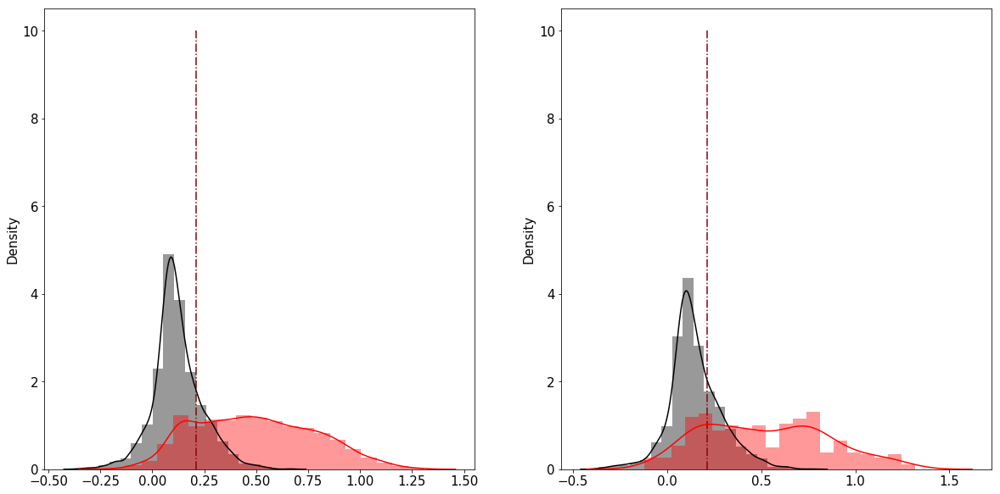

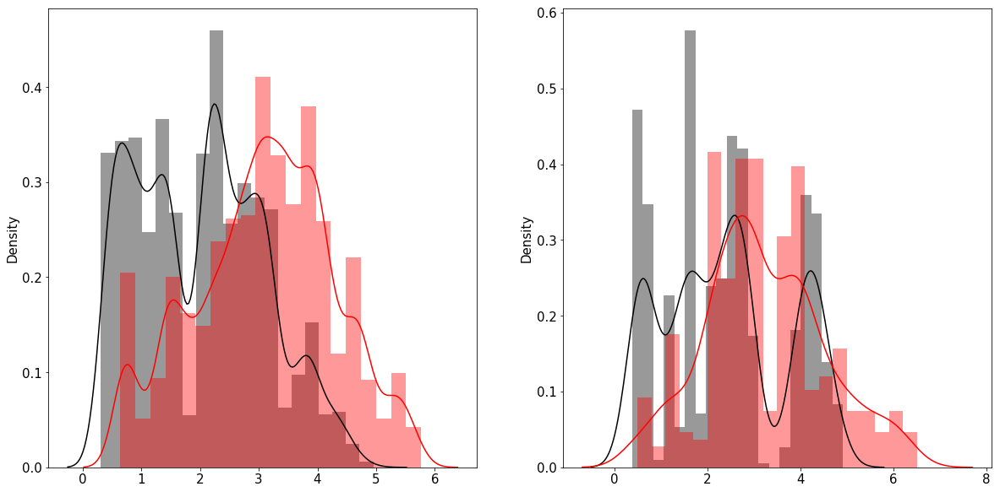

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.31757939484871217
Recall: 0.31757939484871217
Precision: 0.39684027481272327
F1-score: 0.3419426991049056

------------Scores on Test-------------
Accuracy: 0.17754207977864883
Recall: 0.17754207977864883
Precision: 0.2988791301752193
F1-score: 0.20148343304656993

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4337/4337 [00:00<00:00, 9817.33it/s]

------------Scores on Train-------------
Accuracy: 0.9316079019754939
Recall: 0.9316079019754939
Precision: 0.933350160259522
F1-score: 0.9317896752020868

------------Scores on Test-------------
Accuracy: 0.8639612635462302
Recall: 0.8639612635462302
Precision: 0.8688118460155468
F1-score: 0.8648467753614604

------------Scores on Train-------------
Accuracy: 0.0023792093704245974
Recall: 0.0023792093704245974
Precision: 0.000166194772198777
F1-score: 0.0003106871342822498

------------Scores on Test-------------
Accuracy: 0.001961883408071749
Recall: 0.001961883408071749
Precision: 9.96268918161435e-05
F1-score: 0.0001896244186240352




100%|████████████████████████████████████████████████████████████████████████████| 3568/3568 [00:00<00:00, 5295.64it/s]

------------Scores on Train-------------
Accuracy: 0.8973279648609077
Recall: 0.8973279648609077
Precision: 0.9019989722712434
F1-score: 0.8980708143775731

------------Scores on Test-------------
Accuracy: 0.8388452914798207
Recall: 0.8388452914798207
Precision: 0.8445597483364045
F1-score: 0.839588380440078



 48%|████████████████████████████████████▍                                       | 48/100 [3:00:10<3:09:56, 219.17s/it]

----------------- iSimul = 48-----------------------

Normal observations in train set 5695
Outlier observations in train set 5695 

Normal observations in test set 2386
Outlier observations in test set 477
-------------------Scores on Train set-------------------
Accuracy :  0.7432
Precision :  0.7297
Recall :  0.7726
F1-score: 0.7505


-------------------Scores on Test set-------------------
Accuracy :  0.7227
Precision :  0.3457
Recall :  0.7442
F1-score: 0.4721




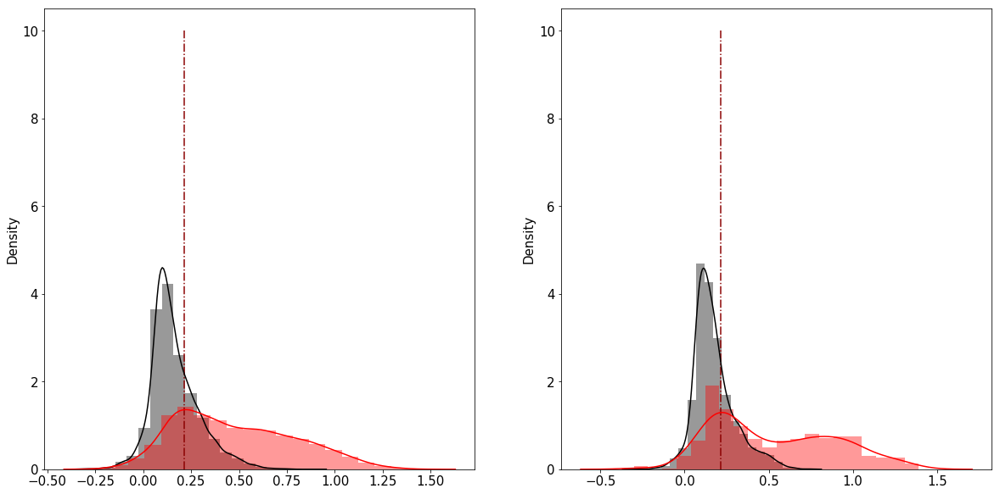

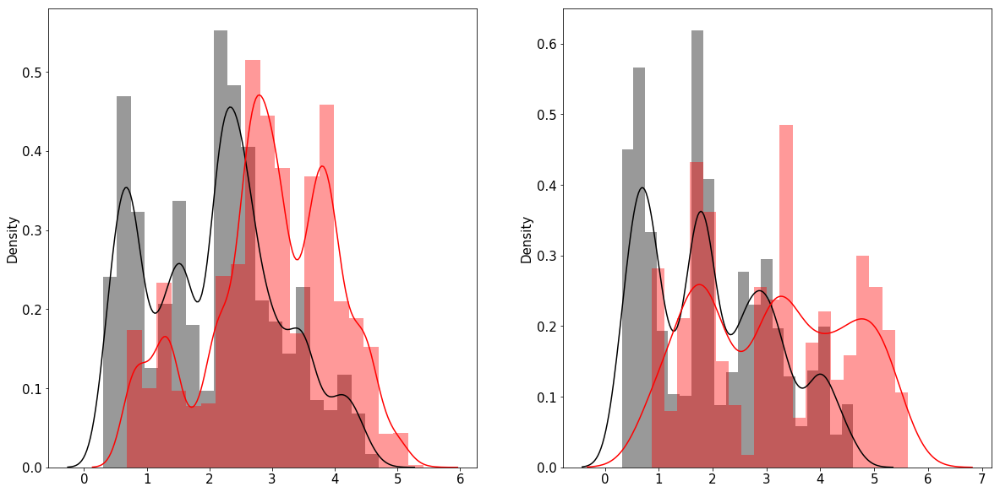

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.22907542579075427
Recall: 0.22907542579075427
Precision: 0.3326591329830986
F1-score: 0.2612819914611345

------------Scores on Test-------------
Accuracy: 0.30687266915290357
Recall: 0.30687266915290357
Precision: 0.4333124754395724
F1-score: 0.32512907530564966

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 3754/3754 [00:00<00:00, 10513.74it/s]

------------Scores on Train-------------
Accuracy: 0.8071776155717761
Recall: 0.8071776155717761
Precision: 0.8174775931894065
F1-score: 0.8095261542990344

------------Scores on Test-------------
Accuracy: 0.851891315929675
Recall: 0.851891315929675
Precision: 0.8556137369479043
F1-score: 0.8515311184076553

------------Scores on Train-------------
Accuracy: 0.001419782300047326
Recall: 0.001419782300047326
Precision: 8.451085119329322e-05
F1-score: 0.000159526101128913

------------Scores on Test-------------
Accuracy: 0.0034535686876438986
Recall: 0.0034535686876438986
Precision: 0.00023450157755606718
F1-score: 0.00043918214524951314




100%|███████████████████████████████████████████████████████████████████████████| 2606/2606 [00:00<00:00, 12640.52it/s]

------------Scores on Train-------------
Accuracy: 0.7520113582584004
Recall: 0.7520113582584004
Precision: 0.7662652676374823
F1-score: 0.7550583665605869

------------Scores on Test-------------
Accuracy: 0.7870299309286263
Recall: 0.7870299309286263
Precision: 0.7954315350721805
F1-score: 0.7872886323120041



 49%|████████████████████████████████████▎                                     | 49/100 [6:57:17<62:38:26, 4421.69s/it]

----------------- iSimul = 49-----------------------

Normal observations in train set 5801
Outlier observations in train set 5801 

Normal observations in test set 1760
Outlier observations in test set 352
-------------------Scores on Train set-------------------
Accuracy :  0.8068
Precision :  0.7674
Recall :  0.8804
F1-score: 0.8200


-------------------Scores on Test set-------------------
Accuracy :  0.7500
Precision :  0.3854
Recall :  0.8409
F1-score: 0.5286




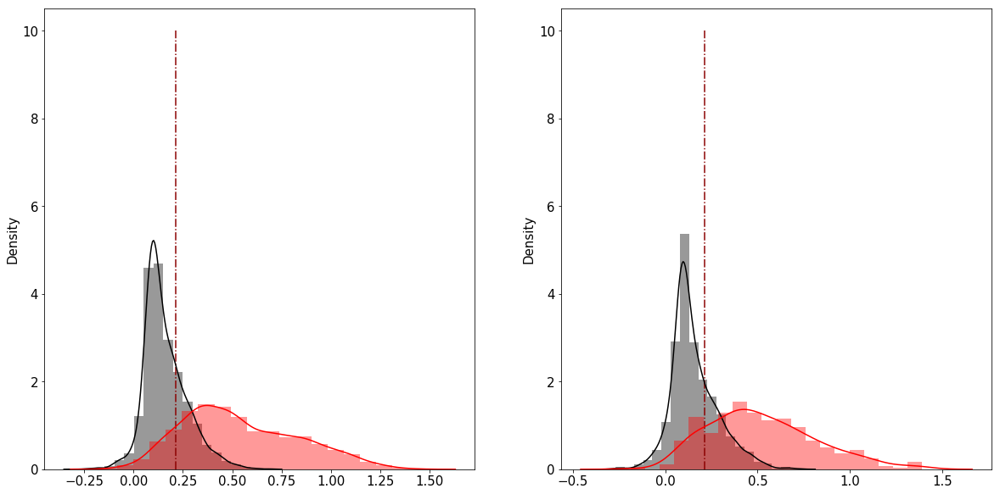

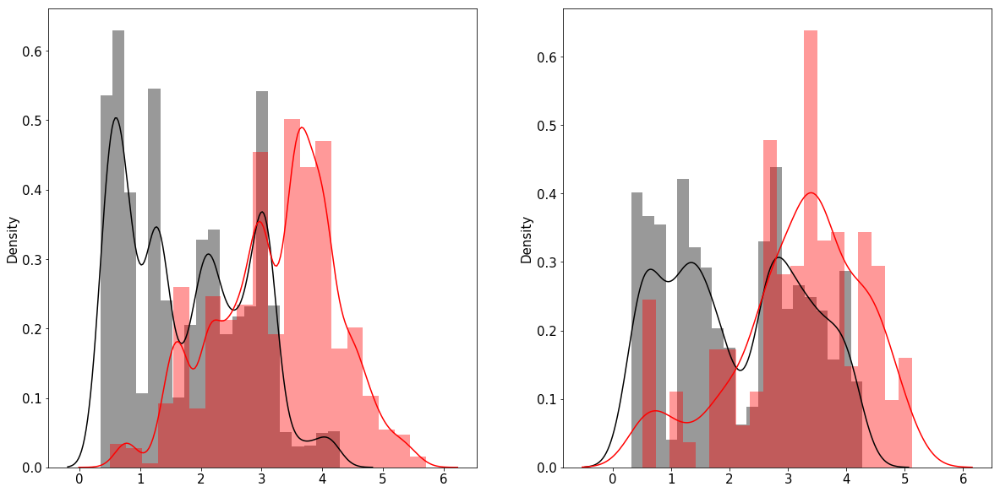

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2583427071616048
Recall: 0.2583427071616048
Precision: 0.32975622914479935
F1-score: 0.2795007985936522

------------Scores on Test-------------
Accuracy: 0.4029680365296804
Recall: 0.4029680365296804
Precision: 0.5255528358364839
F1-score: 0.43004547384578345

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4380/4380 [00:00<00:00, 11645.26it/s]

------------Scores on Train-------------
Accuracy: 0.8946381702287214
Recall: 0.8946381702287214
Precision: 0.899542358700054
F1-score: 0.8946688785476138

------------Scores on Test-------------
Accuracy: 0.8954337899543379
Recall: 0.8954337899543379
Precision: 0.901990346962213
F1-score: 0.896726310786563

------------Scores on Train-------------
Accuracy: 0.0023553162853297443
Recall: 0.0023553162853297447
Precision: 0.00016936220780799165
F1-score: 0.00031600187291475507

------------Scores on Test-------------
Accuracy: 0.004195270785659802
Recall: 0.004195270785659802
Precision: 0.00035474716202270383
F1-score: 0.0006541778174249184




100%|████████████████████████████████████████████████████████████████████████████| 2622/2622 [00:00<00:00, 9163.50it/s]

------------Scores on Train-------------
Accuracy: 0.8580080753701211
Recall: 0.8580080753701211
Precision: 0.8656410144869576
F1-score: 0.8579338301075645

------------Scores on Test-------------
Accuracy: 0.8245614035087719
Recall: 0.8245614035087719
Precision: 0.8397618379227614
F1-score: 0.8278240641090021



 50%|███████████████████████████████████▌                                   | 50/100 [13:39:13<143:28:13, 10329.87s/it]

----------------- iSimul = 50-----------------------

Normal observations in train set 5056
Outlier observations in train set 5056 

Normal observations in test set 2023
Outlier observations in test set 404
-------------------Scores on Train set-------------------
Accuracy :  0.7951
Precision :  0.7960
Recall :  0.7935
F1-score: 0.7948


-------------------Scores on Test set-------------------
Accuracy :  0.8216
Precision :  0.4791
Recall :  0.8218
F1-score: 0.6053




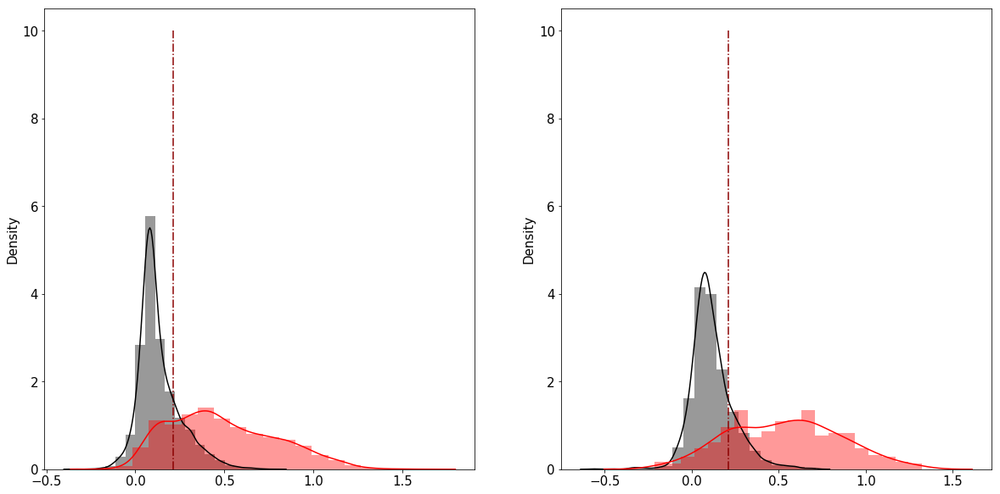

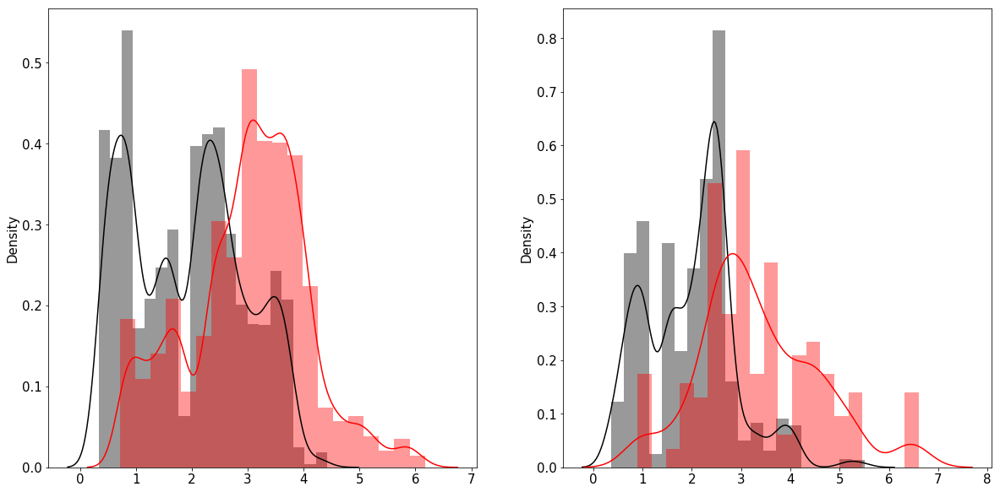

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.331237368066472
Recall: 0.331237368066472
Precision: 0.42216668034742466
F1-score: 0.3474887192430332

------------Scores on Test-------------
Accuracy: 0.15593879038134564
Recall: 0.15593879038134564
Precision: 0.2607633491094676
F1-score: 0.18329667118553555

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4117/4117 [00:00<00:00, 8596.51it/s]

------------Scores on Train-------------
Accuracy: 0.9176959353245003
Recall: 0.9176959353245003
Precision: 0.9206591987341545
F1-score: 0.9182933449887615

------------Scores on Test-------------
Accuracy: 0.8899684236094243
Recall: 0.8899684236094243
Precision: 0.8934166711330828
F1-score: 0.890645302513425

------------Scores on Train-------------
Accuracy: 0.004183400267737617
Recall: 0.004183400267737617
Precision: 0.000245121109437751
F1-score: 0.00046310704070896125

------------Scores on Test-------------
Accuracy: 0.0014380212827149843
Recall: 0.0014380212827149843
Precision: 6.7558046838959e-05
F1-score: 0.00012905319203852423




100%|████████████████████████████████████████████████████████████████████████████| 3477/3477 [00:00<00:00, 9291.65it/s]

------------Scores on Train-------------
Accuracy: 0.8771753681392236
Recall: 0.8771753681392236
Precision: 0.8833753313307512
F1-score: 0.8782437939663733

------------Scores on Test-------------
Accuracy: 0.8717285015818234
Recall: 0.8717285015818234
Precision: 0.875726247050077
F1-score: 0.872326081377601



 51%|█████████████████████████████████████▏                                   | 51/100 [13:42:59<99:20:31, 7298.59s/it]

----------------- iSimul = 51-----------------------

Normal observations in train set 5563
Outlier observations in train set 5563 

Normal observations in test set 1912
Outlier observations in test set 382
-------------------Scores on Train set-------------------
Accuracy :  0.7943
Precision :  0.7928
Recall :  0.7967
F1-score: 0.7948


-------------------Scores on Test set-------------------
Accuracy :  0.7459
Precision :  0.3672
Recall :  0.7277
F1-score: 0.4881




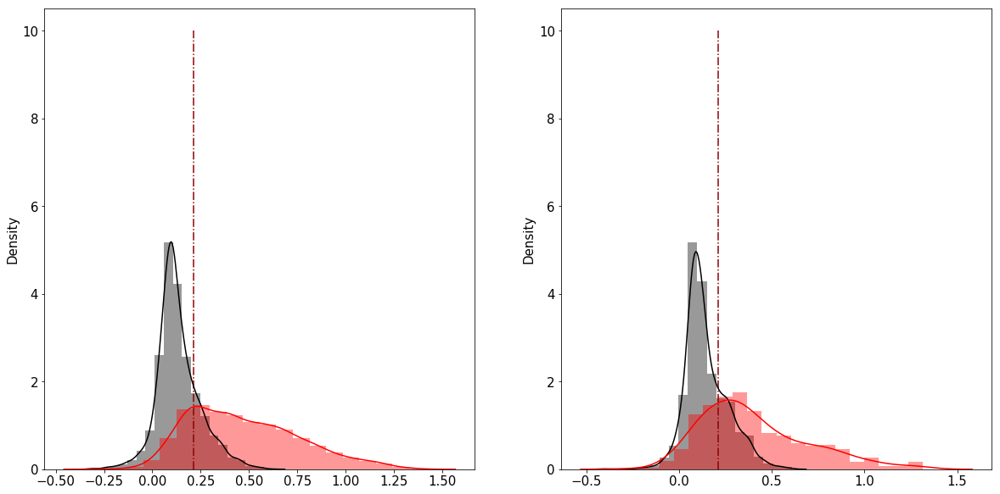

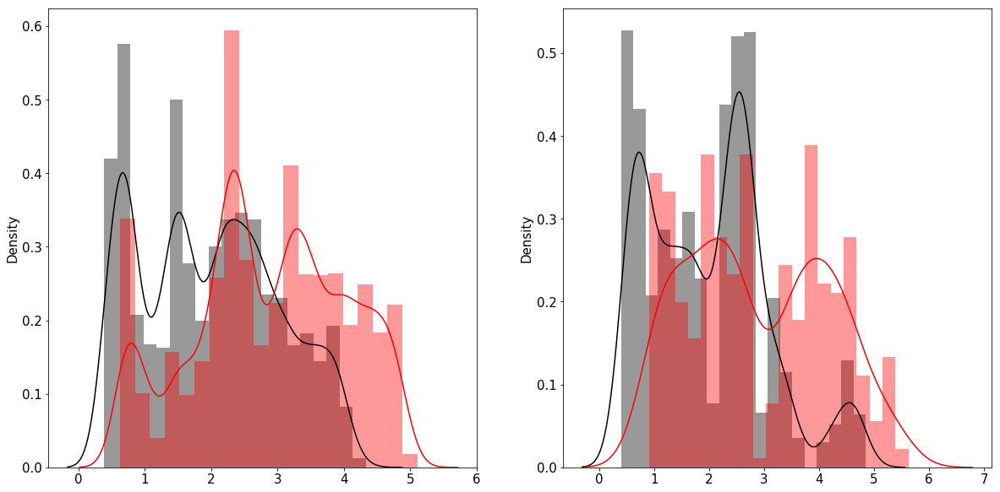

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.34651162790697676
Recall: 0.34651162790697676
Precision: 0.4407072406812351
F1-score: 0.36975113897337525

------------Scores on Test-------------
Accuracy: 0.20837275307473982
Recall: 0.20837275307473982
Precision: 0.25068525879502324
F1-score: 0.21130187086068783

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4228/4228 [00:00<00:00, 8888.58it/s]

------------Scores on Train-------------
Accuracy: 0.9298837209302325
Recall: 0.9298837209302325
Precision: 0.9322547663297983
F1-score: 0.9305661843269581

------------Scores on Test-------------
Accuracy: 0.8881267738883633
Recall: 0.8881267738883633
Precision: 0.8940268958136279
F1-score: 0.8886642110988444

------------Scores on Train-------------
Accuracy: 0.003199431212228937
Recall: 0.003199431212228937
Precision: 0.0002289023956716638
F1-score: 0.0004272381588408899

------------Scores on Test-------------
Accuracy: 0.0029850746268656717
Recall: 0.0029850746268656717
Precision: 0.00019840375163457637
F1-score: 0.00037207729060082027




100%|████████████████████████████████████████████████████████████████████████████| 3350/3350 [00:00<00:00, 7877.24it/s]

------------Scores on Train-------------
Accuracy: 0.8917525773195877
Recall: 0.8917525773195877
Precision: 0.8953119888035481
F1-score: 0.8926152411262421

------------Scores on Test-------------
Accuracy: 0.8546268656716418
Recall: 0.8546268656716418
Precision: 0.8594781603377872
F1-score: 0.8537773784507432



 52%|█████████████████████████████████████▉                                   | 52/100 [13:46:36<68:59:22, 5174.21s/it]

----------------- iSimul = 52-----------------------

Normal observations in train set 5699
Outlier observations in train set 5699 

Normal observations in test set 1570
Outlier observations in test set 314
-------------------Scores on Train set-------------------
Accuracy :  0.7758
Precision :  0.7528
Recall :  0.8214
F1-score: 0.7856


-------------------Scores on Test set-------------------
Accuracy :  0.7659
Precision :  0.4022
Recall :  0.8312
F1-score: 0.5421




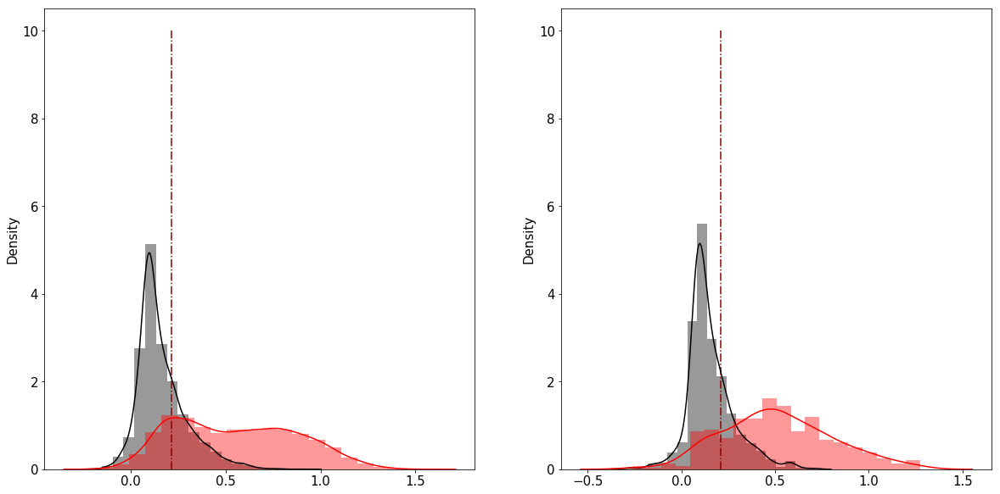

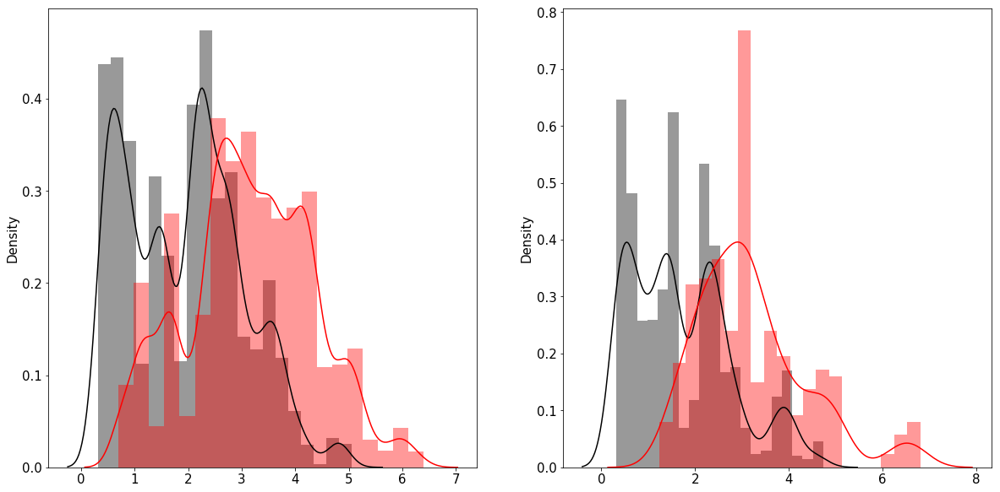

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.32109318564892847
Recall: 0.32109318564892847
Precision: 0.4422508085859673
F1-score: 0.35108340686216166

------------Scores on Test-------------
Accuracy: 0.21203501094091903
Recall: 0.21203501094091903
Precision: 0.25914434407472103
F1-score: 0.21862805044948572

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4570/4570 [00:00<00:00, 8963.12it/s]

------------Scores on Train-------------
Accuracy: 0.9431736094389598
Recall: 0.9431736094389598
Precision: 0.9454413151239366
F1-score: 0.943518732249929

------------Scores on Test-------------
Accuracy: 0.8617067833698031
Recall: 0.8617067833698031
Precision: 0.869910501448031
F1-score: 0.8631643672224344

------------Scores on Train-------------
Accuracy: 0.003007252786131258
Recall: 0.003007252786131258
Precision: 0.00017999615216260083
F1-score: 0.0003396621604170291

------------Scores on Test-------------
Accuracy: 0.002219140083217753
Recall: 0.002219140083217753
Precision: 0.00015190542236311999
F1-score: 0.0002843466401894614




100%|███████████████████████████████████████████████████████████████████████████| 3605/3605 [00:00<00:00, 10136.62it/s]

------------Scores on Train-------------
Accuracy: 0.9195117636653104
Recall: 0.9195117636653104
Precision: 0.9237369332000415
F1-score: 0.920044480932876

------------Scores on Test-------------
Accuracy: 0.8221914008321776
Recall: 0.8221914008321776
Precision: 0.8354024521510218
F1-score: 0.8250319639777076



 53%|██████████████████████████████████████▋                                  | 53/100 [13:50:10<48:07:25, 3686.06s/it]

----------------- iSimul = 53-----------------------

Normal observations in train set 5849
Outlier observations in train set 5849 

Normal observations in test set 1130
Outlier observations in test set 226
-------------------Scores on Train set-------------------
Accuracy :  0.8154
Precision :  0.7955
Recall :  0.8492
F1-score: 0.8215


-------------------Scores on Test set-------------------
Accuracy :  0.8540
Precision :  0.5407
Recall :  0.8230
F1-score: 0.6526




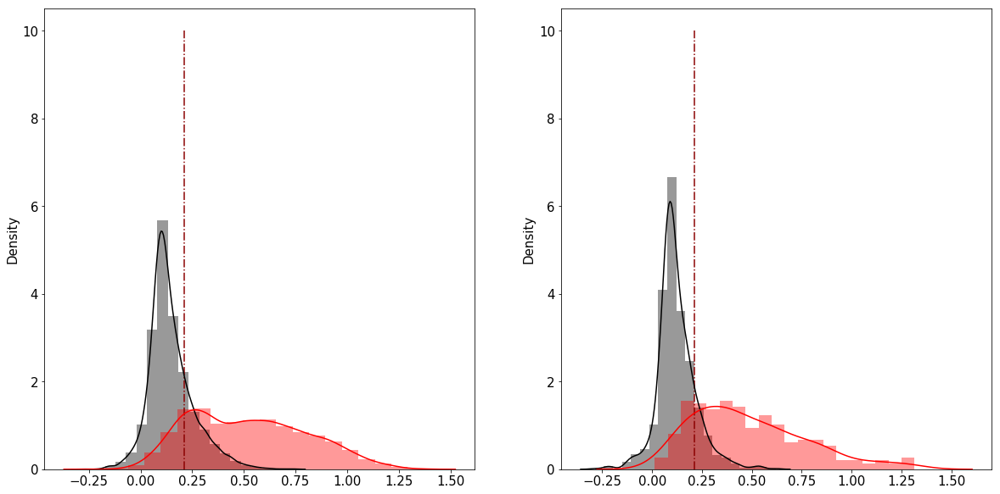

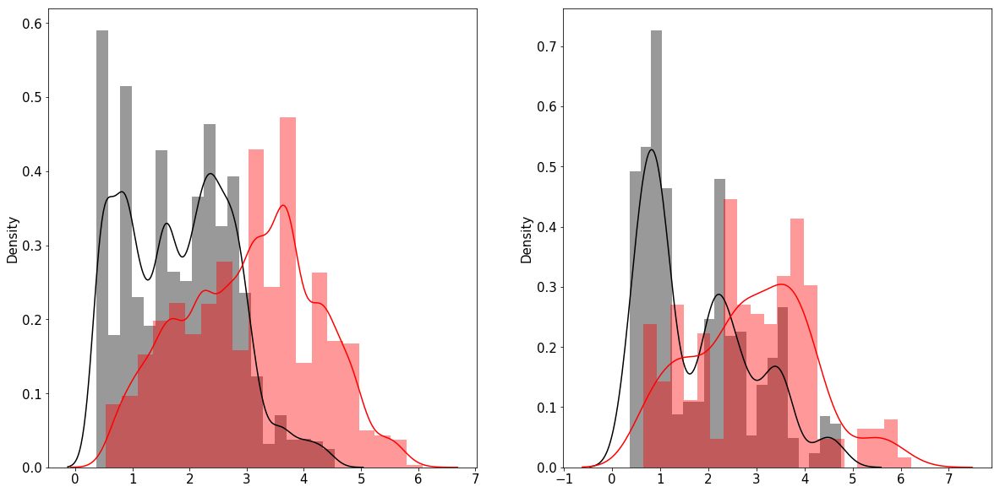

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.21747479596735478
Recall: 0.21747479596735478
Precision: 0.3000006959438968
F1-score: 0.2390440800921311

------------Scores on Test-------------
Accuracy: 0.3914171656686627
Recall: 0.3914171656686627
Precision: 0.5537920059831788
F1-score: 0.43690287321632115

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 5010/5010 [00:00<00:00, 8930.15it/s]

------------Scores on Train-------------
Accuracy: 0.9690350456072971
Recall: 0.9690350456072971
Precision: 0.9706406366627722
F1-score: 0.9693465632732673

------------Scores on Test-------------
Accuracy: 0.9395209580838323
Recall: 0.9395209580838323
Precision: 0.9406312685164546
F1-score: 0.9394825277709908

------------Scores on Train-------------
Accuracy: 0.0018387986515476554
Recall: 0.0018387986515476554
Precision: 0.00010349259426249894
F1-score: 0.0001959562379592297

------------Scores on Test-------------
Accuracy: 0.003600654664484452
Recall: 0.003600654664484452
Precision: 0.00018994279193381282
F1-score: 0.0003608499228023634




100%|███████████████████████████████████████████████████████████████████████████| 3055/3055 [00:00<00:00, 10936.02it/s]

------------Scores on Train-------------
Accuracy: 0.9558688323628562
Recall: 0.9558688323628562
Precision: 0.9583929506043564
F1-score: 0.9563560059648218

------------Scores on Test-------------
Accuracy: 0.8998363338788871
Recall: 0.8998363338788871
Precision: 0.902447079665766
F1-score: 0.899511274626673



 54%|███████████████████████████████████████▍                                 | 54/100 [13:53:48<33:48:29, 2645.85s/it]

----------------- iSimul = 54-----------------------

Normal observations in train set 5665
Outlier observations in train set 5665 

Normal observations in test set 1667
Outlier observations in test set 333
-------------------Scores on Train set-------------------
Accuracy :  0.8264
Precision :  0.8416
Recall :  0.8041
F1-score: 0.8224


-------------------Scores on Test set-------------------
Accuracy :  0.8540
Precision :  0.5400
Recall :  0.8318
F1-score: 0.6548




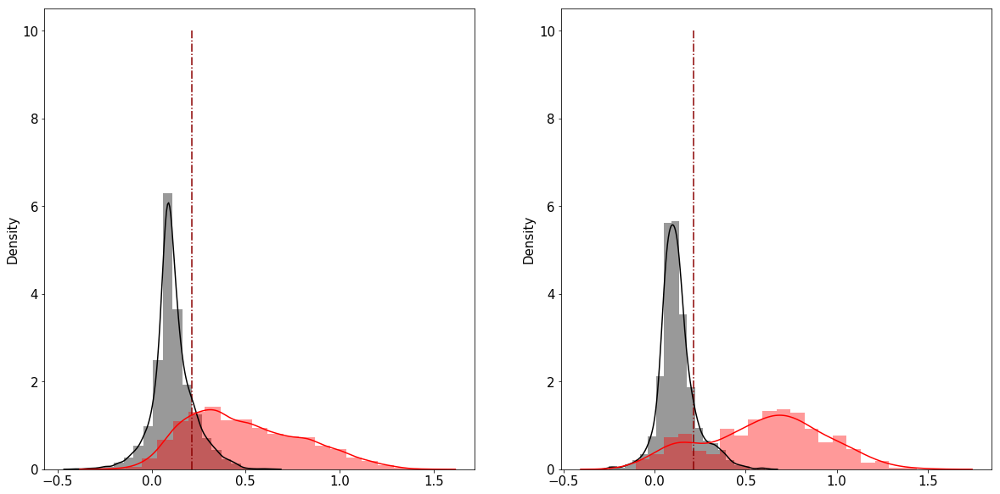

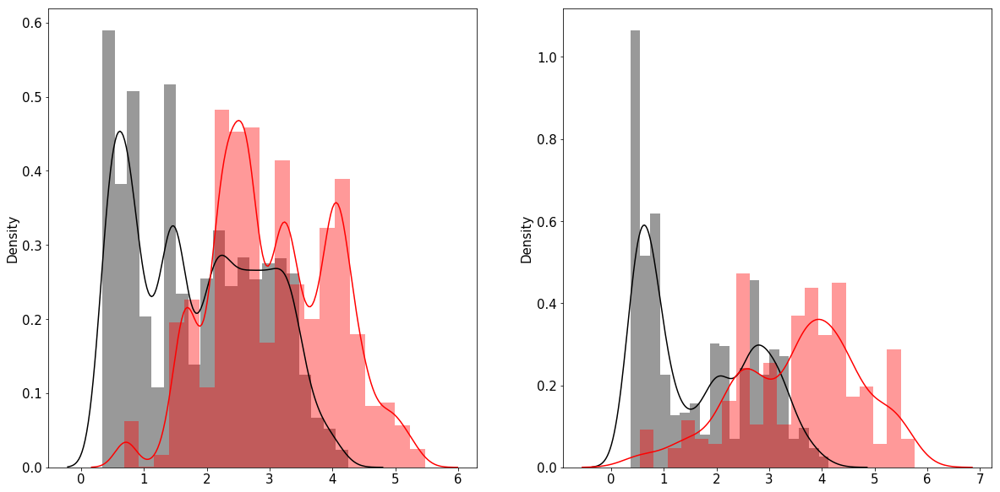

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.31514707677285486
Recall: 0.31514707677285486
Precision: 0.369193485802992
F1-score: 0.33081790972318437

------------Scores on Test-------------
Accuracy: 0.2899619941873463
Recall: 0.2899619941873463
Precision: 0.4549309375602871
F1-score: 0.33134007225635864

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4473/4473 [00:00<00:00, 9057.91it/s]

------------Scores on Train-------------
Accuracy: 0.913584767484438
Recall: 0.913584767484438
Precision: 0.9158869291504678
F1-score: 0.9141251712626735

------------Scores on Test-------------
Accuracy: 0.898054996646546
Recall: 0.898054996646546
Precision: 0.9000620497845687
F1-score: 0.8986054583736318

------------Scores on Train-------------
Accuracy: 0.0028469750889679717
Recall: 0.0028469750889679717
Precision: 0.0002827250088351565
F1-score: 0.0005143694488471545

------------Scores on Test-------------
Accuracy: 0.00251414204902577
Recall: 0.00251414204902577
Precision: 0.00012072080819956723
F1-score: 0.0002303795503091343




100%|███████████████████████████████████████████████████████████████████████████| 3182/3182 [00:00<00:00, 11162.44it/s]

------------Scores on Train-------------
Accuracy: 0.8713523131672598
Recall: 0.8713523131672598
Precision: 0.8752549181337816
F1-score: 0.8721928381668674

------------Scores on Test-------------
Accuracy: 0.8566939032055311
Recall: 0.8566939032055311
Precision: 0.8602345415223411
F1-score: 0.8577229440509271



 55%|████████████████████████████████████████▏                                | 55/100 [13:57:28<23:58:28, 1917.97s/it]

----------------- iSimul = 55-----------------------

Normal observations in train set 5633
Outlier observations in train set 5633 

Normal observations in test set 1600
Outlier observations in test set 320
-------------------Scores on Train set-------------------
Accuracy :  0.7986
Precision :  0.7859
Recall :  0.8209
F1-score: 0.8030


-------------------Scores on Test set-------------------
Accuracy :  0.6813
Precision :  0.3254
Recall :  0.8500
F1-score: 0.4706




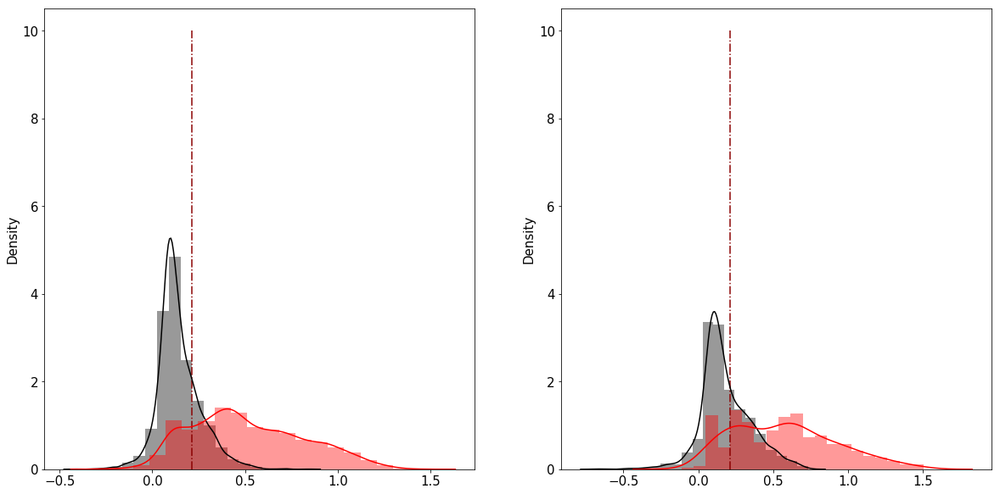

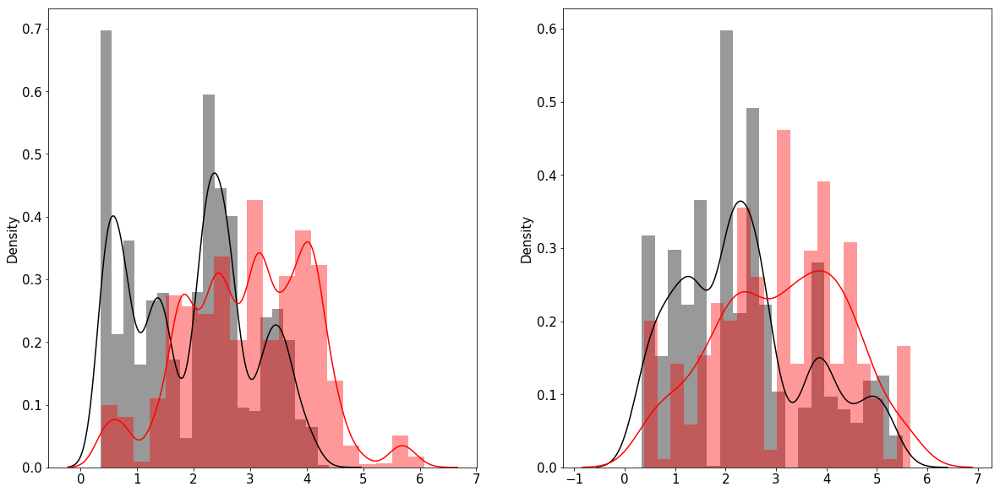

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3352068345323741
Recall: 0.3352068345323741
Precision: 0.4763435136366568
F1-score: 0.380773556680845

------------Scores on Test-------------
Accuracy: 0.3246696035242291
Recall: 0.3246696035242291
Precision: 0.4823924546222785
F1-score: 0.369502326065941

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4540/4540 [00:00<00:00, 11772.88it/s]

------------Scores on Train-------------
Accuracy: 0.8963579136690647
Recall: 0.8963579136690647
Precision: 0.898278867435845
F1-score: 0.896886887352235

------------Scores on Test-------------
Accuracy: 0.9255506607929516
Recall: 0.9255506607929516
Precision: 0.9325261768333764
F1-score: 0.9271924464358919

------------Scores on Train-------------
Accuracy: 0.002364864864864865
Recall: 0.002364864864864865
Precision: 0.00011442894507410636
F1-score: 0.0002182952182952183

------------Scores on Test-------------
Accuracy: 0.0029335071707953064
Recall: 0.0029335071707953064
Precision: 0.0001493915688830943
F1-score: 0.0002843046597246552




100%|████████████████████████████████████████████████████████████████████████████| 3068/3068 [00:00<00:00, 8468.02it/s]

------------Scores on Train-------------
Accuracy: 0.8451013513513513
Recall: 0.8451013513513513
Precision: 0.8493948983495747
F1-score: 0.8462502417590765

------------Scores on Test-------------
Accuracy: 0.8996088657105606
Recall: 0.8996088657105606
Precision: 0.9089107035480517
F1-score: 0.9014976053766511



 56%|████████████████████████████████████████▉                                | 56/100 [14:01:17<17:14:53, 1411.22s/it]

----------------- iSimul = 56-----------------------

Normal observations in train set 6078
Outlier observations in train set 6078 

Normal observations in test set 2034
Outlier observations in test set 406
-------------------Scores on Train set-------------------
Accuracy :  0.7618
Precision :  0.7449
Recall :  0.7965
F1-score: 0.7698


-------------------Scores on Test set-------------------
Accuracy :  0.7926
Precision :  0.4254
Recall :  0.7020
F1-score: 0.5297




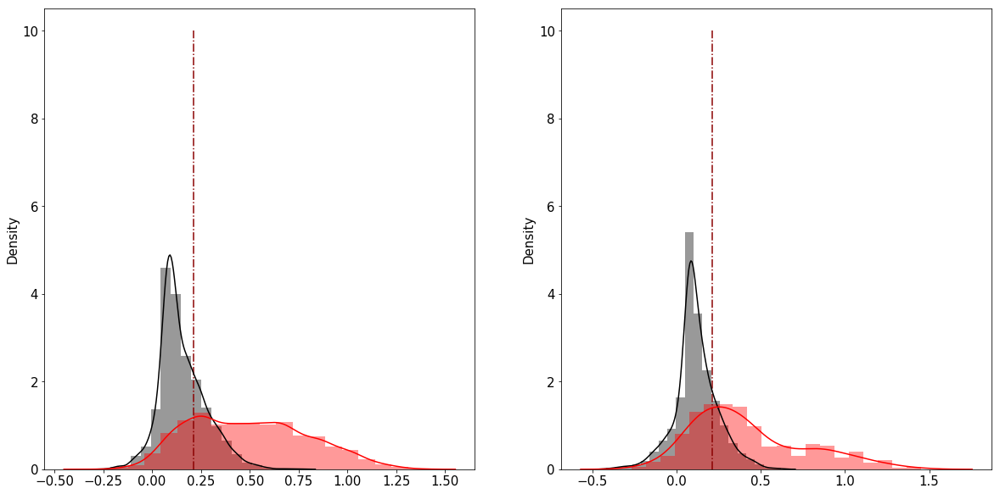

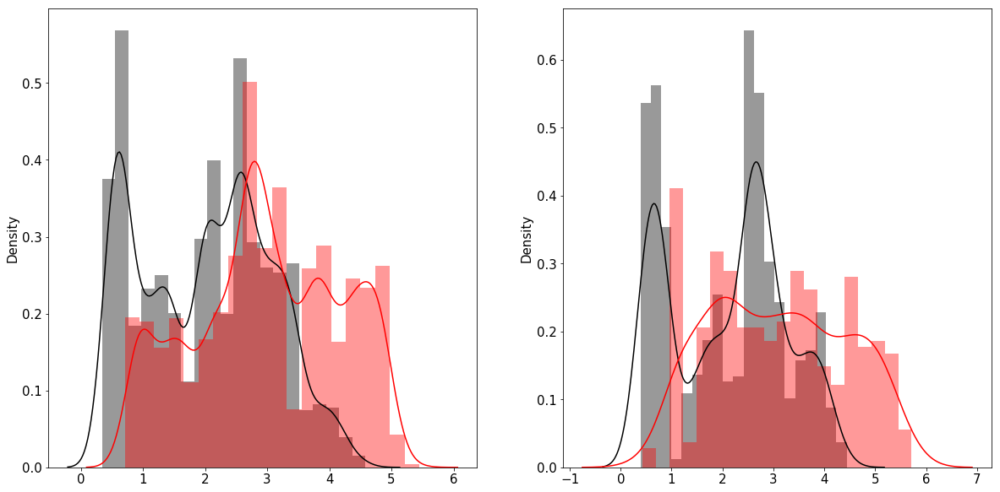

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.28357615894039734
Recall: 0.28357615894039734
Precision: 0.4067692500492836
F1-score: 0.31836038528240307

------------Scores on Test-------------
Accuracy: 0.4193862640038967
Recall: 0.4193862640038967
Precision: 0.6482800118285864
F1-score: 0.474192576065453

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4106/4106 [00:00<00:00, 8913.70it/s]

------------Scores on Train-------------
Accuracy: 0.9055629139072847
Recall: 0.9055629139072847
Precision: 0.9097135189590738
F1-score: 0.9065137875060933

------------Scores on Test-------------
Accuracy: 0.9227959084266927
Recall: 0.9227959084266927
Precision: 0.926584585801458
F1-score: 0.9229814142153948

------------Scores on Train-------------
Accuracy: 0.002216475803472479
Recall: 0.002216475803472479
Precision: 0.00011616091321314692
F1-score: 0.00022075263722336937

------------Scores on Test-------------
Accuracy: 0.005439330543933054
Recall: 0.005439330543933054
Precision: 0.0003135453697004016
F1-score: 0.0005929128081064466




100%|███████████████████████████████████████████████████████████████████████████| 2390/2390 [00:00<00:00, 11486.69it/s]

------------Scores on Train-------------
Accuracy: 0.865533801256003
Recall: 0.865533801256003
Precision: 0.8755645033181115
F1-score: 0.8682322691509781

------------Scores on Test-------------
Accuracy: 0.8343096234309624
Recall: 0.8343096234309624
Precision: 0.8488231178822471
F1-score: 0.8363428869834407



 57%|█████████████████████████████████████████▌                               | 57/100 [14:04:43<12:32:23, 1049.84s/it]

----------------- iSimul = 57-----------------------

Normal observations in train set 6033
Outlier observations in train set 6033 

Normal observations in test set 1332
Outlier observations in test set 266
-------------------Scores on Train set-------------------
Accuracy :  0.8217
Precision :  0.8304
Recall :  0.8086
F1-score: 0.8193


-------------------Scores on Test set-------------------
Accuracy :  0.7854
Precision :  0.4186
Recall :  0.7444
F1-score: 0.5359




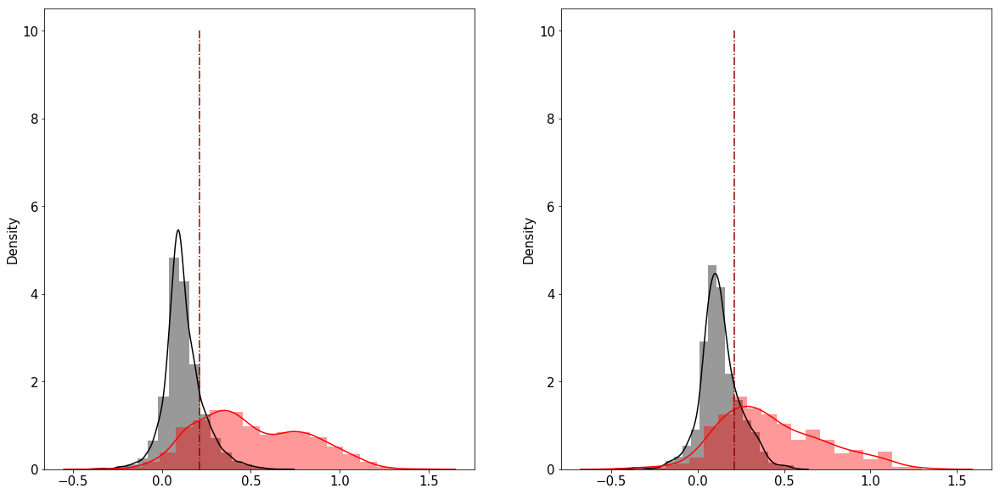

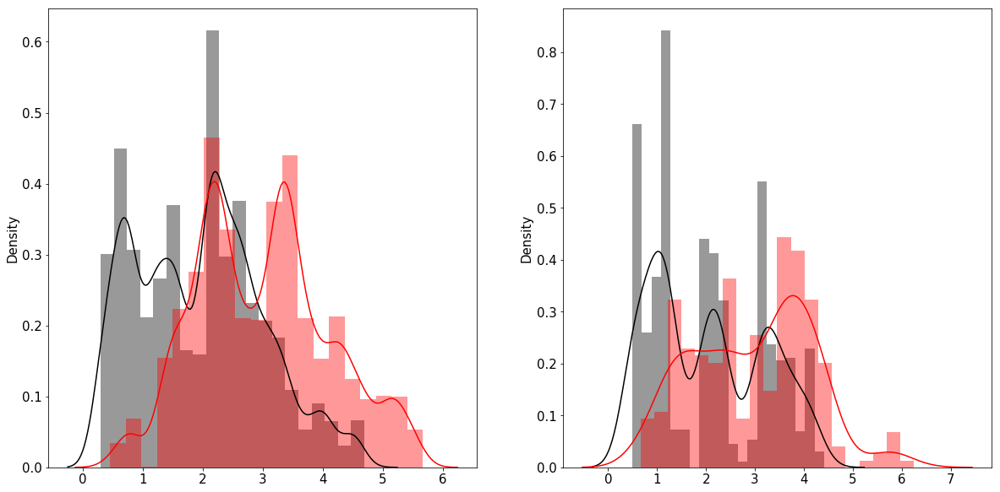

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2632228007673335
Recall: 0.2632228007673335
Precision: 0.38551625882778473
F1-score: 0.29704632971269657

------------Scores on Test-------------
Accuracy: 0.20704375667022412
Recall: 0.20704375667022412
Precision: 0.2527692382093768
F1-score: 0.21530882115063138

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4685/4685 [00:00<00:00, 9518.12it/s]

------------Scores on Train-------------
Accuracy: 0.91682652781584
Recall: 0.91682652781584
Precision: 0.9204014954164247
F1-score: 0.917290621137102

------------Scores on Test-------------
Accuracy: 0.8911419423692636
Recall: 0.8911419423692636
Precision: 0.9000472898283528
F1-score: 0.8934144256644851

------------Scores on Train-------------
Accuracy: 0.0024159078238245677
Recall: 0.0024159078238245677
Precision: 0.00012131531396536567
F1-score: 0.00023102943670453514

------------Scores on Test-------------
Accuracy: 0.002688172043010753
Recall: 0.002688172043010753
Precision: 0.00016552783516076065
F1-score: 0.0003118529052216651




100%|███████████████████████████████████████████████████████████████████████████| 3720/3720 [00:00<00:00, 10359.96it/s]

------------Scores on Train-------------
Accuracy: 0.8910983088645233
Recall: 0.8910983088645233
Precision: 0.8965315921365441
F1-score: 0.891787179091673

------------Scores on Test-------------
Accuracy: 0.8631720430107527
Recall: 0.8631720430107527
Precision: 0.8742084605026954
F1-score: 0.8656164639252658



 58%|███████████████████████████████████████████▌                               | 58/100 [14:08:11<9:18:06, 797.31s/it]

----------------- iSimul = 58-----------------------

Normal observations in train set 6239
Outlier observations in train set 6239 

Normal observations in test set 1342
Outlier observations in test set 268
-------------------Scores on Train set-------------------
Accuracy :  0.8015
Precision :  0.8028
Recall :  0.7993
F1-score: 0.8011


-------------------Scores on Test set-------------------
Accuracy :  0.8019
Precision :  0.4501
Recall :  0.8582
F1-score: 0.5905




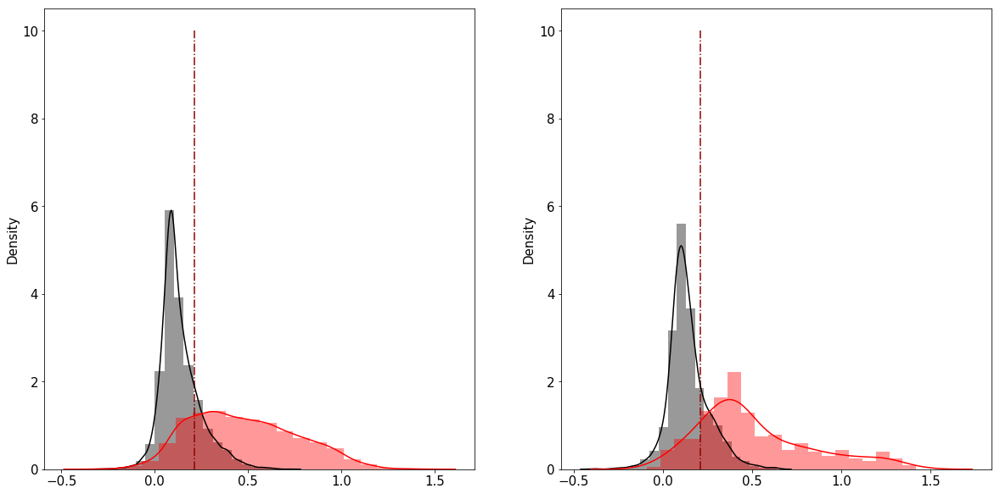

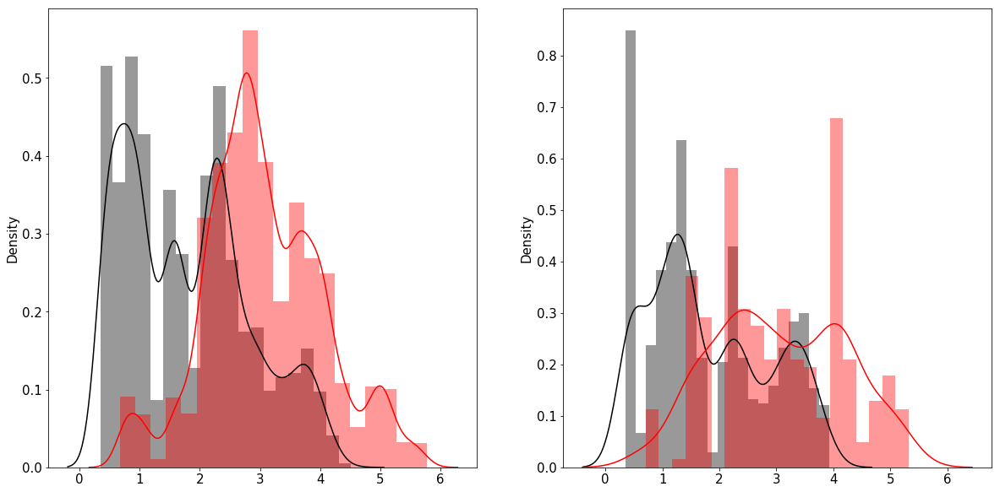

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.34476490547746
Recall: 0.34476490547746
Precision: 0.4542929757575618
F1-score: 0.37074820219342497

------------Scores on Test-------------
Accuracy: 0.30887869945810753
Recall: 0.30887869945810753
Precision: 0.4394421564389245
F1-score: 0.34104633465188733

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4798/4798 [00:00<00:00, 7179.01it/s]

------------Scores on Train-------------
Accuracy: 0.9751575375666505
Recall: 0.9751575375666505
Precision: 0.975974163521201
F1-score: 0.9753326297864442

------------Scores on Test-------------
Accuracy: 0.9255939974989579
Recall: 0.9255939974989579
Precision: 0.9286038463844888
F1-score: 0.9262097104386818

------------Scores on Train-------------
Accuracy: 0.0035081240768094534
Recall: 0.0035081240768094534
Precision: 0.00024353919210908605
F1-score: 0.0004554596946707792

------------Scores on Test-------------
Accuracy: 0.0027092113184828417
Recall: 0.0027092113184828417
Precision: 0.00022944460677704848
F1-score: 0.0004230600257090323




100%|████████████████████████████████████████████████████████████████████████████| 3322/3322 [00:00<00:00, 7899.81it/s]

------------Scores on Train-------------
Accuracy: 0.9608567208271788
Recall: 0.9608567208271788
Precision: 0.9622233955523991
F1-score: 0.9611499277368896

------------Scores on Test-------------
Accuracy: 0.8871161950632149
Recall: 0.8871161950632149
Precision: 0.8911710550428437
F1-score: 0.8879078866241739



 59%|████████████████████████████████████████████▎                              | 59/100 [14:12:16<7:11:35, 631.59s/it]

----------------- iSimul = 59-----------------------

Normal observations in train set 5777
Outlier observations in train set 5777 

Normal observations in test set 1967
Outlier observations in test set 393
-------------------Scores on Train set-------------------
Accuracy :  0.7899
Precision :  0.8165
Recall :  0.7480
F1-score: 0.7807


-------------------Scores on Test set-------------------
Accuracy :  0.8017
Precision :  0.4456
Recall :  0.7812
F1-score: 0.5675




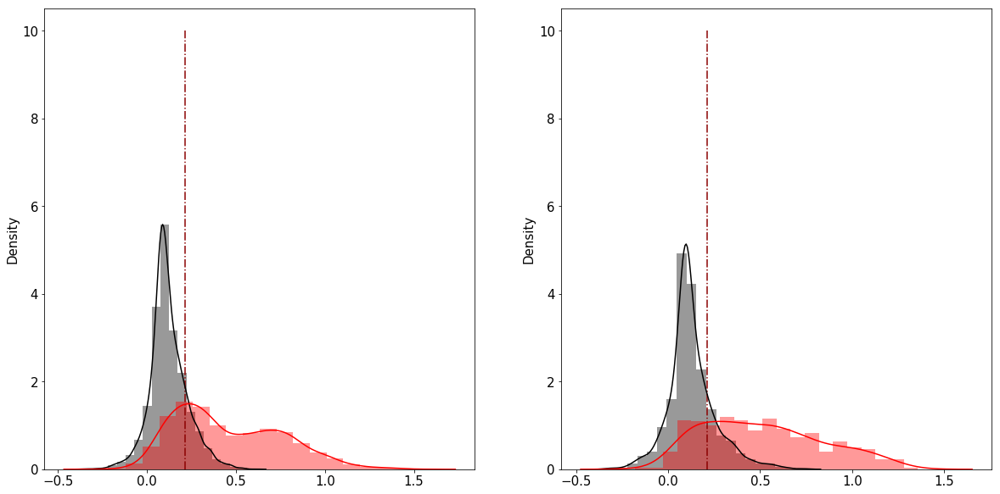

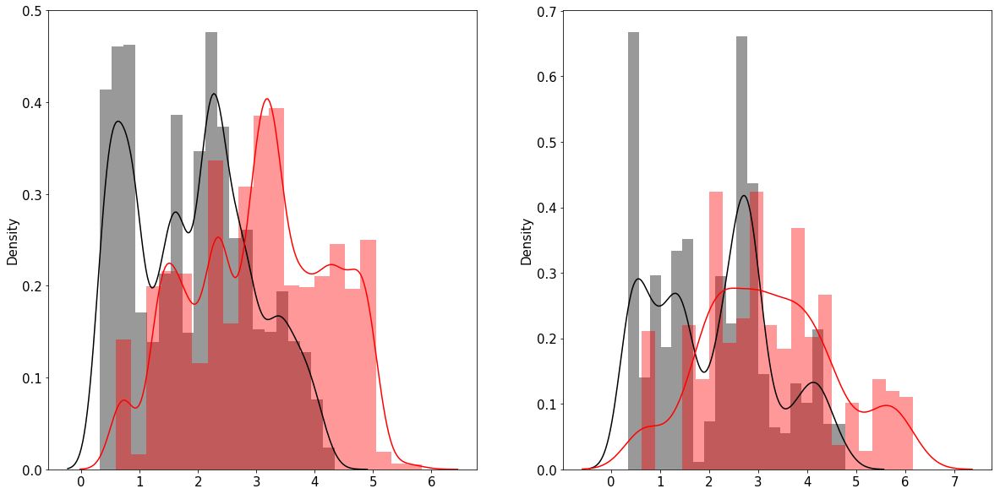

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.31936991518088975
Recall: 0.31936991518088975
Precision: 0.4106325928603432
F1-score: 0.34590167439472974

------------Scores on Test-------------
Accuracy: 0.23699976036424636
Recall: 0.23699976036424636
Precision: 0.3257195343747616
F1-score: 0.2642842197000453

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4173/4173 [00:00<00:00, 5759.16it/s]

------------Scores on Train-------------
Accuracy: 0.8701748312272806
Recall: 0.8701748312272806
Precision: 0.876498729470734
F1-score: 0.8715762898136934

------------Scores on Test-------------
Accuracy: 0.9194823867721064
Recall: 0.9194823867721064
Precision: 0.9260100973318719
F1-score: 0.9210801540250597

------------Scores on Train-------------
Accuracy: 0.003553299492385787
Recall: 0.003553299492385787
Precision: 0.00033672164765750597
F1-score: 0.0006151497982262409

------------Scores on Test-------------
Accuracy: 0.0018814675446848542
Recall: 0.0018814675446848542
Precision: 0.00013439053890606102
F1-score: 0.00025086233929131393




100%|████████████████████████████████████████████████████████████████████████████| 3189/3189 [00:00<00:00, 7982.77it/s]

------------Scores on Train-------------
Accuracy: 0.8055837563451776
Recall: 0.8055837563451776
Precision: 0.8183211656995253
F1-score: 0.8084669206487662

------------Scores on Test-------------
Accuracy: 0.894324239573534
Recall: 0.894324239573534
Precision: 0.9032001147649876
F1-score: 0.8965339157563798



 60%|█████████████████████████████████████████████                              | 60/100 [14:15:27<5:32:56, 499.40s/it]

----------------- iSimul = 60-----------------------

Normal observations in train set 6032
Outlier observations in train set 6032 

Normal observations in test set 1167
Outlier observations in test set 233
-------------------Scores on Train set-------------------
Accuracy :  0.7759
Precision :  0.7570
Recall :  0.8125
F1-score: 0.7838


-------------------Scores on Test set-------------------
Accuracy :  0.7879
Precision :  0.4171
Recall :  0.6910
F1-score: 0.5202




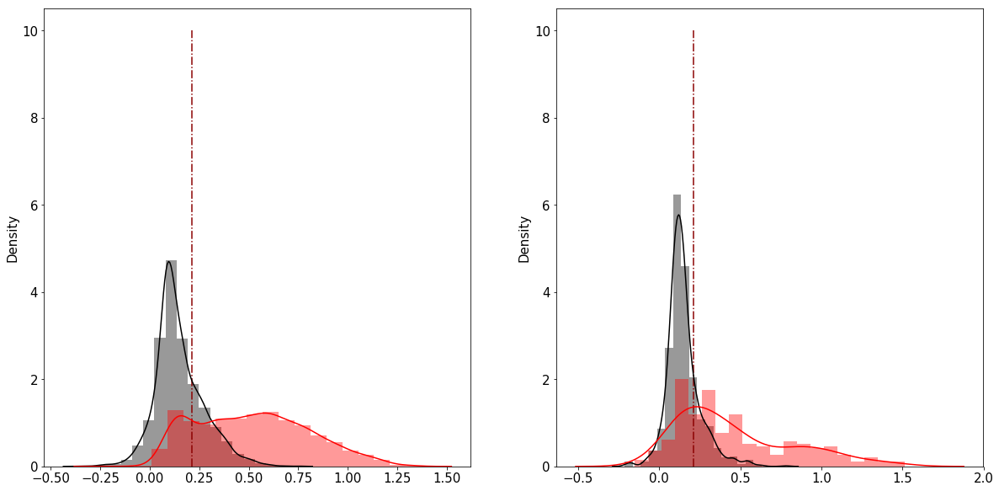

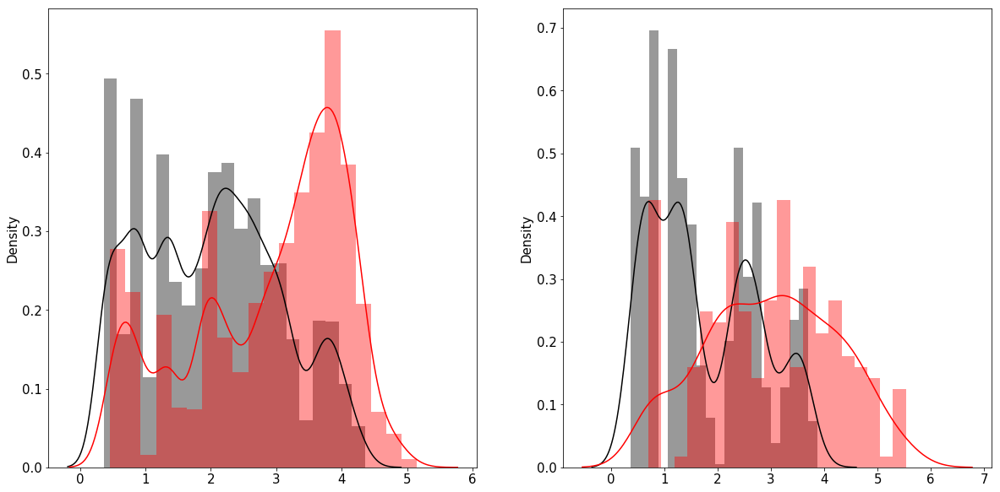

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3471232179226069
Recall: 0.3471232179226069
Precision: 0.4480151102448437
F1-score: 0.37471453015769934

------------Scores on Test-------------
Accuracy: 0.3165091494067967
Recall: 0.3165091494067967
Precision: 0.4451450121702454
F1-score: 0.351348353143505

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4973/4973 [00:00<00:00, 9126.77it/s]

------------Scores on Train-------------
Accuracy: 0.8919297352342159
Recall: 0.8919297352342159
Precision: 0.8965101850120356
F1-score: 0.8928943788204861

------------Scores on Test-------------
Accuracy: 0.8240498692941887
Recall: 0.8240498692941887
Precision: 0.8311879785902285
F1-score: 0.8257729861818922

------------Scores on Train-------------
Accuracy: 0.003695060287825749
Recall: 0.003695060287825749
Precision: 0.00024317411203989678
F1-score: 0.00045631768614715567

------------Scores on Test-------------
Accuracy: 0.0029385836027034967
Recall: 0.0029385836027034967
Precision: 0.00014218952916307244
F1-score: 0.0002712538710187843




100%|████████████████████████████████████████████████████████████████████████████| 3403/3403 [00:00<00:00, 8188.09it/s]

------------Scores on Train-------------
Accuracy: 0.8364449630493971
Recall: 0.8364449630493971
Precision: 0.8434154052071591
F1-score: 0.8373221210008222

------------Scores on Test-------------
Accuracy: 0.7469879518072289
Recall: 0.7469879518072289
Precision: 0.7584167166504295
F1-score: 0.7496013243448314



 61%|█████████████████████████████████████████████▊                             | 61/100 [14:19:34<4:35:17, 423.52s/it]

----------------- iSimul = 61-----------------------

Normal observations in train set 6396
Outlier observations in train set 6396 

Normal observations in test set 1884
Outlier observations in test set 376
-------------------Scores on Train set-------------------
Accuracy :  0.7909
Precision :  0.8032
Recall :  0.7706
F1-score: 0.7866


-------------------Scores on Test set-------------------
Accuracy :  0.8146
Precision :  0.4680
Recall :  0.8351
F1-score: 0.5998




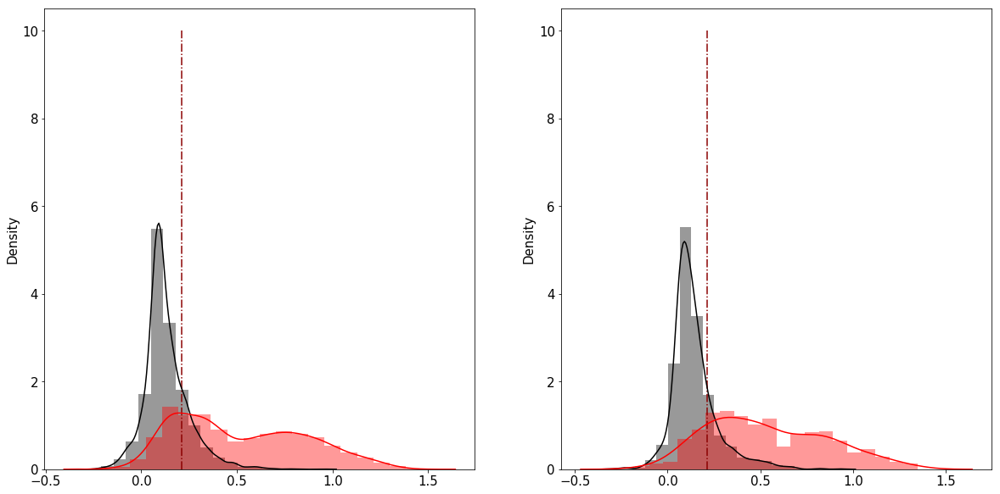

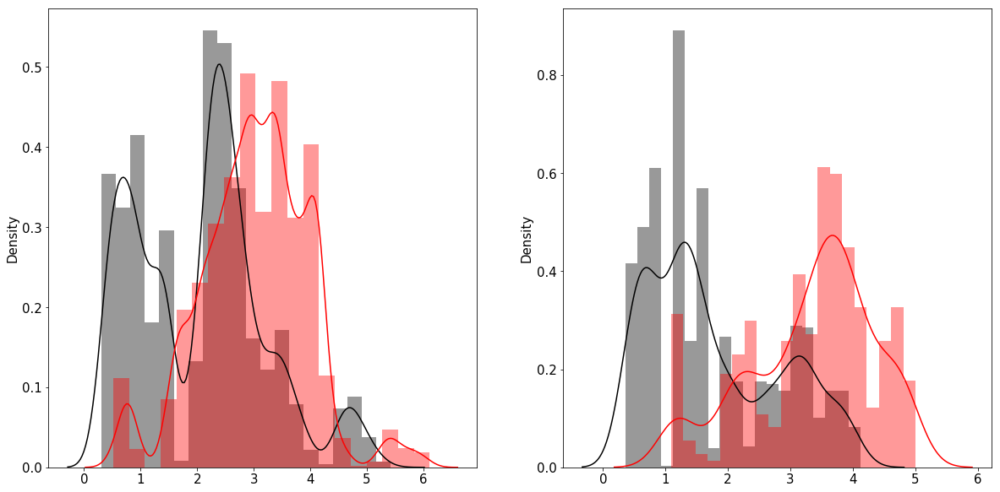

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.19270833333333334
Recall: 0.19270833333333334
Precision: 0.24135352954197956
F1-score: 0.20204877836218918

------------Scores on Test-------------
Accuracy: 0.34868421052631576
Recall: 0.34868421052631576
Precision: 0.4562683301224872
F1-score: 0.3838068114389472

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4256/4256 [00:00<00:00, 9908.07it/s]

------------Scores on Train-------------
Accuracy: 0.8740885416666667
Recall: 0.8740885416666667
Precision: 0.8796496960064174
F1-score: 0.8757364939430364

------------Scores on Test-------------
Accuracy: 0.9363251879699248
Recall: 0.9363251879699248
Precision: 0.9401992124630132
F1-score: 0.9367010836443412

------------Scores on Train-------------
Accuracy: 0.0020947470190138574
Recall: 0.0020947470190138574
Precision: 0.00012930537154406529
F1-score: 0.00024357523476905324

------------Scores on Test-------------
Accuracy: 0.0028808066258552397
Recall: 0.0028808066258552397
Precision: 0.00019603122010257546
F1-score: 0.00036708339276825757




100%|███████████████████████████████████████████████████████████████████████████| 2777/2777 [00:00<00:00, 11027.51it/s]

------------Scores on Train-------------
Accuracy: 0.8427328391878827
Recall: 0.8427328391878827
Precision: 0.8512363223950771
F1-score: 0.845150983505768

------------Scores on Test-------------
Accuracy: 0.9042131796903133
Recall: 0.9042131796903133
Precision: 0.9107902829732339
F1-score: 0.9045128503448422



 62%|██████████████████████████████████████████████▌                            | 62/100 [14:23:57<3:57:51, 375.56s/it]

----------------- iSimul = 62-----------------------

Normal observations in train set 5946
Outlier observations in train set 5946 

Normal observations in test set 1396
Outlier observations in test set 279
-------------------Scores on Train set-------------------
Accuracy :  0.7934
Precision :  0.8189
Recall :  0.7534
F1-score: 0.7848


-------------------Scores on Test set-------------------
Accuracy :  0.7916
Precision :  0.4300
Recall :  0.7706
F1-score: 0.5520




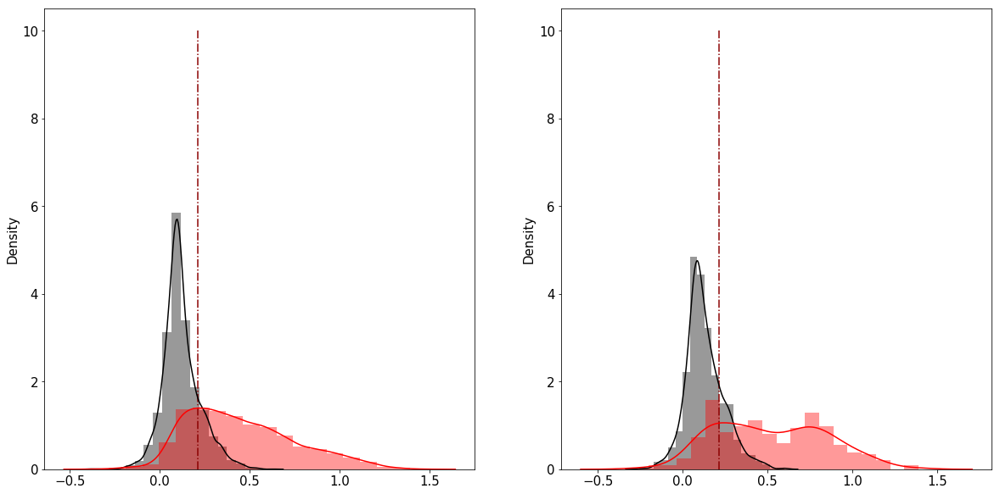

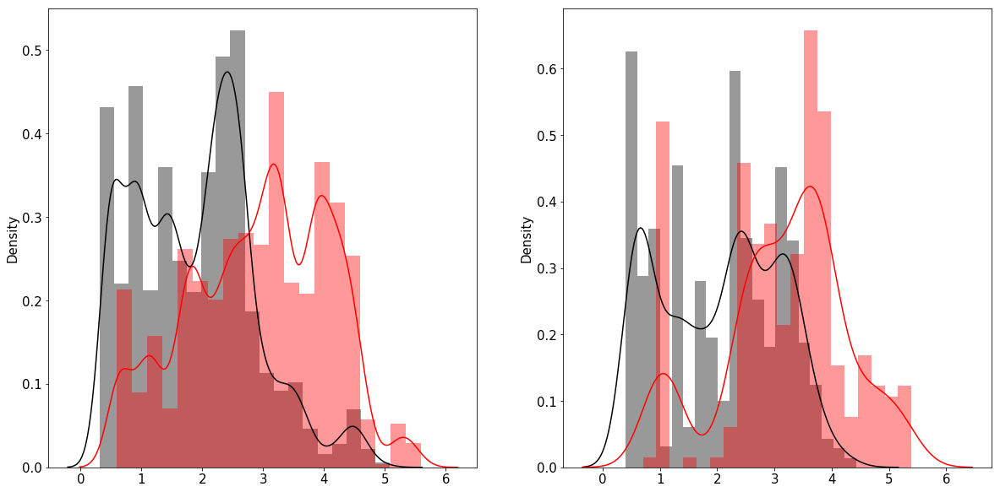

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.27621825252157006
Recall: 0.27621825252157006
Precision: 0.362076117566417
F1-score: 0.2955359278156329

------------Scores on Test-------------
Accuracy: 0.3246205733558179
Recall: 0.3246205733558179
Precision: 0.43939567156560705
F1-score: 0.35816275183333096

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4744/4744 [00:00<00:00, 7358.52it/s]

------------Scores on Train-------------
Accuracy: 0.8786000729128691
Recall: 0.8786000729128691
Precision: 0.8810033511737725
F1-score: 0.87918240113076

------------Scores on Test-------------
Accuracy: 0.9285413153456998
Recall: 0.9285413153456998
Precision: 0.9320554775402337
F1-score: 0.9290482016798565

------------Scores on Train-------------
Accuracy: 0.00268411340379131
Recall: 0.00268411340379131
Precision: 0.0001988232150956526
F1-score: 0.0003702225384539738

------------Scores on Test-------------
Accuracy: 0.0028046120286693674
Recall: 0.0028046120286693674
Precision: 0.00015832487258617397
F1-score: 0.00029972952978145914




100%|████████████████████████████████████████████████████████████████████████████| 3209/3209 [00:00<00:00, 8474.80it/s]

------------Scores on Train-------------
Accuracy: 0.8349270256668344
Recall: 0.8349270256668344
Precision: 0.8396176492756328
F1-score: 0.8362170917963866

------------Scores on Test-------------
Accuracy: 0.885322530383297
Recall: 0.885322530383297
Precision: 0.8931762967381227
F1-score: 0.8864434711027736



 63%|███████████████████████████████████████████████▎                           | 63/100 [14:28:12<3:29:10, 339.19s/it]

----------------- iSimul = 63-----------------------

Normal observations in train set 4950
Outlier observations in train set 4950 

Normal observations in test set 1999
Outlier observations in test set 399
-------------------Scores on Train set-------------------
Accuracy :  0.7930
Precision :  0.7821
Recall :  0.8123
F1-score: 0.7969


-------------------Scores on Test set-------------------
Accuracy :  0.7957
Precision :  0.4463
Recall :  0.9474
F1-score: 0.6067




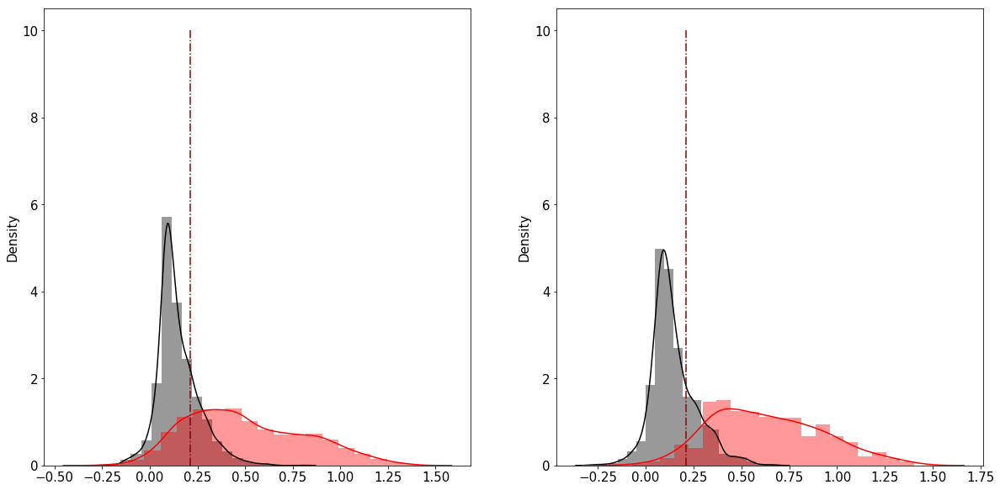

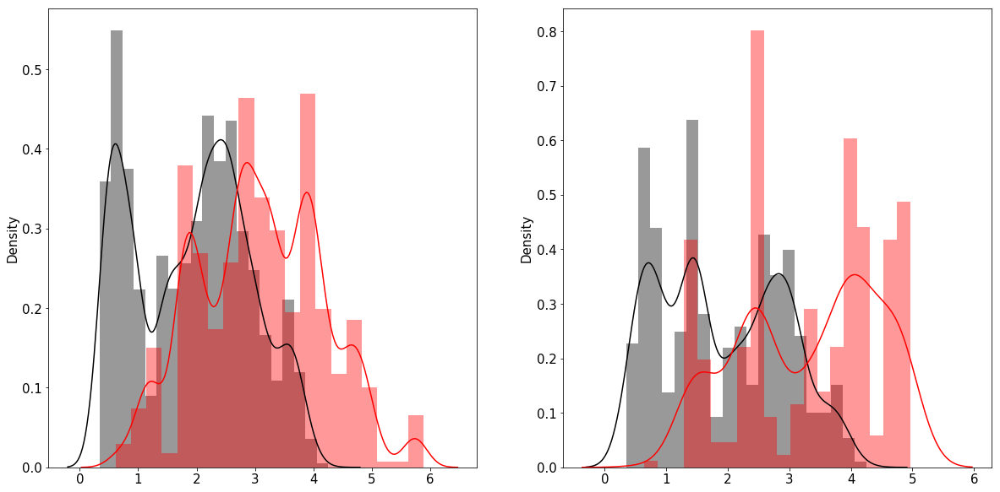

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.31931410033599816
Recall: 0.31931410033599816
Precision: 0.4396003485298102
F1-score: 0.35297782793255117

------------Scores on Test-------------
Accuracy: 0.397005554213958
Recall: 0.397005554213958
Precision: 0.5673537514915575
F1-score: 0.4547407628959336

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4141/4141 [00:00<00:00, 9068.73it/s]

------------Scores on Train-------------
Accuracy: 0.940447225118758
Recall: 0.940447225118758
Precision: 0.9415214075215136
F1-score: 0.940700119972026

------------Scores on Test-------------
Accuracy: 0.9659502535619415
Recall: 0.9659502535619415
Precision: 0.967812314828543
F1-score: 0.9662134132168084

------------Scores on Train-------------
Accuracy: 0.0027178528962119924
Recall: 0.0027178528962119924
Precision: 0.00017521390485324687
F1-score: 0.00032920471700595964

------------Scores on Test-------------
Accuracy: 0.0023990403838464614
Recall: 0.0023990403838464614
Precision: 0.0001274317063013132
F1-score: 0.00024200845977398515




100%|████████████████████████████████████████████████████████████████████████████| 2501/2501 [00:00<00:00, 8615.56it/s]

------------Scores on Train-------------
Accuracy: 0.9116697808731102
Recall: 0.9116697808731102
Precision: 0.913557408349972
F1-score: 0.9120612881150906

------------Scores on Test-------------
Accuracy: 0.9436225509796081
Recall: 0.9436225509796081
Precision: 0.9491956813104215
F1-score: 0.9445711905193125



 64%|████████████████████████████████████████████████                           | 64/100 [14:32:07<3:04:43, 307.88s/it]

----------------- iSimul = 64-----------------------

Normal observations in train set 5904
Outlier observations in train set 5904 

Normal observations in test set 2094
Outlier observations in test set 418
-------------------Scores on Train set-------------------
Accuracy :  0.7622
Precision :  0.7297
Recall :  0.8330
F1-score: 0.7779


-------------------Scores on Test set-------------------
Accuracy :  0.7472
Precision :  0.3824
Recall :  0.8445
F1-score: 0.5265




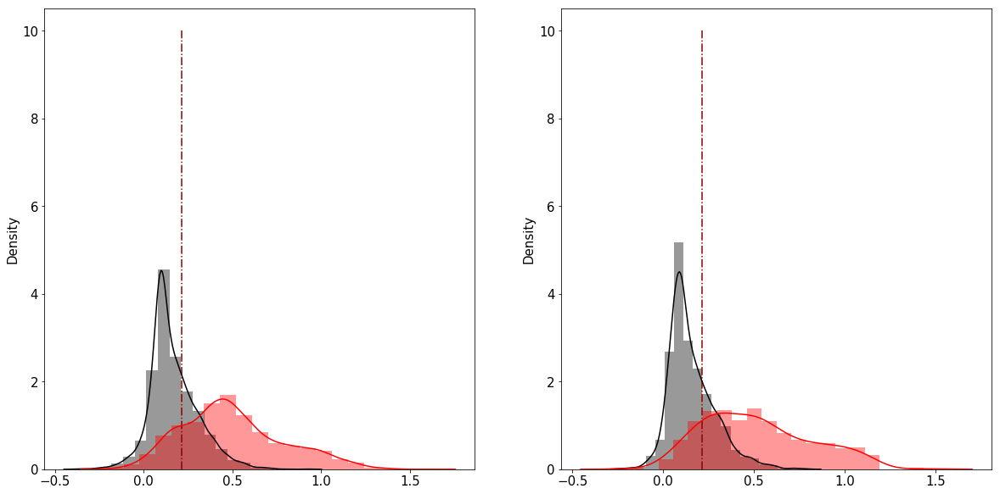

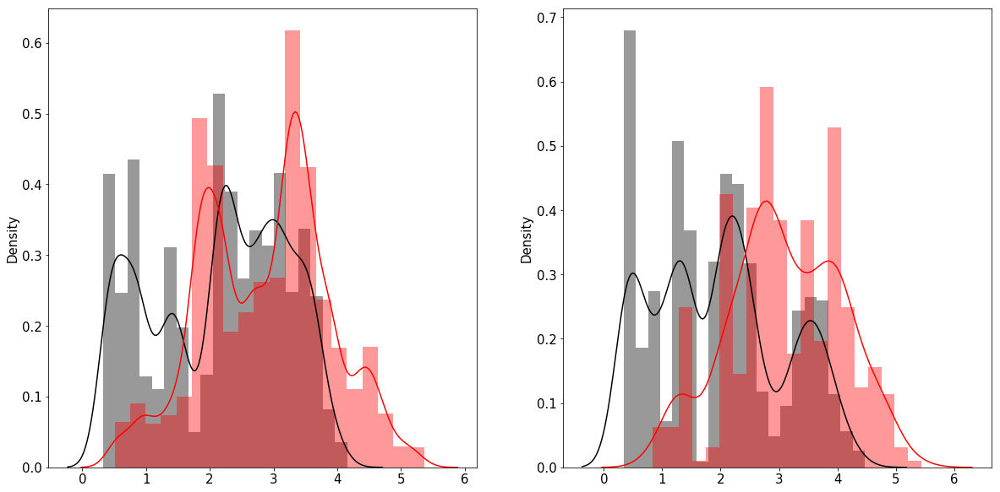

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3198177676537585
Recall: 0.3198177676537585
Precision: 0.4284660598588081
F1-score: 0.34837185620714506

------------Scores on Test-------------
Accuracy: 0.4134948096885813
Recall: 0.4134948096885813
Precision: 0.455239797765621
F1-score: 0.42291877658497257

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4046/4046 [00:00<00:00, 9275.10it/s]

------------Scores on Train-------------
Accuracy: 0.9624145785876993
Recall: 0.9624145785876993
Precision: 0.9629245203891227
F1-score: 0.9624881327519316

------------Scores on Test-------------
Accuracy: 0.9100346020761245
Recall: 0.9100346020761245
Precision: 0.9131083952890872
F1-score: 0.9104662947984032

------------Scores on Train-------------
Accuracy: 0.002676032781401572
Recall: 0.002676032781401572
Precision: 0.00015672227123874507
F1-score: 0.0002961032123265917

------------Scores on Test-------------
Accuracy: 0.00503989920201596
Recall: 0.00503989920201596
Precision: 0.0006453529465996046
F1-score: 0.0011441933323495693




100%|███████████████████████████████████████████████████████████████████████████| 2381/2381 [00:00<00:00, 11595.60it/s]

------------Scores on Train-------------
Accuracy: 0.9454758320789429
Recall: 0.9454758320789429
Precision: 0.9467544725813323
F1-score: 0.945629453343491

------------Scores on Test-------------
Accuracy: 0.8483830323393532
Recall: 0.8483830323393532
Precision: 0.8554126454105213
F1-score: 0.8484991395707432



 65%|████████████████████████████████████████████████▊                          | 65/100 [14:36:12<2:48:35, 289.00s/it]

----------------- iSimul = 65-----------------------

Normal observations in train set 5810
Outlier observations in train set 5810 

Normal observations in test set 2316
Outlier observations in test set 463
-------------------Scores on Train set-------------------
Accuracy :  0.7736
Precision :  0.7667
Recall :  0.7864
F1-score: 0.7764


-------------------Scores on Test set-------------------
Accuracy :  0.6815
Precision :  0.3046
Recall :  0.7106
F1-score: 0.4264




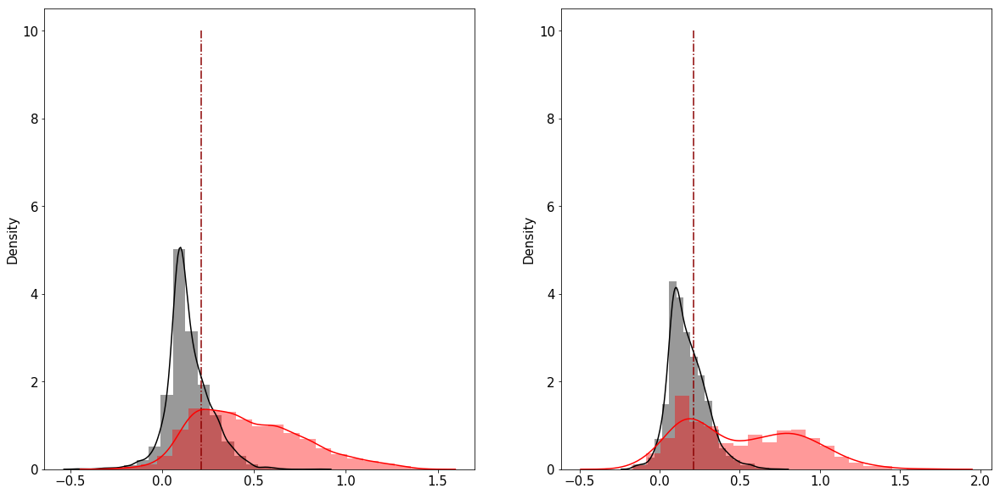

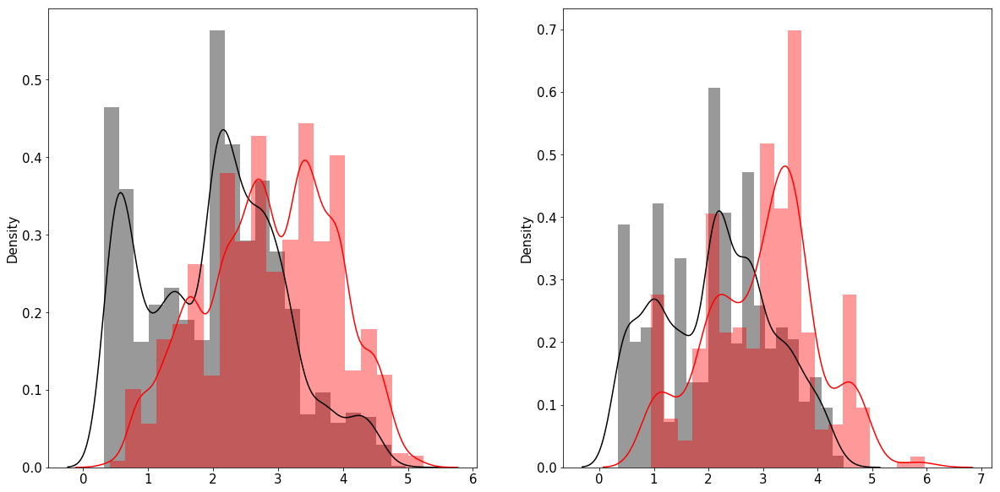

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.24569561392484604
Recall: 0.24569561392484604
Precision: 0.3463286484979315
F1-score: 0.2714487213472458

------------Scores on Test-------------
Accuracy: 0.3851987447698745
Recall: 0.3851987447698745
Precision: 0.4683258748761501
F1-score: 0.40361162129338796

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 3824/3824 [00:00<00:00, 8729.24it/s]

------------Scores on Train-------------
Accuracy: 0.8720623350508986
Recall: 0.8720623350508986
Precision: 0.8759436712263575
F1-score: 0.8723919152090237

------------Scores on Test-------------
Accuracy: 0.8956589958158996
Recall: 0.8956589958158996
Precision: 0.9036505652606183
F1-score: 0.8978661459217671

------------Scores on Train-------------
Accuracy: 0.0019983347210657783
Recall: 0.0019983347210657783
Precision: 0.00011427427290552107
F1-score: 0.00021618600311113837

------------Scores on Test-------------
Accuracy: 0.005082592121982211
Recall: 0.005082592121982211
Precision: 0.0004566391359593393
F1-score: 0.0008379900989648088




100%|███████████████████████████████████████████████████████████████████████████| 2361/2361 [00:00<00:00, 10032.16it/s]

------------Scores on Train-------------
Accuracy: 0.8311407160699417
Recall: 0.8311407160699417
Precision: 0.83809479099999
F1-score: 0.8317065045644598

------------Scores on Test-------------
Accuracy: 0.8348157560355781
Recall: 0.8348157560355781
Precision: 0.8493602736349091
F1-score: 0.8381427323718612



 66%|█████████████████████████████████████████████████▌                         | 66/100 [14:40:02<2:33:51, 271.52s/it]

----------------- iSimul = 66-----------------------

Normal observations in train set 6394
Outlier observations in train set 6394 

Normal observations in test set 1402
Outlier observations in test set 280
-------------------Scores on Train set-------------------
Accuracy :  0.7997
Precision :  0.8014
Recall :  0.7970
F1-score: 0.7992


-------------------Scores on Test set-------------------
Accuracy :  0.7747
Precision :  0.4111
Recall :  0.8179
F1-score: 0.5472




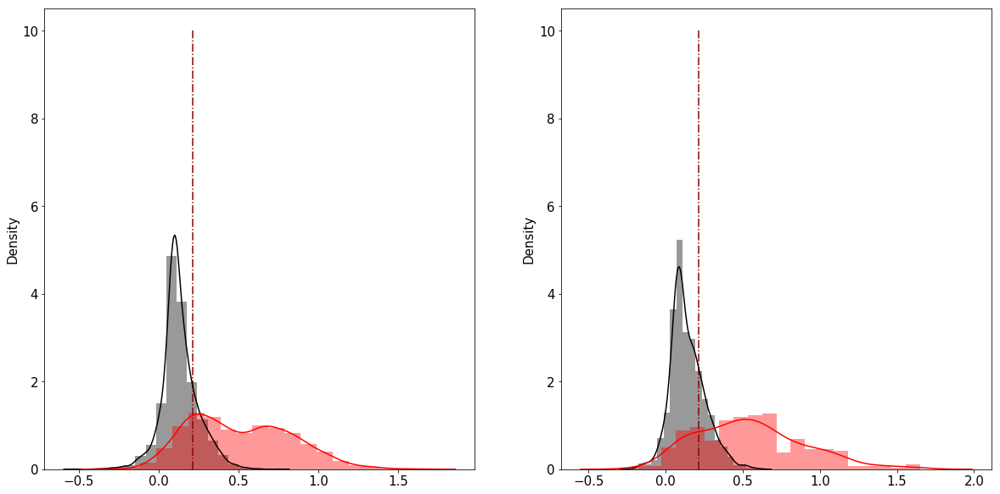

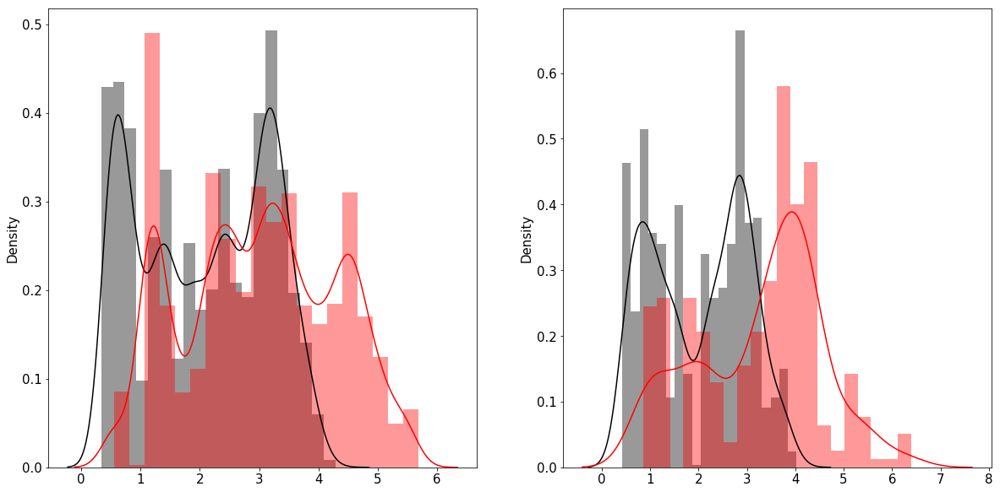

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.33700787401574805
Recall: 0.33700787401574805
Precision: 0.45751501688350954
F1-score: 0.3710306281729171

------------Scores on Test-------------
Accuracy: 0.2458843393837062
Recall: 0.2458843393837062
Precision: 0.3853021148724625
F1-score: 0.2798499389685913

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4738/4738 [00:00<00:00, 8393.40it/s]

------------Scores on Train-------------
Accuracy: 0.8804461942257218
Recall: 0.8804461942257218
Precision: 0.8856037496184316
F1-score: 0.881720700997031

------------Scores on Test-------------
Accuracy: 0.9200084423807514
Recall: 0.9200084423807514
Precision: 0.922610634356705
F1-score: 0.9205925837971777

------------Scores on Train-------------
Accuracy: 0.0029644268774703555
Recall: 0.0029644268774703555
Precision: 0.0001532569286727658
F1-score: 0.0002914464626726473

------------Scores on Test-------------
Accuracy: 0.0022358859698155395
Recall: 0.0022358859698155395
Precision: 0.00013870260358657193
F1-score: 0.00026120163198779664




100%|███████████████████████████████████████████████████████████████████████████| 3578/3578 [00:00<00:00, 10395.58it/s]

------------Scores on Train-------------
Accuracy: 0.8158102766798419
Recall: 0.8158102766798419
Precision: 0.8238108460648151
F1-score: 0.8177758399648843

------------Scores on Test-------------
Accuracy: 0.9044158747903857
Recall: 0.9044158747903857
Precision: 0.9089674387593538
F1-score: 0.9053248003679327



 67%|██████████████████████████████████████████████████▎                        | 67/100 [14:43:55<2:22:59, 259.99s/it]

----------------- iSimul = 67-----------------------

Normal observations in train set 5558
Outlier observations in train set 5558 

Normal observations in test set 2114
Outlier observations in test set 422
-------------------Scores on Train set-------------------
Accuracy :  0.7850
Precision :  0.7974
Recall :  0.7641
F1-score: 0.7804


-------------------Scores on Test set-------------------
Accuracy :  0.8399
Precision :  0.5128
Recall :  0.7583
F1-score: 0.6119




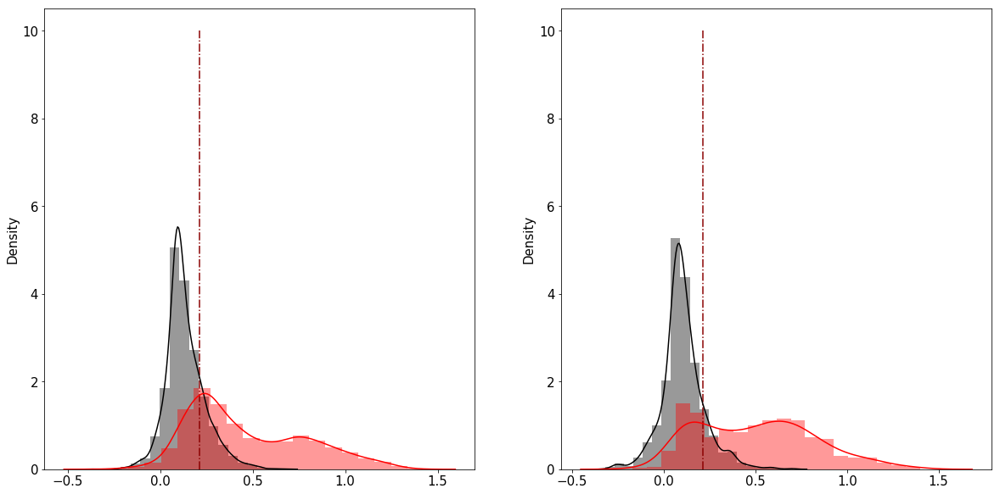

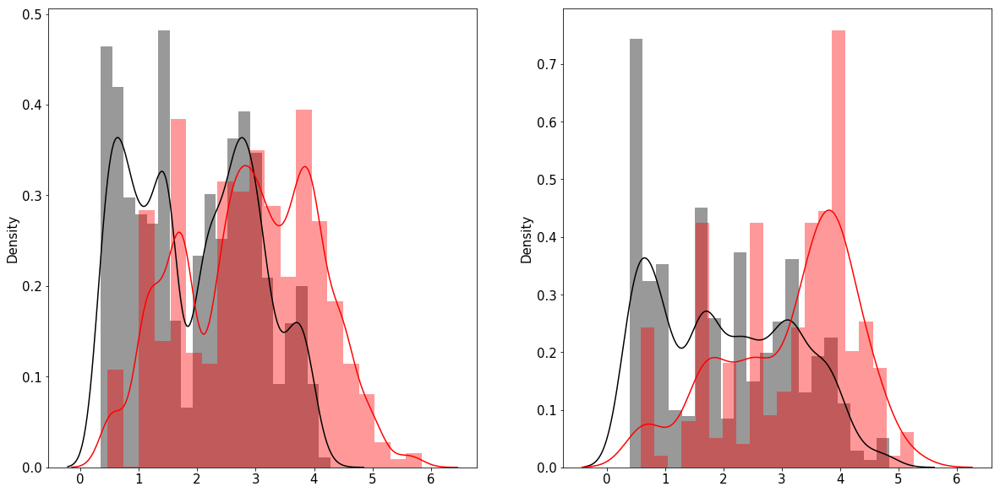

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.4165977065847027
Recall: 0.4165977065847027
Precision: 0.5419775998168767
F1-score: 0.45046397131366894

------------Scores on Test-------------
Accuracy: 0.5124192747143567
Recall: 0.5124192747143567
Precision: 0.6397706561123682
F1-score: 0.5488075652427535

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4026/4026 [00:00<00:00, 10904.97it/s]

------------Scores on Train-------------
Accuracy: 0.9689088544745241
Recall: 0.9689088544745241
Precision: 0.9702488655907023
F1-score: 0.9692037964375226

------------Scores on Test-------------
Accuracy: 0.8795330352707402
Recall: 0.8795330352707402
Precision: 0.8850894124348186
F1-score: 0.8804429356318735

------------Scores on Train-------------
Accuracy: 0.004447139680614514
Recall: 0.004447139680614514
Precision: 0.000313178850747501
F1-score: 0.0005851499579755939

------------Scores on Test-------------
Accuracy: 0.007606490872210953
Recall: 0.007606490872210952
Precision: 0.0006107401430242371
F1-score: 0.001130694589112439




100%|████████████████████████████████████████████████████████████████████████████| 1972/1972 [00:00<00:00, 9397.28it/s]

------------Scores on Train-------------
Accuracy: 0.9506771780877299
Recall: 0.9506771780877299
Precision: 0.9543257923200363
F1-score: 0.9514279946775608

------------Scores on Test-------------
Accuracy: 0.7692697768762677
Recall: 0.7692697768762677
Precision: 0.7836434778878997
F1-score: 0.7719513699326571



 68%|███████████████████████████████████████████████████                        | 68/100 [14:47:50<2:14:39, 252.49s/it]

----------------- iSimul = 68-----------------------

Normal observations in train set 6437
Outlier observations in train set 6437 

Normal observations in test set 2028
Outlier observations in test set 405
-------------------Scores on Train set-------------------
Accuracy :  0.8313
Precision :  0.8220
Recall :  0.8457
F1-score: 0.8337


-------------------Scores on Test set-------------------
Accuracy :  0.7431
Precision :  0.3733
Recall :  0.8000
F1-score: 0.5090




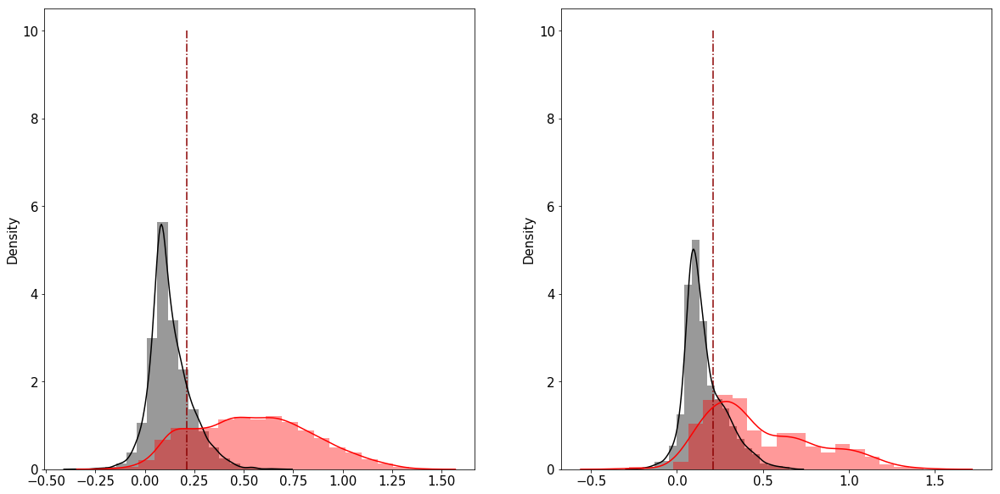

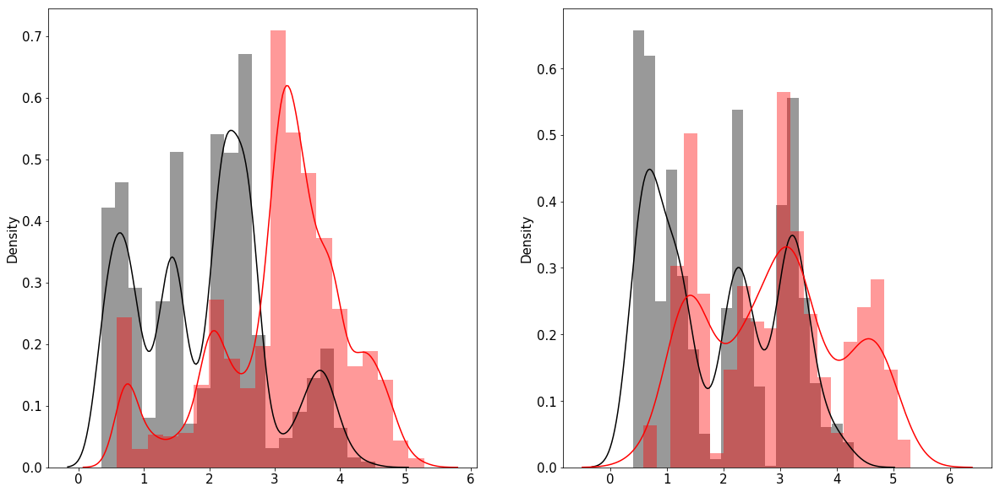

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3423772609819121
Recall: 0.3423772609819121
Precision: 0.4085334063495971
F1-score: 0.36386374452850734

------------Scores on Test-------------
Accuracy: 0.30471789883268485
Recall: 0.30471789883268485
Precision: 0.38368041071987125
F1-score: 0.32648630131480794

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4112/4112 [00:00<00:00, 10235.52it/s]

------------Scores on Train-------------
Accuracy: 0.9323858742463393
Recall: 0.9323858742463393
Precision: 0.934490191567127
F1-score: 0.9328352092485469

------------Scores on Test-------------
Accuracy: 0.9000486381322957
Recall: 0.9000486381322957
Precision: 0.9036992559222885
F1-score: 0.9002864633570813

------------Scores on Train-------------
Accuracy: 0.0032665505226480837
Recall: 0.0032665505226480837
Precision: 0.00032068874994033695
F1-score: 0.0005840402181865596

------------Scores on Test-------------
Accuracy: 0.0024449877750611247
Recall: 0.0024449877750611247
Precision: 0.00019747978183186007
F1-score: 0.000365443012642588




100%|████████████████████████████████████████████████████████████████████████████| 2863/2863 [00:00<00:00, 7737.69it/s]

------------Scores on Train-------------
Accuracy: 0.899390243902439
Recall: 0.899390243902439
Precision: 0.9042846484273123
F1-score: 0.9004524106475217

------------Scores on Test-------------
Accuracy: 0.8557457212713936
Recall: 0.8557457212713936
Precision: 0.8632158813445573
F1-score: 0.8560373701475509



 69%|███████████████████████████████████████████████████▋                       | 69/100 [14:51:41<2:07:00, 245.84s/it]

----------------- iSimul = 69-----------------------

Normal observations in train set 5991
Outlier observations in train set 5991 

Normal observations in test set 1765
Outlier observations in test set 353
-------------------Scores on Train set-------------------
Accuracy :  0.8055
Precision :  0.7861
Recall :  0.8393
F1-score: 0.8118


-------------------Scores on Test set-------------------
Accuracy :  0.6865
Precision :  0.3177
Recall :  0.7677
F1-score: 0.4494




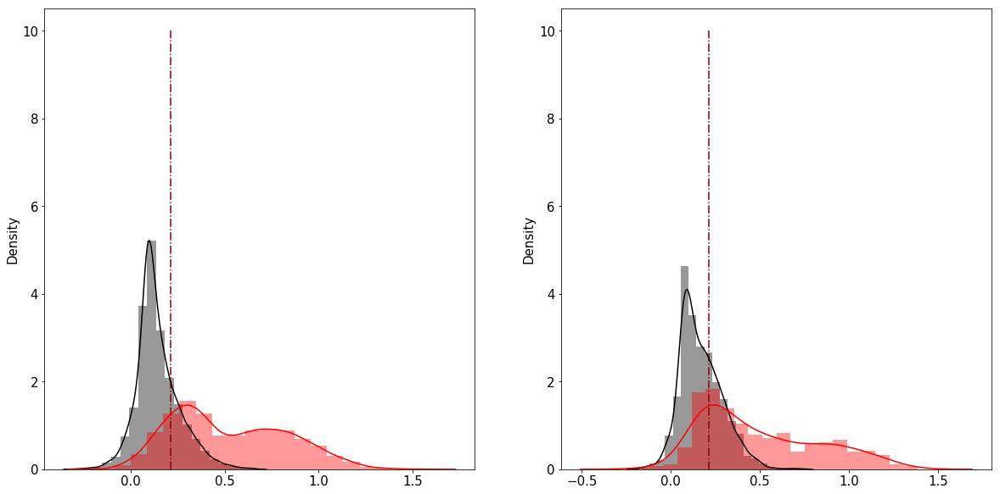

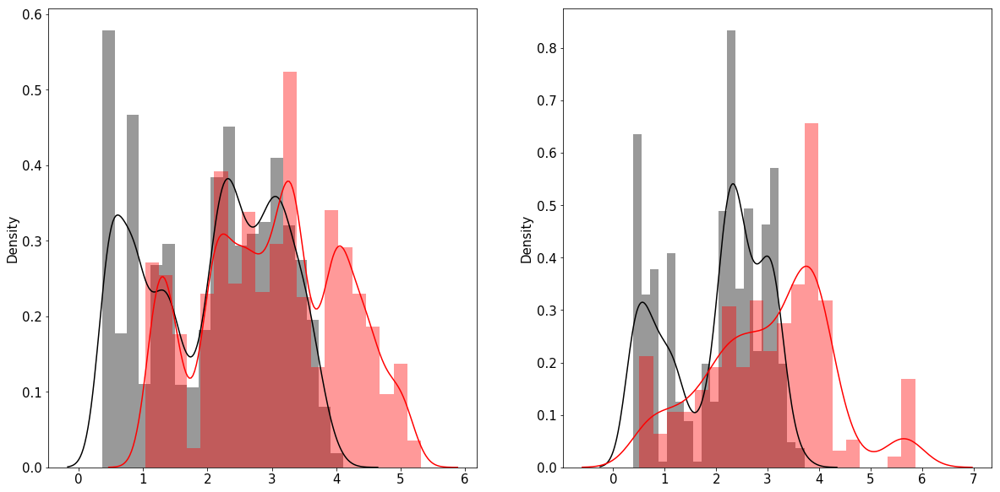

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.27574257425742577
Recall: 0.27574257425742577
Precision: 0.36830891149775064
F1-score: 0.3005690385813266

------------Scores on Test-------------
Accuracy: 0.3778285714285714
Recall: 0.3778285714285714
Precision: 0.48938467072875086
F1-score: 0.3990129068326095

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4375/4375 [00:00<00:00, 7744.45it/s]

------------Scores on Train-------------
Accuracy: 0.8362623762376238
Recall: 0.8362623762376238
Precision: 0.8458442227388645
F1-score: 0.8389285556473746

------------Scores on Test-------------
Accuracy: 0.9101714285714285
Recall: 0.9101714285714285
Precision: 0.9156288775280941
F1-score: 0.9115568146148938

------------Scores on Train-------------
Accuracy: 0.002217673149095872
Recall: 0.002217673149095872
Precision: 0.00015347219024884926
F1-score: 0.0002870774303036727

------------Scores on Test-------------
Accuracy: 0.004760161113145368
Recall: 0.004760161113145368
Precision: 0.0002957496549587359
F1-score: 0.0005568990717328843




100%|███████████████████████████████████████████████████████████████████████████| 2731/2731 [00:00<00:00, 11098.43it/s]

------------Scores on Train-------------
Accuracy: 0.7778915046059366
Recall: 0.7778915046059366
Precision: 0.7897923395332085
F1-score: 0.7809776483431855

------------Scores on Test-------------
Accuracy: 0.8549981691688027
Recall: 0.8549981691688027
Precision: 0.8675964098511152
F1-score: 0.8577148794406946



 70%|████████████████████████████████████████████████████▌                      | 70/100 [14:55:40<2:01:57, 243.92s/it]

----------------- iSimul = 70-----------------------

Normal observations in train set 5963
Outlier observations in train set 5963 

Normal observations in test set 2667
Outlier observations in test set 533
-------------------Scores on Train set-------------------
Accuracy :  0.8334
Precision :  0.8310
Recall :  0.8370
F1-score: 0.8340


-------------------Scores on Test set-------------------
Accuracy :  0.7666
Precision :  0.3963
Recall :  0.7674
F1-score: 0.5227




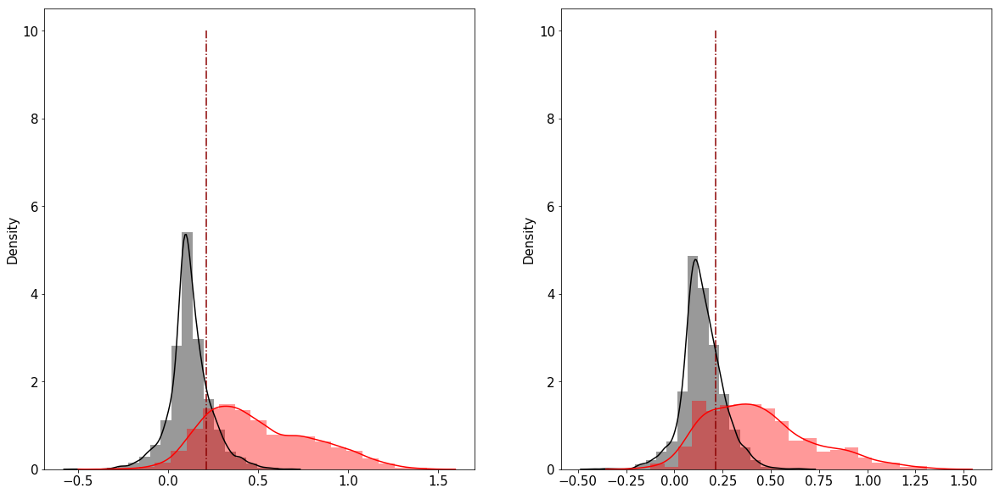

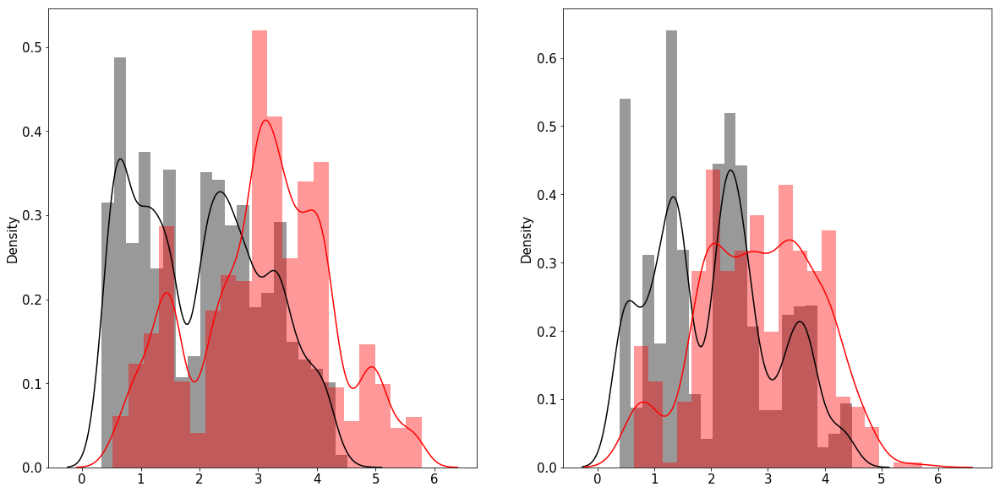

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.34113084813610206
Recall: 0.34113084813610206
Precision: 0.4817630834332355
F1-score: 0.38061341860073544

------------Scores on Test-------------
Accuracy: 0.30578750359919377
Recall: 0.30578750359919377
Precision: 0.47035073999969224
F1-score: 0.34258671977654626

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 3473/3473 [00:00<00:00, 10100.78it/s]

------------Scores on Train-------------
Accuracy: 0.9239429572179134
Recall: 0.9239429572179134
Precision: 0.925787807372233
F1-score: 0.9242675738384273

------------Scores on Test-------------
Accuracy: 0.9188021883098186
Recall: 0.9188021883098186
Precision: 0.9233731164403929
F1-score: 0.9191852769661588

------------Scores on Train-------------
Accuracy: 0.0032215273829827554
Recall: 0.0032215273829827554
Precision: 0.00020737376866505758
F1-score: 0.000389664352934623

------------Scores on Test-------------
Accuracy: 0.0037313432835820895
Recall: 0.0037313432835820895
Precision: 0.0002549364976360434
F1-score: 0.00047726483859770915




100%|████████████████████████████████████████████████████████████████████████████| 2412/2412 [00:00<00:00, 8974.73it/s]

------------Scores on Train-------------
Accuracy: 0.8836460109910934
Recall: 0.8836460109910934
Precision: 0.8875271852866253
F1-score: 0.8843904467599807

------------Scores on Test-------------
Accuracy: 0.8905472636815921
Recall: 0.8905472636815921
Precision: 0.8962969191221312
F1-score: 0.8901645550937539



 71%|█████████████████████████████████████████████████████▎                     | 71/100 [14:59:17<1:54:00, 235.89s/it]

----------------- iSimul = 71-----------------------

Normal observations in train set 6171
Outlier observations in train set 6171 

Normal observations in test set 2129
Outlier observations in test set 425
-------------------Scores on Train set-------------------
Accuracy :  0.7679
Precision :  0.7398
Recall :  0.8263
F1-score: 0.7807


-------------------Scores on Test set-------------------
Accuracy :  0.7063
Precision :  0.3383
Recall :  0.8000
F1-score: 0.4755




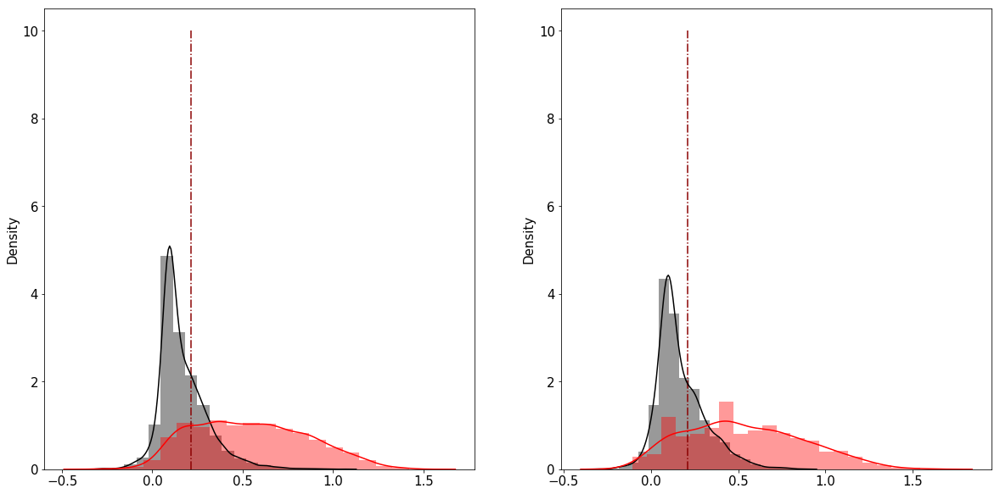

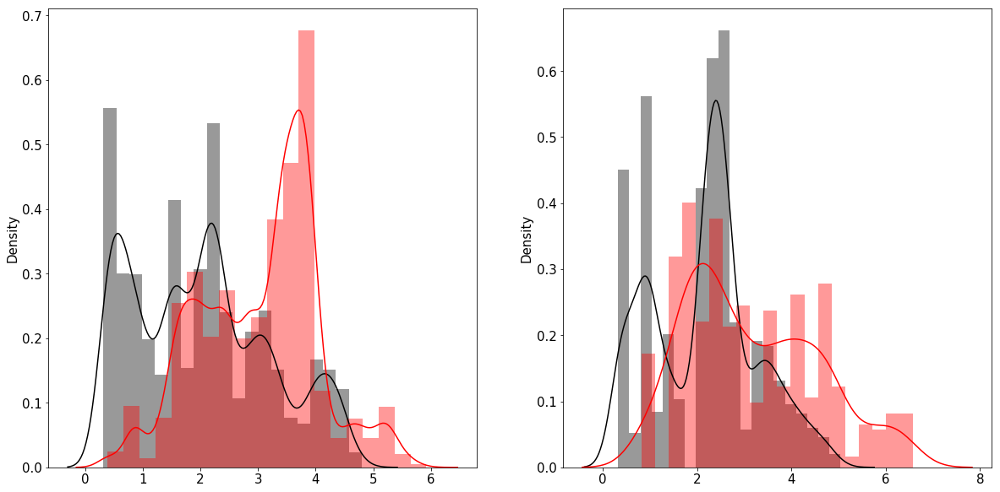

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.1628208452164895
Recall: 0.1628208452164895
Precision: 0.23700139086462485
F1-score: 0.18382212250737107

------------Scores on Test-------------
Accuracy: 0.3737222637746198
Recall: 0.3737222637746198
Precision: 0.5399605717044105
F1-score: 0.4101973107320918

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4011/4011 [00:00<00:00, 8761.39it/s]

------------Scores on Train-------------
Accuracy: 0.9149598133264195
Recall: 0.9149598133264195
Precision: 0.9164641764100333
F1-score: 0.9152279859322526

------------Scores on Test-------------
Accuracy: 0.9272001994515083
Recall: 0.9272001994515083
Precision: 0.933144127306792
F1-score: 0.927647350859804

------------Scores on Train-------------
Accuracy: 0.0013934045517882026
Recall: 0.0013934045517882026
Precision: 5.799140331141652e-05
F1-score: 0.00011134864342813607

------------Scores on Test-------------
Accuracy: 0.003572846367606193
Recall: 0.003572846367606193
Precision: 0.0002143707820563716
F1-score: 0.0004044731736912671




100%|████████████████████████████████████████████████████████████████████████████| 2519/2519 [00:00<00:00, 8112.62it/s]

------------Scores on Train-------------
Accuracy: 0.8930174949682613
Recall: 0.8930174949682613
Precision: 0.8953844172672357
F1-score: 0.8934684246814092

------------Scores on Test-------------
Accuracy: 0.8813021040095276
Recall: 0.8813021040095276
Precision: 0.8965662510434012
F1-score: 0.8831449880083461



 72%|██████████████████████████████████████████████████████                     | 72/100 [15:03:22<1:51:20, 238.58s/it]

----------------- iSimul = 72-----------------------

Normal observations in train set 5652
Outlier observations in train set 5652 

Normal observations in test set 1814
Outlier observations in test set 362
-------------------Scores on Train set-------------------
Accuracy :  0.7990
Precision :  0.7728
Recall :  0.8470
F1-score: 0.8082


-------------------Scores on Test set-------------------
Accuracy :  0.7183
Precision :  0.3468
Recall :  0.7845
F1-score: 0.4809




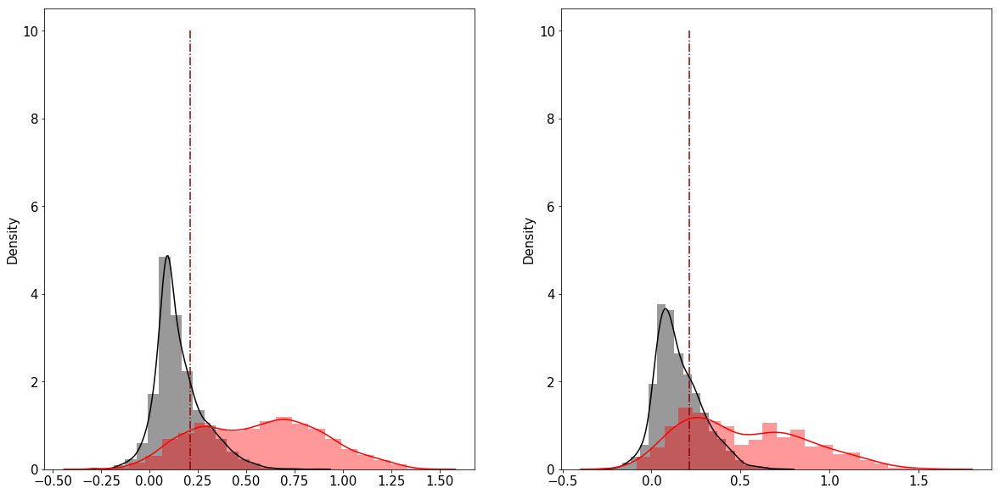

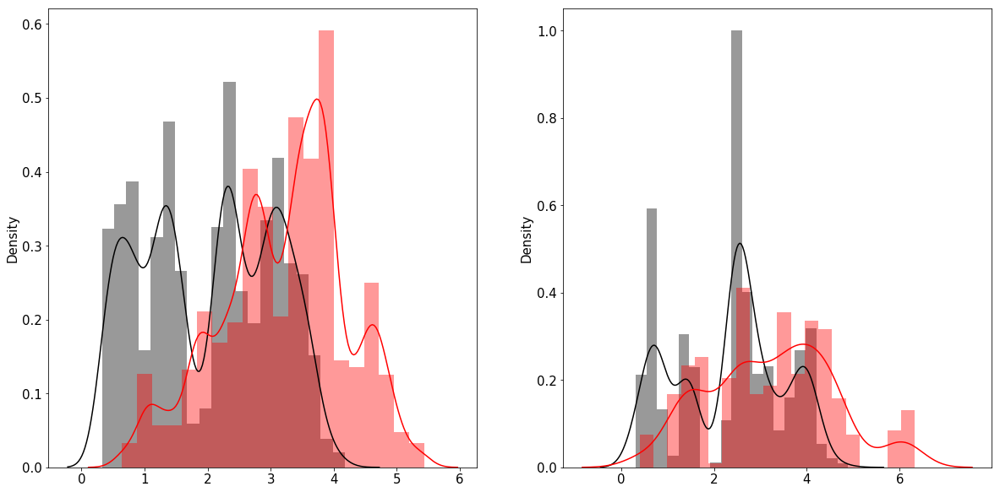

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3266683022571148
Recall: 0.3266683022571148
Precision: 0.5049010529032879
F1-score: 0.37555900286665533

------------Scores on Test-------------
Accuracy: 0.31437817845584837
Recall: 0.31437817845584837
Precision: 0.44930658649936994
F1-score: 0.3524336152048649

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4326/4326 [00:00<00:00, 5527.71it/s]

------------Scores on Train-------------
Accuracy: 0.8699705593719332
Recall: 0.8699705593719332
Precision: 0.8767514042676019
F1-score: 0.8717077278564962

------------Scores on Test-------------
Accuracy: 0.8797965788257051
Recall: 0.8797965788257051
Precision: 0.8854945526675819
F1-score: 0.8811476468391439

------------Scores on Train-------------
Accuracy: 0.0030914711765775596
Recall: 0.0030914711765775596
Precision: 0.00015168433343020735
F1-score: 0.0002891799318847606

------------Scores on Test-------------
Accuracy: 0.001684068710003368
Recall: 0.001684068710003368
Precision: 0.00011115965082530483
F1-score: 0.00020855340061961216




100%|████████████████████████████████████████████████████████████████████████████| 2969/2969 [00:00<00:00, 7704.13it/s]

------------Scores on Train-------------
Accuracy: 0.806692125841062
Recall: 0.806692125841062
Precision: 0.8199799440078038
F1-score: 0.8099933713784789

------------Scores on Test-------------
Accuracy: 0.8248568541596497
Recall: 0.8248568541596497
Precision: 0.8341493644383526
F1-score: 0.8269587718036172



 73%|██████████████████████████████████████████████████████▊                    | 73/100 [15:07:12<1:46:07, 235.83s/it]

----------------- iSimul = 73-----------------------

Normal observations in train set 6258
Outlier observations in train set 6258 

Normal observations in test set 1795
Outlier observations in test set 359
-------------------Scores on Train set-------------------
Accuracy :  0.7918
Precision :  0.7989
Recall :  0.7800
F1-score: 0.7893


-------------------Scores on Test set-------------------
Accuracy :  0.7447
Precision :  0.3718
Recall :  0.7716
F1-score: 0.5018




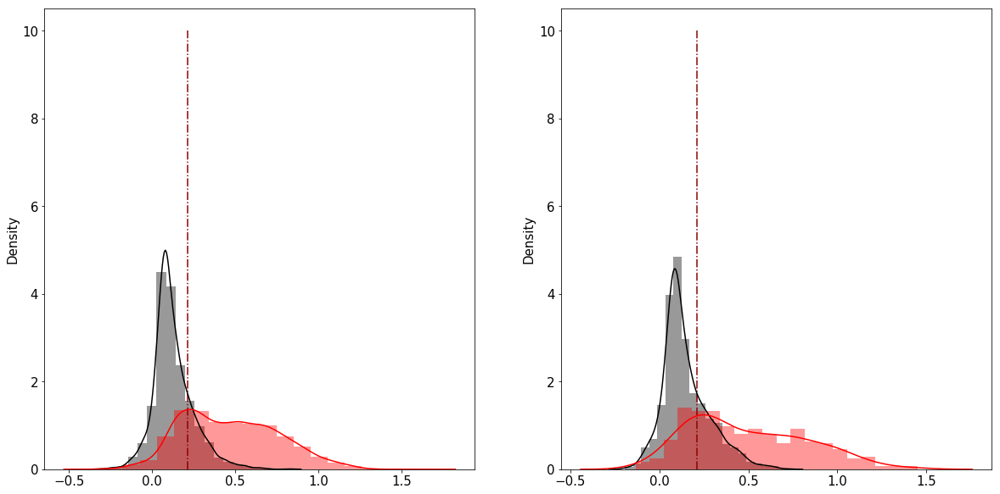

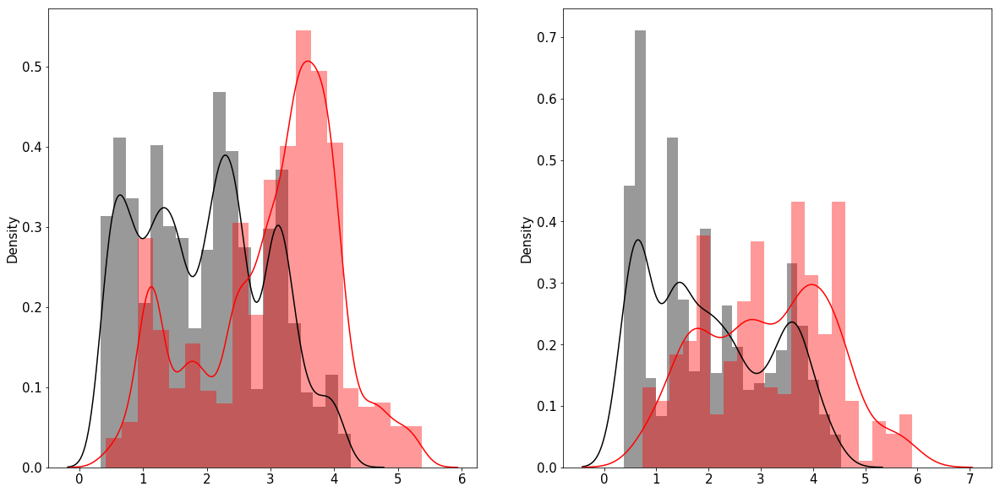

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3294260307194826
Recall: 0.3294260307194826
Precision: 0.41378651242777104
F1-score: 0.35251170241807345

------------Scores on Test-------------
Accuracy: 0.20598388952819333
Recall: 0.20598388952819333
Precision: 0.3108394199939764
F1-score: 0.22989549952745997

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4345/4345 [00:00<00:00, 9181.11it/s]

------------Scores on Train-------------
Accuracy: 0.9182161142549178
Recall: 0.9182161142549178
Precision: 0.9195003948198827
F1-score: 0.9181779427334249

------------Scores on Test-------------
Accuracy: 0.8780207134637514
Recall: 0.8780207134637514
Precision: 0.8854127391868268
F1-score: 0.8798610834155554

------------Scores on Train-------------
Accuracy: 0.0028095524784266506
Recall: 0.0028095524784266506
Precision: 0.00020028492915516718
F1-score: 0.00037391456274809393

------------Scores on Test-------------
Accuracy: 0.002027222704894295
Recall: 0.002027222704894295
Precision: 0.00010247499387377754
F1-score: 0.0001950883774584468




100%|████████████████████████████████████████████████████████████████████████████| 3453/3453 [00:00<00:00, 9907.13it/s]

------------Scores on Train-------------
Accuracy: 0.8777844671884407
Recall: 0.8777844671884407
Precision: 0.8821546036941263
F1-score: 0.8783695937385818

------------Scores on Test-------------
Accuracy: 0.8511439328120475
Recall: 0.8511439328120475
Precision: 0.8605802210457992
F1-score: 0.8534605139300069



 74%|███████████████████████████████████████████████████████▌                   | 74/100 [15:10:59<1:41:07, 233.37s/it]

----------------- iSimul = 74-----------------------

Normal observations in train set 6209
Outlier observations in train set 6209 

Normal observations in test set 2007
Outlier observations in test set 401
-------------------Scores on Train set-------------------
Accuracy :  0.7863
Precision :  0.7738
Recall :  0.8091
F1-score: 0.7911


-------------------Scores on Test set-------------------
Accuracy :  0.7679
Precision :  0.3982
Recall :  0.7706
F1-score: 0.5251




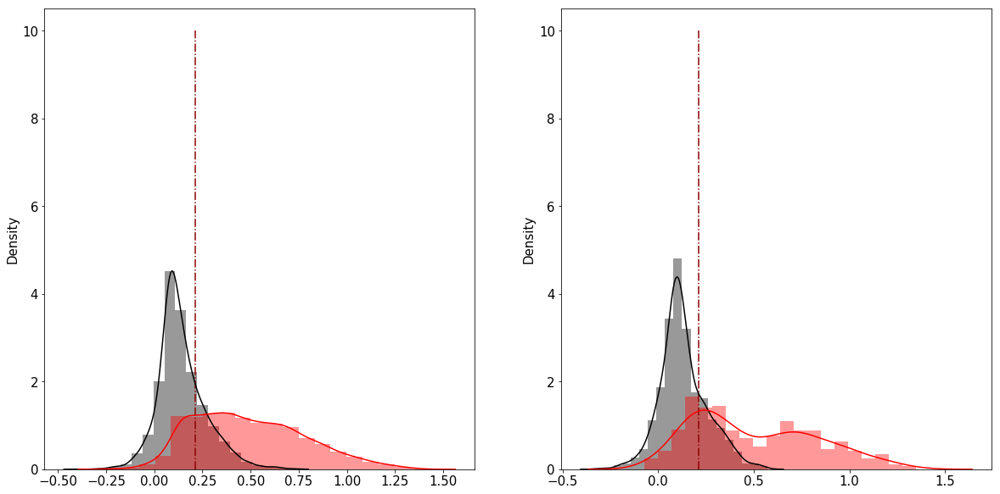

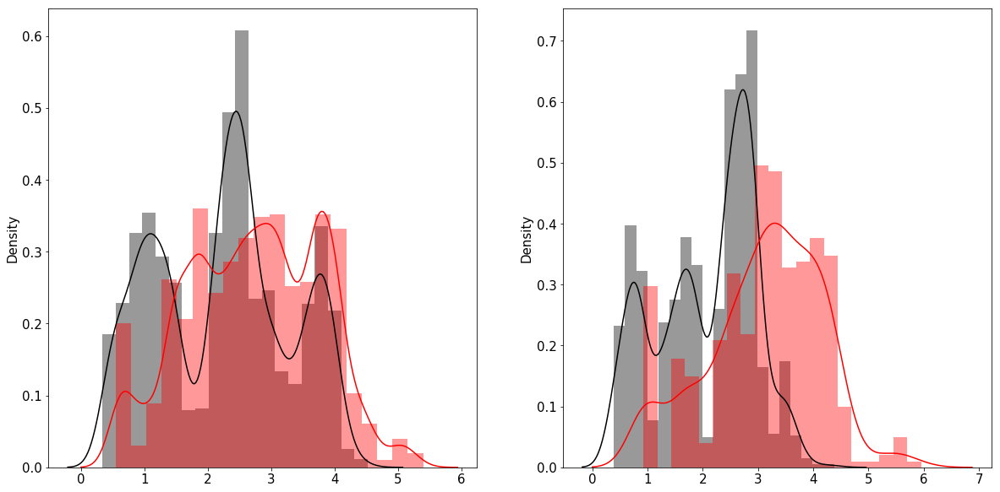

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2778359968561698
Recall: 0.2778359968561698
Precision: 0.42860277385359463
F1-score: 0.31370821298489865

------------Scores on Test-------------
Accuracy: 0.40479070892813934
Recall: 0.40479070892813934
Precision: 0.5528517271026996
F1-score: 0.43520144258889065

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4133/4133 [00:00<00:00, 9754.63it/s]

------------Scores on Train-------------
Accuracy: 0.91511658370448
Recall: 0.91511658370448
Precision: 0.9173219878954768
F1-score: 0.9152506789609696

------------Scores on Test-------------
Accuracy: 0.8744253568836197
Recall: 0.8744253568836197
Precision: 0.8793182403080774
F1-score: 0.8752376907150107

------------Scores on Train-------------
Accuracy: 0.0023554991846348977
Recall: 0.0023554991846348977
Precision: 0.00011747374450225195
F1-score: 0.00022378676784594643

------------Scores on Test-------------
Accuracy: 0.0052716950527169504
Recall: 0.00527169505271695
Precision: 0.00038491741654758687
F1-score: 0.0007174496225591117




100%|███████████████████████████████████████████████████████████████████████████| 2466/2466 [00:00<00:00, 11238.00it/s]

------------Scores on Train-------------
Accuracy: 0.8820438485232832
Recall: 0.8820438485232832
Precision: 0.8862137537397563
F1-score: 0.8824671625774236

------------Scores on Test-------------
Accuracy: 0.8824006488240065
Recall: 0.8824006488240065
Precision: 0.8919825953330573
F1-score: 0.8842394625245934



 75%|████████████████████████████████████████████████████████▎                  | 75/100 [15:14:48<1:36:40, 232.00s/it]

----------------- iSimul = 75-----------------------

Normal observations in train set 6263
Outlier observations in train set 6263 

Normal observations in test set 1631
Outlier observations in test set 326
-------------------Scores on Train set-------------------
Accuracy :  0.8248
Precision :  0.8119
Recall :  0.8456
F1-score: 0.8284


-------------------Scores on Test set-------------------
Accuracy :  0.7404
Precision :  0.3689
Recall :  0.7853
F1-score: 0.5020




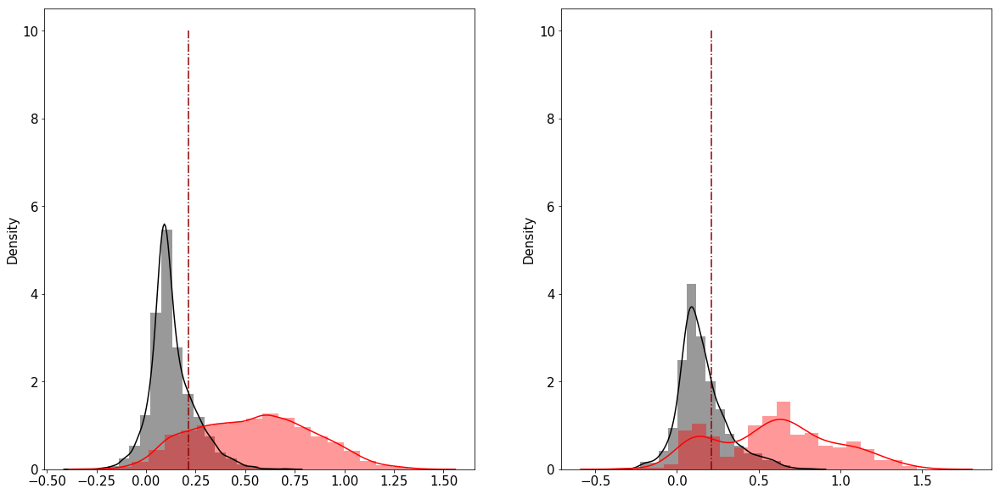

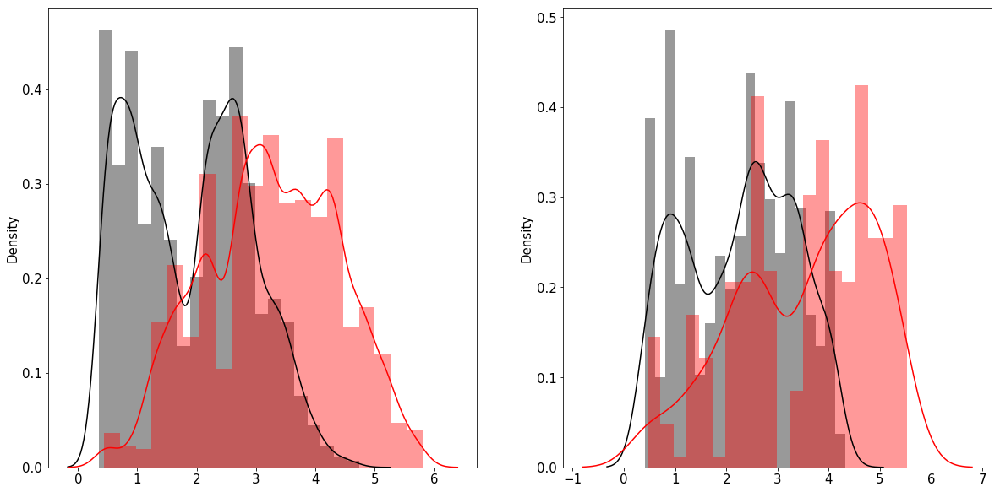

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.22990959316926168
Recall: 0.22990959316926168
Precision: 0.3505108376207783
F1-score: 0.2545245699346172

------------Scores on Test-------------
Accuracy: 0.3515191838545132
Recall: 0.3515191838545132
Precision: 0.4236472926911024
F1-score: 0.37541444060889

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4509/4509 [00:00<00:00, 10391.70it/s]

------------Scores on Train-------------
Accuracy: 0.8937719738824711
Recall: 0.8937719738824711
Precision: 0.8955420221944672
F1-score: 0.8941952312695638

------------Scores on Test-------------
Accuracy: 0.8804612996229763
Recall: 0.8804612996229763
Precision: 0.8864370615360694
F1-score: 0.8815096982049234

------------Scores on Train-------------
Accuracy: 0.002116574405731032
Recall: 0.002116574405731032
Precision: 0.00013666070966137373
F1-score: 0.0002567442326478471

------------Scores on Test-------------
Accuracy: 0.0030706243602865915
Recall: 0.0030706243602865915
Precision: 0.00024083328315973264
F1-score: 0.00044663627058714057




100%|████████████████████████████████████████████████████████████████████████████| 2931/2931 [00:00<00:00, 8688.49it/s]

------------Scores on Train-------------
Accuracy: 0.8653533051123412
Recall: 0.8653533051123412
Precision: 0.8681579168453989
F1-score: 0.8660086624502834

------------Scores on Test-------------
Accuracy: 0.8161037188672808
Recall: 0.8161037188672808
Precision: 0.8278372297311234
F1-score: 0.8174800025838268



 76%|█████████████████████████████████████████████████████████                  | 76/100 [15:18:34<1:32:02, 230.11s/it]

----------------- iSimul = 76-----------------------

Normal observations in train set 5625
Outlier observations in train set 5625 

Normal observations in test set 1853
Outlier observations in test set 370
-------------------Scores on Train set-------------------
Accuracy :  0.7412
Precision :  0.7522
Recall :  0.7193
F1-score: 0.7354


-------------------Scores on Test set-------------------
Accuracy :  0.8462
Precision :  0.5233
Recall :  0.8514
F1-score: 0.6481




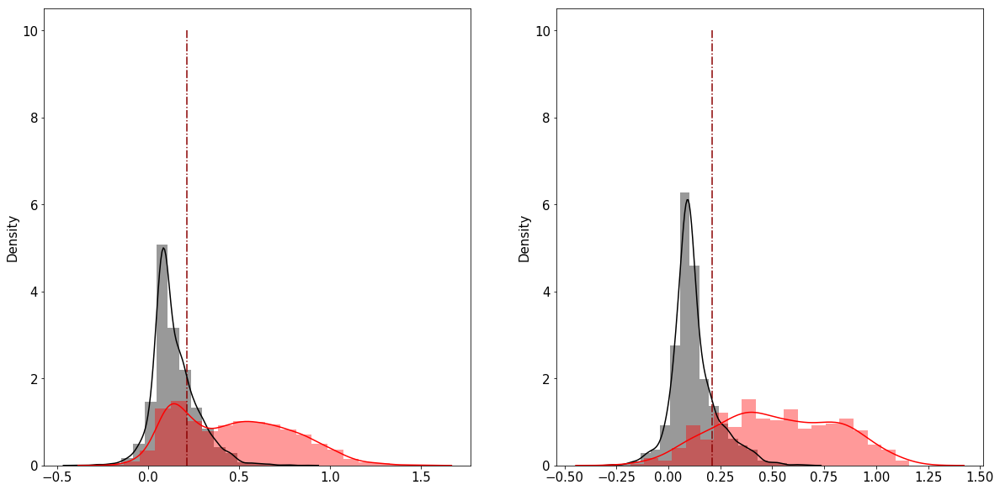

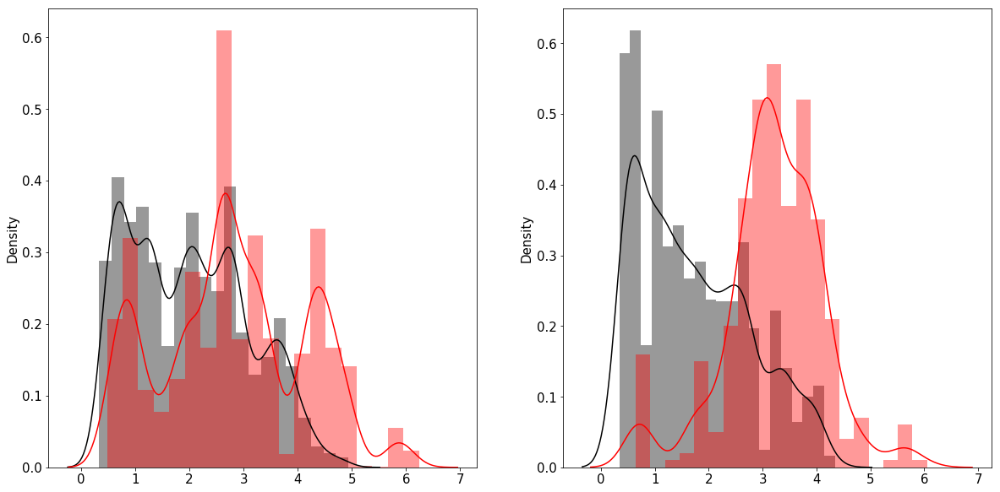

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.4049123643734351
Recall: 0.4049123643734351
Precision: 0.521270842407753
F1-score: 0.43480721258911953

------------Scores on Test-------------
Accuracy: 0.24445999533473292
Recall: 0.24445999533473292
Precision: 0.3085243799008252
F1-score: 0.25902158510962614

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4287/4287 [00:00<00:00, 9872.71it/s]

------------Scores on Train-------------
Accuracy: 0.8546560152617145
Recall: 0.8546560152617145
Precision: 0.8599447170817143
F1-score: 0.8559551967125051

------------Scores on Test-------------
Accuracy: 0.8668066246792628
Recall: 0.8668066246792628
Precision: 0.8710293765812301
F1-score: 0.8674945006317631

------------Scores on Train-------------
Accuracy: 0.004398240703718513
Recall: 0.004398240703718513
Precision: 0.00027227204356352697
F1-score: 0.0005127993645591091

------------Scores on Test-------------
Accuracy: 0.002468373958654736
Recall: 0.002468373958654736
Precision: 0.00019990352482063004
F1-score: 0.00036985407849549794




100%|████████████████████████████████████████████████████████████████████████████| 3241/3241 [00:00<00:00, 7833.18it/s]

------------Scores on Train-------------
Accuracy: 0.7576969212315074
Recall: 0.7576969212315074
Precision: 0.7667637966505463
F1-score: 0.7598413213891828

------------Scores on Test-------------
Accuracy: 0.8253625424251774
Recall: 0.8253625424251774
Precision: 0.8306555169287273
F1-score: 0.8256974071497242



 77%|█████████████████████████████████████████████████████████▊                 | 77/100 [15:22:28<1:28:40, 231.31s/it]

----------------- iSimul = 77-----------------------

Normal observations in train set 6399
Outlier observations in train set 6399 

Normal observations in test set 1777
Outlier observations in test set 355
-------------------Scores on Train set-------------------
Accuracy :  0.7614
Precision :  0.7443
Recall :  0.7962
F1-score: 0.7694


-------------------Scores on Test set-------------------
Accuracy :  0.7720
Precision :  0.4084
Recall :  0.8225
F1-score: 0.5458




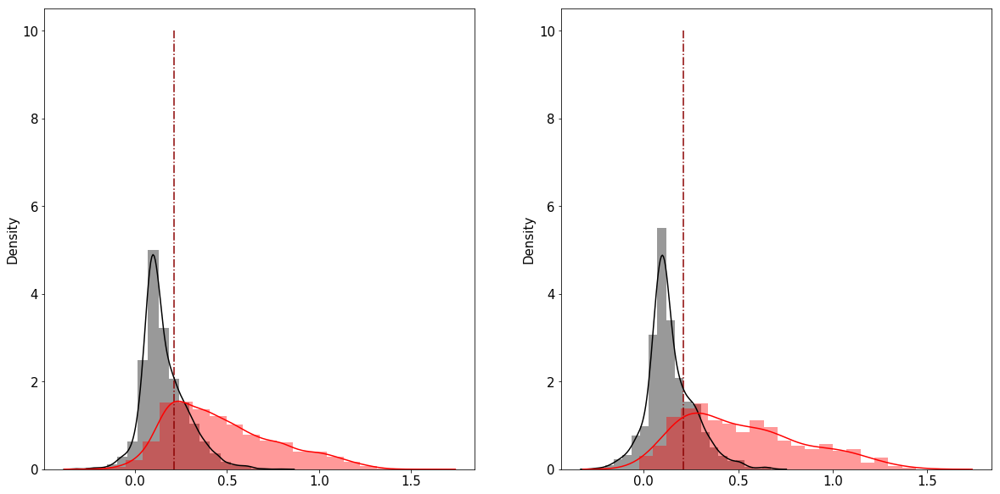

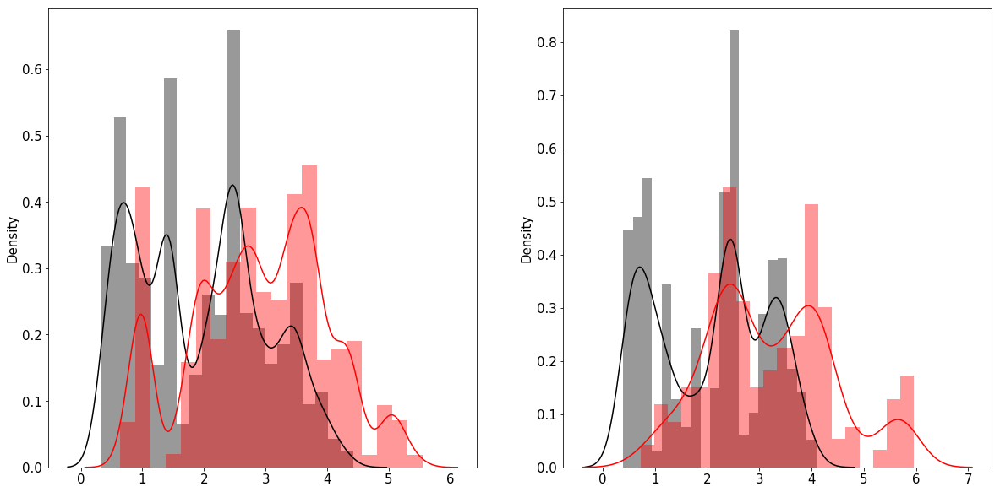

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3737157534246575
Recall: 0.3737157534246575
Precision: 0.47255511520670684
F1-score: 0.4066083860590667

------------Scores on Test-------------
Accuracy: 0.2502865001146
Recall: 0.2502865001146
Precision: 0.3021679156431748
F1-score: 0.256174565699089

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4363/4363 [00:00<00:00, 12623.57it/s]

------------Scores on Train-------------
Accuracy: 0.877568493150685
Recall: 0.877568493150685
Precision: 0.8845569253057876
F1-score: 0.8786279043893591

------------Scores on Test-------------
Accuracy: 0.8780655512262205
Recall: 0.8780655512262205
Precision: 0.8851833909999989
F1-score: 0.8797963458994112

------------Scores on Train-------------
Accuracy: 0.002048247610377788
Recall: 0.002048247610377788
Precision: 0.00018845861790400952
F1-score: 0.00034515924254703296

------------Scores on Test-------------
Accuracy: 0.0036607687614399025
Recall: 0.0036607687614399025
Precision: 0.00022470191886076127
F1-score: 0.0004234142181906393




100%|███████████████████████████████████████████████████████████████████████████| 3278/3278 [00:00<00:00, 11520.21it/s]

------------Scores on Train-------------
Accuracy: 0.8049613108784707
Recall: 0.8049613108784707
Precision: 0.8143453278144284
F1-score: 0.8041484274171836

------------Scores on Test-------------
Accuracy: 0.8367907260524711
Recall: 0.8367907260524711
Precision: 0.8470054489832329
F1-score: 0.838727135609758



 78%|██████████████████████████████████████████████████████████▌                | 78/100 [15:26:06<1:23:20, 227.27s/it]

----------------- iSimul = 78-----------------------

Normal observations in train set 6633
Outlier observations in train set 6633 

Normal observations in test set 2396
Outlier observations in test set 479
-------------------Scores on Train set-------------------
Accuracy :  0.7926
Precision :  0.8177
Recall :  0.7532
F1-score: 0.7841


-------------------Scores on Test set-------------------
Accuracy :  0.7534
Precision :  0.3852
Recall :  0.8058
F1-score: 0.5213




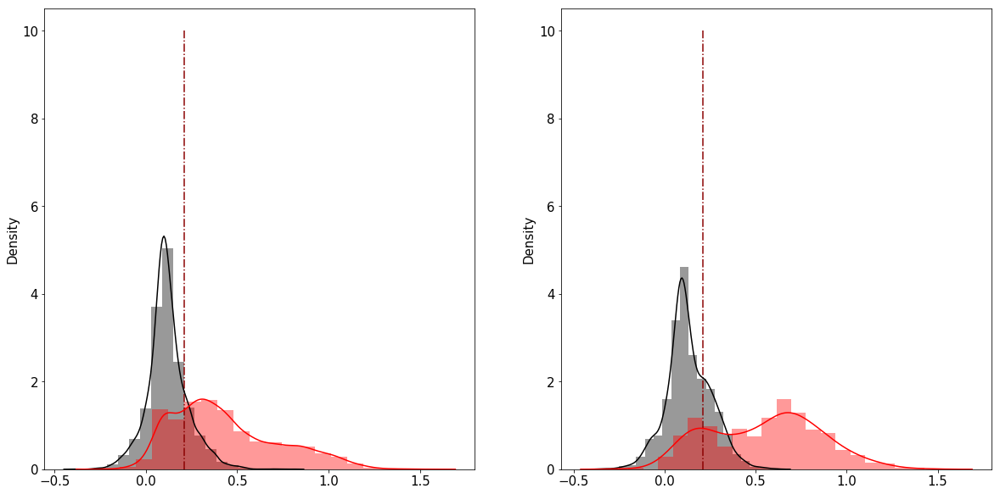

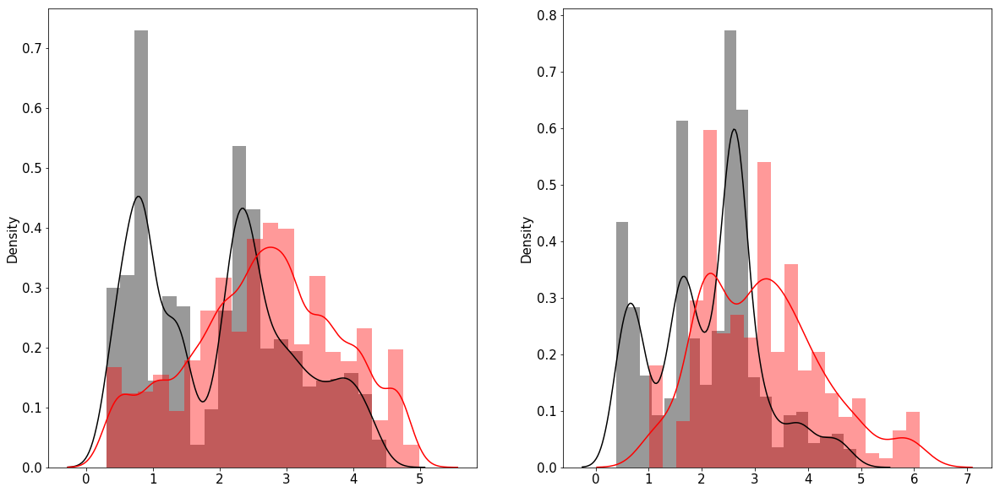

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.16382772469187093
Recall: 0.16382772469187093
Precision: 0.24266322159246492
F1-score: 0.18697231881385143

------------Scores on Test-------------
Accuracy: 0.4046474358974359
Recall: 0.4046474358974359
Precision: 0.5245075053103776
F1-score: 0.43614030233707957

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 3744/3744 [00:00<00:00, 8244.24it/s]

------------Scores on Train-------------
Accuracy: 0.8507131976180584
Recall: 0.8507131976180584
Precision: 0.8564362697954455
F1-score: 0.8522290182599757

------------Scores on Test-------------
Accuracy: 0.8725961538461539
Recall: 0.8725961538461539
Precision: 0.8790121824851025
F1-score: 0.8740870383296022

------------Scores on Train-------------
Accuracy: 0.0009937065253395165
Recall: 0.0009937065253395165
Precision: 4.829501522268637e-05
F1-score: 9.211324532641586e-05

------------Scores on Test-------------
Accuracy: 0.004919499105545617
Recall: 0.004919499105545617
Precision: 0.0003928766646789903
F1-score: 0.0007276429545180012




100%|████████████████████████████████████████████████████████████████████████████| 2236/2236 [00:00<00:00, 8621.78it/s]

------------Scores on Train-------------
Accuracy: 0.8188141768797615
Recall: 0.8188141768797615
Precision: 0.825719921428187
F1-score: 0.8206786890298209

------------Scores on Test-------------
Accuracy: 0.7844364937388193
Recall: 0.7844364937388193
Precision: 0.8000500294775788
F1-score: 0.7880561527177553



 79%|███████████████████████████████████████████████████████████▎               | 79/100 [15:30:03<1:20:36, 230.33s/it]

----------------- iSimul = 79-----------------------

Normal observations in train set 5801
Outlier observations in train set 5801 

Normal observations in test set 1481
Outlier observations in test set 296
-------------------Scores on Train set-------------------
Accuracy :  0.7819
Precision :  0.7937
Recall :  0.7619
F1-score: 0.7775


-------------------Scores on Test set-------------------
Accuracy :  0.7676
Precision :  0.4027
Recall :  0.8176
F1-score: 0.5396




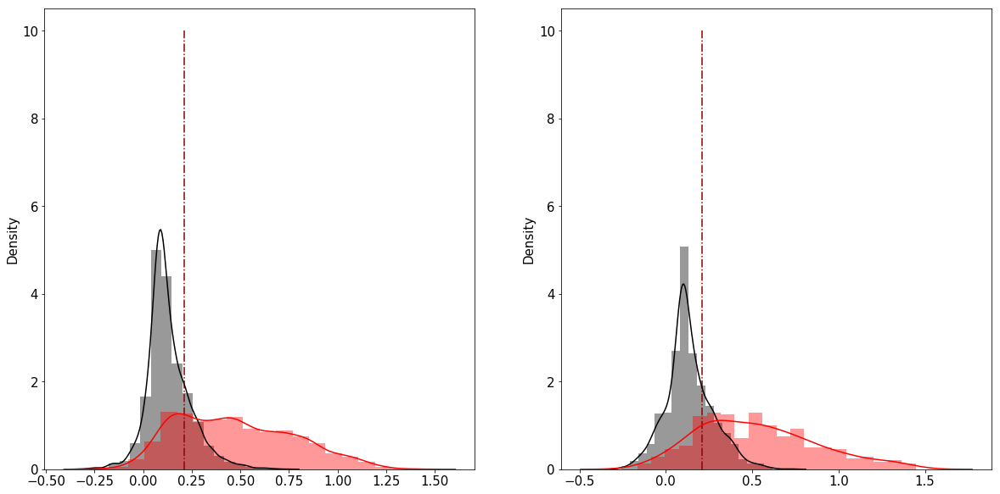

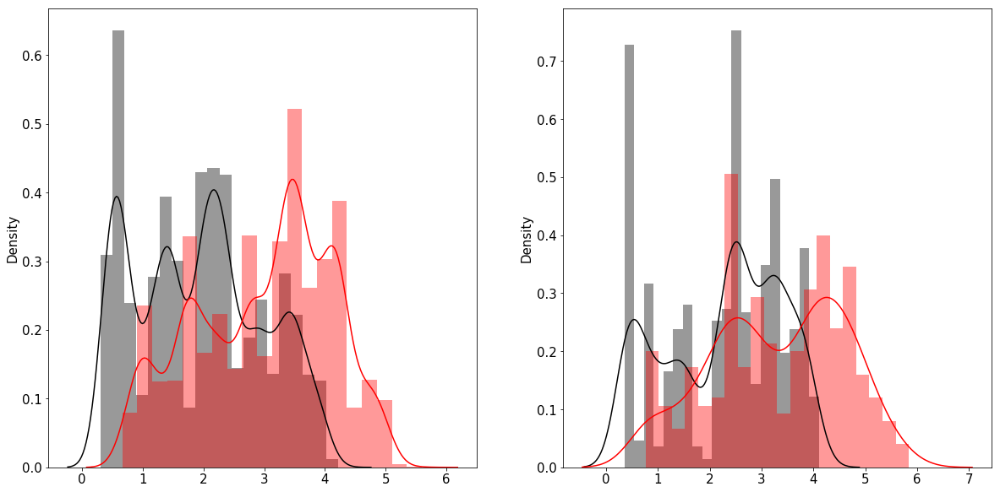

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2030757097791798
Recall: 0.2030757097791798
Precision: 0.2832755668477284
F1-score: 0.22016582508855367

------------Scores on Test-------------
Accuracy: 0.24703296703296704
Recall: 0.24703296703296704
Precision: 0.2990411847854309
F1-score: 0.2608107627098546

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4550/4550 [00:00<00:00, 9261.34it/s]

------------Scores on Train-------------
Accuracy: 0.8711882229232387
Recall: 0.8711882229232387
Precision: 0.8784046495948054
F1-score: 0.8724044416057074

------------Scores on Test-------------
Accuracy: 0.9175824175824175
Recall: 0.9175824175824175
Precision: 0.9194106259628857
F1-score: 0.9179310788364597

------------Scores on Train-------------
Accuracy: 0.002305285690762391
Recall: 0.002305285690762391
Precision: 0.00013520737189222232
F1-score: 0.00025543331753599897

------------Scores on Test-------------
Accuracy: 0.0023330417031204435
Recall: 0.0023330417031204435
Precision: 0.00015817231885562326
F1-score: 0.00029625926388831023




100%|███████████████████████████████████████████████████████████████████████████| 3429/3429 [00:00<00:00, 10798.48it/s]

------------Scores on Train-------------
Accuracy: 0.843734562819035
Recall: 0.843734562819035
Precision: 0.8517520034047932
F1-score: 0.8448440029252421

------------Scores on Test-------------
Accuracy: 0.889763779527559
Recall: 0.889763779527559
Precision: 0.8934427922178005
F1-score: 0.8905292129730402



 80%|████████████████████████████████████████████████████████████               | 80/100 [15:33:58<1:17:11, 231.60s/it]

----------------- iSimul = 80-----------------------

Normal observations in train set 6343
Outlier observations in train set 6343 

Normal observations in test set 1794
Outlier observations in test set 358
-------------------Scores on Train set-------------------
Accuracy :  0.7858
Precision :  0.7519
Recall :  0.8531
F1-score: 0.7993


-------------------Scores on Test set-------------------
Accuracy :  0.8318
Precision :  0.4968
Recall :  0.8659
F1-score: 0.6314




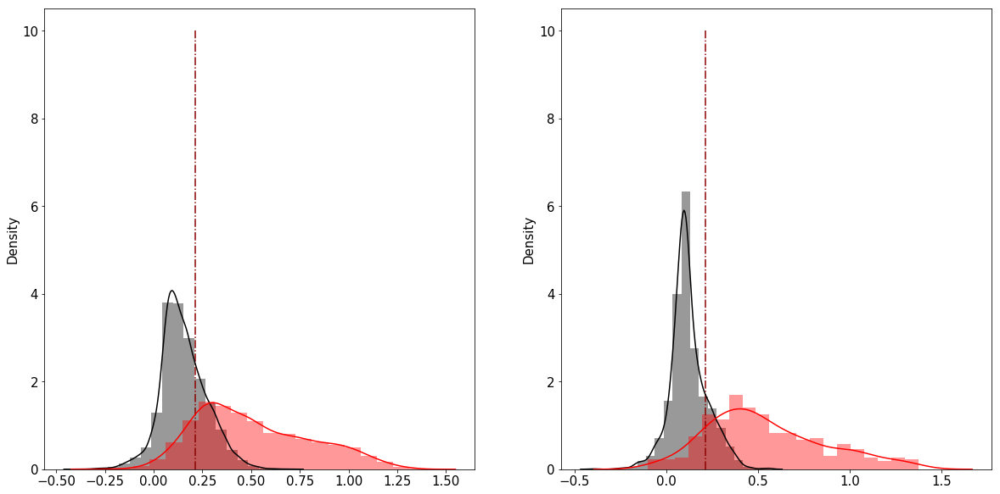

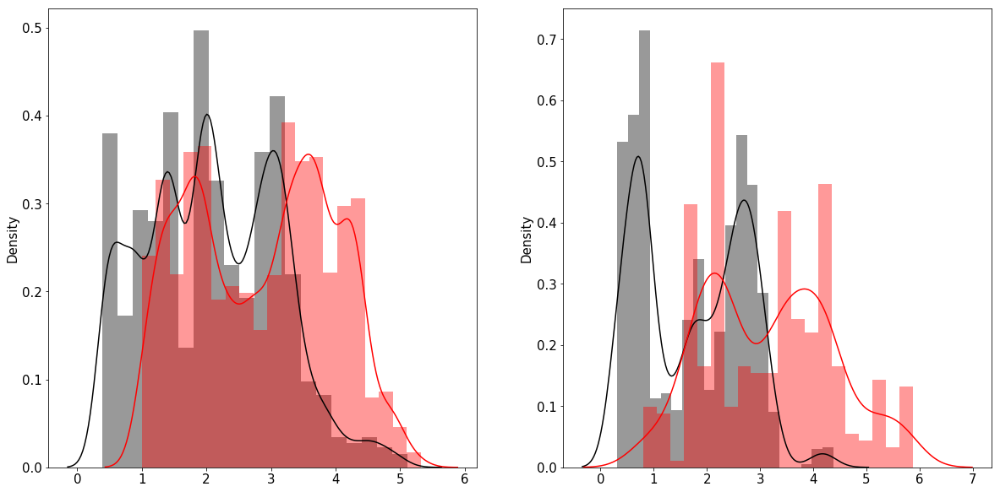

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3167107417201864
Recall: 0.3167107417201864
Precision: 0.400209838755814
F1-score: 0.3418788247655934

------------Scores on Test-------------
Accuracy: 0.3578002761159687
Recall: 0.3578002761159687
Precision: 0.5261254821057618
F1-score: 0.39318716764274414

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4346/4346 [00:00<00:00, 9912.51it/s]

------------Scores on Train-------------
Accuracy: 0.9008940939428284
Recall: 0.9008940939428284
Precision: 0.9049387119505505
F1-score: 0.901924265909442

------------Scores on Test-------------
Accuracy: 0.9003681546249425
Recall: 0.9003681546249425
Precision: 0.9051434345292922
F1-score: 0.9015982132879706

------------Scores on Train-------------
Accuracy: 0.002577319587628866
Recall: 0.002577319587628866
Precision: 0.00016108247422680412
F1-score: 0.00030321406913280777

------------Scores on Test-------------
Accuracy: 0.0035727045373347625
Recall: 0.0035727045373347625
Precision: 0.0002820556213685339
F1-score: 0.0005228348103416726




100%|███████████████████████████████████████████████████████████████████████████| 2799/2799 [00:00<00:00, 10042.90it/s]

------------Scores on Train-------------
Accuracy: 0.8549337260677466
Recall: 0.8549337260677466
Precision: 0.8619232188895098
F1-score: 0.8565719155182742

------------Scores on Test-------------
Accuracy: 0.8342265094676671
Recall: 0.8342265094676671
Precision: 0.8460163908032805
F1-score: 0.8368970444721708



 81%|████████████████████████████████████████████████████████████▊              | 81/100 [15:37:48<1:13:11, 231.13s/it]

----------------- iSimul = 81-----------------------

Normal observations in train set 6398
Outlier observations in train set 6398 

Normal observations in test set 1976
Outlier observations in test set 395
-------------------Scores on Train set-------------------
Accuracy :  0.7498
Precision :  0.7717
Recall :  0.7094
F1-score: 0.7393


-------------------Scores on Test set-------------------
Accuracy :  0.7406
Precision :  0.3697
Recall :  0.7899
F1-score: 0.5036




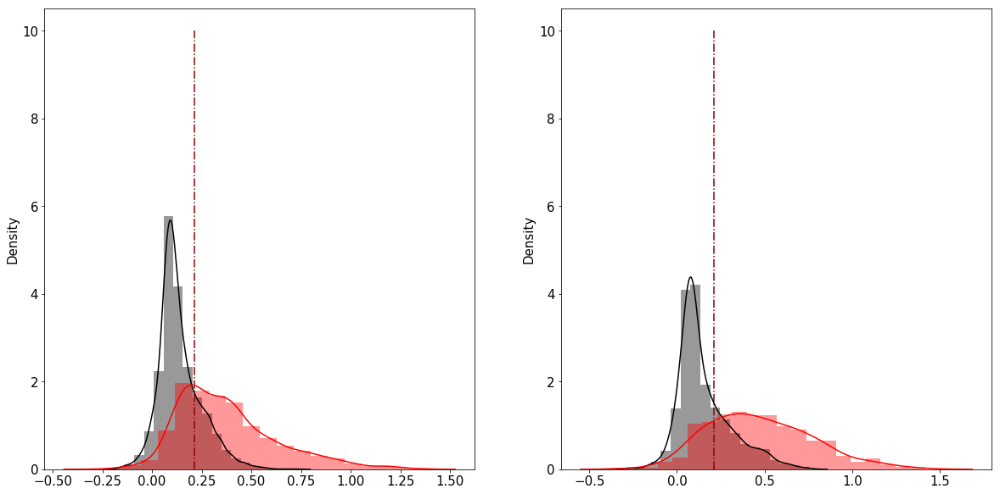

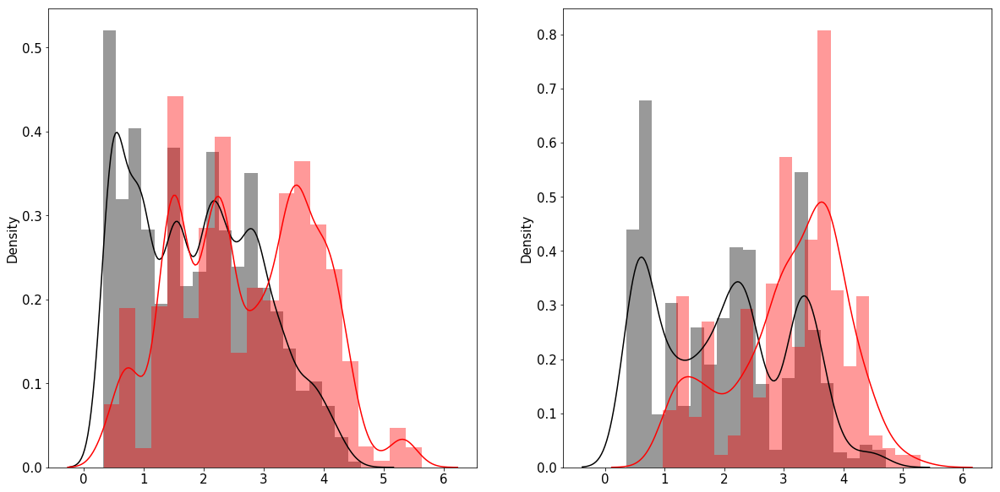

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.27369652840982966
Recall: 0.27369652840982966
Precision: 0.3557200679577781
F1-score: 0.2979589377708908

------------Scores on Test-------------
Accuracy: 0.24159462055715658
Recall: 0.24159462055715658
Precision: 0.3248208828816761
F1-score: 0.2662702870533431

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4164/4164 [00:00<00:00, 9336.20it/s]

------------Scores on Train-------------
Accuracy: 0.87114809517618
Recall: 0.87114809517618
Precision: 0.874907493893807
F1-score: 0.871966654162837

------------Scores on Test-------------
Accuracy: 0.8789625360230547
Recall: 0.8789625360230547
Precision: 0.8829680625171487
F1-score: 0.8791446908561268

------------Scores on Train-------------
Accuracy: 0.002681444404719342
Recall: 0.002681444404719342
Precision: 0.0001892241318304527
F1-score: 0.0003535023170208779

------------Scores on Test-------------
Accuracy: 0.002216592780240659
Recall: 0.002216592780240659
Precision: 0.00014005943391630536
F1-score: 0.000263470976462714




100%|███████████████████████████████████████████████████████████████████████████| 3158/3158 [00:00<00:00, 10262.33it/s]

------------Scores on Train-------------
Accuracy: 0.8226671433678941
Recall: 0.8226671433678941
Precision: 0.8298142731251078
F1-score: 0.8244071188607612

------------Scores on Test-------------
Accuracy: 0.8343888537048765
Recall: 0.8343888537048765
Precision: 0.8432165241280073
F1-score: 0.8353975644947434



 82%|█████████████████████████████████████████████████████████████▍             | 82/100 [15:41:45<1:09:54, 233.01s/it]

----------------- iSimul = 82-----------------------

Normal observations in train set 6269
Outlier observations in train set 6269 

Normal observations in test set 1803
Outlier observations in test set 360
-------------------Scores on Train set-------------------
Accuracy :  0.7934
Precision :  0.7441
Recall :  0.8944
F1-score: 0.8124


-------------------Scores on Test set-------------------
Accuracy :  0.7369
Precision :  0.3679
Recall :  0.8083
F1-score: 0.5056




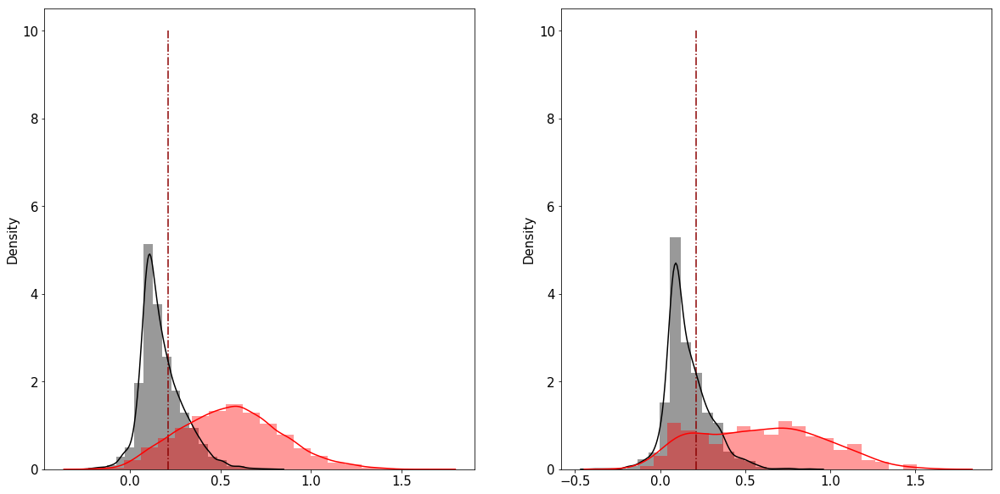

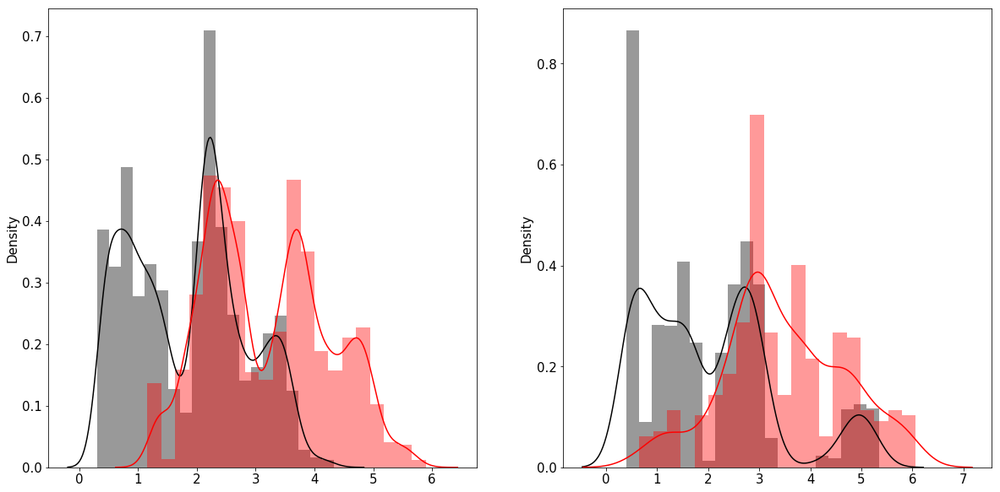

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.31755883113524697
Recall: 0.31755883113524697
Precision: 0.47575452156560744
F1-score: 0.355707570299346

------------Scores on Test-------------
Accuracy: 0.22550149873184228
Recall: 0.22550149873184228
Precision: 0.3221136292822046
F1-score: 0.24861100200970943

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4337/4337 [00:00<00:00, 9564.58it/s]

------------Scores on Train-------------
Accuracy: 0.9250064649599172
Recall: 0.9250064649599172
Precision: 0.9283352959235249
F1-score: 0.9256478661559002

------------Scores on Test-------------
Accuracy: 0.8079317500576435
Recall: 0.8079317500576435
Precision: 0.821156491788134
F1-score: 0.8107965324669327

------------Scores on Train-------------
Accuracy: 0.003026863412788498
Recall: 0.003026863412788498
Precision: 0.00018090583079348165
F1-score: 0.00034140687737091723

------------Scores on Test-------------
Accuracy: 0.0017857142857142857
Recall: 0.0017857142857142857
Precision: 0.00010852407261247039
F1-score: 0.00020461309523809524




100%|████████████████████████████████████████████████████████████████████████████| 3360/3360 [00:00<00:00, 8131.77it/s]

------------Scores on Train-------------
Accuracy: 0.8904653802497162
Recall: 0.8904653802497162
Precision: 0.8963339634622816
F1-score: 0.8916713163534387

------------Scores on Test-------------
Accuracy: 0.7538690476190476
Recall: 0.7538690476190476
Precision: 0.7749240616596392
F1-score: 0.758990404547366



 83%|██████████████████████████████████████████████████████████████▎            | 83/100 [15:45:55<1:07:24, 237.94s/it]

----------------- iSimul = 83-----------------------

Normal observations in train set 6433
Outlier observations in train set 6433 

Normal observations in test set 2405
Outlier observations in test set 481
-------------------Scores on Train set-------------------
Accuracy :  0.7598
Precision :  0.7503
Recall :  0.7788
F1-score: 0.7643


-------------------Scores on Test set-------------------
Accuracy :  0.7973
Precision :  0.4451
Recall :  0.8773
F1-score: 0.5906




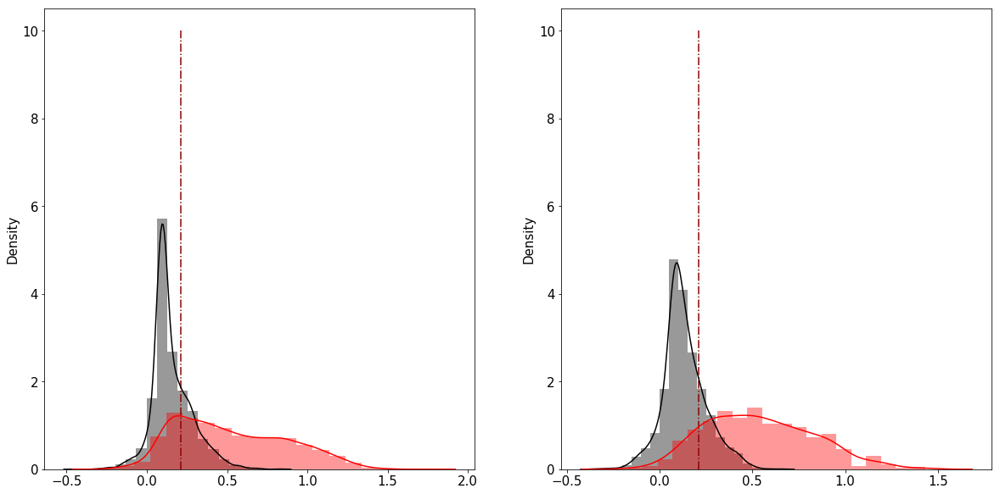

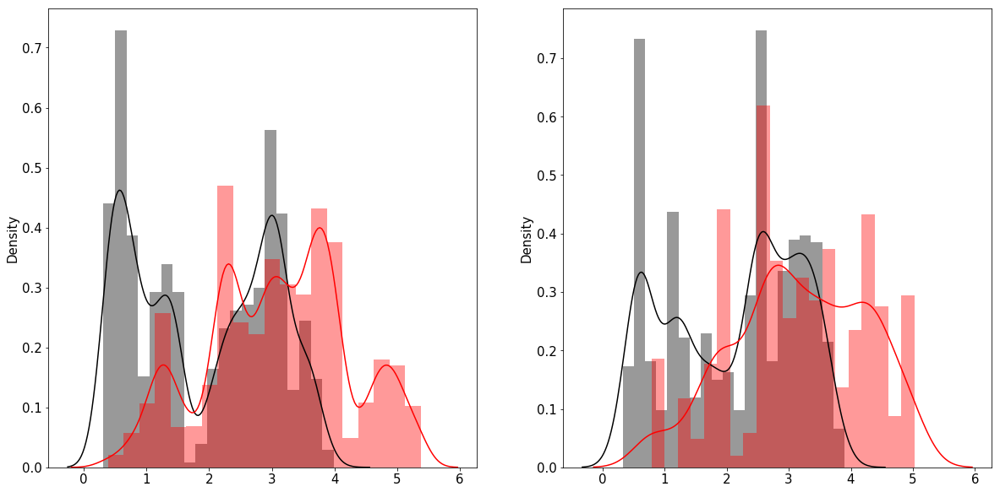

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3412666931111993
Recall: 0.3412666931111993
Precision: 0.4500182846910311
F1-score: 0.35573737058132743

------------Scores on Test-------------
Accuracy: 0.4444444444444444
Recall: 0.4444444444444444
Precision: 0.6159785002587075
F1-score: 0.4935130488489617

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 3735/3735 [00:00<00:00, 11049.93it/s]

------------Scores on Train-------------
Accuracy: 0.9336242231918551
Recall: 0.9336242231918551
Precision: 0.9353389088837848
F1-score: 0.9337039053005636

------------Scores on Test-------------
Accuracy: 0.9941097724230255
Recall: 0.9941097724230255
Precision: 0.9943938326405035
F1-score: 0.9940603190408606

------------Scores on Train-------------
Accuracy: 0.004604604604604604
Recall: 0.004604604604604604
Precision: 0.0002970712648132003
F1-score: 0.0005581338914672247

------------Scores on Test-------------
Accuracy: 0.0038461538461538464
Recall: 0.0038461538461538464
Precision: 0.0002694757471827535
F1-score: 0.0005036630036630037




100%|████████████████████████████████████████████████████████████████████████████| 2080/2080 [00:00<00:00, 9936.69it/s]

------------Scores on Train-------------
Accuracy: 0.9059059059059059
Recall: 0.9059059059059059
Precision: 0.9108069693764932
F1-score: 0.9065757688455903

------------Scores on Test-------------
Accuracy: 0.9855769230769231
Recall: 0.9855769230769231
Precision: 0.9867857663170163
F1-score: 0.9853745398969218



 84%|███████████████████████████████████████████████████████████████            | 84/100 [15:50:03<1:04:17, 241.07s/it]

----------------- iSimul = 84-----------------------

Normal observations in train set 5867
Outlier observations in train set 5867 

Normal observations in test set 1973
Outlier observations in test set 394
-------------------Scores on Train set-------------------
Accuracy :  0.7733
Precision :  0.7518
Recall :  0.8161
F1-score: 0.7826


-------------------Scores on Test set-------------------
Accuracy :  0.8319
Precision :  0.4969
Recall :  0.8173
F1-score: 0.6180




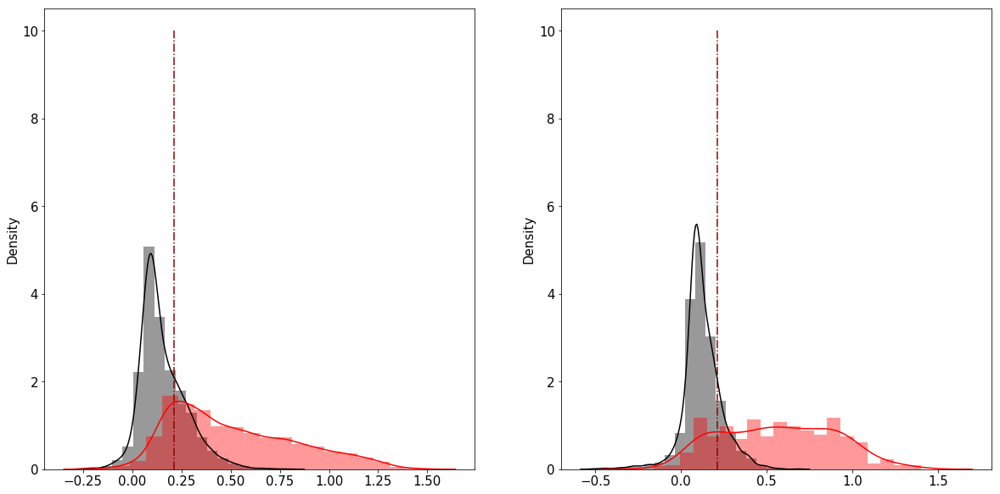

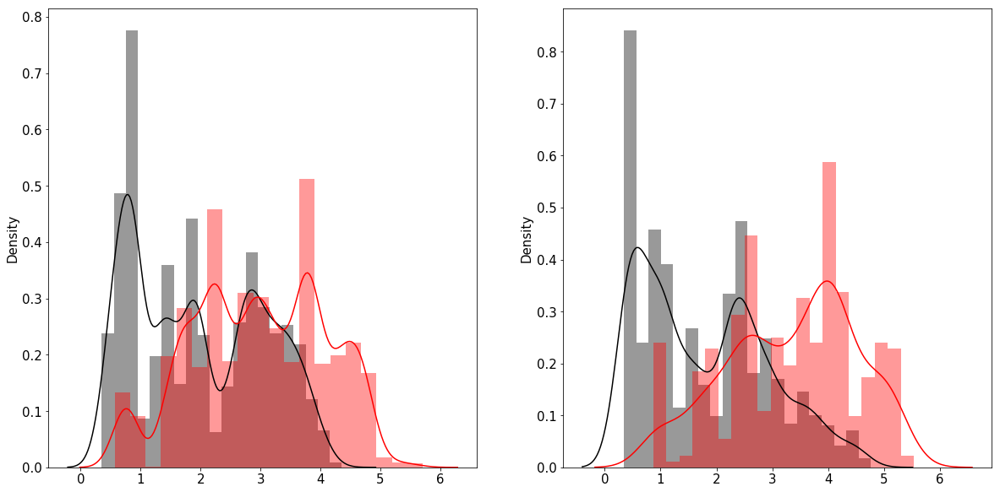

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2665330661322645
Recall: 0.2665330661322645
Precision: 0.35786794750175766
F1-score: 0.2875995273275796

------------Scores on Test-------------
Accuracy: 0.26085913126949845
Recall: 0.26085913126949845
Precision: 0.35972163816473246
F1-score: 0.2874909593536153

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 4167/4167 [00:00<00:00, 11780.05it/s]

------------Scores on Train-------------
Accuracy: 0.9209669338677354
Recall: 0.9209669338677354
Precision: 0.9223513760027368
F1-score: 0.920858896026587

------------Scores on Test-------------
Accuracy: 0.8994480441564675
Recall: 0.8994480441564675
Precision: 0.906455817912798
F1-score: 0.9007069853949534

------------Scores on Train-------------
Accuracy: 0.0028995394849053386
Recall: 0.0028995394849053386
Precision: 0.00019996824033829922
F1-score: 0.00037413412708455976

------------Scores on Test-------------
Accuracy: 0.0025957170668397143
Recall: 0.0025957170668397143
Precision: 0.00015951333930299923
F1-score: 0.0003005567130024933




100%|███████████████████████████████████████████████████████████████████████████| 3082/3082 [00:00<00:00, 10577.16it/s]

------------Scores on Train-------------
Accuracy: 0.8951048951048951
Recall: 0.8951048951048951
Precision: 0.8969400731596757
F1-score: 0.894715370288743

------------Scores on Test-------------
Accuracy: 0.8679428942245295
Recall: 0.8679428942245295
Precision: 0.8757821694268565
F1-score: 0.8682911458349499



 85%|█████████████████████████████████████████████████████████████████▍           | 85/100 [15:53:58<59:49, 239.27s/it]

----------------- iSimul = 85-----------------------

Normal observations in train set 6788
Outlier observations in train set 6788 

Normal observations in test set 1875
Outlier observations in test set 375
-------------------Scores on Train set-------------------
Accuracy :  0.7955
Precision :  0.7967
Recall :  0.7935
F1-score: 0.7951


-------------------Scores on Test set-------------------
Accuracy :  0.7538
Precision :  0.3811
Recall :  0.7653
F1-score: 0.5089




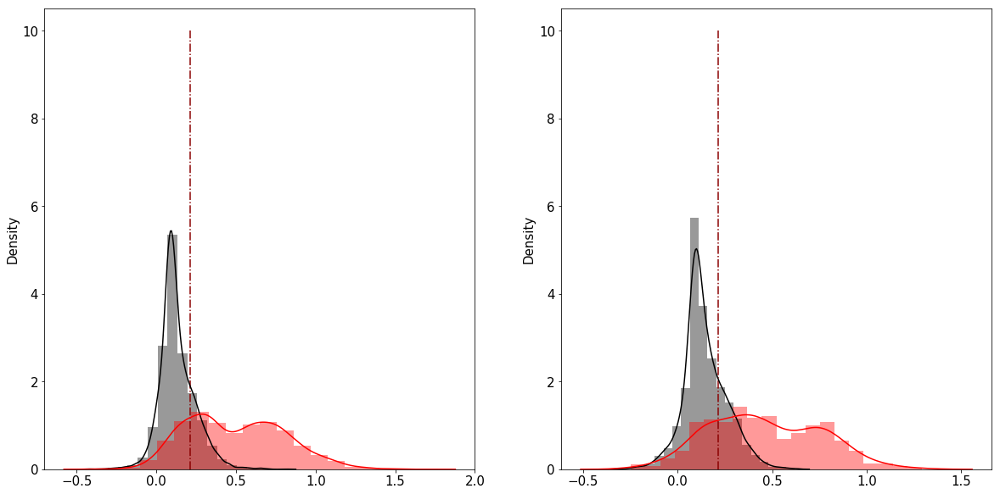

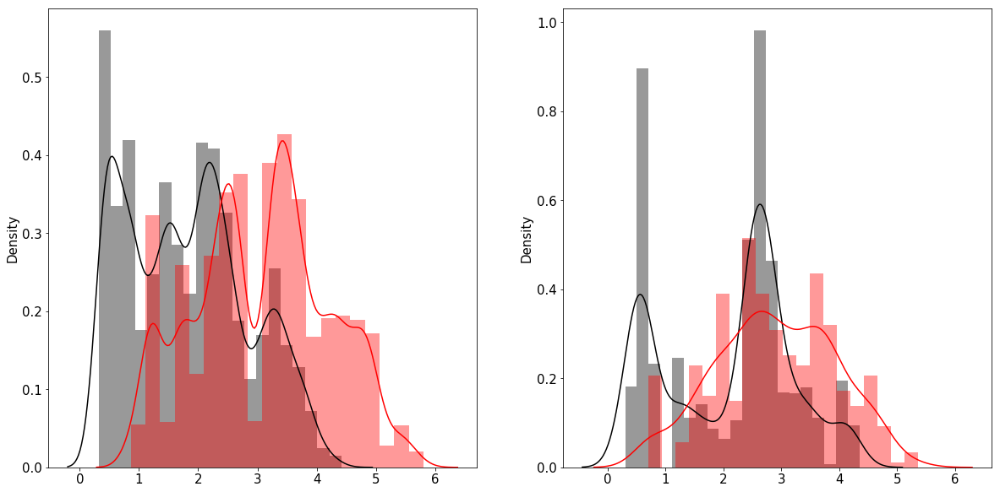

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3547516198704104
Recall: 0.3547516198704104
Precision: 0.449835703790495
F1-score: 0.3868142226910091

------------Scores on Test-------------
Accuracy: 0.15287221570926143
Recall: 0.15287221570926143
Precision: 0.19889200786538963
F1-score: 0.1613396490009497

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4265/4265 [00:00<00:00, 8890.49it/s]

------------Scores on Train-------------
Accuracy: 0.8251889848812095
Recall: 0.8251889848812095
Precision: 0.8336258191985
F1-score: 0.826978269020486

------------Scores on Test-------------
Accuracy: 0.825556858147714
Recall: 0.825556858147714
Precision: 0.8378267436326411
F1-score: 0.829074535046645

------------Scores on Train-------------
Accuracy: 0.002717959439682208
Recall: 0.002717959439682208
Precision: 0.00023348109724142312
F1-score: 0.0004300219803148321

------------Scores on Test-------------
Accuracy: 0.0019342359767891683
Recall: 0.0019342359767891685
Precision: 0.00011271771426510304
F1-score: 0.00021302158334682468




100%|███████████████████████████████████████████████████████████████████████████| 3619/3619 [00:00<00:00, 10964.18it/s]

------------Scores on Train-------------
Accuracy: 0.7307129416684089
Recall: 0.7307129416684089
Precision: 0.7459534211945836
F1-score: 0.7340936388342596

------------Scores on Test-------------
Accuracy: 0.8038132080685272
Recall: 0.8038132080685272
Precision: 0.8124296065872145
F1-score: 0.8059653089719578



 86%|██████████████████████████████████████████████████████████████████▏          | 86/100 [15:57:42<54:44, 234.61s/it]

----------------- iSimul = 86-----------------------

Normal observations in train set 6129
Outlier observations in train set 6129 

Normal observations in test set 1286
Outlier observations in test set 257
-------------------Scores on Train set-------------------
Accuracy :  0.7611
Precision :  0.7640
Recall :  0.7558
F1-score: 0.7598


-------------------Scores on Test set-------------------
Accuracy :  0.7719
Precision :  0.4109
Recall :  0.8521
F1-score: 0.5544




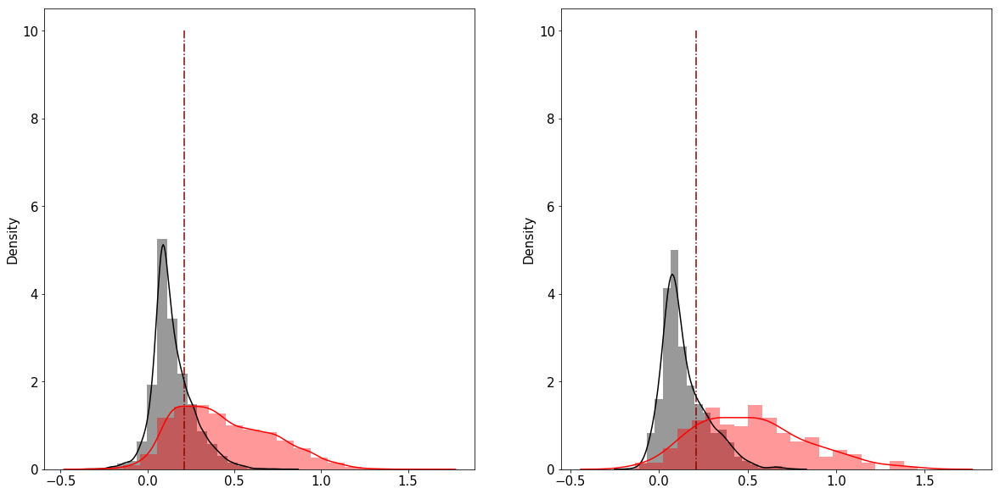

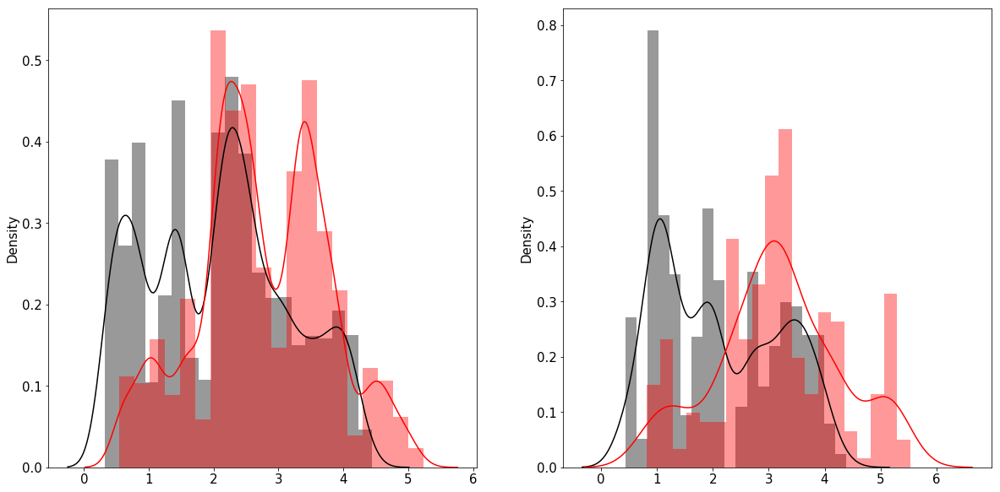

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.34384062539402344
Recall: 0.34384062539402344
Precision: 0.47346970111686704
F1-score: 0.37377645892871786

------------Scores on Test-------------
Accuracy: 0.23176761433868975
Recall: 0.23176761433868975
Precision: 0.34012950148963006
F1-score: 0.2586822191316546

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4854/4854 [00:00<00:00, 9078.00it/s]

------------Scores on Train-------------
Accuracy: 0.8599167822468793
Recall: 0.8599167822468793
Precision: 0.8661062195976874
F1-score: 0.8612409776497904

------------Scores on Test-------------
Accuracy: 0.8971981870622168
Recall: 0.8971981870622168
Precision: 0.9000382309752576
F1-score: 0.8975171162878369

------------Scores on Train-------------
Accuracy: 0.004217791411042945
Recall: 0.004217791411042945
Precision: 0.0003153488905452669
F1-score: 0.0005868231528407575

------------Scores on Test-------------
Accuracy: 0.001607717041800643
Recall: 0.001607717041800643
Precision: 8.700586343862303e-05
F1-score: 0.0001650780891134589




100%|████████████████████████████████████████████████████████████████████████████| 3732/3732 [00:00<00:00, 9123.87it/s]

------------Scores on Train-------------
Accuracy: 0.7870015337423313
Recall: 0.7870015337423313
Precision: 0.7988841001899889
F1-score: 0.7895879308178112

------------Scores on Test-------------
Accuracy: 0.8662915326902465
Recall: 0.8662915326902465
Precision: 0.8697643399032567
F1-score: 0.8662130024110898



 87%|██████████████████████████████████████████████████████████████████▉          | 87/100 [16:01:57<52:11, 240.88s/it]

----------------- iSimul = 87-----------------------

Normal observations in train set 5813
Outlier observations in train set 5813 

Normal observations in test set 2164
Outlier observations in test set 432
-------------------Scores on Train set-------------------
Accuracy :  0.8120
Precision :  0.7971
Recall :  0.8369
F1-score: 0.8165


-------------------Scores on Test set-------------------
Accuracy :  0.7708
Precision :  0.4136
Recall :  0.9028
F1-score: 0.5673




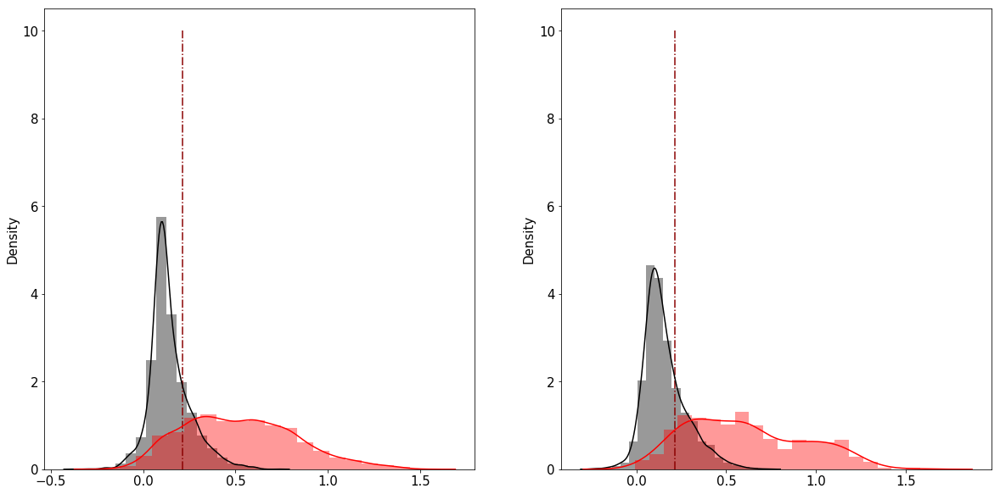

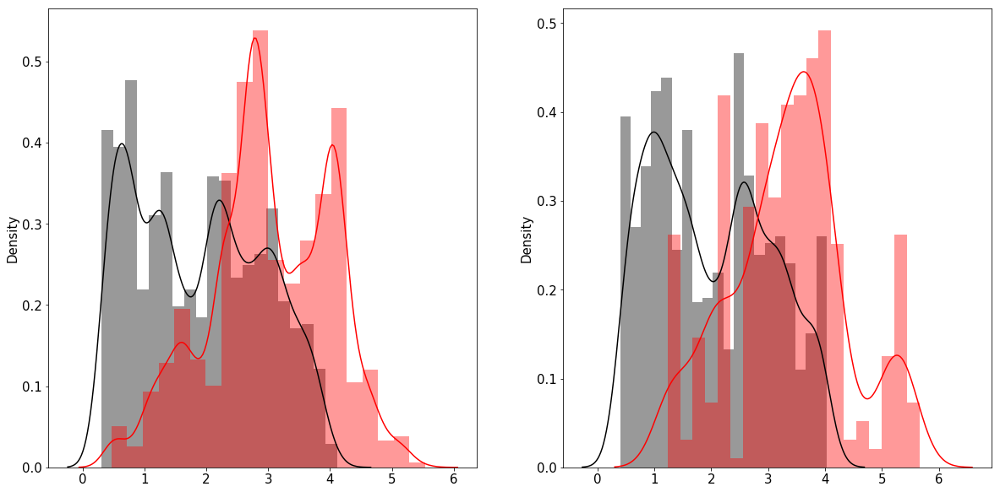

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3214860681114551
Recall: 0.3214860681114551
Precision: 0.40532751588664523
F1-score: 0.3453684747150115

------------Scores on Test-------------
Accuracy: 0.20472837022132798
Recall: 0.20472837022132798
Precision: 0.2830574220151275
F1-score: 0.22324852846080898

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 3976/3976 [00:00<00:00, 11107.30it/s]

------------Scores on Train-------------
Accuracy: 0.8773993808049536
Recall: 0.8773993808049536
Precision: 0.8826859018446293
F1-score: 0.8785623706955435

------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0

------------Scores on Train-------------
Accuracy: 0.003097103297504099
Recall: 0.003097103297504099
Precision: 0.00022161740948150978
F1-score: 0.00041363650050138225

------------Scores on Test-------------
Accuracy: 0.002526847757422615
Recall: 0.002526847757422615
Precision: 0.00014667717853112806
F1-score: 0.0002772601030588406




100%|███████████████████████████████████████████████████████████████████████████| 3166/3166 [00:00<00:00, 10052.53it/s]

------------Scores on Train-------------
Accuracy: 0.8190927309163782
Recall: 0.8190927309163782
Precision: 0.8268241557629229
F1-score: 0.8204387388033781

------------Scores on Test-------------
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1-score: 1.0



 88%|███████████████████████████████████████████████████████████████████▊         | 88/100 [16:06:20<49:29, 247.45s/it]

----------------- iSimul = 88-----------------------

Normal observations in train set 6181
Outlier observations in train set 6181 

Normal observations in test set 1952
Outlier observations in test set 390
-------------------Scores on Train set-------------------
Accuracy :  0.7456
Precision :  0.7512
Recall :  0.7343
F1-score: 0.7427


-------------------Scores on Test set-------------------
Accuracy :  0.7865
Precision :  0.4228
Recall :  0.7718
F1-score: 0.5463




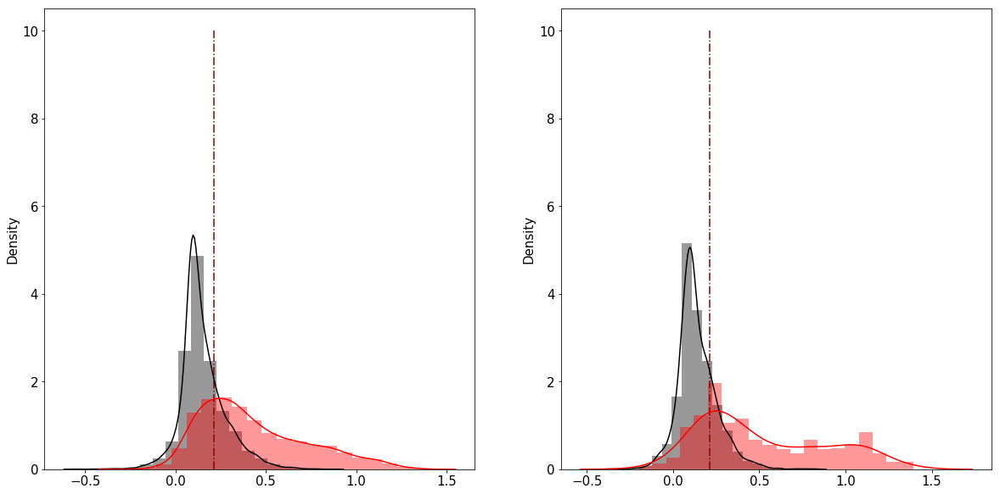

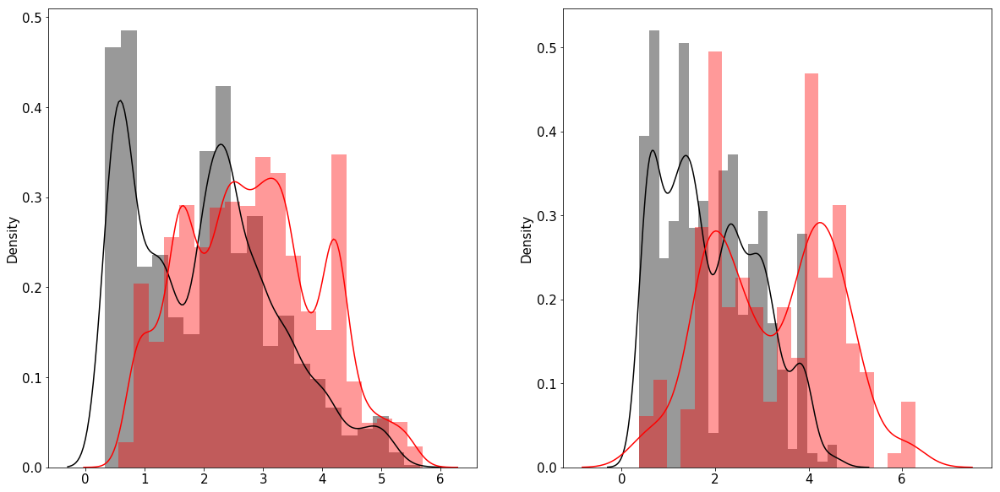

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.25889027258890274
Recall: 0.25889027258890274
Precision: 0.33562194301753834
F1-score: 0.283353520054479

------------Scores on Test-------------
Accuracy: 0.36771728748806115
Recall: 0.36771728748806115
Precision: 0.455292356057577
F1-score: 0.3872420563794747

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4188/4188 [00:00<00:00, 7769.29it/s]

------------Scores on Train-------------
Accuracy: 0.8692403486924035
Recall: 0.8692403486924035
Precision: 0.8737799102284111
F1-score: 0.8701447206951824

------------Scores on Test-------------
Accuracy: 0.8092168099331423
Recall: 0.8092168099331423
Precision: 0.8160712973628029
F1-score: 0.8111519314578811

------------Scores on Train-------------
Accuracy: 0.0022371364653243847
Recall: 0.0022371364653243847
Precision: 0.00012802889409988948
F1-score: 0.00024219711020605873

------------Scores on Test-------------
Accuracy: 0.003769317753486619
Recall: 0.003769317753486619
Precision: 0.00031756156897506314
F1-score: 0.0005857723535823801




100%|████████████████████████████████████████████████████████████████████████████| 2653/2653 [00:00<00:00, 9798.46it/s]

------------Scores on Train-------------
Accuracy: 0.814317673378076
Recall: 0.814317673378076
Precision: 0.8196662591049904
F1-score: 0.8153731670070002

------------Scores on Test-------------
Accuracy: 0.712401055408971
Recall: 0.712401055408971
Precision: 0.7235316325483395
F1-score: 0.7153346371203347



 89%|████████████████████████████████████████████████████████████████████▌        | 89/100 [16:10:44<46:16, 252.39s/it]

----------------- iSimul = 89-----------------------

Normal observations in train set 6120
Outlier observations in train set 6120 

Normal observations in test set 2387
Outlier observations in test set 477
-------------------Scores on Train set-------------------
Accuracy :  0.8248
Precision :  0.8122
Recall :  0.8449
F1-score: 0.8282


-------------------Scores on Test set-------------------
Accuracy :  0.7898
Precision :  0.4326
Recall :  0.8407
F1-score: 0.5712




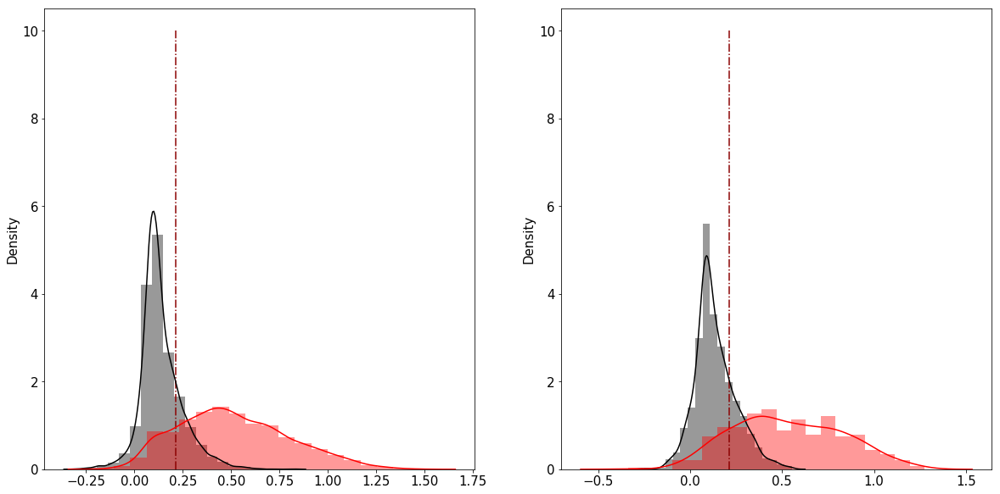

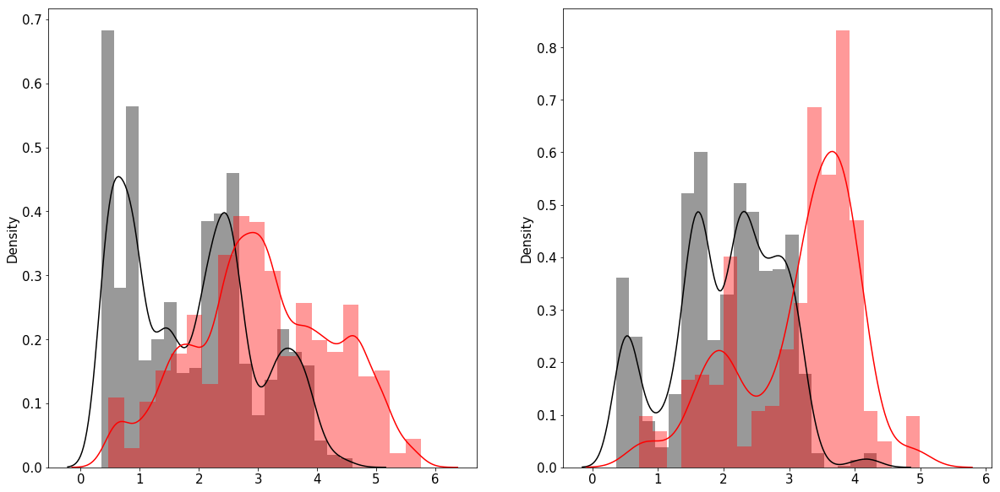

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3385664650624115
Recall: 0.3385664650624115
Precision: 0.4350640378142128
F1-score: 0.36428428769912036

------------Scores on Test-------------
Accuracy: 0.17665867306155075
Recall: 0.17665867306155075
Precision: 0.30559784278115854
F1-score: 0.2002321724097467

---------------Model Prediction-------------------



100%|███████████████████████████████████████████████████████████████████████████| 3753/3753 [00:00<00:00, 10311.72it/s]

------------Scores on Train-------------
Accuracy: 0.8849568910050186
Recall: 0.8849568910050186
Precision: 0.8885141573107105
F1-score: 0.8858281696783942

------------Scores on Test-------------
Accuracy: 0.9339195310418332
Recall: 0.9339195310418332
Precision: 0.9365756870637834
F1-score: 0.9341432251434402

------------Scores on Train-------------
Accuracy: 0.0038842493688094775
Recall: 0.0038842493688094775
Precision: 0.0002913187026607108
F1-score: 0.0005419882840199272

------------Scores on Test-------------
Accuracy: 0.0016175994823681655
Recall: 0.0016175994823681655
Precision: 8.143521421533099e-05
F1-score: 0.00015506400266710084




100%|████████████████████████████████████████████████████████████████████████████| 3091/3091 [00:00<00:00, 8091.31it/s]

------------Scores on Train-------------
Accuracy: 0.8281219654301806
Recall: 0.8281219654301806
Precision: 0.8333031413539056
F1-score: 0.8293182145427828

------------Scores on Test-------------
Accuracy: 0.923325784535749
Recall: 0.923325784535749
Precision: 0.9266331837448372
F1-score: 0.9235202433766814



 90%|█████████████████████████████████████████████████████████████████████▎       | 90/100 [16:15:20<43:16, 259.61s/it]

----------------- iSimul = 90-----------------------

Normal observations in train set 5740
Outlier observations in train set 5740 

Normal observations in test set 1952
Outlier observations in test set 390
-------------------Scores on Train set-------------------
Accuracy :  0.7853
Precision :  0.7944
Recall :  0.7699
F1-score: 0.7819


-------------------Scores on Test set-------------------
Accuracy :  0.7767
Precision :  0.4157
Recall :  0.8410
F1-score: 0.5564




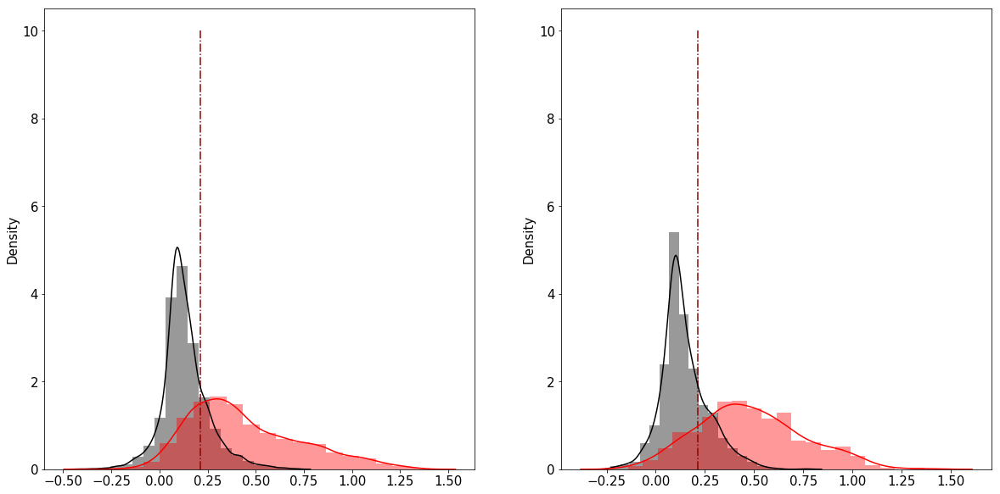

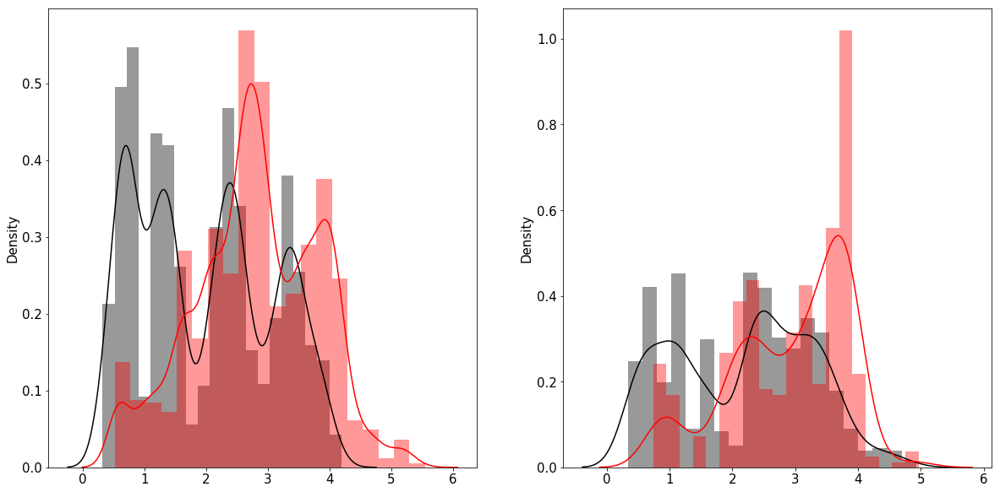

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.25568531038721576
Recall: 0.25568531038721576
Precision: 0.37744943487842236
F1-score: 0.28932706076855286

------------Scores on Test-------------
Accuracy: 0.24737344794651384
Recall: 0.24737344794651384
Precision: 0.3442147216399577
F1-score: 0.27386933441561934

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4188/4188 [00:00<00:00, 8522.68it/s]

------------Scores on Train-------------
Accuracy: 0.8588813767670559
Recall: 0.8588813767670559
Precision: 0.8655169691341784
F1-score: 0.8601974488542597

------------Scores on Test-------------
Accuracy: 0.9145176695319962
Recall: 0.9145176695319962
Precision: 0.9220024710292444
F1-score: 0.9162876014040485

------------Scores on Train-------------
Accuracy: 0.0019792182088075212
Recall: 0.0019792182088075212
Precision: 0.0001044512992469463
F1-score: 0.0001984306173354584

------------Scores on Test-------------
Accuracy: 0.0019011406844106464
Recall: 0.0019011406844106464
Precision: 0.00011085368422219514
F1-score: 0.0002094920864364349




100%|████████████████████████████████████████████████████████████████████████████| 3156/3156 [00:00<00:00, 7452.56it/s]

------------Scores on Train-------------
Accuracy: 0.8113145307603497
Recall: 0.8113145307603497
Precision: 0.8207357127771747
F1-score: 0.8126324865443131

------------Scores on Test-------------
Accuracy: 0.8875158428390367
Recall: 0.8875158428390367
Precision: 0.8998281325607679
F1-score: 0.8902425637374999



 91%|██████████████████████████████████████████████████████████████████████       | 91/100 [16:19:49<39:19, 262.18s/it]

----------------- iSimul = 91-----------------------

Normal observations in train set 5549
Outlier observations in train set 5549 

Normal observations in test set 1982
Outlier observations in test set 396
-------------------Scores on Train set-------------------
Accuracy :  0.8331
Precision :  0.8151
Recall :  0.8618
F1-score: 0.8378


-------------------Scores on Test set-------------------
Accuracy :  0.8385
Precision :  0.5089
Recall :  0.8687
F1-score: 0.6418




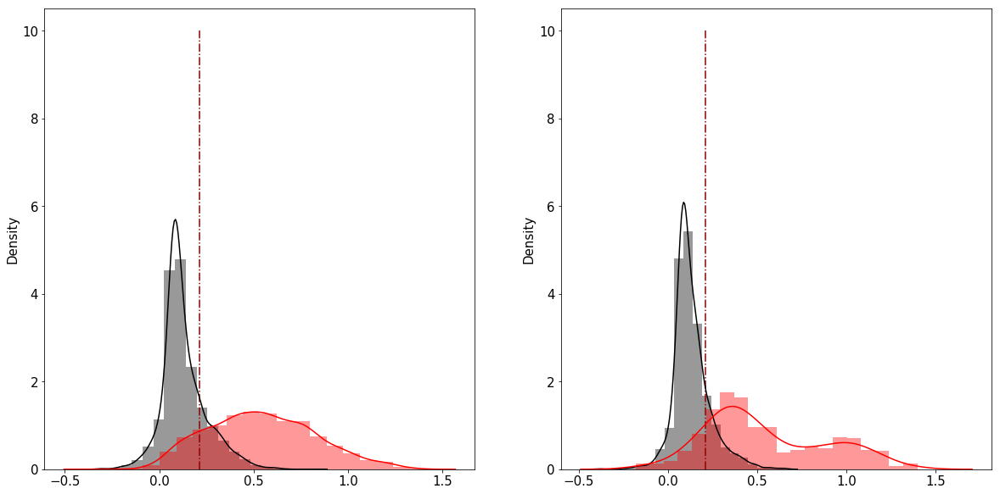

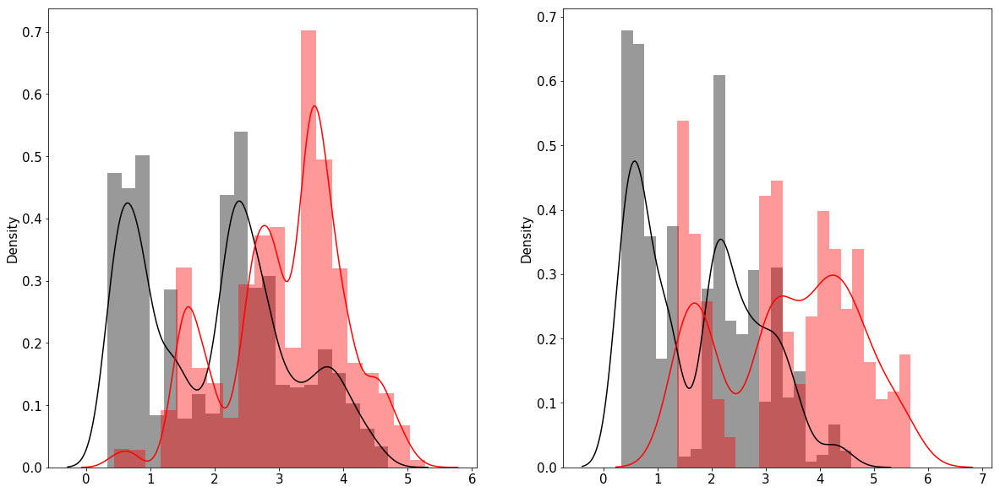

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.4308058058058058
Recall: 0.4308058058058058
Precision: 0.5303571145033394
F1-score: 0.46390161250941164

------------Scores on Test-------------
Accuracy: 0.3061568061568062
Recall: 0.3061568061568062
Precision: 0.5104644527926281
F1-score: 0.3486180828307808

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4158/4158 [00:00<00:00, 6609.90it/s]

------------Scores on Train-------------
Accuracy: 0.9385635635635635
Recall: 0.9385635635635635
Precision: 0.9408301531519725
F1-score: 0.9390154885421552

------------Scores on Test-------------
Accuracy: 0.905964405964406
Recall: 0.905964405964406
Precision: 0.9083421086607519
F1-score: 0.9061978680427003

------------Scores on Train-------------
Accuracy: 0.004169409699363616
Recall: 0.004169409699363616
Precision: 0.00031290129075899563
F1-score: 0.0005821165374329658

------------Scores on Test-------------
Accuracy: 0.0031163434903047093
Recall: 0.0031163434903047093
Precision: 0.0001510954419541677
F1-score: 0.0002882167389877187




100%|████████████████████████████████████████████████████████████████████████████| 2888/2888 [00:00<00:00, 4796.19it/s]

------------Scores on Train-------------
Accuracy: 0.8904981347377661
Recall: 0.8904981347377661
Precision: 0.8973360825505483
F1-score: 0.8919923087436101

------------Scores on Test-------------
Accuracy: 0.8649584487534626
Recall: 0.8649584487534626
Precision: 0.8679651444774875
F1-score: 0.8646316470414042



 92%|██████████████████████████████████████████████████████████████████████▊      | 92/100 [16:24:17<35:11, 263.94s/it]

----------------- iSimul = 92-----------------------

Normal observations in train set 6586
Outlier observations in train set 6586 

Normal observations in test set 1856
Outlier observations in test set 371
-------------------Scores on Train set-------------------
Accuracy :  0.8157
Precision :  0.8469
Recall :  0.7709
F1-score: 0.8071


-------------------Scores on Test set-------------------
Accuracy :  0.7441
Precision :  0.3726
Recall :  0.7844
F1-score: 0.5052




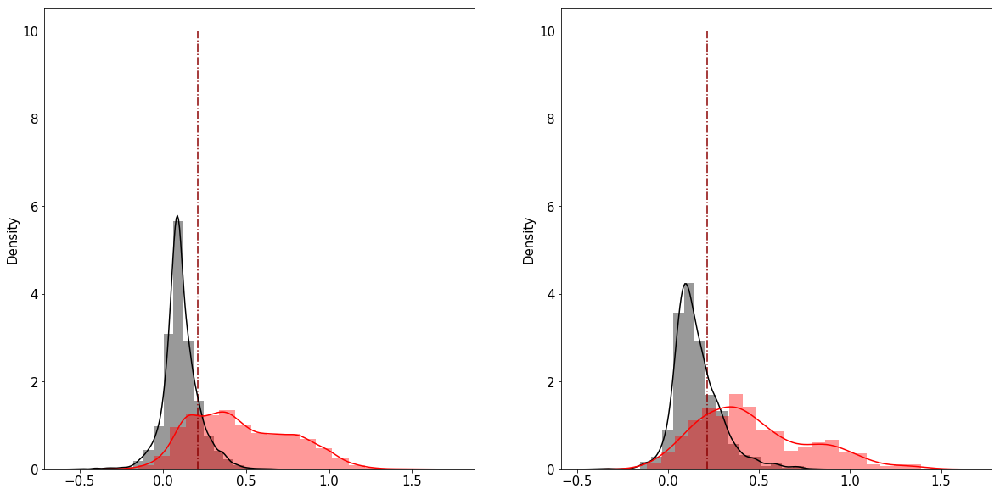

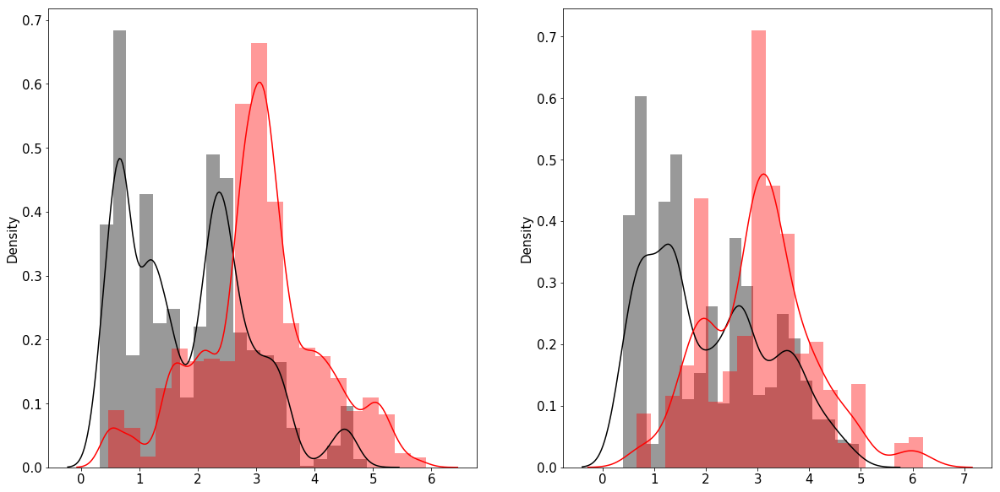

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2967712733856367
Recall: 0.2967712733856367
Precision: 0.3761231106154973
F1-score: 0.31460233251660197

------------Scores on Test-------------
Accuracy: 0.3926237161531279
Recall: 0.3926237161531279
Precision: 0.506276344524533
F1-score: 0.4306199980727612

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4284/4284 [00:00<00:00, 8176.61it/s]

------------Scores on Train-------------
Accuracy: 0.9227519613759807
Recall: 0.9227519613759807
Precision: 0.925590817128174
F1-score: 0.9234836867058009

------------Scores on Test-------------
Accuracy: 0.9068627450980392
Recall: 0.9068627450980392
Precision: 0.910087010260875
F1-score: 0.9075211632333265

------------Scores on Train-------------
Accuracy: 0.0036402569593147753
Recall: 0.0036402569593147753
Precision: 0.000255577813082821
F1-score: 0.00047762236700229317

------------Scores on Test-------------
Accuracy: 0.002687140115163148
Recall: 0.002687140115163148
Precision: 0.00020532964335133686
F1-score: 0.000381507547214521




100%|███████████████████████████████████████████████████████████████████████████| 2605/2605 [00:00<00:00, 10474.02it/s]

------------Scores on Train-------------
Accuracy: 0.8862955032119915
Recall: 0.8862955032119915
Precision: 0.8943476197960334
F1-score: 0.8883734135332574

------------Scores on Test-------------
Accuracy: 0.872552783109405
Recall: 0.872552783109405
Precision: 0.8808770968254099
F1-score: 0.8741265387177511



 93%|███████████████████████████████████████████████████████████████████████▌     | 93/100 [16:28:37<30:39, 262.84s/it]

----------------- iSimul = 93-----------------------

Normal observations in train set 6401
Outlier observations in train set 6401 

Normal observations in test set 2145
Outlier observations in test set 429
-------------------Scores on Train set-------------------
Accuracy :  0.8063
Precision :  0.7812
Recall :  0.8508
F1-score: 0.8145


-------------------Scores on Test set-------------------
Accuracy :  0.8197
Precision :  0.4778
Recall :  0.8765
F1-score: 0.6184




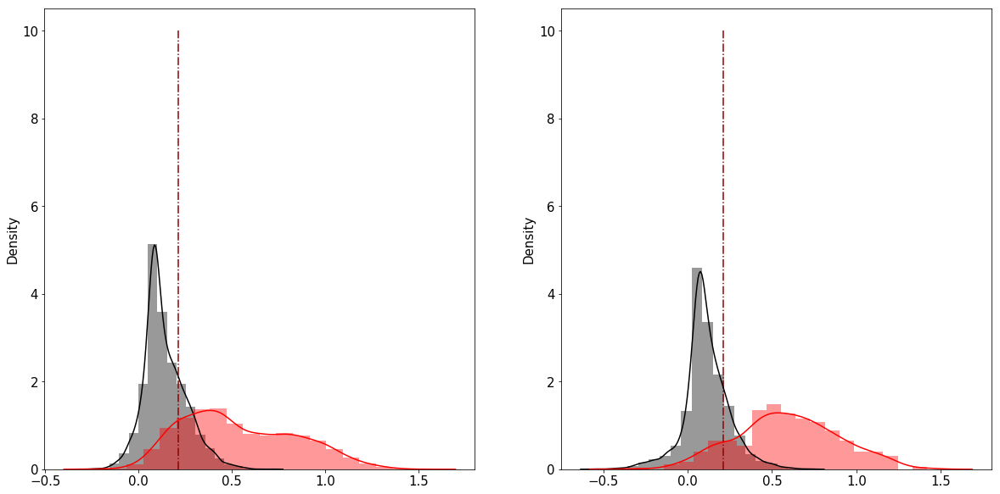

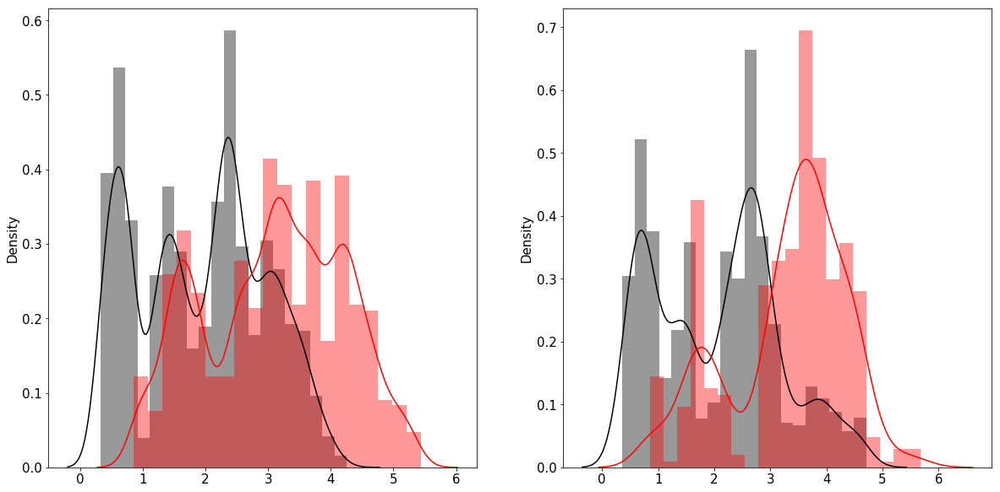

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.2977789256198347
Recall: 0.2977789256198347
Precision: 0.4291632245442084
F1-score: 0.3250477111573451

------------Scores on Test-------------
Accuracy: 0.22202753441802253
Recall: 0.22202753441802253
Precision: 0.2887241904038934
F1-score: 0.2380242913252326

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 3995/3995 [00:00<00:00, 7131.00it/s]

------------Scores on Train-------------
Accuracy: 0.9369834710743802
Recall: 0.9369834710743802
Precision: 0.9397311789157617
F1-score: 0.9376662704687617

------------Scores on Test-------------
Accuracy: 0.9426783479349187
Recall: 0.9426783479349187
Precision: 0.9456910033635987
F1-score: 0.942784435886837

------------Scores on Train-------------
Accuracy: 0.0029379360998898272
Recall: 0.0029379360998898272
Precision: 0.0001864556358420645
F1-score: 0.00035065688934168913

------------Scores on Test-------------
Accuracy: 0.0019280205655526992
Recall: 0.0019280205655526992
Precision: 0.00014551098607944898
F1-score: 0.00027059937762143147




100%|████████████████████████████████████████████████████████████████████████████| 3112/3112 [00:00<00:00, 6343.54it/s]

------------Scores on Train-------------
Accuracy: 0.9124127800220345
Recall: 0.9124127800220345
Precision: 0.9146613983257587
F1-score: 0.9127115061872075

------------Scores on Test-------------
Accuracy: 0.9302699228791774
Recall: 0.9302699228791774
Precision: 0.9348757144593877
F1-score: 0.9305571489050041



 94%|████████████████████████████████████████████████████████████████████████▍    | 94/100 [16:33:08<26:32, 265.36s/it]

----------------- iSimul = 94-----------------------

Normal observations in train set 5723
Outlier observations in train set 5723 

Normal observations in test set 2365
Outlier observations in test set 473
-------------------Scores on Train set-------------------
Accuracy :  0.7929
Precision :  0.8085
Recall :  0.7678
F1-score: 0.7876


-------------------Scores on Test set-------------------
Accuracy :  0.8118
Precision :  0.4607
Recall :  0.7569
F1-score: 0.5728




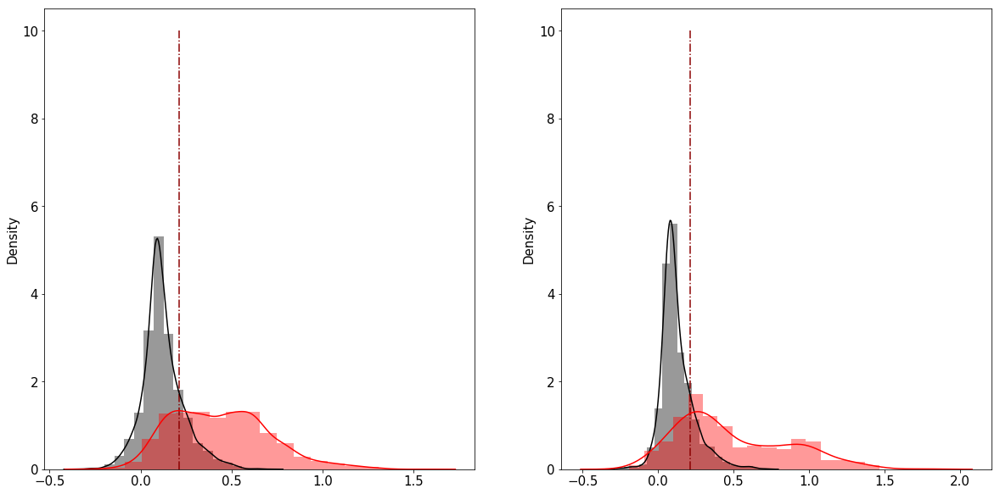

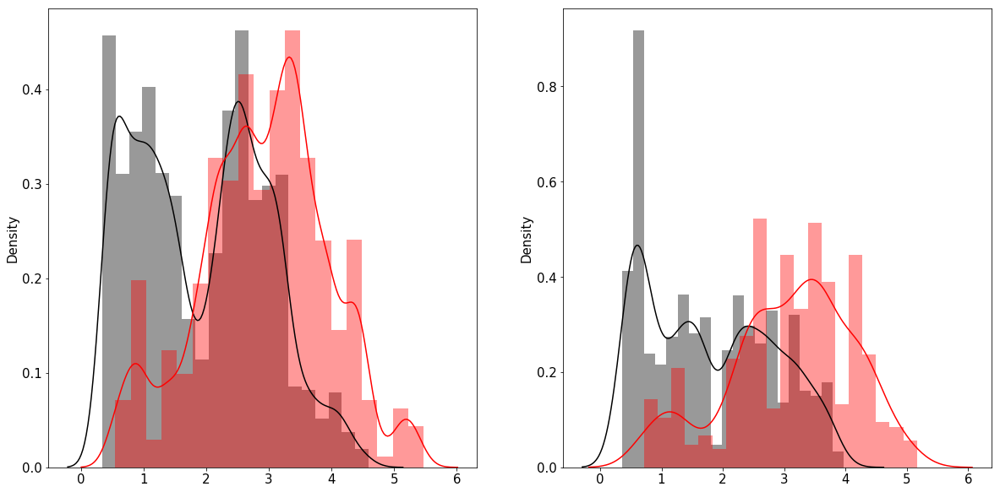

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3275862068965517
Recall: 0.3275862068965517
Precision: 0.43569962765623926
F1-score: 0.35963131279146077

------------Scores on Test-------------
Accuracy: 0.21880794701986755
Recall: 0.21880794701986755
Precision: 0.2881382379050758
F1-score: 0.2295227368823778

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 3775/3775 [00:00<00:00, 8216.88it/s]

------------Scores on Train-------------
Accuracy: 0.8576079093320472
Recall: 0.8576079093320472
Precision: 0.864180181868137
F1-score: 0.859077682932079

------------Scores on Test-------------
Accuracy: 0.9419867549668874
Recall: 0.9419867549668874
Precision: 0.9438765394145697
F1-score: 0.9422910630559977

------------Scores on Train-------------
Accuracy: 0.0026867275658248252
Recall: 0.0026867275658248252
Precision: 0.00016658565193508458
F1-score: 0.0003137196858298449

------------Scores on Test-------------
Accuracy: 0.003049813622500847
Recall: 0.003049813622500847
Precision: 0.00016338287263397395
F1-score: 0.0003101505378814421




100%|████████████████████████████████████████████████████████████████████████████| 2951/2951 [00:00<00:00, 7429.59it/s]

------------Scores on Train-------------
Accuracy: 0.7888232133261688
Recall: 0.7888232133261688
Precision: 0.8032234603418946
F1-score: 0.7919820090247609

------------Scores on Test-------------
Accuracy: 0.9254490003388682
Recall: 0.9254490003388682
Precision: 0.9289110221170259
F1-score: 0.9261375106621114



 95%|█████████████████████████████████████████████████████████████████████████▏   | 95/100 [16:37:32<22:05, 265.02s/it]

----------------- iSimul = 95-----------------------

Normal observations in train set 5470
Outlier observations in train set 5470 

Normal observations in test set 1968
Outlier observations in test set 393
-------------------Scores on Train set-------------------
Accuracy :  0.7511
Precision :  0.7462
Recall :  0.7611
F1-score: 0.7536


-------------------Scores on Test set-------------------
Accuracy :  0.8242
Precision :  0.4829
Recall :  0.7913
F1-score: 0.5998




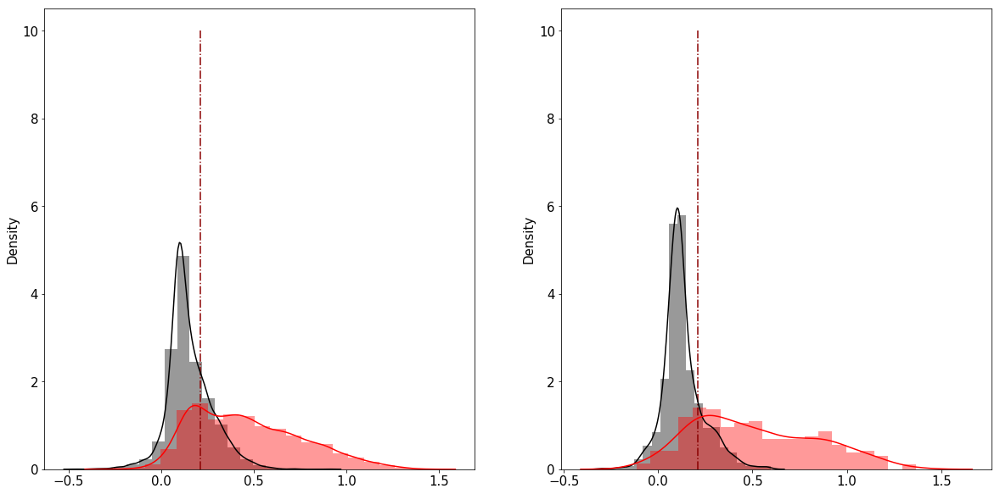

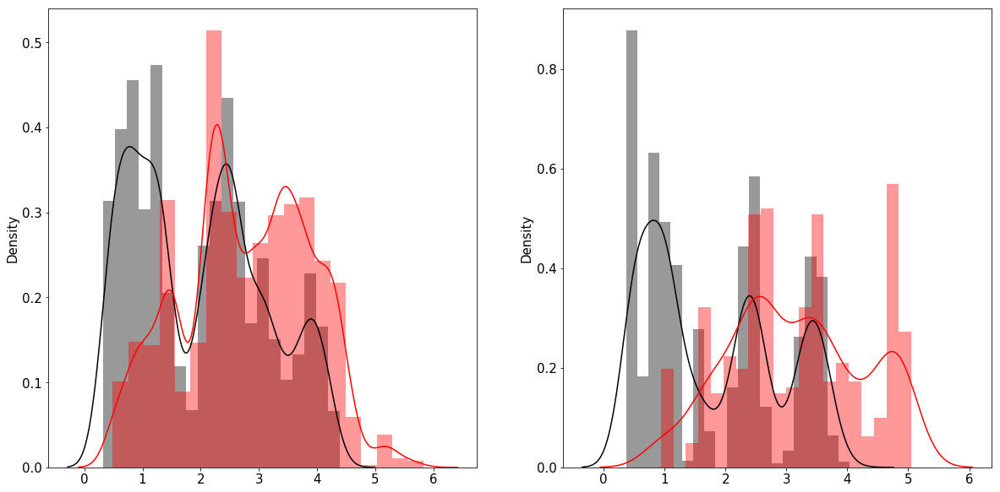

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.27615163147792704
Recall: 0.27615163147792704
Precision: 0.3301007041238714
F1-score: 0.28900885748020194

------------Scores on Test-------------
Accuracy: 0.2550335570469799
Recall: 0.2550335570469799
Precision: 0.3709408937302686
F1-score: 0.28868592263011517

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4172/4172 [00:00<00:00, 7910.10it/s]

------------Scores on Train-------------
Accuracy: 0.8535268714011516
Recall: 0.8535268714011516
Precision: 0.857822044398458
F1-score: 0.8544593958289144

------------Scores on Test-------------
Accuracy: 0.8784755512943433
Recall: 0.8784755512943433
Precision: 0.8801208155296457
F1-score: 0.8772540512898036

------------Scores on Train-------------
Accuracy: 0.0024826216484607746
Recall: 0.0024826216484607746
Precision: 0.00017604044416358216
F1-score: 0.0003287682318844489

------------Scores on Test-------------
Accuracy: 0.001607717041800643
Recall: 0.001607717041800643
Precision: 9.06917305631132e-05
F1-score: 0.0001716979365029813




100%|████████████████████████████████████████████████████████████████████████████| 3110/3110 [00:00<00:00, 6947.44it/s]

------------Scores on Train-------------
Accuracy: 0.8000662032439589
Recall: 0.8000662032439589
Precision: 0.8069653359080537
F1-score: 0.8013357313239463

------------Scores on Test-------------
Accuracy: 0.8369774919614148
Recall: 0.8369774919614148
Precision: 0.8398912722997742
F1-score: 0.8345523746047097



 96%|█████████████████████████████████████████████████████████████████████████▉   | 96/100 [16:41:58<17:40, 265.21s/it]

----------------- iSimul = 96-----------------------

Normal observations in train set 6308
Outlier observations in train set 6308 

Normal observations in test set 1440
Outlier observations in test set 288
-------------------Scores on Train set-------------------
Accuracy :  0.7688
Precision :  0.7779
Recall :  0.7524
F1-score: 0.7649


-------------------Scores on Test set-------------------
Accuracy :  0.7685
Precision :  0.4004
Recall :  0.7812
F1-score: 0.5294




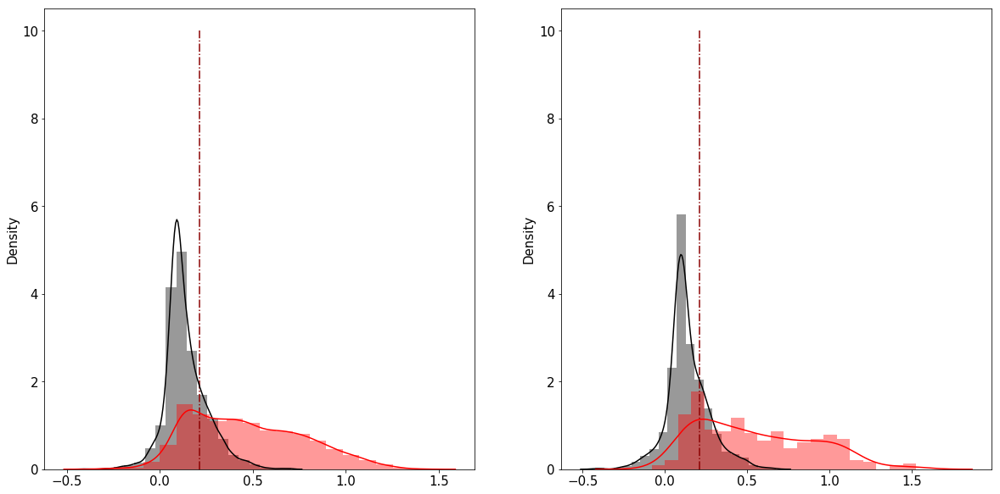

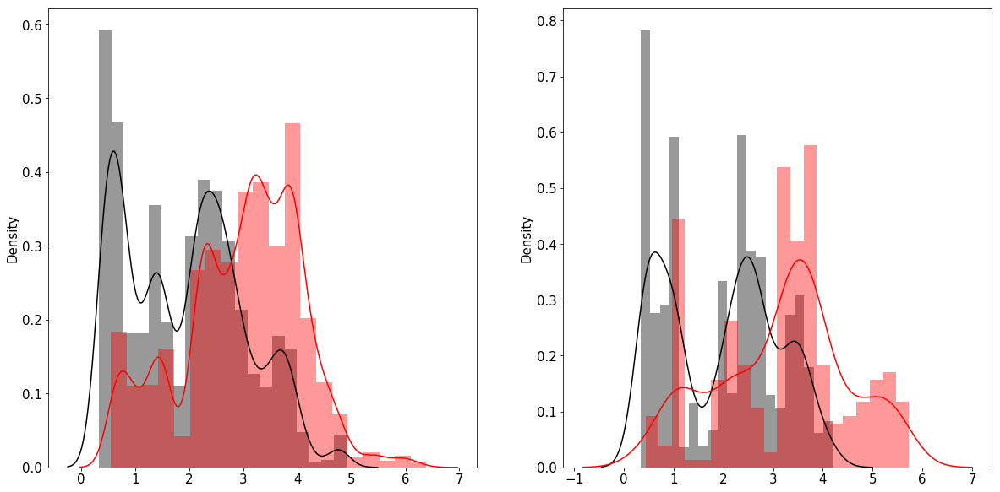

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3318831572405221
Recall: 0.3318831572405221
Precision: 0.3998570887069048
F1-score: 0.3549455886252117

------------Scores on Test-------------
Accuracy: 0.2629787234042553
Recall: 0.2629787234042553
Precision: 0.41995952087071303
F1-score: 0.2920663430086374

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4700/4700 [00:00<00:00, 7483.95it/s]

------------Scores on Train-------------
Accuracy: 0.8246115599751398
Recall: 0.8246115599751398
Precision: 0.8304183828948986
F1-score: 0.8263004887486755

------------Scores on Test-------------
Accuracy: 0.9608510638297872
Recall: 0.9608510638297872
Precision: 0.9623304128013118
F1-score: 0.9612410404139143

------------Scores on Train-------------
Accuracy: 0.002229240200631618
Recall: 0.002229240200631618
Precision: 0.00015074780045254795
F1-score: 0.00028239895055985945

------------Scores on Test-------------
Accuracy: 0.0025951557093425604
Recall: 0.0025951557093425604
Precision: 0.0001645343677392978
F1-score: 0.00030944946127661966




100%|████████████████████████████████████████████████████████████████████████████| 3468/3468 [00:00<00:00, 8328.32it/s]

------------Scores on Train-------------
Accuracy: 0.740665056659855
Recall: 0.740665056659855
Precision: 0.7509030802506034
F1-score: 0.7432129007595

------------Scores on Test-------------
Accuracy: 0.9466551326412919
Recall: 0.9466551326412919
Precision: 0.9484738800391687
F1-score: 0.9470555253653885



 97%|██████████████████████████████████████████████████████████████████████████▋  | 97/100 [16:47:04<13:51, 277.32s/it]

----------------- iSimul = 97-----------------------

Normal observations in train set 5761
Outlier observations in train set 5761 

Normal observations in test set 1838
Outlier observations in test set 367
-------------------Scores on Train set-------------------
Accuracy :  0.8165
Precision :  0.8211
Recall :  0.8094
F1-score: 0.8152


-------------------Scores on Test set-------------------
Accuracy :  0.7855
Precision :  0.4161
Recall :  0.7166
F1-score: 0.5265




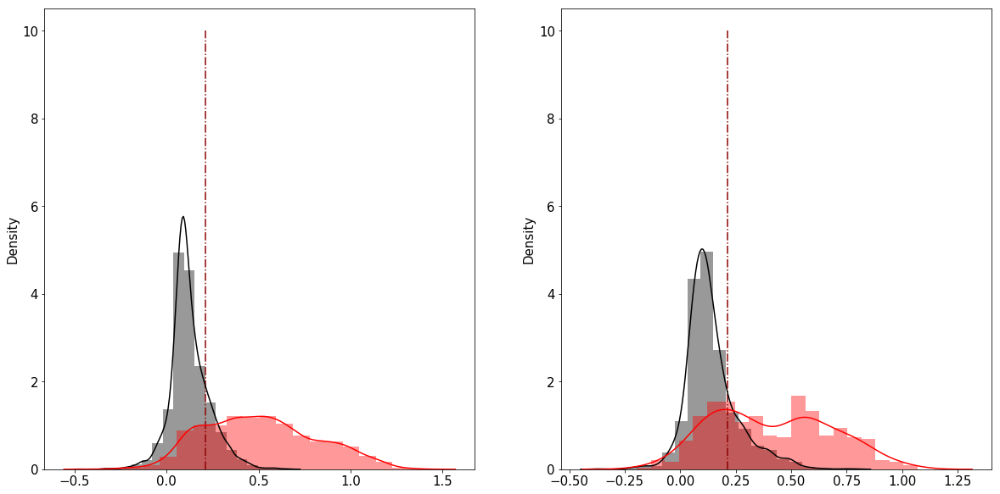

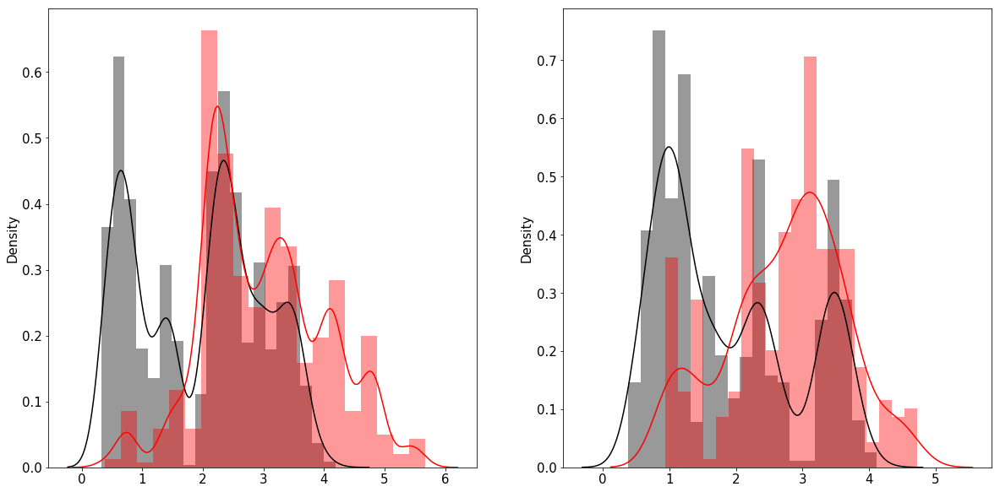

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3898977751052315
Recall: 0.3898977751052315
Precision: 0.5025603583030794
F1-score: 0.42356134751318125

------------Scores on Test-------------
Accuracy: 0.22896327289632729
Recall: 0.22896327289632729
Precision: 0.3192738447754127
F1-score: 0.25337240600622857

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4302/4302 [00:00<00:00, 4804.21it/s]

------------Scores on Train-------------
Accuracy: 0.9034275405892964
Recall: 0.9034275405892964
Precision: 0.9063852317194586
F1-score: 0.9040683844975419

------------Scores on Test-------------
Accuracy: 0.8066015806601581
Recall: 0.8066015806601581
Precision: 0.8239009802015634
F1-score: 0.8112676573818628

------------Scores on Train-------------
Accuracy: 0.003539127015336217
Recall: 0.003539127015336217
Precision: 0.00025011498341598706
F1-score: 0.00046721148717309785

------------Scores on Test-------------
Accuracy: 0.0024110910186859553
Recall: 0.0024110910186859553
Precision: 0.00016605310046046524
F1-score: 0.00031070760550076744




100%|████████████████████████████████████████████████████████████████████████████| 3318/3318 [00:00<00:00, 7312.91it/s]

------------Scores on Train-------------
Accuracy: 0.8495871018482107
Recall: 0.8495871018482107
Precision: 0.8544735836542611
F1-score: 0.8504521580659785

------------Scores on Test-------------
Accuracy: 0.7456298975286317
Recall: 0.7456298975286317
Precision: 0.7652463162467193
F1-score: 0.749954788413315



 98%|███████████████████████████████████████████████████████████████████████████▍ | 98/100 [16:51:19<09:01, 270.87s/it]

----------------- iSimul = 98-----------------------

Normal observations in train set 6300
Outlier observations in train set 6300 

Normal observations in test set 1455
Outlier observations in test set 291
-------------------Scores on Train set-------------------
Accuracy :  0.7983
Precision :  0.7749
Recall :  0.8408
F1-score: 0.8065


-------------------Scores on Test set-------------------
Accuracy :  0.7016
Precision :  0.3258
Recall :  0.7388
F1-score: 0.4522




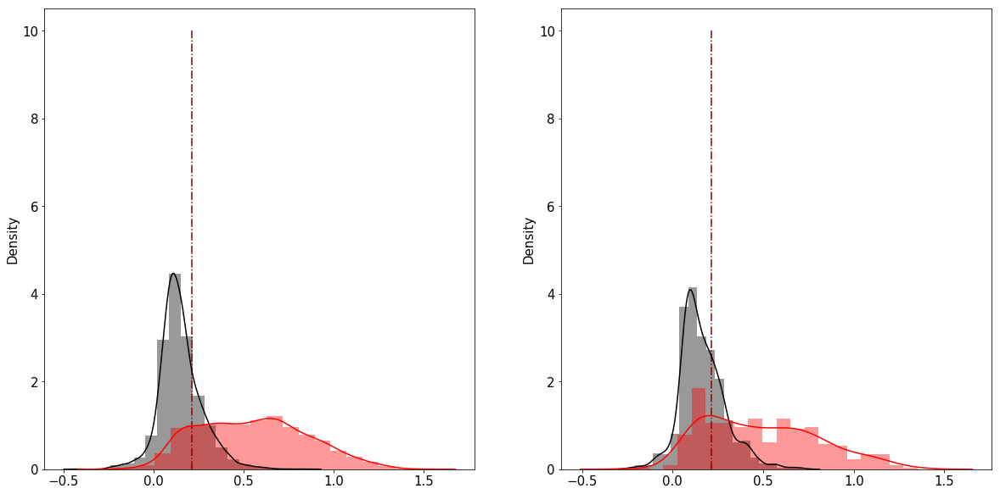

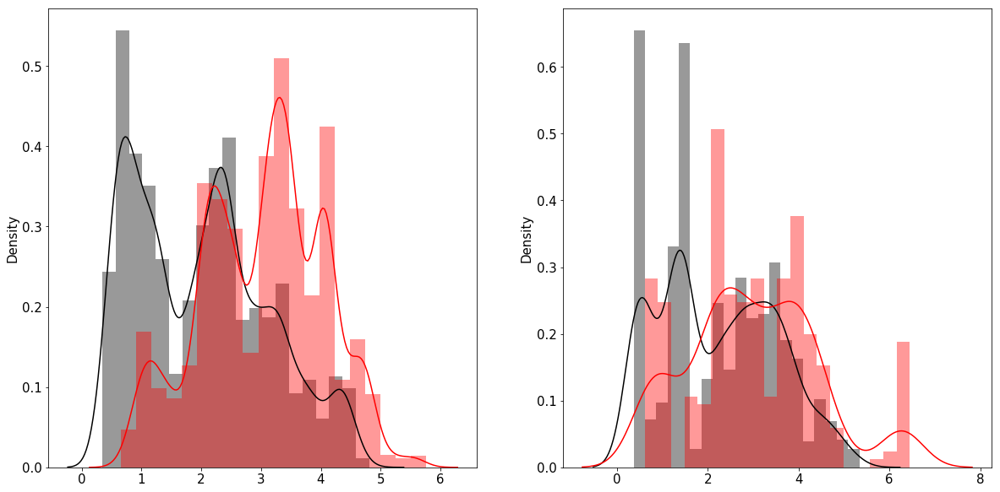

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.3236271772370695
Recall: 0.3236271772370695
Precision: 0.42944191338186144
F1-score: 0.34697435460888265

------------Scores on Test-------------
Accuracy: 0.19871931696905015
Recall: 0.19871931696905015
Precision: 0.2942893231265042
F1-score: 0.21832782631587158

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 4685/4685 [00:00<00:00, 6105.29it/s]

------------Scores on Train-------------
Accuracy: 0.89735407525595
Recall: 0.89735407525595
Precision: 0.900730780687688
F1-score: 0.8981951825881542

------------Scores on Test-------------
Accuracy: 0.9425827107790822
Recall: 0.9425827107790822
Precision: 0.9450685515080356
F1-score: 0.9430272494355878

------------Scores on Train-------------
Accuracy: 0.003923107100823852
Recall: 0.003923107100823852
Precision: 0.0002477047145571375
F1-score: 0.00046598703926318635

------------Scores on Test-------------
Accuracy: 0.0023942537909018356
Recall: 0.0023942537909018356
Precision: 0.00012656848233842303
F1-score: 0.00024042715891901278




100%|████████████████████████████████████████████████████████████████████████████| 3759/3759 [00:00<00:00, 7339.29it/s]

------------Scores on Train-------------
Accuracy: 0.8520988622989407
Recall: 0.8520988622989407
Precision: 0.8596276725018045
F1-score: 0.8541320346480252

------------Scores on Test-------------
Accuracy: 0.9265762170790104
Recall: 0.9265762170790104
Precision: 0.9301810792849019
F1-score: 0.9270521983255835



 99%|████████████████████████████████████████████████████████████████████████████▏| 99/100 [16:55:59<04:33, 273.53s/it]

----------------- iSimul = 99-----------------------

Normal observations in train set 6256
Outlier observations in train set 6256 

Normal observations in test set 2278
Outlier observations in test set 455
-------------------Scores on Train set-------------------
Accuracy :  0.7926
Precision :  0.7886
Recall :  0.7996
F1-score: 0.7940


-------------------Scores on Test set-------------------
Accuracy :  0.8134
Precision :  0.4652
Recall :  0.8088
F1-score: 0.5907




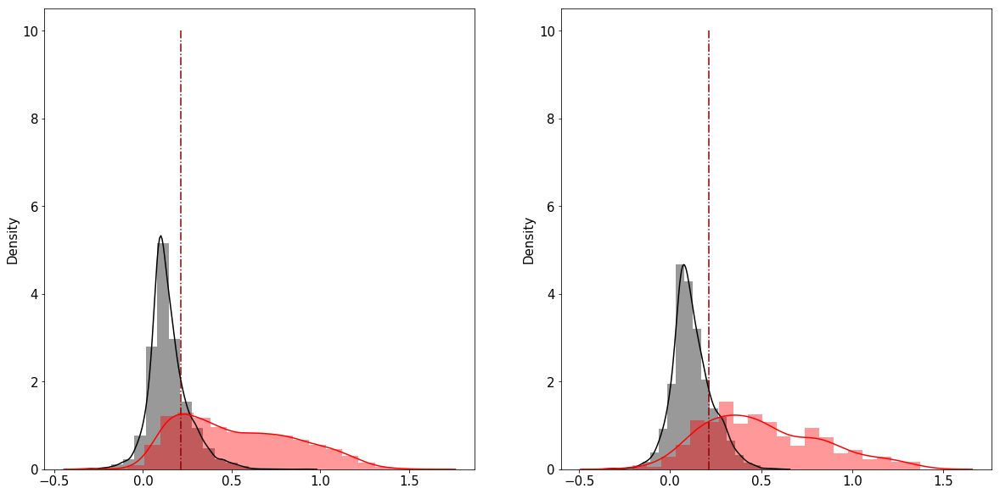

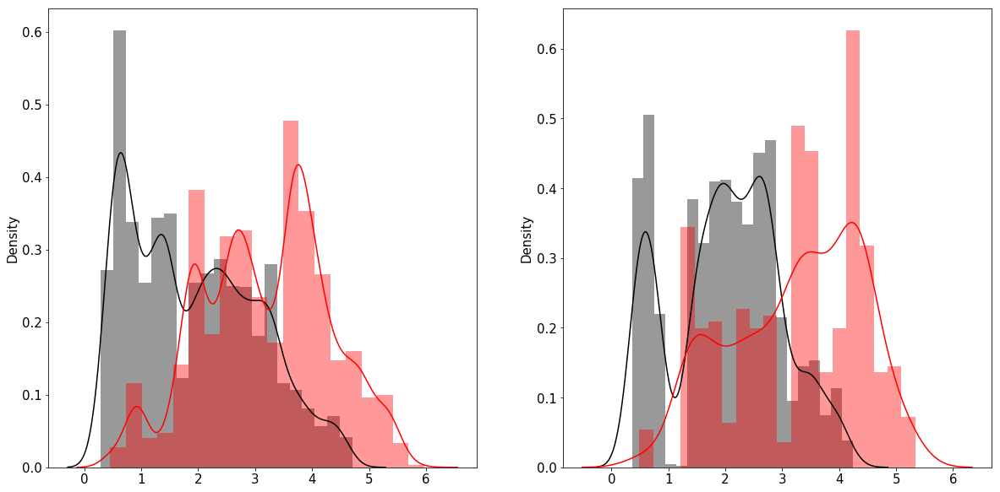

---------------Dummy Prediction---------------
------------Scores on Train-------------
Accuracy: 0.22427642483743465
Recall: 0.22427642483743465
Precision: 0.30824365792577835
F1-score: 0.24423250242777125

------------Scores on Test-------------
Accuracy: 0.2762817193164164
Recall: 0.2762817193164164
Precision: 0.33128745622551914
F1-score: 0.29228224993978513

---------------Model Prediction-------------------



100%|████████████████████████████████████████████████████████████████████████████| 3862/3862 [00:00<00:00, 4153.52it/s]

------------Scores on Train-------------
Accuracy: 0.839219686344511
Recall: 0.839219686344511
Precision: 0.8459130634672459
F1-score: 0.8407948470681927

------------Scores on Test-------------
Accuracy: 0.9368203003625065
Recall: 0.9368203003625065
Precision: 0.9405047950690198
F1-score: 0.9368833490240812

------------Scores on Train-------------
Accuracy: 0.002789171452009844
Recall: 0.002789171452009844
Precision: 0.00014205717954335852
F1-score: 0.0002703452234808596

------------Scores on Test-------------
Accuracy: 0.0032119914346895075
Recall: 0.0032119914346895075
Precision: 0.0002619709326165201
F1-score: 0.00048443149506792563




100%|████████████████████████████████████████████████████████████████████████████| 2802/2802 [00:00<00:00, 7187.49it/s]

------------Scores on Train-------------
Accuracy: 0.7944216570959803
Recall: 0.7944216570959803
Precision: 0.8014398752545835
F1-score: 0.7958771370842804

------------Scores on Test-------------
Accuracy: 0.9154175588865097
Recall: 0.9154175588865097
Precision: 0.9221808290716528
F1-score: 0.9151287212366327



100%|████████████████████████████████████████████████████████████████████████████| 100/100 [17:00:44<00:00, 276.93s/it]


In [30]:

for iSimul in tqdm(range(nSimultation)):
    print(f'----------------- iSimul = {iSimul}-----------------------\n')
        ###################################################################################################
    #
    # ------------------------------------------Data Generation --------------------------------------
    #
    ###################################################################################################

    DataIdentification, DataLocation,DataOriginal = GenerateData(nStocks,S0,mu,sigma,Cov,T,Ntrain,Ntest,iSimul,
                     ContaminationParams, SliddingParams,UnderSampParams)

    XtrainUnderdf,ytrainUnderdf = DataIdentification['Train']
    XtestUnderdf,ytestUnderdf = DataIdentification['Test']

    XTrainLoc,yTrainLoc = DataLocation['Train']
    XTestLoc,yTestLoc = DataLocation['Test']


    X_trainUnder = np.array(XtrainUnderdf.iloc[:,:-3])
    X_testUnder = np.array(XtestUnderdf.iloc[:,:-3])

    y_trainUnder = np.array(ytrainUnderdf['NbAnomaly'])
    y_testUnder = np.array(ytestUnderdf['NbAnomaly'])
    ytrainUnder = np.array([1 if l==1 else 0 for l in y_trainUnder])
    ytestUnder = np.array([1 if l==1 else 0 for l in y_testUnder])

    print(f'Normal observations in train set {list(y_trainUnder).count(0)}')
    print(f'Outlier observations in train set {list(y_trainUnder).count(1)} \n')

    print(f'Normal observations in test set {list(y_testUnder).count(0)}')
    print(f'Outlier observations in test set {list(y_testUnder).count(1)}')
    
    ###################################################################################################
    #
    # ------------------------------------------Classic algos ----------------------------------
    #
    ###################################################################################################
    
    clf_if_train = IsolationForest(random_state=0,contamination=0.5)
    clf_if_test = IsolationForest(random_state=0,contamination=0.16)

    ypredTrainIF = redefine_if_lof_pred(clf_if_train.fit_predict(X_trainUnder))
    ypredTestIF = redefine_if_lof_pred(clf_if_test.fit_predict(X_testUnder))

    scoresTrainIF = evalalg(y_trainUnder,ypredTrainIF)
    scoresTestIF = evalalg(y_testUnder,ypredTestIF)
    
    dfClassic.iloc[counter,0] = 'IF'
    dfClassic.iloc[counter,1:-1] = scoresTrainIF
    dfClassic.iloc[counter,-1] = 'Train'
    counter+=1
    dfClassic.iloc[counter,0] = 'IF'
    dfClassic.iloc[counter,1:-1] = scoresTestIF
    dfClassic.iloc[counter,-1] = 'Test'
    counter+=1

    clf_lof_train = LocalOutlierFactor(n_neighbors=2,novelty= False,contamination=0.5)
    clf_lof_test = LocalOutlierFactor(n_neighbors=2,novelty= False)

    ypredTrainLOF = redefine_if_lof_pred(clf_lof_train.fit_predict(X_trainUnder))
    ypredTestLOF = redefine_if_lof_pred(clf_lof_test.fit_predict(X_testUnder))


    scoresTrainLOF = evalalg(y_trainUnder,ypredTrainLOF)
    scoresTestLOF = evalalg(y_testUnder,ypredTestLOF)

    dfClassic.iloc[counter,0] = 'LOF'
    dfClassic.iloc[counter,1:-1] = scoresTrainLOF
    dfClassic.iloc[counter,-1] = 'Train'
    counter+=1
    dfClassic.iloc[counter,0] = 'LOF'
    dfClassic.iloc[counter,1:-1] = scoresTestLOF
    dfClassic.iloc[counter,-1] = 'Test'
    counter+=1


    clf_knn = KNeighborsClassifier(n_neighbors=3)
    clf_knn.fit(X_trainUnder,y_trainUnder)

    ypredTrainKNN = clf_knn.predict(X_trainUnder)
    ypredTestKNN = clf_knn.predict(X_testUnder)



    scoresTrainKNN = evalalg(y_trainUnder,ypredTrainKNN)
    scoresTestKNN = evalalg(y_testUnder,ypredTestKNN)

    dfClassic.iloc[counter,0] = 'KNN'
    dfClassic.iloc[counter,1:-1] = scoresTrainKNN
    dfClassic.iloc[counter,-1] = 'Train'
    counter+=1
    dfClassic.iloc[counter,0] = 'KNN'
    dfClassic.iloc[counter,1:-1] = scoresTestKNN
    dfClassic.iloc[counter,-1] = 'Test'
    counter+=1


    clf_dbscan_train = DBSCAN(eps = .2, 
     metric='euclidean', 
     min_samples = 2,
     n_jobs = -1).fit_predict(X_trainUnder)

    clf_dbscan_test = DBSCAN(eps = .2, 
     metric='euclidean', 
     min_samples = 2,
     n_jobs = -1).fit_predict(X_testUnder)

    ypredTrainDBSCAN = list(clf_dbscan_train)
    ypredTestDBSCAN = list(clf_dbscan_test)
    ypredTrainDBSCAN  =  redefine_pred_DBSCAN(ypredTrainDBSCAN)
    ypredTestDBSCAN  =  redefine_pred_DBSCAN(ypredTestDBSCAN)

    scoresTrainDBSCAN = evalalg(y_trainUnder,ypredTrainDBSCAN)
    scoresTestDBSCAN = evalalg(y_testUnder,ypredTestDBSCAN)
    
    dfClassic.iloc[counter,0] = 'DBSCAN'
    dfClassic.iloc[counter,1:-1] = scoresTrainDBSCAN
    dfClassic.iloc[counter,-1] = 'Train'
    counter+=1
    dfClassic.iloc[counter,0] = 'DBSCAN'
    dfClassic.iloc[counter,1:-1] = scoresTestDBSCAN
    dfClassic.iloc[counter,-1] = 'Test'
    counter+=1


    clf_svm = svm.SVC()
    clf_svm.fit(X_trainUnder,y_trainUnder)
    ypredTrainSVM = clf_svm.predict(X_trainUnder)
    ypredTestSVM = clf_svm.predict(X_testUnder)

    scoresTrainSVM = evalalg(y_trainUnder,ypredTrainSVM)
    scoresTestSVM = evalalg(y_testUnder,ypredTestSVM)
    
    dfClassic.iloc[counter,0] = 'SVM'
    dfClassic.iloc[counter,1:-1] = scoresTrainSVM 
    dfClassic.iloc[counter,-1] = 'Train'
    counter+=1
    dfClassic.iloc[counter,0] = 'SVM'
    dfClassic.iloc[counter,1:-1] = scoresTestSVM 
    dfClassic.iloc[counter,-1] = 'Test'
    counter+=1
    
    
    

    ###################################################################################################
    #
    # ------------------------------------------Features Extraction ----------------------------------
    #
    ###################################################################################################


        # 1. PCA for features extraction

    model = PCA(n_components=k)
    model.fit(X_trainUnder)
    r_train = model.inverse_transform(model.transform(X_trainUnder))
    r_test = model.inverse_transform(model.transform(X_testUnder))

        # 1. Data Preparation for NN 

    reconsRawTrain = r_train
    reconsRawTest = r_test


    reconsRawTrain = torch.tensor(reconsRawTrain)
    ytrain = torch.tensor(ytrainUnder.reshape(-1,1))


    reconsRawTest = torch.tensor(reconsRawTest)
    ytest = torch.tensor(ytestUnder.reshape(-1,1))
    xtrain = np.array(X_trainUnder,dtype=float)
    ytrain = np.array(y_trainUnder,dtype=float)

    xtest = np.array(X_testUnder,dtype=float)
    ytest = np.array(y_testUnder,dtype=float)

    xtrain = torch.tensor(xtrain)
    ytrain = torch.tensor(ytrain.reshape(-1,1))


    xtest = torch.tensor(xtest)
    ytest = torch.tensor(ytest.reshape(-1,1))

    ErrRawTrain = xtrain - reconsRawTrain
    ErrRawTrain = torch.tensor(ErrRawTrain)

    ErrRawTest = xtest - reconsRawTest
    ErrRawTest = torch.tensor(ErrRawTest)


    STrain,scoresTrain  = evalPerf(netLoaded,ErrRawTrain,ytrain,'Train',CalibParamsLoaded)
    STest,scoresTest  = evalPerf(netLoaded,ErrRawTest,ytest,'Test',CalibParamsLoaded)

    ResTableIdentification.iloc[iSimul,:] = np.concatenate([scoresTrain,scoresTest])
    plt.subplot(1,2,1)
    plotDistAnoScores(STrain,ytrain,CalibParamsLoaded['That'],True)
    plt.subplot(1,2,2)
    plotDistAnoScores(STest,ytest,CalibParamsLoaded['That'],True)
    plt.show()

    plt.subplot(1,2,1)
    plotDistAnoScores(npl.norm(ErrRawTrain,axis=1).reshape(-1,1),ytrain,CalibParamsLoaded['That'])

    plt.subplot(1,2,2)
    plotDistAnoScores(npl.norm(ErrRawTest,axis=1).reshape(-1,1),ytest,CalibParamsLoaded['That'])
    plt.show()

    
    ###################################################################################################
    #
    # ------------------------------------------Location Evaluation  ----------------------------------
    #
    ###################################################################################################
    

    # 1. On all type of anomalies 
    X_traindf, y_traindf = DataLocation['Train']
    X_testdf, y_testdf = DataLocation['Test']
    Xtrain,ytrain_loc,Xtest, ytest_loc = ProcessingData(DataLocation)
    ###################################################################################################
    #
    # ------------------------------------------Classic Algos  ----------------------------------
    #
    ###################################################################################################
    
    Xtrain = np.array(X_traindf.iloc[:,:-3])
    Xtest = np.array(X_testdf.iloc[:,:-3])
    ytrain = np.array(y_traindf.iloc[:,:-3])
    ytest = np.array(y_testdf.iloc[:,:-3])

    n = int(Xtrain.shape[0]*206)
    xtrain_flat = Xtrain.reshape(Xtrain.shape[0]*Xtrain.shape[1],1)[:n,0].reshape(-1,1)
    ytrain_flat = ytrain.reshape(ytrain.shape[0]*ytrain.shape[1],1)[:n,0].reshape(-1,1)
    xtest_flat = Xtest.reshape(Xtest.shape[0]*Xtest.shape[1],1)[:].reshape(-1,1)
    ytest_flat = ytest.reshape(ytest.shape[0]*ytest.shape[1],1)[:].reshape(-1,1)
    
    clf_if = IsolationForest(random_state=0).fit(xtrain_flat)
    ypredTrainIF = redefine_if_lof_pred(clf_if.predict(xtrain_flat))
    ypredTestIF = redefine_if_lof_pred(clf_if.predict(xtest_flat))

    ScoresLocIFTrain = evalalg(ytrain_flat,ypredTrainIF)
    ScoresLocIFTest = evalalg(ytest_flat,ypredTestIF)
    
    dfClassicLoc.iloc[counterLoc,0] = 'IF'
    dfClassicLoc.iloc[counterLoc,1:-1] = ScoresLocIFTrain
    dfClassicLoc.iloc[counterLoc,-1] = 'Train'
    counterLoc+=1
    dfClassicLoc.iloc[counterLoc,0] = 'IF'
    dfClassicLoc.iloc[counterLoc,1:-1] = ScoresLocIFTest
    dfClassicLoc.iloc[counterLoc,-1] = 'Test'
    counterLoc+=1


    clf_lof = LocalOutlierFactor(n_neighbors=2,novelty= True)
    clf_lof.fit(xtrain_flat)


    ypredTrainLOF = redefine_if_lof_pred(clf_lof.predict(xtrain_flat))
    ypredTestLOF = redefine_if_lof_pred(clf_lof.predict(xtest_flat))

    ScoresLocLOFTrain = evalalg(ytrain_flat,ypredTrainLOF)
    ScoresLocLOFTest = evalalg(ytest_flat,ypredTestLOF)

    dfClassicLoc.iloc[counterLoc,0] = 'LOF'
    dfClassicLoc.iloc[counterLoc,1:-1] = ScoresLocLOFTrain
    dfClassicLoc.iloc[counterLoc,-1] = 'Train'
    counterLoc+=1
    dfClassicLoc.iloc[counterLoc,0] = 'LOF'
    dfClassicLoc.iloc[counterLoc,1:-1] = ScoresLocLOFTest
    dfClassicLoc.iloc[counterLoc,-1] = 'Test'
    counterLoc+=1
    
    
    clf_knn = KNeighborsClassifier(n_neighbors=3)
    clf_knn.fit(xtrain_flat,ytrain_flat)
    ypredTrainKNN = clf_knn.predict(xtrain_flat)
    ypredTestKNN = clf_knn.predict(xtest_flat)

    ScoresLocKNNTrain = evalalg(ytrain_flat,ypredTrainKNN)
    ScoresLocKNNTest = evalalg(ytest_flat,ypredTestKNN)

    dfClassicLoc.iloc[counterLoc,0] = 'KNN'
    dfClassicLoc.iloc[counterLoc,1:-1] = ScoresLocKNNTrain
    dfClassicLoc.iloc[counterLoc,-1] = 'Train'
    counterLoc+=1
    dfClassicLoc.iloc[counterLoc,0] = 'KNN'
    dfClassicLoc.iloc[counterLoc,1:-1] = ScoresLocKNNTest
    dfClassicLoc.iloc[counterLoc,-1] = 'Test'
    counterLoc+=1
    
    ###################################################################################################
    #
    # ------------------------------------------New Algos  ----------------------------------
    #
    ###################################################################################################

            # 1.1 Dummy Prediction 


    print('---------------Dummy Prediction---------------')
    pred_loc_dummy_train_ = dummyprediction(Xtrain)
    ScoresTrain = EvaluationPred(pred_loc_dummy_train_,ytrain_loc)

    printRes(ScoresTrain,'Train')

    pred_loc_dummy_test_ = dummyprediction(Xtest)
    ScoresTest = EvaluationPred(pred_loc_dummy_test_,ytest_loc)
    printRes(ScoresTest,'Test')

    ResTableLocationDummy['All Anomaly'].iloc[iSimul,:]  = np.concatenate([ScoresTrain,ScoresTest])

            # 1.2 Model Prediction 

    print('---------------Model Prediction-------------------')

    norms_train, norms_test =  modelPCALocation(Xtrain,Xtest,k)

    pred_loc_train = dummyprediction(norms_train)
    ScoresTrainPCA = EvaluationPred(yPred = pred_loc_train,yTrue=ytrain_loc)
    printRes(ScoresTrainPCA,'Train')

    pred_loc_test = dummyprediction(norms_test)
    ScoresTestPCA = EvaluationPred(yPred = pred_loc_test,yTrue=ytest_loc)


    printRes(ScoresTestPCA,'Test')

    ResTableLocation['All Anomaly'].iloc[iSimul,:]  = np.concatenate([ScoresTrainPCA,ScoresTestPCA])


        #2. On NE anomalies 
    XtrainNE, ytrain_locNE = ProcessingNotExtremum(X_traindf,y_traindf,ytrain_loc)
    XtestNE, ytest_locNE = ProcessingNotExtremum(X_testdf,y_testdf,ytest_loc)

            ## 2.1 Dummy Prediction meant to be equal to 0 

    pred_loc_dummy_train_NE = dummyprediction(XtrainNE)
    ScoresTrain = EvaluationPred(pred_loc_dummy_train_NE,ytrain_locNE)
    printRes(ScoresTrain,'Train')

    pred_loc_dummy_test_NE = dummyprediction(XtestNE)


    ScoresTest = EvaluationPred(pred_loc_dummy_test_NE,ytest_locNE)
    printRes(ScoresTest,'Test')


    ResTableLocationDummy['Anomaly NE'].iloc[iSimul,:]  = np.concatenate([ScoresTrain,ScoresTest])

             ## 2.2 Model Prediction 

    norms_train, norms_test =  modelPCALocation(XtrainNE,XtestNE,k)

    pred_loc_train = dummyprediction(norms_train)
    ScoresTrainPCA = EvaluationPred(yPred = pred_loc_train,yTrue=ytrain_locNE)

    pred_loc_test = dummyprediction(norms_test)
    ScoresTestPCA = EvaluationPred(yPred = pred_loc_test,yTrue=ytest_locNE)


    printRes(ScoresTrainPCA,'Train')
    printRes(ScoresTestPCA,'Test')

    ResTableLocation['Anomaly NE'].iloc[iSimul,:]  = np.concatenate([ScoresTrainPCA,ScoresTestPCA])






    
    
    
    



In [31]:
ResTableIdentification.to_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\StabilityTables\StabilityCheckResIdentificationModel.csv')
dfClassic.to_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\StabilityTables\dfClassic.csv')
dfClassicLoc.to_csv(r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\StabilityTables\dfClassicLoc.csv')



In [ ]:
path = r'C:\Users\nmadhar\Desktop\Conv_deep\Code\PCA-AD\FinalCodePaper\StabilityRes'
name = '\ResTableLocationDummyModel3105_all.pkl'

f = open(path+name,"wb")

pickle.dump(ResTableLocationDummy,f)
f.close()


name = '\ResTableLocationModel3105_all.pkl'

f = open(path+name,"wb")

pickle.dump(ResTableLocation,f)
f.close()

In [32]:
path = r'C:\Users\nmadhar\Desktop\Conv_deep\ToSubmit\Results\StabilityTables'
name = '\ResTableLocationDummyModel_all.pkl'

f = open(path+name,"wb")

pickle.dump(ResTableLocationDummy,f)
f.close()


name = '\ResTableLocationModel_all.pkl'

f = open(path+name,"wb")

pickle.dump(ResTableLocation,f)
f.close()